In [3]:
from __future__ import division, print_function, absolute_import
from scipy.io import loadmat 
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pickle
from matplotlib.backends.backend_pdf import PdfPages

In [4]:
import sys
def printf(format, *args):
    sys.stdout.write(format % args)

In [5]:
def data_split (tdata):
    #tdata = tdata.transpose()
    td1, td2, td3, td4, td5, td6, td7, td8, td9, td10 = np.array_split(tdata, 10)
    
    tdata = np.concatenate((td1, td2, td3, td4, td5, td6, td7, td8), axis = 0)
    test_data = np.concatenate((td9, td10), axis = 0)
    
    #tdata = tdata.transpose()
    #test_data = test_data.transpose()
    
    
    return tdata, test_data

In [6]:
def plot_hidden_weights(model_name):
    sess            = tf.Session()
    saver           = tf.train.Saver()
    saver.restore(sess,model_name)

    X               = final_W

    nHid            = X.shape[1]            # get the number of hidden units
    imSz            = int(np.sqrt(X.shape[0]))   # size of each image patch
    plotGap2        = 1                     # half the gap to leave between each image patch
    imSzPlot        = int(imSz + 2*plotGap2)    

    layoutSqDim     = int(np.ceil(np.sqrt(nHid)))  # find dimensions for layout
    arrayImage      = np.zeros((layoutSqDim*imSzPlot,layoutSqDim*imSzPlot))

    k = 0
    for i in range(layoutSqDim):
        for j in range(layoutSqDim):
            if k < nHid:    
                littleImPlot = np.zeros((imSzPlot,imSzPlot))
                littleImPlot[(plotGap2):(imSzPlot-plotGap2),(plotGap2):(imSzPlot-plotGap2)] = np.reshape(X[:,k],(imSz,imSz)) 
                arrayImage[ (i*imSzPlot ):((i+1)*imSzPlot) , (j*imSzPlot ):((j+1)*imSzPlot) ] = littleImPlot;
                k = k + 1


    plt.imshow(arrayImage,  cmap='Greys')
    plt.show()

    sess.close()

In [16]:
def sparseLinAutoEncoder(wscale, learn_rate, num_steps, beta, counter, trainDir):   
    # simulation meta-parameters
    wscale          = wscale;  # scale of the small random weights for model initialization
    beta            = beta;  # hyper-parameter which determines penality size
    learn_rate      = learn_rate;
    batch_size      = 1000;
    nBat            = 5000;
    num_steps       = num_steps;
    display_step    = 100
    examples_to_show    = 5

  

    ###############################################################################
    # This section loads the training dataset
    ###############################################################################
    trainDir            = trainDir
    TrainingDataFiles   = []

    for r, d, f in os.walk(trainDir):
        for file in f:
            TrainingDataFiles.append(os.path.join(r,file))

    # load files and put them into a matrix
    tdata = loadmat(TrainingDataFiles[0])['X']          
    for i in range(1,len(TrainingDataFiles)):            
        td      = loadmat(TrainingDataFiles[i])['X']
        tdata   = np.concatenate((tdata,td), axis = 1)

    # put observations in rows
    tdata       = tdata.transpose()

    ###############################################################################
    # Splits Data into training (80%) and testing (20%)
    ###############################################################################
    tdata, test_data = data_split(tdata)


    ###############################################################################
    # Define neural network graph
    ###############################################################################
    num_input   = tdata.shape[1]
    num_train   = tdata.shape[0]
    pixel_size  = int(np.sqrt(float(num_input)))

    # compressive auto-encoder reduces dimensionality
    # num_hidden  = round(num_input/2)
    # sparse auto-encoder keeps dimensionality same or larger
    num_hidden = num_input 

    # this placeholder will hold the training batch
    X = tf.placeholder("float", [None, num_input])


    ## These are a hash map to variables that are used as the weights and biases in 
    ## the neural network layers. Note that the layers have differnet number of filters
    ## and that the input passes through these layers and take the shape of the layers.
    ## It helps to think of a network as a pipline.
    weights = {
        'encoder_h1': tf.Variable(tf.random_normal([num_input, num_hidden],mean=0.0, stddev=wscale)),
       # 'decoder_h1': tf.Variable(tf.random_normal([num_hidden, num_input],mean=0.0, stddev=wscale))
    }

    ## Building the encoder This layer has two layers that are concatinated into a 
    ## a single layer. This layer should reduce the input vector to a matrix of diffrent
    ## deminsions.
    def encoder(x):
        # Encoder Hidden layer with sigmoid activation #1
        layer_1 = tf.matmul(x, weights['encoder_h1'])
        return layer_1

    ## Building the decoder This is simular to the process that is happening in the
    ## encoder code but this layer further reduces the demensionality.
    def decoder(x):
        # Decoder Hidden layer with sigmoid activation #1
        # layer_1 = tf.matmul(x, weights['decoder_h1'])
        layer_1 =  tf.matmul(x, tf.transpose(weights['encoder_h1']))
        return layer_1

    ## Construct model by forming the encoded input and the decoded encoder
    encoder_op = encoder(X)
    decoder_op = decoder(encoder_op)

    ## Prediction 
    y_pred = decoder_op
    # Targets (Labels) are the input data.
    y_true = X

    ## Define loss and optimizer, minimize the squared error


    errorterm   = tf.reduce_mean(tf.pow(y_true - y_pred, 2))
    sparseterm  = tf.reduce_mean(tf.abs(encoder_op))

    loss        = errorterm + beta*sparseterm 

    ## Note this is not the only optimizer and infact we should look into which one we
    ## should use for our project!!!!! ADAMOptimizer is a well known and utilize option. 
    optimizer = tf.train.AdamOptimizer(learn_rate).minimize(loss)
    #optimizer = tf.train.GradientDescentOptimizer(learning_rate).minimize(loss)
    #
    ## Initialize the variables (i.e. assign their default value)
    init    = tf.global_variables_initializer()
    saver   = tf.train.Saver()

    ###############################################################################
    # Start Training
    ###############################################################################

    # Start a new TF session
    with tf.Session() as sess:

        # Run the initializer
        sess.run(init)

        # Training
        for i in range(1, num_steps+1):
            # Prepare Data
            temp    = np.random.permutation(num_train)
            bat_ind = temp[0:batch_size]
            batch_x = tdata[bat_ind,:]


            # Run optimization op (backprop) and cost op (to get loss value)
            _, l , e, s = sess.run([optimizer, loss, errorterm, sparseterm], feed_dict={X: batch_x})
            # Display logs per step
            if i % display_step == 0 or i == 1:
                print('Step %i: Minibatch Loss: %f Error: %f Sparse: %f' % (i, l, e, s))


        final_W = weights['encoder_h1'].eval()

        # Testing
        # Encode and decode images from test set and visualize their reconstruction.
        n = examples_to_show
        k1 = 1
        k2 = 1
        canvas_orig = np.empty((pixel_size * n, pixel_size * n))
        canvas_recon = np.empty((pixel_size * n, pixel_size * n))
        for i in range(n):

            g = sess.run(decoder_op, feed_dict={X: batch_x})
            # Display original images
            for j in range(n):
                # Draw the original digits
                canvas_orig[i * pixel_size:(i + 1) * pixel_size, j * pixel_size:(j + 1) * pixel_size] = \
                    batch_x[k1].reshape([pixel_size, pixel_size])
                k1 = k1 + 1
            # Display reconstructed images
            for j in range(n):
                # Draw the reconstructed digits
                canvas_recon[i * pixel_size:(i + 1) * pixel_size, j * pixel_size:(j + 1) * pixel_size] = \
                    g[k2].reshape([pixel_size, pixel_size])
                k2 = k2 + 1

        #print("Original Images")
        #plt.figure(figsize=(n, n))
        #plt.imshow(canvas_orig, origin="upper", cmap="gray")
        #plt.show()

        #print("Reconstructed Images")
        #plt.figure(figsize=(n, n))
        #plt.imshow(canvas_recon, origin="upper", cmap="gray")
        #plt.show()
        #print(canvas_orig)
        
        
        save_path = saver.save(sess,"./epochCkpt/sparseLinTrainMiniBatFinal" + str(counter) + ".ckpt")
        

    
    Z = final_W
    nHid            = Z.shape[1]            # get the number of hidden units
    imSz            = int(np.sqrt(Z.shape[0]))   # size of each image patch
    plotGap2        = 1                     # half the gap to leave between each image patch
    imSzPlot        = int(imSz + 2*plotGap2)    

    layoutSqDim     = int(np.ceil(np.sqrt(nHid)))  # find dimensions for layout
    arrayImage      = np.zeros((layoutSqDim*imSzPlot,layoutSqDim*imSzPlot))

    k = 0
    for i in range(layoutSqDim):
        for j in range(layoutSqDim):
            if k < nHid:    
                littleImPlot = np.zeros((imSzPlot,imSzPlot))
                littleImPlot[(plotGap2):(imSzPlot-plotGap2),(plotGap2):(imSzPlot-plotGap2)] = np.reshape(Z[:,k],(imSz,imSz)) 
                arrayImage[ (i*imSzPlot ):((i+1)*imSzPlot) , (j*imSzPlot ):((j+1)*imSzPlot) ] = littleImPlot;
                k = k + 1

    output = [l, e, s, canvas_orig, canvas_recon, arrayImage]
    #plt.imshow(arrayImage,  cmap='Greys')
    #plt.show()
    
    sess.close()
    return output
    

In [17]:
out = sparseLinAutoEncoder(.1, .05, 100, .05 ,555,'TrainingData8')

Step 1: Minibatch Loss: 0.012352 Error: 0.008324 Sparse: 0.080558
Step 100: Minibatch Loss: 0.004140 Error: 0.000107 Sparse: 0.080661


Step 1: Minibatch Loss: 0.015404 Error: 0.015404 Sparse: 0.000766
Step 100: Minibatch Loss: 0.008550 Error: 0.008544 Sparse: 0.062099
Step 200: Minibatch Loss: 0.005457 Error: 0.005450 Sparse: 0.075946
Step 300: Minibatch Loss: 0.003642 Error: 0.003633 Sparse: 0.084675
Step 400: Minibatch Loss: 0.002552 Error: 0.002543 Sparse: 0.089103
Step 500: Minibatch Loss: 0.001719 Error: 0.001710 Sparse: 0.091836
Step 600: Minibatch Loss: 0.001075 Error: 0.001066 Sparse: 0.094569
Step 700: Minibatch Loss: 0.000690 Error: 0.000681 Sparse: 0.095562
Step 800: Minibatch Loss: 0.000410 Error: 0.000401 Sparse: 0.097473
Step 900: Minibatch Loss: 0.000247 Error: 0.000238 Sparse: 0.096979
Step 1000: Minibatch Loss: 0.000141 Error: 0.000131 Sparse: 0.099196


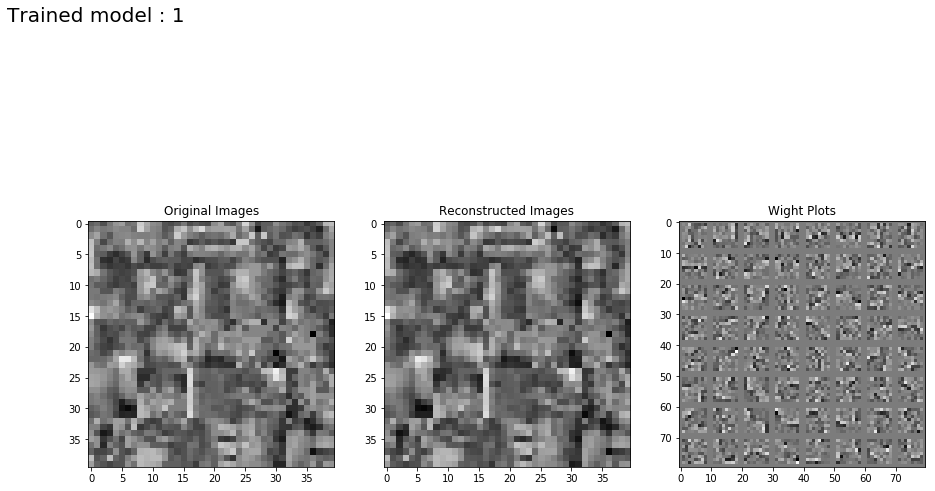

Step 1: Minibatch Loss: 0.015389 Error: 0.015389 Sparse: 0.000805
Step 100: Minibatch Loss: 0.008156 Error: 0.008092 Sparse: 0.064812
Step 200: Minibatch Loss: 0.005236 Error: 0.005158 Sparse: 0.077891
Step 300: Minibatch Loss: 0.003569 Error: 0.003483 Sparse: 0.085218
Step 400: Minibatch Loss: 0.002462 Error: 0.002374 Sparse: 0.088769
Step 500: Minibatch Loss: 0.001636 Error: 0.001543 Sparse: 0.092456
Step 600: Minibatch Loss: 0.001083 Error: 0.000988 Sparse: 0.094374
Step 700: Minibatch Loss: 0.000660 Error: 0.000564 Sparse: 0.096533
Step 800: Minibatch Loss: 0.000440 Error: 0.000343 Sparse: 0.097032
Step 900: Minibatch Loss: 0.000295 Error: 0.000197 Sparse: 0.097955
Step 1000: Minibatch Loss: 0.000202 Error: 0.000104 Sparse: 0.097776


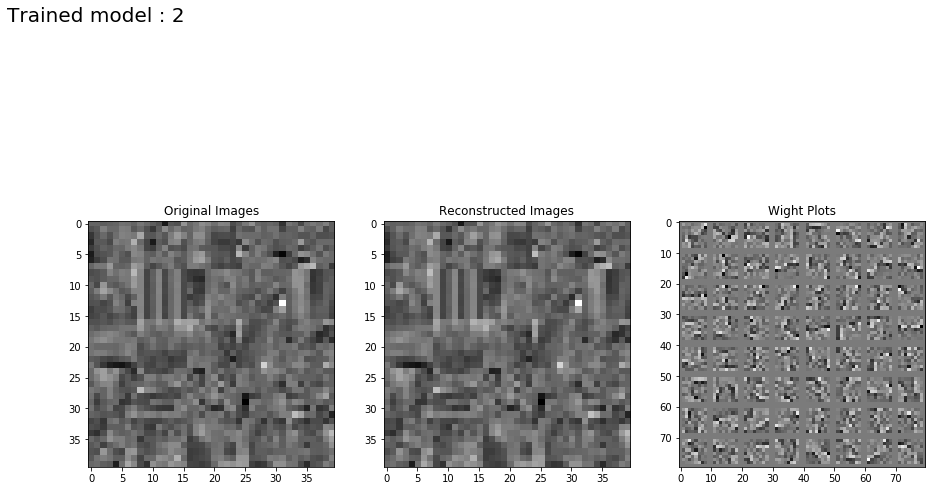

Step 1: Minibatch Loss: 0.015412 Error: 0.015404 Sparse: 0.000756
Step 100: Minibatch Loss: 0.015360 Error: 0.015359 Sparse: 0.000077
Step 200: Minibatch Loss: 0.015454 Error: 0.015453 Sparse: 0.000063
Step 300: Minibatch Loss: 0.015469 Error: 0.015469 Sparse: 0.000069
Step 400: Minibatch Loss: 0.015438 Error: 0.015437 Sparse: 0.000066
Step 500: Minibatch Loss: 0.015454 Error: 0.015453 Sparse: 0.000064
Step 600: Minibatch Loss: 0.015438 Error: 0.015437 Sparse: 0.000070
Step 700: Minibatch Loss: 0.015376 Error: 0.015375 Sparse: 0.000067
Step 800: Minibatch Loss: 0.015407 Error: 0.015406 Sparse: 0.000066
Step 900: Minibatch Loss: 0.015423 Error: 0.015422 Sparse: 0.000062
Step 1000: Minibatch Loss: 0.015422 Error: 0.015422 Sparse: 0.000063


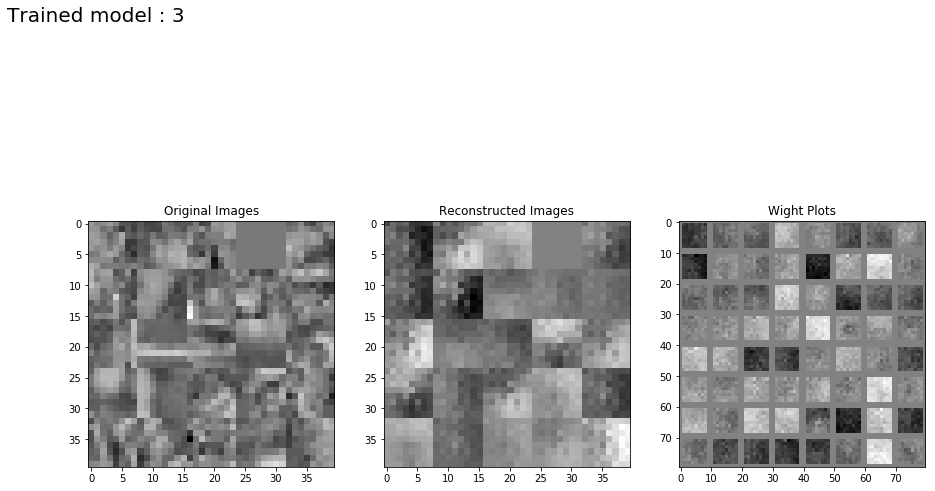

Step 1: Minibatch Loss: 0.015515 Error: 0.015436 Sparse: 0.000792
Step 100: Minibatch Loss: 0.015382 Error: 0.015375 Sparse: 0.000070
Step 200: Minibatch Loss: 0.015522 Error: 0.015516 Sparse: 0.000069
Step 300: Minibatch Loss: 0.015303 Error: 0.015297 Sparse: 0.000066
Step 400: Minibatch Loss: 0.015460 Error: 0.015453 Sparse: 0.000071
Step 500: Minibatch Loss: 0.015475 Error: 0.015469 Sparse: 0.000062
Step 600: Minibatch Loss: 0.015350 Error: 0.015344 Sparse: 0.000060
Step 700: Minibatch Loss: 0.015366 Error: 0.015359 Sparse: 0.000063
Step 800: Minibatch Loss: 0.015459 Error: 0.015453 Sparse: 0.000057
Step 900: Minibatch Loss: 0.015491 Error: 0.015484 Sparse: 0.000067
Step 1000: Minibatch Loss: 0.015429 Error: 0.015422 Sparse: 0.000069


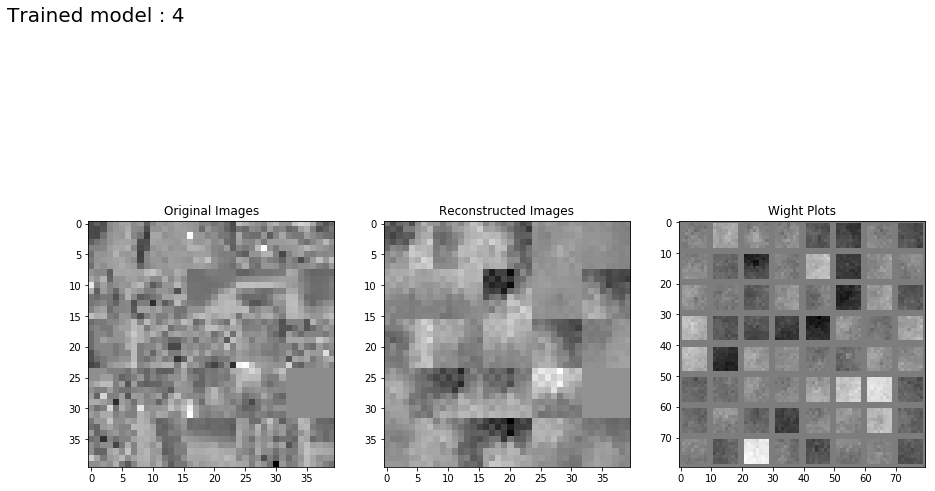

Step 1: Minibatch Loss: 0.016259 Error: 0.015467 Sparse: 0.000792
Step 100: Minibatch Loss: 0.015537 Error: 0.015469 Sparse: 0.000068
Step 200: Minibatch Loss: 0.015352 Error: 0.015281 Sparse: 0.000071
Step 300: Minibatch Loss: 0.015520 Error: 0.015453 Sparse: 0.000067
Step 400: Minibatch Loss: 0.015474 Error: 0.015406 Sparse: 0.000067
Step 500: Minibatch Loss: 0.015453 Error: 0.015391 Sparse: 0.000062
Step 600: Minibatch Loss: 0.015498 Error: 0.015437 Sparse: 0.000061
Step 700: Minibatch Loss: 0.015495 Error: 0.015438 Sparse: 0.000058
Step 800: Minibatch Loss: 0.015458 Error: 0.015391 Sparse: 0.000067
Step 900: Minibatch Loss: 0.015435 Error: 0.015375 Sparse: 0.000060
Step 1000: Minibatch Loss: 0.015532 Error: 0.015469 Sparse: 0.000063


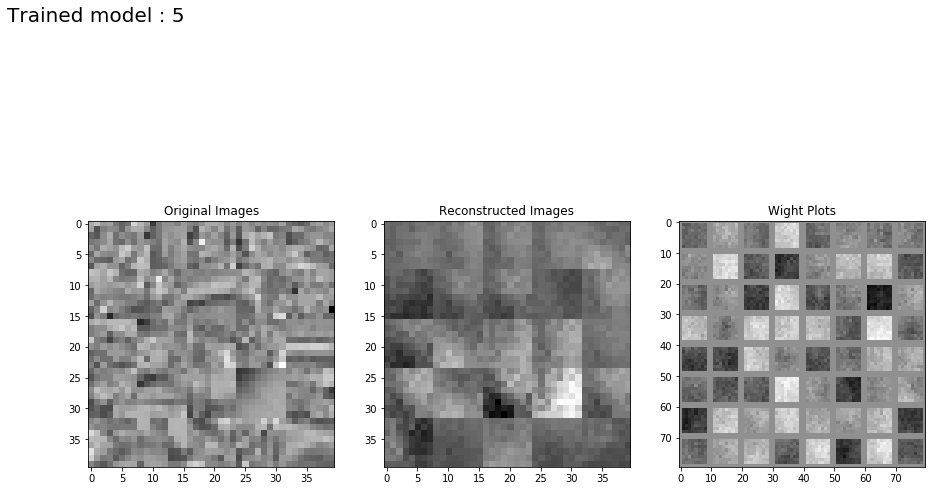

Step 1: Minibatch Loss: 0.015373 Error: 0.015373 Sparse: 0.000796
Step 100: Minibatch Loss: 0.008342 Error: 0.008336 Sparse: 0.063780
Step 200: Minibatch Loss: 0.005310 Error: 0.005303 Sparse: 0.077868
Step 300: Minibatch Loss: 0.003725 Error: 0.003717 Sparse: 0.084333
Step 400: Minibatch Loss: 0.002550 Error: 0.002541 Sparse: 0.088794
Step 500: Minibatch Loss: 0.001548 Error: 0.001539 Sparse: 0.092080
Step 600: Minibatch Loss: 0.001008 Error: 0.000999 Sparse: 0.094695
Step 700: Minibatch Loss: 0.000612 Error: 0.000602 Sparse: 0.096023
Step 800: Minibatch Loss: 0.000370 Error: 0.000360 Sparse: 0.097630
Step 900: Minibatch Loss: 0.000221 Error: 0.000212 Sparse: 0.098207
Step 1000: Minibatch Loss: 0.000097 Error: 0.000087 Sparse: 0.098277
Step 1100: Minibatch Loss: 0.000036 Error: 0.000026 Sparse: 0.098705
Step 1200: Minibatch Loss: 0.000012 Error: 0.000003 Sparse: 0.098553
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098478
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

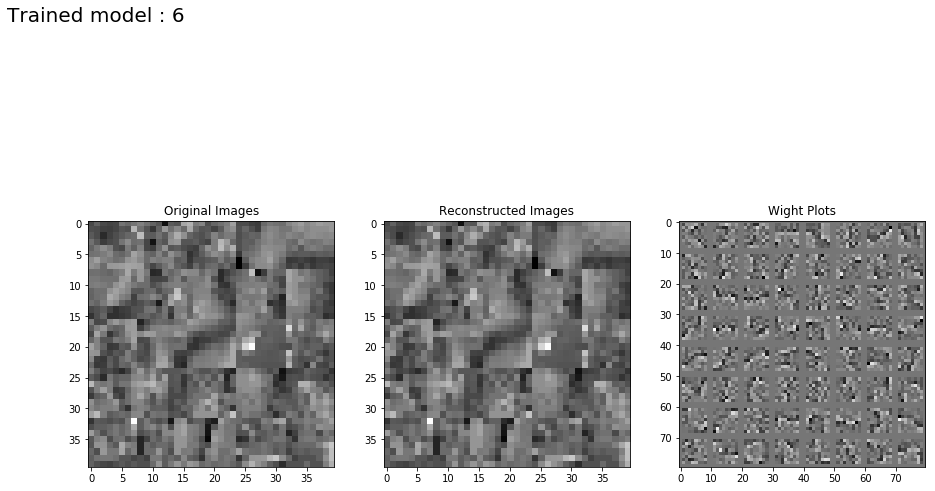

Step 1: Minibatch Loss: 0.015452 Error: 0.015451 Sparse: 0.000803
Step 100: Minibatch Loss: 0.008261 Error: 0.008197 Sparse: 0.063860
Step 200: Minibatch Loss: 0.005533 Error: 0.005456 Sparse: 0.076742
Step 300: Minibatch Loss: 0.003714 Error: 0.003630 Sparse: 0.084828
Step 400: Minibatch Loss: 0.002557 Error: 0.002468 Sparse: 0.088871
Step 500: Minibatch Loss: 0.001726 Error: 0.001635 Sparse: 0.091436
Step 600: Minibatch Loss: 0.001095 Error: 0.001000 Sparse: 0.094329
Step 700: Minibatch Loss: 0.000728 Error: 0.000632 Sparse: 0.095920
Step 800: Minibatch Loss: 0.000506 Error: 0.000409 Sparse: 0.096874
Step 900: Minibatch Loss: 0.000334 Error: 0.000236 Sparse: 0.097281
Step 1000: Minibatch Loss: 0.000229 Error: 0.000130 Sparse: 0.098137
Step 1100: Minibatch Loss: 0.000153 Error: 0.000055 Sparse: 0.097987
Step 1200: Minibatch Loss: 0.000109 Error: 0.000011 Sparse: 0.098005
Step 1300: Minibatch Loss: 0.000099 Error: 0.000001 Sparse: 0.098648
Step 1400: Minibatch Loss: 0.000098 Error: 0.0

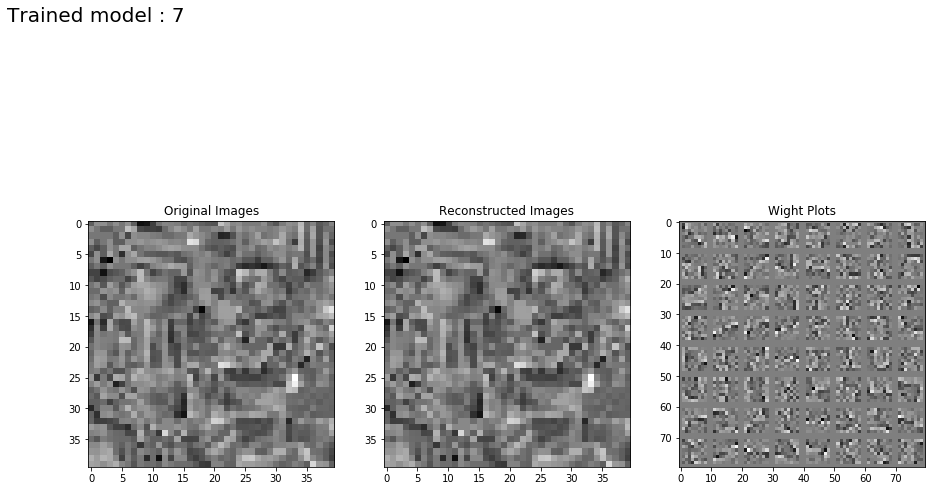

Step 1: Minibatch Loss: 0.015443 Error: 0.015436 Sparse: 0.000782
Step 100: Minibatch Loss: 0.015470 Error: 0.015469 Sparse: 0.000078
Step 200: Minibatch Loss: 0.015376 Error: 0.015375 Sparse: 0.000067
Step 300: Minibatch Loss: 0.015360 Error: 0.015359 Sparse: 0.000066
Step 400: Minibatch Loss: 0.015438 Error: 0.015437 Sparse: 0.000074
Step 500: Minibatch Loss: 0.015485 Error: 0.015484 Sparse: 0.000066
Step 600: Minibatch Loss: 0.015501 Error: 0.015500 Sparse: 0.000063
Step 700: Minibatch Loss: 0.015407 Error: 0.015406 Sparse: 0.000061
Step 800: Minibatch Loss: 0.015391 Error: 0.015391 Sparse: 0.000062
Step 900: Minibatch Loss: 0.015469 Error: 0.015469 Sparse: 0.000059
Step 1000: Minibatch Loss: 0.015438 Error: 0.015437 Sparse: 0.000065
Step 1100: Minibatch Loss: 0.015485 Error: 0.015484 Sparse: 0.000071
Step 1200: Minibatch Loss: 0.015423 Error: 0.015422 Sparse: 0.000071
Step 1300: Minibatch Loss: 0.015438 Error: 0.015437 Sparse: 0.000062
Step 1400: Minibatch Loss: 0.015251 Error: 0.0

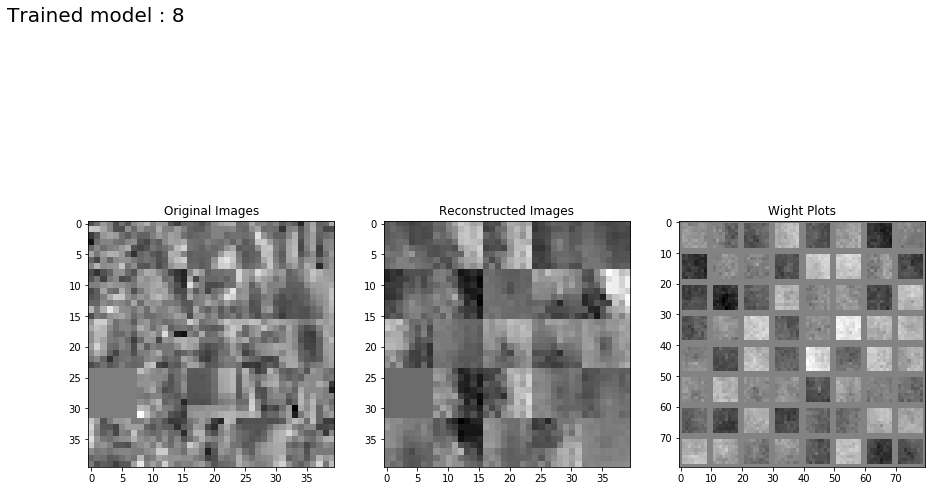

Step 1: Minibatch Loss: 0.015563 Error: 0.015482 Sparse: 0.000806
Step 100: Minibatch Loss: 0.015382 Error: 0.015375 Sparse: 0.000071
Step 200: Minibatch Loss: 0.015413 Error: 0.015406 Sparse: 0.000064
Step 300: Minibatch Loss: 0.015428 Error: 0.015422 Sparse: 0.000067
Step 400: Minibatch Loss: 0.015444 Error: 0.015437 Sparse: 0.000062
Step 500: Minibatch Loss: 0.015381 Error: 0.015375 Sparse: 0.000063
Step 600: Minibatch Loss: 0.015350 Error: 0.015344 Sparse: 0.000065
Step 700: Minibatch Loss: 0.015351 Error: 0.015344 Sparse: 0.000070
Step 800: Minibatch Loss: 0.015475 Error: 0.015469 Sparse: 0.000061
Step 900: Minibatch Loss: 0.015444 Error: 0.015437 Sparse: 0.000065
Step 1000: Minibatch Loss: 0.015429 Error: 0.015422 Sparse: 0.000067
Step 1100: Minibatch Loss: 0.015366 Error: 0.015359 Sparse: 0.000070
Step 1200: Minibatch Loss: 0.015413 Error: 0.015406 Sparse: 0.000064
Step 1300: Minibatch Loss: 0.015460 Error: 0.015453 Sparse: 0.000064
Step 1400: Minibatch Loss: 0.015382 Error: 0.0

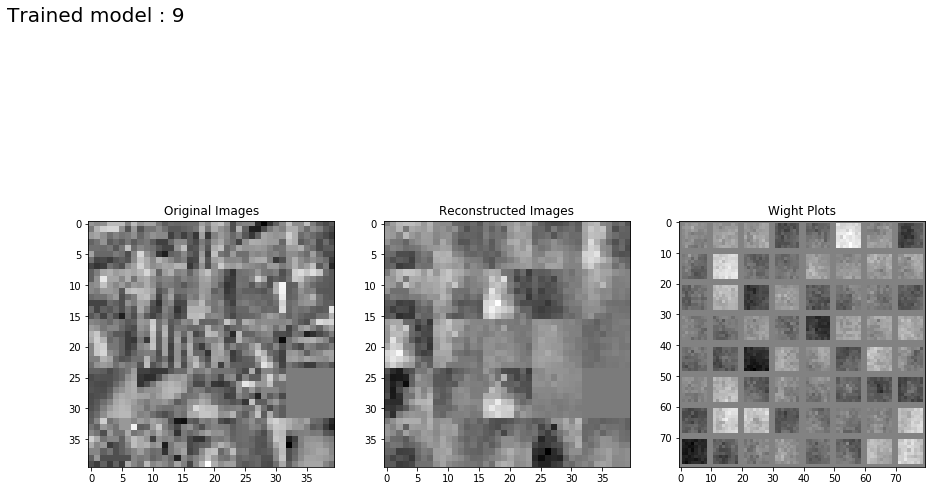

Step 1: Minibatch Loss: 0.016153 Error: 0.015373 Sparse: 0.000780
Step 100: Minibatch Loss: 0.015410 Error: 0.015328 Sparse: 0.000081
Step 200: Minibatch Loss: 0.015542 Error: 0.015469 Sparse: 0.000073
Step 300: Minibatch Loss: 0.015499 Error: 0.015437 Sparse: 0.000061
Step 400: Minibatch Loss: 0.015465 Error: 0.015406 Sparse: 0.000059
Step 500: Minibatch Loss: 0.015486 Error: 0.015422 Sparse: 0.000064
Step 600: Minibatch Loss: 0.015515 Error: 0.015453 Sparse: 0.000062
Step 700: Minibatch Loss: 0.015488 Error: 0.015422 Sparse: 0.000067
Step 800: Minibatch Loss: 0.015498 Error: 0.015438 Sparse: 0.000061
Step 900: Minibatch Loss: 0.015483 Error: 0.015422 Sparse: 0.000061
Step 1000: Minibatch Loss: 0.015529 Error: 0.015469 Sparse: 0.000060
Step 1100: Minibatch Loss: 0.015487 Error: 0.015422 Sparse: 0.000065
Step 1200: Minibatch Loss: 0.015419 Error: 0.015359 Sparse: 0.000060
Step 1300: Minibatch Loss: 0.015375 Error: 0.015312 Sparse: 0.000063
Step 1400: Minibatch Loss: 0.015437 Error: 0.0

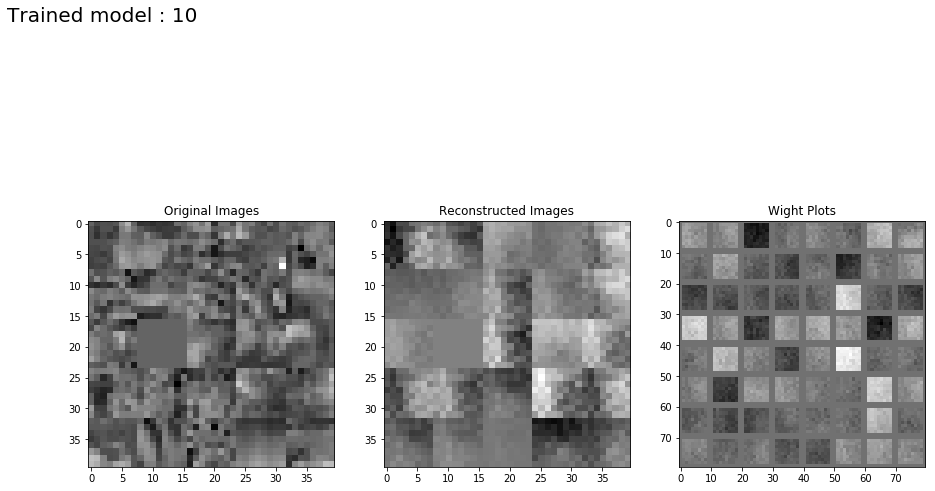

Step 1: Minibatch Loss: 0.015389 Error: 0.015389 Sparse: 0.000779
Step 100: Minibatch Loss: 0.008438 Error: 0.008432 Sparse: 0.063360
Step 200: Minibatch Loss: 0.005270 Error: 0.005262 Sparse: 0.077848
Step 300: Minibatch Loss: 0.003673 Error: 0.003664 Sparse: 0.083717
Step 400: Minibatch Loss: 0.002527 Error: 0.002518 Sparse: 0.088469
Step 500: Minibatch Loss: 0.001666 Error: 0.001657 Sparse: 0.091594
Step 600: Minibatch Loss: 0.001096 Error: 0.001087 Sparse: 0.093625
Step 700: Minibatch Loss: 0.000646 Error: 0.000636 Sparse: 0.096307
Step 800: Minibatch Loss: 0.000402 Error: 0.000392 Sparse: 0.096828
Step 900: Minibatch Loss: 0.000214 Error: 0.000204 Sparse: 0.097662
Step 1000: Minibatch Loss: 0.000118 Error: 0.000109 Sparse: 0.098467
Step 1100: Minibatch Loss: 0.000054 Error: 0.000044 Sparse: 0.098279
Step 1200: Minibatch Loss: 0.000017 Error: 0.000007 Sparse: 0.097920
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098765
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

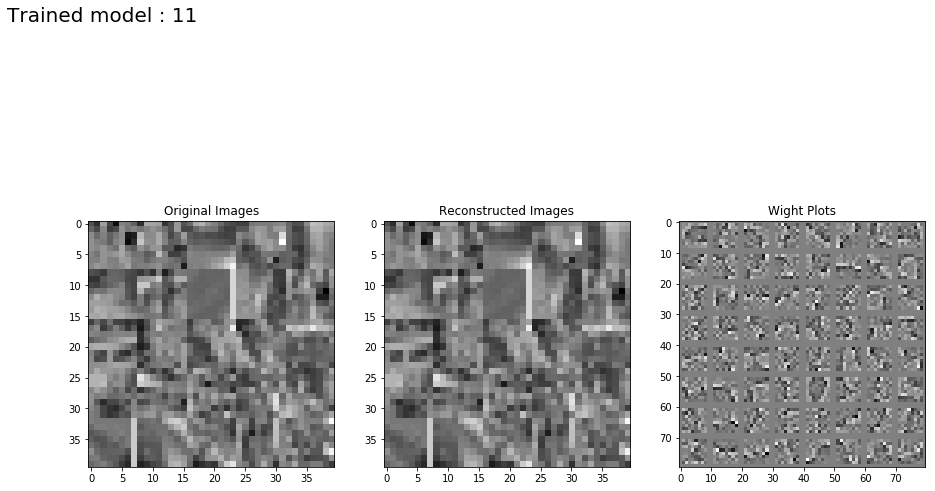

Step 1: Minibatch Loss: 0.015358 Error: 0.015357 Sparse: 0.000772
Step 100: Minibatch Loss: 0.008622 Error: 0.008559 Sparse: 0.062790
Step 200: Minibatch Loss: 0.005225 Error: 0.005147 Sparse: 0.078706
Step 300: Minibatch Loss: 0.003718 Error: 0.003633 Sparse: 0.084779
Step 400: Minibatch Loss: 0.002519 Error: 0.002431 Sparse: 0.088686
Step 500: Minibatch Loss: 0.001649 Error: 0.001557 Sparse: 0.092157
Step 600: Minibatch Loss: 0.001082 Error: 0.000987 Sparse: 0.094426
Step 700: Minibatch Loss: 0.000681 Error: 0.000585 Sparse: 0.095933
Step 800: Minibatch Loss: 0.000464 Error: 0.000367 Sparse: 0.097169
Step 900: Minibatch Loss: 0.000323 Error: 0.000225 Sparse: 0.098147
Step 1000: Minibatch Loss: 0.000216 Error: 0.000117 Sparse: 0.098260
Step 1100: Minibatch Loss: 0.000168 Error: 0.000069 Sparse: 0.098959
Step 1200: Minibatch Loss: 0.000118 Error: 0.000019 Sparse: 0.098902
Step 1300: Minibatch Loss: 0.000101 Error: 0.000002 Sparse: 0.099074
Step 1400: Minibatch Loss: 0.000099 Error: 0.0

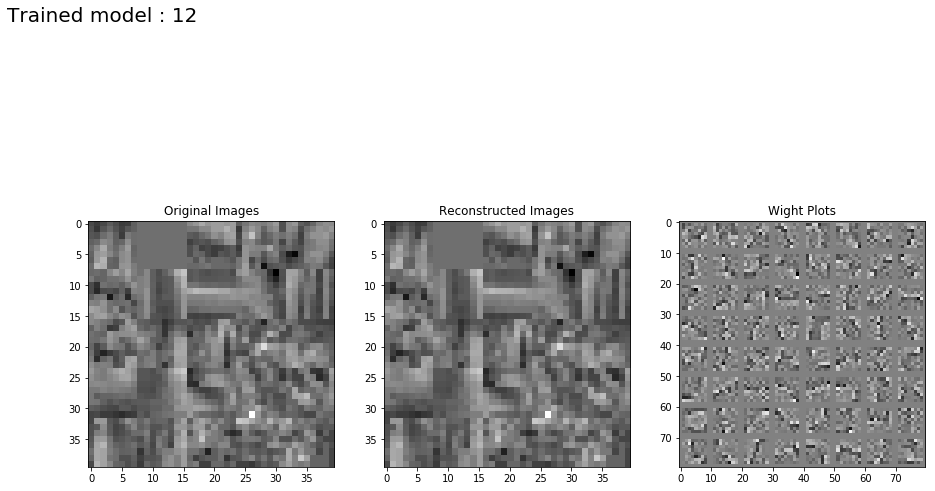

Step 1: Minibatch Loss: 0.015459 Error: 0.015451 Sparse: 0.000791
Step 100: Minibatch Loss: 0.015469 Error: 0.015469 Sparse: 0.000072
Step 200: Minibatch Loss: 0.015376 Error: 0.015375 Sparse: 0.000064
Step 300: Minibatch Loss: 0.015376 Error: 0.015375 Sparse: 0.000066
Step 400: Minibatch Loss: 0.015423 Error: 0.015422 Sparse: 0.000066
Step 500: Minibatch Loss: 0.015469 Error: 0.015469 Sparse: 0.000067
Step 600: Minibatch Loss: 0.015454 Error: 0.015453 Sparse: 0.000066
Step 700: Minibatch Loss: 0.015423 Error: 0.015422 Sparse: 0.000063
Step 800: Minibatch Loss: 0.015297 Error: 0.015297 Sparse: 0.000062
Step 900: Minibatch Loss: 0.015423 Error: 0.015422 Sparse: 0.000073
Step 1000: Minibatch Loss: 0.015360 Error: 0.015359 Sparse: 0.000069
Step 1100: Minibatch Loss: 0.015469 Error: 0.015469 Sparse: 0.000064
Step 1200: Minibatch Loss: 0.015422 Error: 0.015422 Sparse: 0.000067
Step 1300: Minibatch Loss: 0.015376 Error: 0.015375 Sparse: 0.000062
Step 1400: Minibatch Loss: 0.015391 Error: 0.0

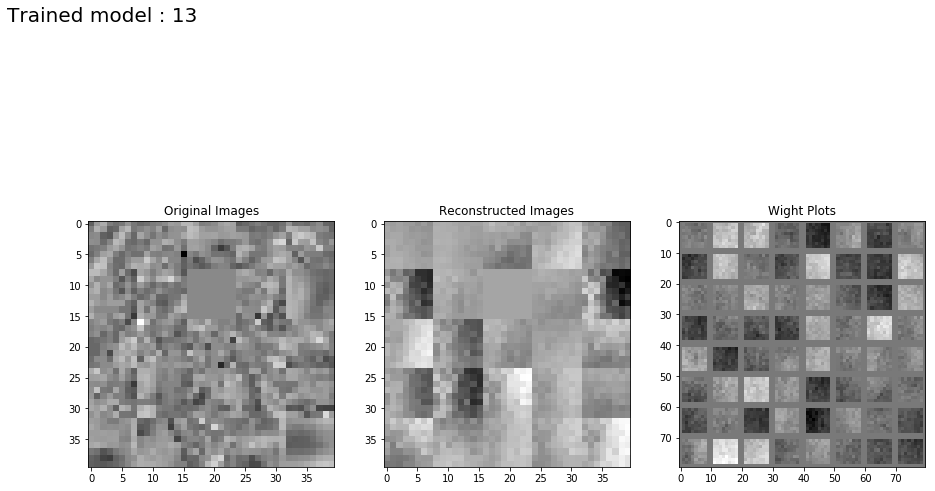

Step 1: Minibatch Loss: 0.015531 Error: 0.015451 Sparse: 0.000796
Step 100: Minibatch Loss: 0.015226 Error: 0.015219 Sparse: 0.000069
Step 200: Minibatch Loss: 0.015475 Error: 0.015469 Sparse: 0.000061
Step 300: Minibatch Loss: 0.015350 Error: 0.015344 Sparse: 0.000065
Step 400: Minibatch Loss: 0.015428 Error: 0.015422 Sparse: 0.000065
Step 500: Minibatch Loss: 0.015397 Error: 0.015391 Sparse: 0.000063
Step 600: Minibatch Loss: 0.015397 Error: 0.015391 Sparse: 0.000064
Step 700: Minibatch Loss: 0.015507 Error: 0.015500 Sparse: 0.000071
Step 800: Minibatch Loss: 0.015459 Error: 0.015453 Sparse: 0.000063
Step 900: Minibatch Loss: 0.015303 Error: 0.015297 Sparse: 0.000064
Step 1000: Minibatch Loss: 0.015334 Error: 0.015328 Sparse: 0.000064
Step 1100: Minibatch Loss: 0.015428 Error: 0.015422 Sparse: 0.000060
Step 1200: Minibatch Loss: 0.015335 Error: 0.015328 Sparse: 0.000068
Step 1300: Minibatch Loss: 0.015272 Error: 0.015266 Sparse: 0.000061
Step 1400: Minibatch Loss: 0.015319 Error: 0.0

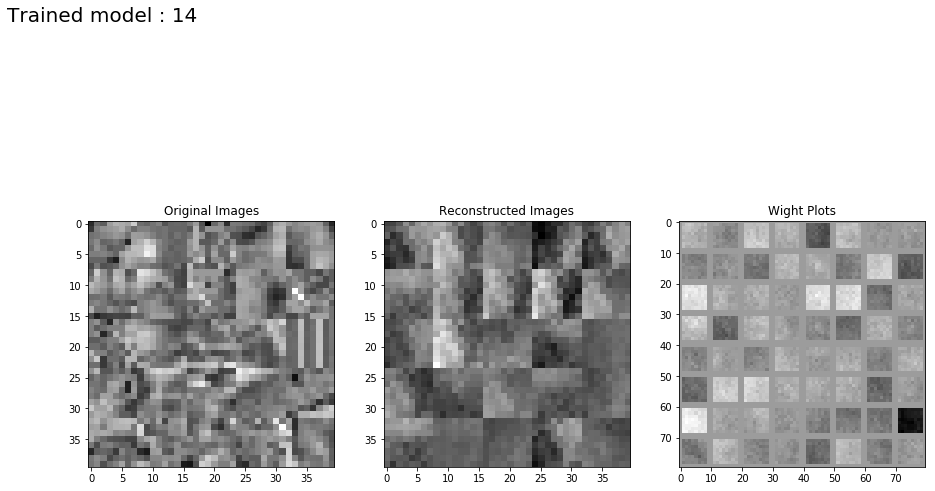

Step 1: Minibatch Loss: 0.016330 Error: 0.015529 Sparse: 0.000801
Step 100: Minibatch Loss: 0.015476 Error: 0.015406 Sparse: 0.000070
Step 200: Minibatch Loss: 0.015561 Error: 0.015500 Sparse: 0.000061
Step 300: Minibatch Loss: 0.015564 Error: 0.015500 Sparse: 0.000064
Step 400: Minibatch Loss: 0.015550 Error: 0.015484 Sparse: 0.000066
Step 500: Minibatch Loss: 0.015537 Error: 0.015469 Sparse: 0.000068
Step 600: Minibatch Loss: 0.015472 Error: 0.015406 Sparse: 0.000065
Step 700: Minibatch Loss: 0.015490 Error: 0.015422 Sparse: 0.000068
Step 800: Minibatch Loss: 0.015483 Error: 0.015422 Sparse: 0.000061
Step 900: Minibatch Loss: 0.015529 Error: 0.015469 Sparse: 0.000060
Step 1000: Minibatch Loss: 0.015505 Error: 0.015437 Sparse: 0.000068
Step 1100: Minibatch Loss: 0.015528 Error: 0.015469 Sparse: 0.000059
Step 1200: Minibatch Loss: 0.015521 Error: 0.015453 Sparse: 0.000068
Step 1300: Minibatch Loss: 0.015472 Error: 0.015406 Sparse: 0.000066
Step 1400: Minibatch Loss: 0.015535 Error: 0.0

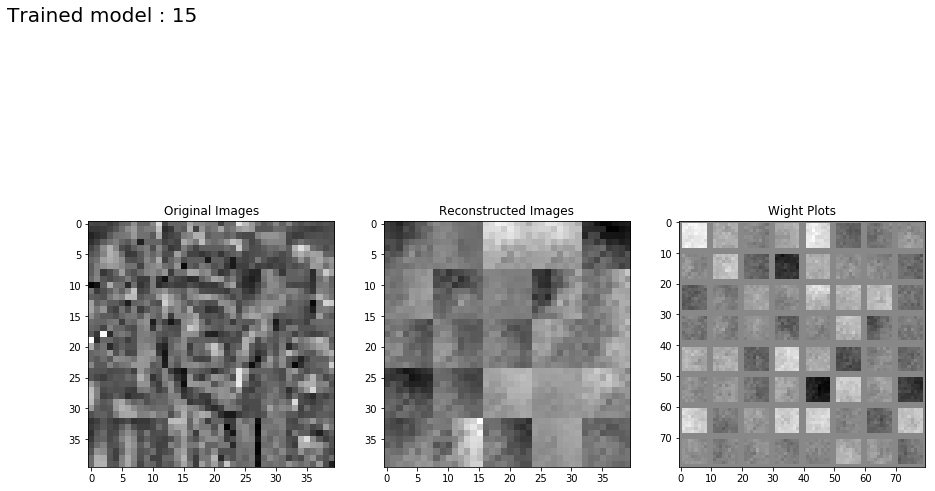

Step 1: Minibatch Loss: 0.015404 Error: 0.015404 Sparse: 0.000788
Step 100: Minibatch Loss: 0.008398 Error: 0.008391 Sparse: 0.063036
Step 200: Minibatch Loss: 0.005416 Error: 0.005408 Sparse: 0.078533
Step 300: Minibatch Loss: 0.003713 Error: 0.003705 Sparse: 0.085178
Step 400: Minibatch Loss: 0.002476 Error: 0.002467 Sparse: 0.089026
Step 500: Minibatch Loss: 0.001649 Error: 0.001640 Sparse: 0.092892
Step 600: Minibatch Loss: 0.000990 Error: 0.000980 Sparse: 0.095377
Step 700: Minibatch Loss: 0.000606 Error: 0.000596 Sparse: 0.096562
Step 800: Minibatch Loss: 0.000377 Error: 0.000367 Sparse: 0.097680
Step 900: Minibatch Loss: 0.000194 Error: 0.000184 Sparse: 0.098098
Step 1000: Minibatch Loss: 0.000084 Error: 0.000074 Sparse: 0.098640
Step 1100: Minibatch Loss: 0.000023 Error: 0.000013 Sparse: 0.099257
Step 1200: Minibatch Loss: 0.000011 Error: 0.000001 Sparse: 0.099713
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098898
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

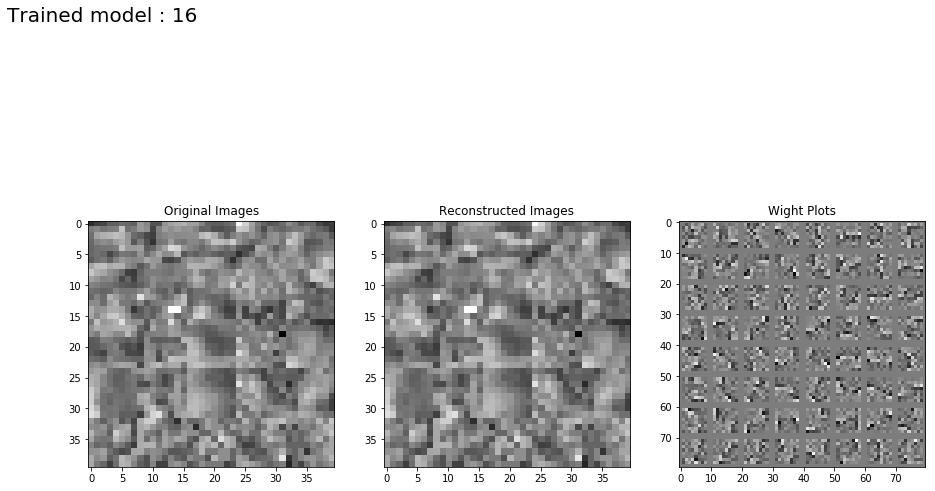

Step 1: Minibatch Loss: 0.015421 Error: 0.015420 Sparse: 0.000803
Step 100: Minibatch Loss: 0.007962 Error: 0.007896 Sparse: 0.065515
Step 200: Minibatch Loss: 0.005022 Error: 0.004943 Sparse: 0.079229
Step 300: Minibatch Loss: 0.003447 Error: 0.003361 Sparse: 0.085543
Step 400: Minibatch Loss: 0.002363 Error: 0.002273 Sparse: 0.090037
Step 500: Minibatch Loss: 0.001618 Error: 0.001527 Sparse: 0.091748
Step 600: Minibatch Loss: 0.001045 Error: 0.000950 Sparse: 0.095288
Step 700: Minibatch Loss: 0.000708 Error: 0.000612 Sparse: 0.096625
Step 800: Minibatch Loss: 0.000448 Error: 0.000352 Sparse: 0.096292
Step 900: Minibatch Loss: 0.000302 Error: 0.000205 Sparse: 0.097635
Step 1000: Minibatch Loss: 0.000166 Error: 0.000068 Sparse: 0.098220
Step 1100: Minibatch Loss: 0.000113 Error: 0.000014 Sparse: 0.098643
Step 1200: Minibatch Loss: 0.000100 Error: 0.000001 Sparse: 0.099283
Step 1300: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097539
Step 1400: Minibatch Loss: 0.000098 Error: 0.0

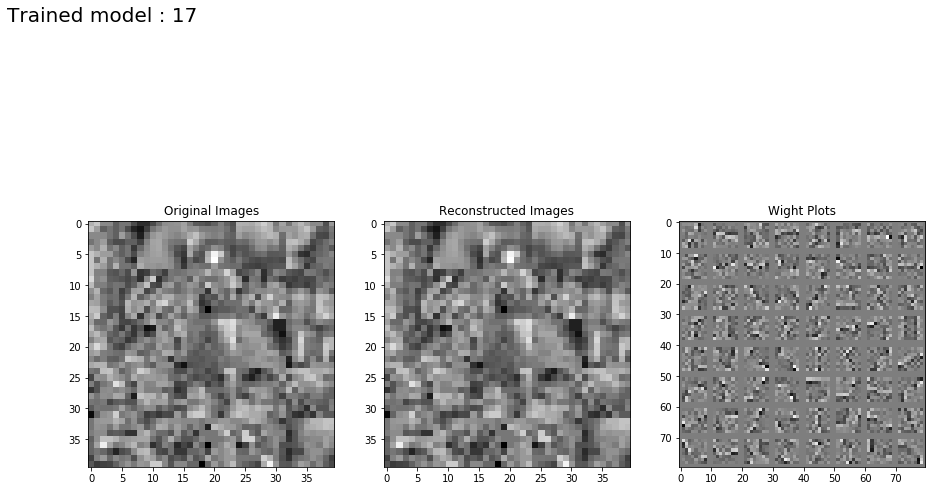

Step 1: Minibatch Loss: 0.015459 Error: 0.015451 Sparse: 0.000779
Step 100: Minibatch Loss: 0.015329 Error: 0.015328 Sparse: 0.000076
Step 200: Minibatch Loss: 0.015485 Error: 0.015484 Sparse: 0.000069
Step 300: Minibatch Loss: 0.015454 Error: 0.015453 Sparse: 0.000074
Step 400: Minibatch Loss: 0.015454 Error: 0.015453 Sparse: 0.000064
Step 500: Minibatch Loss: 0.015438 Error: 0.015437 Sparse: 0.000061
Step 600: Minibatch Loss: 0.015469 Error: 0.015469 Sparse: 0.000070
Step 700: Minibatch Loss: 0.015469 Error: 0.015469 Sparse: 0.000067
Step 800: Minibatch Loss: 0.015423 Error: 0.015422 Sparse: 0.000064
Step 900: Minibatch Loss: 0.015532 Error: 0.015531 Sparse: 0.000066
Step 1000: Minibatch Loss: 0.015423 Error: 0.015422 Sparse: 0.000070
Step 1100: Minibatch Loss: 0.015329 Error: 0.015328 Sparse: 0.000071
Step 1200: Minibatch Loss: 0.015438 Error: 0.015437 Sparse: 0.000065
Step 1300: Minibatch Loss: 0.015532 Error: 0.015531 Sparse: 0.000067
Step 1400: Minibatch Loss: 0.015422 Error: 0.0

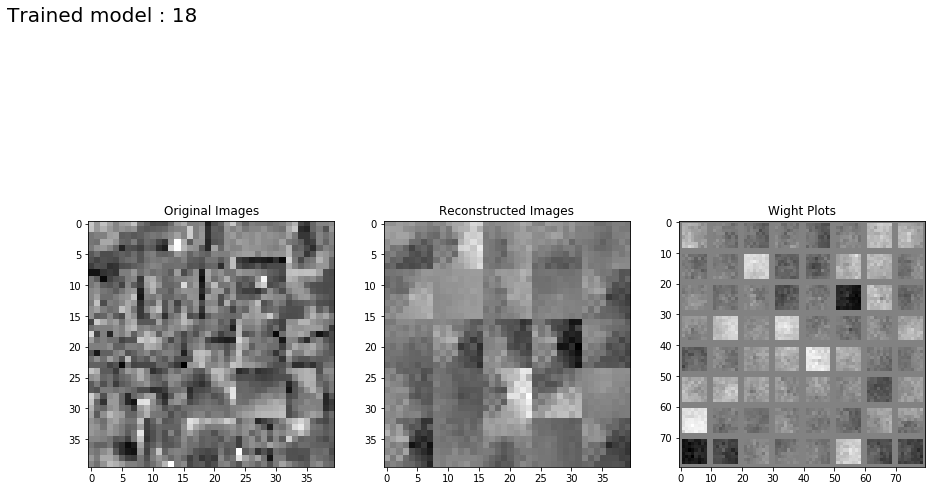

Step 1: Minibatch Loss: 0.015561 Error: 0.015482 Sparse: 0.000787
Step 100: Minibatch Loss: 0.015398 Error: 0.015391 Sparse: 0.000070
Step 200: Minibatch Loss: 0.015397 Error: 0.015391 Sparse: 0.000066
Step 300: Minibatch Loss: 0.015460 Error: 0.015453 Sparse: 0.000067
Step 400: Minibatch Loss: 0.015475 Error: 0.015469 Sparse: 0.000064
Step 500: Minibatch Loss: 0.015381 Error: 0.015375 Sparse: 0.000061
Step 600: Minibatch Loss: 0.015335 Error: 0.015328 Sparse: 0.000065
Step 700: Minibatch Loss: 0.015475 Error: 0.015469 Sparse: 0.000059
Step 800: Minibatch Loss: 0.015366 Error: 0.015359 Sparse: 0.000068
Step 900: Minibatch Loss: 0.015412 Error: 0.015406 Sparse: 0.000061
Step 1000: Minibatch Loss: 0.015366 Error: 0.015359 Sparse: 0.000064
Step 1100: Minibatch Loss: 0.015491 Error: 0.015484 Sparse: 0.000063
Step 1200: Minibatch Loss: 0.015444 Error: 0.015437 Sparse: 0.000061
Step 1300: Minibatch Loss: 0.015412 Error: 0.015406 Sparse: 0.000061
Step 1400: Minibatch Loss: 0.015428 Error: 0.0

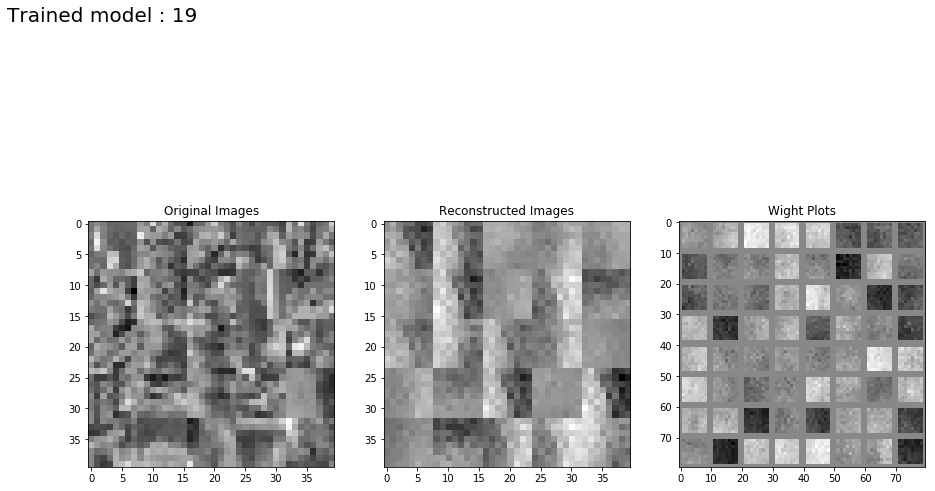

Step 1: Minibatch Loss: 0.016236 Error: 0.015435 Sparse: 0.000801
Step 100: Minibatch Loss: 0.015526 Error: 0.015453 Sparse: 0.000073
Step 200: Minibatch Loss: 0.015395 Error: 0.015328 Sparse: 0.000066
Step 300: Minibatch Loss: 0.015425 Error: 0.015359 Sparse: 0.000066
Step 400: Minibatch Loss: 0.015507 Error: 0.015437 Sparse: 0.000070
Step 500: Minibatch Loss: 0.015454 Error: 0.015391 Sparse: 0.000064
Step 600: Minibatch Loss: 0.015402 Error: 0.015344 Sparse: 0.000058
Step 700: Minibatch Loss: 0.015394 Error: 0.015328 Sparse: 0.000066
Step 800: Minibatch Loss: 0.015517 Error: 0.015453 Sparse: 0.000064
Step 900: Minibatch Loss: 0.015440 Error: 0.015375 Sparse: 0.000065
Step 1000: Minibatch Loss: 0.015462 Error: 0.015391 Sparse: 0.000072
Step 1100: Minibatch Loss: 0.015515 Error: 0.015453 Sparse: 0.000062
Step 1200: Minibatch Loss: 0.015539 Error: 0.015484 Sparse: 0.000055
Step 1300: Minibatch Loss: 0.015481 Error: 0.015422 Sparse: 0.000059
Step 1400: Minibatch Loss: 0.015546 Error: 0.0

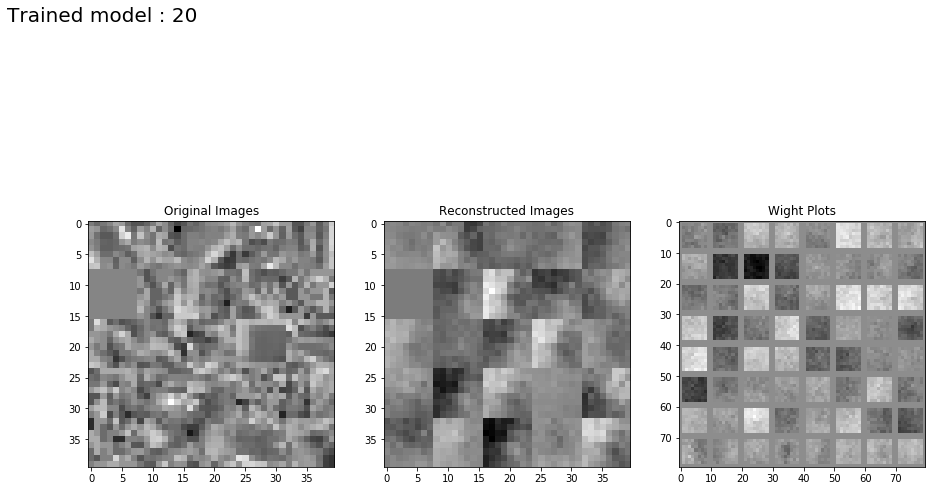

Step 1: Minibatch Loss: 0.015311 Error: 0.015310 Sparse: 0.000787
Step 100: Minibatch Loss: 0.008221 Error: 0.008214 Sparse: 0.063884
Step 200: Minibatch Loss: 0.005307 Error: 0.005299 Sparse: 0.077887
Step 300: Minibatch Loss: 0.003675 Error: 0.003667 Sparse: 0.085161
Step 400: Minibatch Loss: 0.002503 Error: 0.002494 Sparse: 0.088969
Step 500: Minibatch Loss: 0.001662 Error: 0.001653 Sparse: 0.091841
Step 600: Minibatch Loss: 0.000986 Error: 0.000977 Sparse: 0.094488
Step 700: Minibatch Loss: 0.000593 Error: 0.000583 Sparse: 0.096592
Step 800: Minibatch Loss: 0.000381 Error: 0.000372 Sparse: 0.097617
Step 900: Minibatch Loss: 0.000230 Error: 0.000221 Sparse: 0.097681
Step 1000: Minibatch Loss: 0.000122 Error: 0.000112 Sparse: 0.097850
Step 1100: Minibatch Loss: 0.000060 Error: 0.000051 Sparse: 0.098155
Step 1200: Minibatch Loss: 0.000023 Error: 0.000013 Sparse: 0.098291
Step 1300: Minibatch Loss: 0.000011 Error: 0.000001 Sparse: 0.098679
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

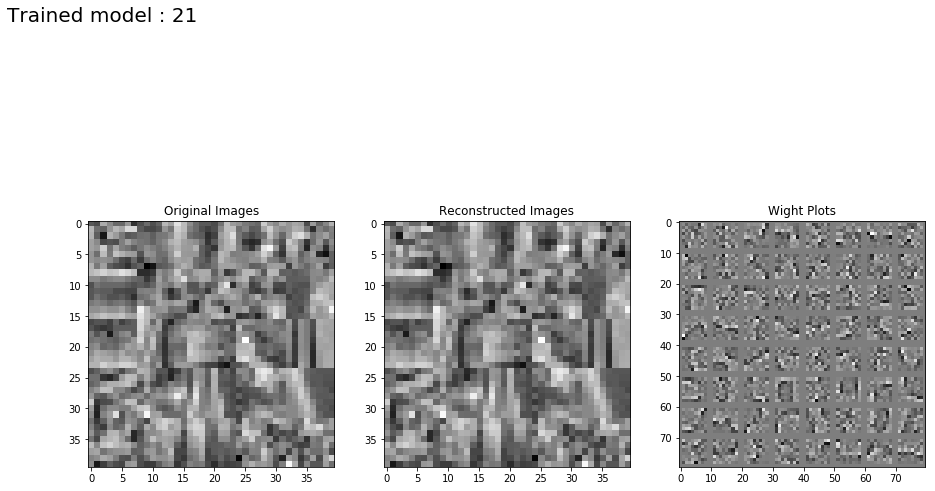

Step 1: Minibatch Loss: 0.015327 Error: 0.015326 Sparse: 0.000808
Step 100: Minibatch Loss: 0.008152 Error: 0.008088 Sparse: 0.064696
Step 200: Minibatch Loss: 0.005247 Error: 0.005168 Sparse: 0.078809
Step 300: Minibatch Loss: 0.003591 Error: 0.003506 Sparse: 0.084930
Step 400: Minibatch Loss: 0.002522 Error: 0.002432 Sparse: 0.089736
Step 500: Minibatch Loss: 0.001683 Error: 0.001591 Sparse: 0.092001
Step 600: Minibatch Loss: 0.001086 Error: 0.000991 Sparse: 0.094708
Step 700: Minibatch Loss: 0.000707 Error: 0.000611 Sparse: 0.095950
Step 800: Minibatch Loss: 0.000460 Error: 0.000363 Sparse: 0.096915
Step 900: Minibatch Loss: 0.000291 Error: 0.000192 Sparse: 0.098463
Step 1000: Minibatch Loss: 0.000197 Error: 0.000100 Sparse: 0.097864
Step 1100: Minibatch Loss: 0.000137 Error: 0.000037 Sparse: 0.099291
Step 1200: Minibatch Loss: 0.000103 Error: 0.000004 Sparse: 0.098898
Step 1300: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.099214
Step 1400: Minibatch Loss: 0.000099 Error: 0.0

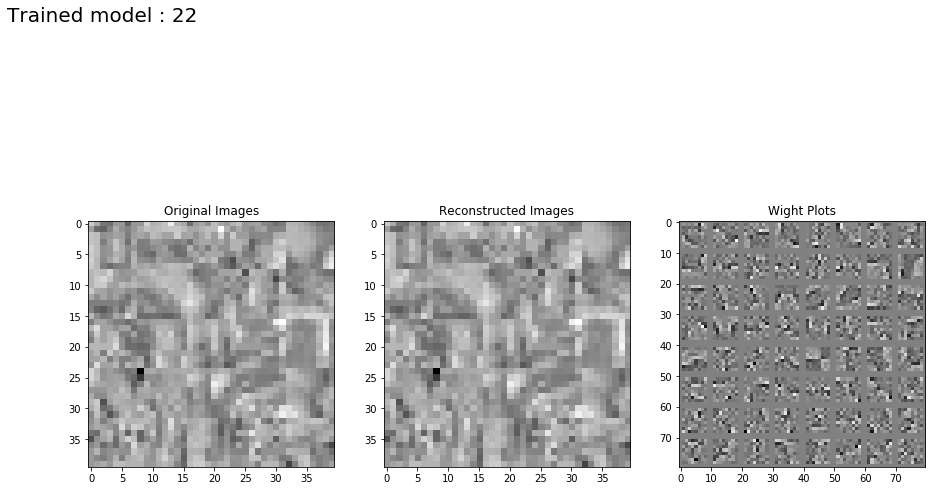

Step 1: Minibatch Loss: 0.015381 Error: 0.015373 Sparse: 0.000808
Step 100: Minibatch Loss: 0.015376 Error: 0.015375 Sparse: 0.000078
Step 200: Minibatch Loss: 0.015329 Error: 0.015328 Sparse: 0.000076
Step 300: Minibatch Loss: 0.015438 Error: 0.015438 Sparse: 0.000066
Step 400: Minibatch Loss: 0.015376 Error: 0.015375 Sparse: 0.000064
Step 500: Minibatch Loss: 0.015469 Error: 0.015469 Sparse: 0.000063
Step 600: Minibatch Loss: 0.015422 Error: 0.015422 Sparse: 0.000065
Step 700: Minibatch Loss: 0.015501 Error: 0.015500 Sparse: 0.000069
Step 800: Minibatch Loss: 0.015297 Error: 0.015297 Sparse: 0.000059
Step 900: Minibatch Loss: 0.015407 Error: 0.015406 Sparse: 0.000069
Step 1000: Minibatch Loss: 0.015251 Error: 0.015250 Sparse: 0.000058
Step 1100: Minibatch Loss: 0.015469 Error: 0.015469 Sparse: 0.000065
Step 1200: Minibatch Loss: 0.015360 Error: 0.015359 Sparse: 0.000072
Step 1300: Minibatch Loss: 0.015501 Error: 0.015500 Sparse: 0.000063
Step 1400: Minibatch Loss: 0.015532 Error: 0.0

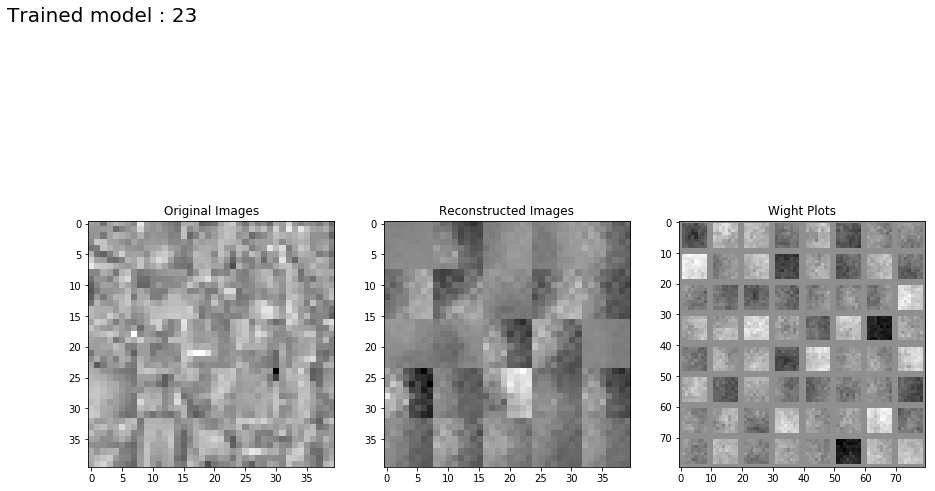

Step 1: Minibatch Loss: 0.015594 Error: 0.015514 Sparse: 0.000808
Step 100: Minibatch Loss: 0.015304 Error: 0.015297 Sparse: 0.000073
Step 200: Minibatch Loss: 0.015506 Error: 0.015500 Sparse: 0.000058
Step 300: Minibatch Loss: 0.015366 Error: 0.015359 Sparse: 0.000064
Step 400: Minibatch Loss: 0.015475 Error: 0.015469 Sparse: 0.000065
Step 500: Minibatch Loss: 0.015381 Error: 0.015375 Sparse: 0.000064
Step 600: Minibatch Loss: 0.015413 Error: 0.015406 Sparse: 0.000065
Step 700: Minibatch Loss: 0.015397 Error: 0.015391 Sparse: 0.000065
Step 800: Minibatch Loss: 0.015366 Error: 0.015359 Sparse: 0.000065
Step 900: Minibatch Loss: 0.015334 Error: 0.015328 Sparse: 0.000059
Step 1000: Minibatch Loss: 0.015428 Error: 0.015422 Sparse: 0.000060
Step 1100: Minibatch Loss: 0.015413 Error: 0.015406 Sparse: 0.000070
Step 1200: Minibatch Loss: 0.015429 Error: 0.015422 Sparse: 0.000067
Step 1300: Minibatch Loss: 0.015397 Error: 0.015391 Sparse: 0.000062
Step 1400: Minibatch Loss: 0.015507 Error: 0.0

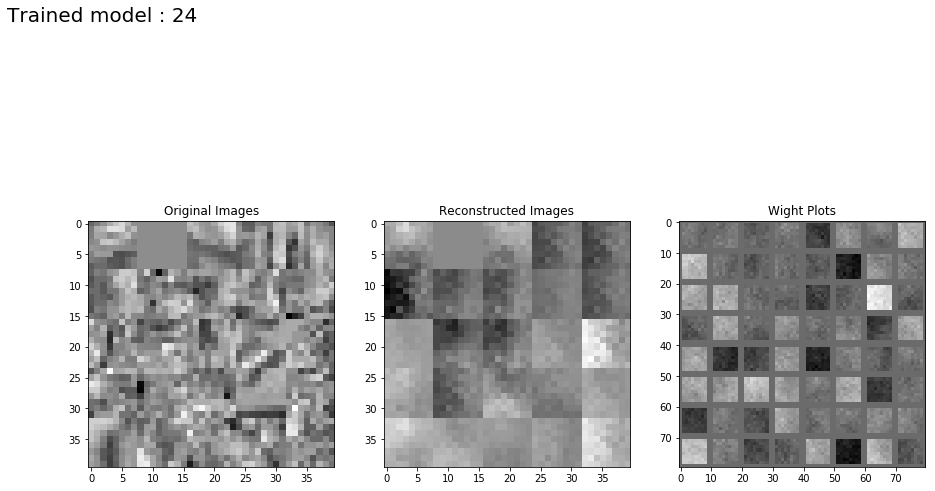

Step 1: Minibatch Loss: 0.016190 Error: 0.015389 Sparse: 0.000801
Step 100: Minibatch Loss: 0.015371 Error: 0.015297 Sparse: 0.000074
Step 200: Minibatch Loss: 0.015553 Error: 0.015484 Sparse: 0.000068
Step 300: Minibatch Loss: 0.015518 Error: 0.015453 Sparse: 0.000065
Step 400: Minibatch Loss: 0.015295 Error: 0.015234 Sparse: 0.000060
Step 500: Minibatch Loss: 0.015425 Error: 0.015359 Sparse: 0.000066
Step 600: Minibatch Loss: 0.015581 Error: 0.015516 Sparse: 0.000065
Step 700: Minibatch Loss: 0.015396 Error: 0.015328 Sparse: 0.000068
Step 800: Minibatch Loss: 0.015507 Error: 0.015438 Sparse: 0.000069
Step 900: Minibatch Loss: 0.015593 Error: 0.015531 Sparse: 0.000062
Step 1000: Minibatch Loss: 0.015501 Error: 0.015437 Sparse: 0.000064
Step 1100: Minibatch Loss: 0.015487 Error: 0.015422 Sparse: 0.000065
Step 1200: Minibatch Loss: 0.015559 Error: 0.015500 Sparse: 0.000059
Step 1300: Minibatch Loss: 0.015368 Error: 0.015313 Sparse: 0.000055
Step 1400: Minibatch Loss: 0.015500 Error: 0.0

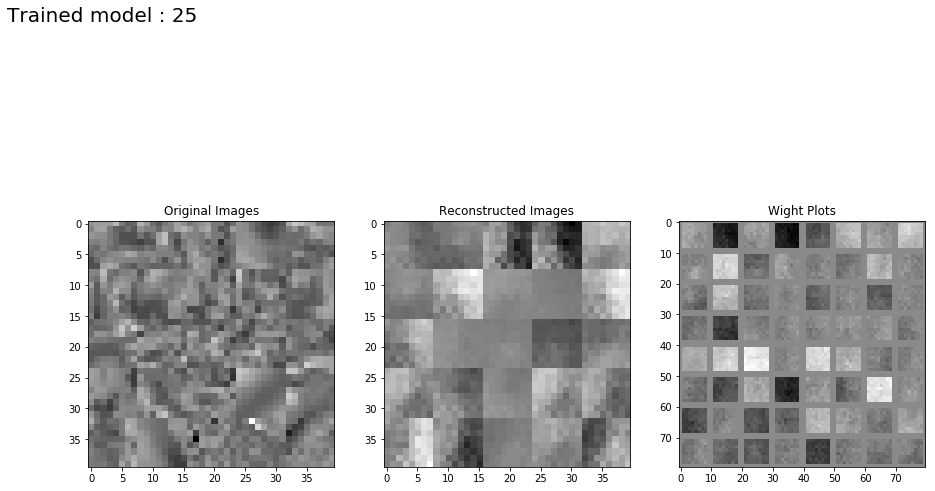

Step 1: Minibatch Loss: 0.015404 Error: 0.015404 Sparse: 0.000815
Step 100: Minibatch Loss: 0.001031 Error: 0.001022 Sparse: 0.094426
Step 200: Minibatch Loss: 0.000048 Error: 0.000038 Sparse: 0.098556
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098216
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098246
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098821
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098930
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099156
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099024
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098634
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098532


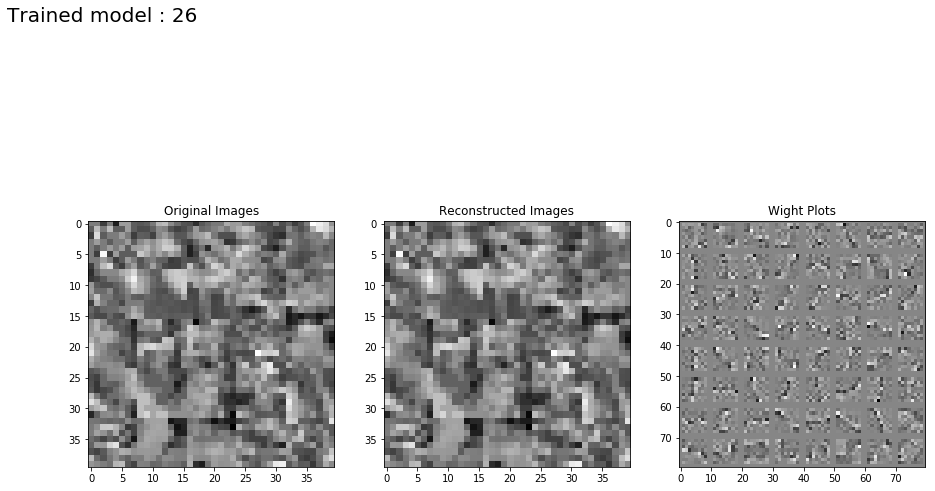

Step 1: Minibatch Loss: 0.015374 Error: 0.015373 Sparse: 0.000794
Step 100: Minibatch Loss: 0.001141 Error: 0.001047 Sparse: 0.094509
Step 200: Minibatch Loss: 0.000128 Error: 0.000030 Sparse: 0.098012
Step 300: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097538
Step 400: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.099068
Step 500: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098025
Step 600: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098504
Step 700: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097997
Step 800: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097499
Step 900: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097168
Step 1000: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096554


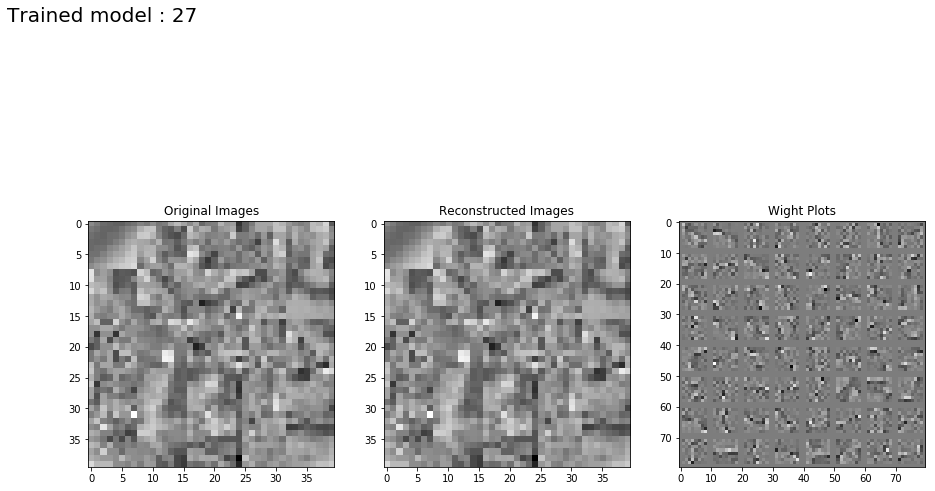

Step 1: Minibatch Loss: 0.015381 Error: 0.015373 Sparse: 0.000821
Step 100: Minibatch Loss: 0.001982 Error: 0.001044 Sparse: 0.093754
Step 200: Minibatch Loss: 0.000998 Error: 0.000032 Sparse: 0.096570
Step 300: Minibatch Loss: 0.000942 Error: 0.000004 Sparse: 0.093808
Step 400: Minibatch Loss: 0.000916 Error: 0.000004 Sparse: 0.091221
Step 500: Minibatch Loss: 0.000883 Error: 0.000004 Sparse: 0.087898
Step 600: Minibatch Loss: 0.000860 Error: 0.000004 Sparse: 0.085661
Step 700: Minibatch Loss: 0.000850 Error: 0.000004 Sparse: 0.084612
Step 800: Minibatch Loss: 0.000840 Error: 0.000004 Sparse: 0.083577
Step 900: Minibatch Loss: 0.000831 Error: 0.000004 Sparse: 0.082719
Step 1000: Minibatch Loss: 0.000829 Error: 0.000004 Sparse: 0.082491


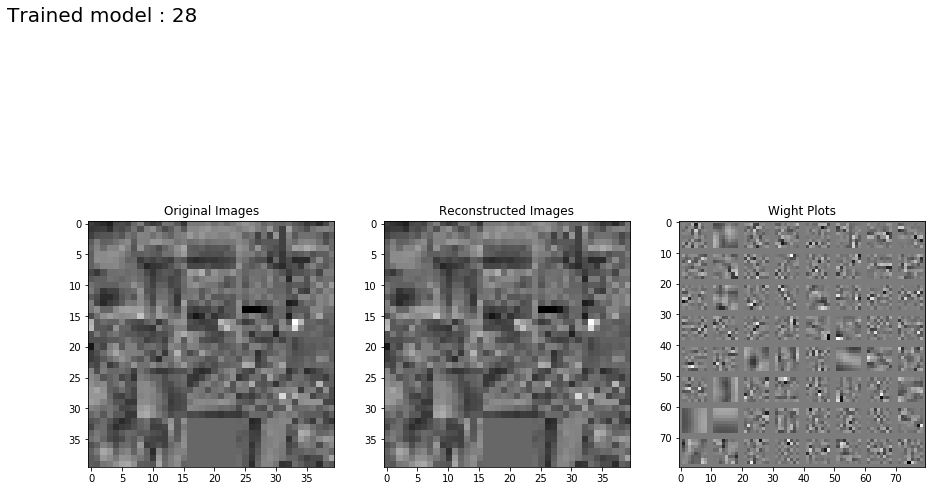

Step 1: Minibatch Loss: 0.015530 Error: 0.015451 Sparse: 0.000794
Step 100: Minibatch Loss: 0.015532 Error: 0.015467 Sparse: 0.000651
Step 200: Minibatch Loss: 0.015452 Error: 0.015389 Sparse: 0.000631
Step 300: Minibatch Loss: 0.015473 Error: 0.015405 Sparse: 0.000681
Step 400: Minibatch Loss: 0.015410 Error: 0.015342 Sparse: 0.000680
Step 500: Minibatch Loss: 0.015452 Error: 0.015389 Sparse: 0.000624
Step 600: Minibatch Loss: 0.015500 Error: 0.015436 Sparse: 0.000642
Step 700: Minibatch Loss: 0.015438 Error: 0.015374 Sparse: 0.000647
Step 800: Minibatch Loss: 0.015466 Error: 0.015405 Sparse: 0.000611
Step 900: Minibatch Loss: 0.015343 Error: 0.015280 Sparse: 0.000626
Step 1000: Minibatch Loss: 0.015488 Error: 0.015420 Sparse: 0.000676


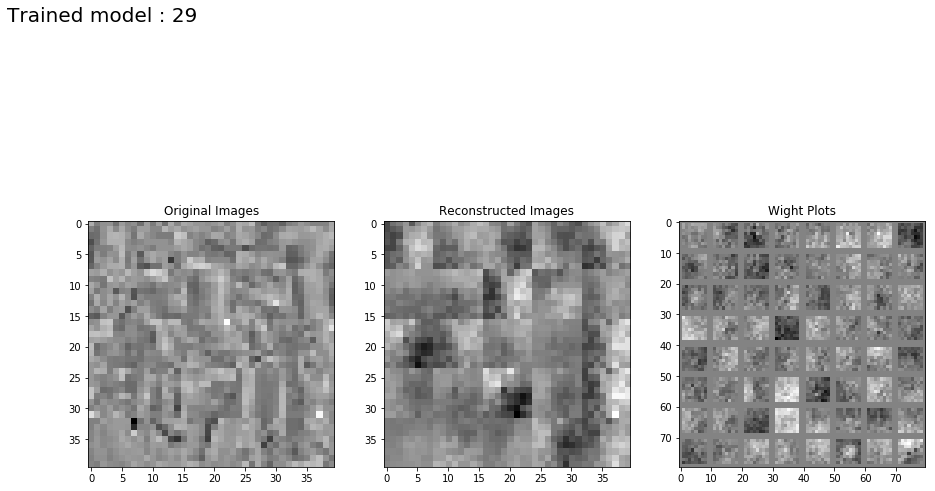

Step 1: Minibatch Loss: 0.016151 Error: 0.015373 Sparse: 0.000778
Step 100: Minibatch Loss: 0.016065 Error: 0.015389 Sparse: 0.000676
Step 200: Minibatch Loss: 0.015884 Error: 0.015280 Sparse: 0.000604
Step 300: Minibatch Loss: 0.016045 Error: 0.015405 Sparse: 0.000640
Step 400: Minibatch Loss: 0.016063 Error: 0.015468 Sparse: 0.000595
Step 500: Minibatch Loss: 0.016052 Error: 0.015483 Sparse: 0.000569
Step 600: Minibatch Loss: 0.016028 Error: 0.015389 Sparse: 0.000639
Step 700: Minibatch Loss: 0.015958 Error: 0.015358 Sparse: 0.000600
Step 800: Minibatch Loss: 0.015906 Error: 0.015374 Sparse: 0.000531
Step 900: Minibatch Loss: 0.015991 Error: 0.015374 Sparse: 0.000617
Step 1000: Minibatch Loss: 0.015947 Error: 0.015311 Sparse: 0.000636


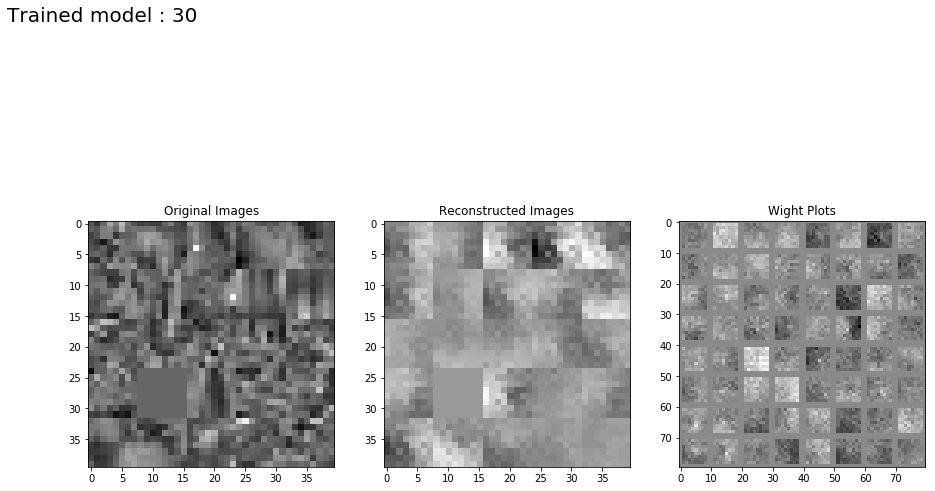

Step 1: Minibatch Loss: 0.015529 Error: 0.015529 Sparse: 0.000776
Step 100: Minibatch Loss: 0.001173 Error: 0.001163 Sparse: 0.094477
Step 200: Minibatch Loss: 0.000059 Error: 0.000049 Sparse: 0.099036
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098720
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099027
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099525
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099067
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098232
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098962
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098999
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098947
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098147
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099278
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098624
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

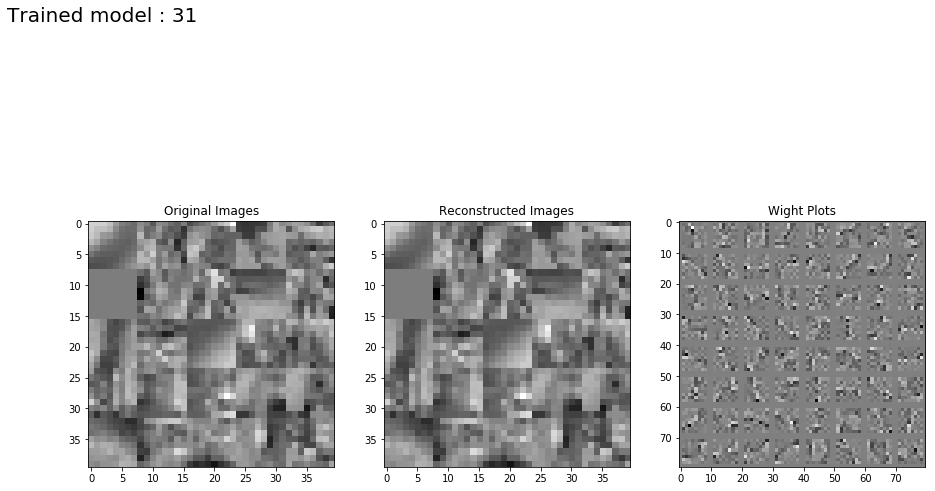

Step 1: Minibatch Loss: 0.015389 Error: 0.015389 Sparse: 0.000766
Step 100: Minibatch Loss: 0.001185 Error: 0.001090 Sparse: 0.095021
Step 200: Minibatch Loss: 0.000172 Error: 0.000074 Sparse: 0.098508
Step 300: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098500
Step 400: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098370
Step 500: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098886
Step 600: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098659
Step 700: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098535
Step 800: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098075
Step 900: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097718
Step 1000: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097149
Step 1100: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096512
Step 1200: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096065
Step 1300: Minibatch Loss: 0.000094 Error: 0.000000 Sparse: 0.094264
Step 1400: Minibatch Loss: 0.000093 Error: 0.0

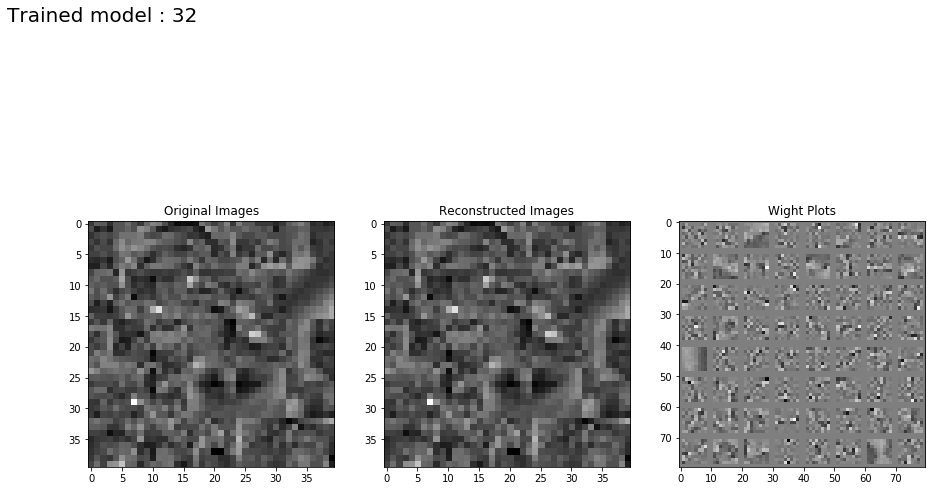

Step 1: Minibatch Loss: 0.015459 Error: 0.015451 Sparse: 0.000821
Step 100: Minibatch Loss: 0.002404 Error: 0.001484 Sparse: 0.092015
Step 200: Minibatch Loss: 0.001076 Error: 0.000115 Sparse: 0.096082
Step 300: Minibatch Loss: 0.000942 Error: 0.000004 Sparse: 0.093787
Step 400: Minibatch Loss: 0.000919 Error: 0.000004 Sparse: 0.091458
Step 500: Minibatch Loss: 0.000886 Error: 0.000004 Sparse: 0.088219
Step 600: Minibatch Loss: 0.000873 Error: 0.000004 Sparse: 0.086909
Step 700: Minibatch Loss: 0.000856 Error: 0.000004 Sparse: 0.085256
Step 800: Minibatch Loss: 0.000849 Error: 0.000004 Sparse: 0.084528
Step 900: Minibatch Loss: 0.000832 Error: 0.000004 Sparse: 0.082836
Step 1000: Minibatch Loss: 0.000827 Error: 0.000004 Sparse: 0.082282
Step 1100: Minibatch Loss: 0.000829 Error: 0.000004 Sparse: 0.082551
Step 1200: Minibatch Loss: 0.000826 Error: 0.000004 Sparse: 0.082253
Step 1300: Minibatch Loss: 0.000812 Error: 0.000004 Sparse: 0.080854
Step 1400: Minibatch Loss: 0.000809 Error: 0.0

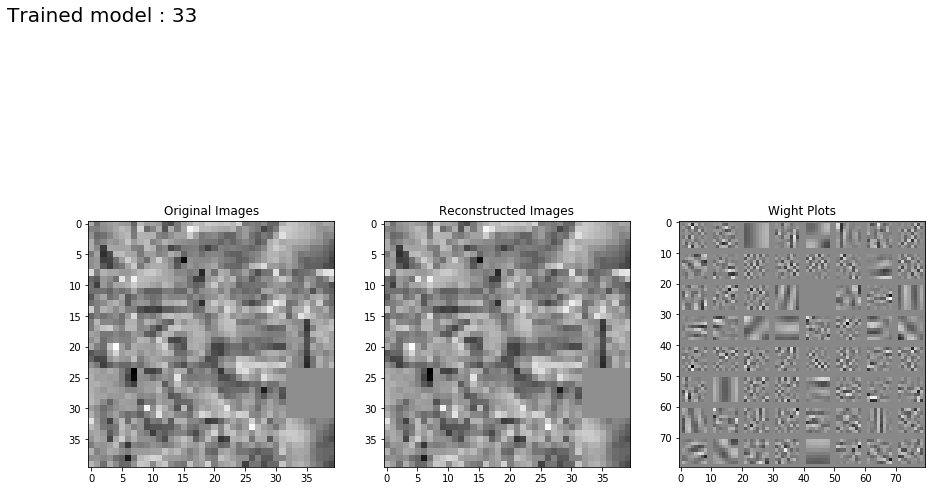

Step 1: Minibatch Loss: 0.015530 Error: 0.015451 Sparse: 0.000786
Step 100: Minibatch Loss: 0.015419 Error: 0.015342 Sparse: 0.000772
Step 200: Minibatch Loss: 0.015491 Error: 0.015420 Sparse: 0.000711
Step 300: Minibatch Loss: 0.015482 Error: 0.015421 Sparse: 0.000618
Step 400: Minibatch Loss: 0.015521 Error: 0.015452 Sparse: 0.000694
Step 500: Minibatch Loss: 0.015531 Error: 0.015467 Sparse: 0.000638
Step 600: Minibatch Loss: 0.015512 Error: 0.015452 Sparse: 0.000604
Step 700: Minibatch Loss: 0.015499 Error: 0.015436 Sparse: 0.000630
Step 800: Minibatch Loss: 0.015412 Error: 0.015342 Sparse: 0.000702
Step 900: Minibatch Loss: 0.015471 Error: 0.015405 Sparse: 0.000665
Step 1000: Minibatch Loss: 0.015519 Error: 0.015451 Sparse: 0.000679
Step 1100: Minibatch Loss: 0.015429 Error: 0.015358 Sparse: 0.000710
Step 1200: Minibatch Loss: 0.015535 Error: 0.015467 Sparse: 0.000677
Step 1300: Minibatch Loss: 0.015585 Error: 0.015514 Sparse: 0.000714
Step 1400: Minibatch Loss: 0.015422 Error: 0.0

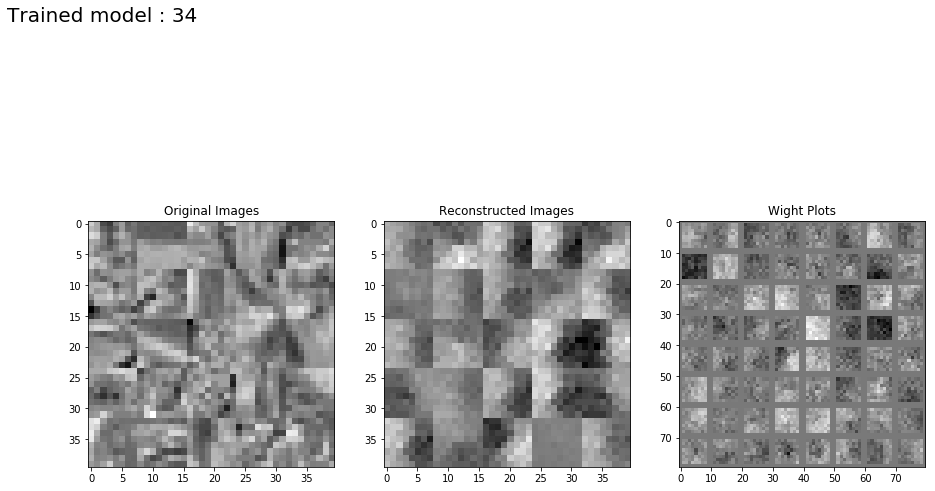

Step 1: Minibatch Loss: 0.016102 Error: 0.015326 Sparse: 0.000775
Step 100: Minibatch Loss: 0.016143 Error: 0.015436 Sparse: 0.000707
Step 200: Minibatch Loss: 0.015972 Error: 0.015327 Sparse: 0.000645
Step 300: Minibatch Loss: 0.016113 Error: 0.015467 Sparse: 0.000646
Step 400: Minibatch Loss: 0.016027 Error: 0.015389 Sparse: 0.000638
Step 500: Minibatch Loss: 0.015984 Error: 0.015389 Sparse: 0.000595
Step 600: Minibatch Loss: 0.016042 Error: 0.015421 Sparse: 0.000622
Step 700: Minibatch Loss: 0.015971 Error: 0.015311 Sparse: 0.000660
Step 800: Minibatch Loss: 0.015903 Error: 0.015327 Sparse: 0.000576
Step 900: Minibatch Loss: 0.016032 Error: 0.015436 Sparse: 0.000596
Step 1000: Minibatch Loss: 0.016108 Error: 0.015467 Sparse: 0.000640
Step 1100: Minibatch Loss: 0.016103 Error: 0.015483 Sparse: 0.000620
Step 1200: Minibatch Loss: 0.016049 Error: 0.015389 Sparse: 0.000660
Step 1300: Minibatch Loss: 0.016072 Error: 0.015452 Sparse: 0.000621
Step 1400: Minibatch Loss: 0.016036 Error: 0.0

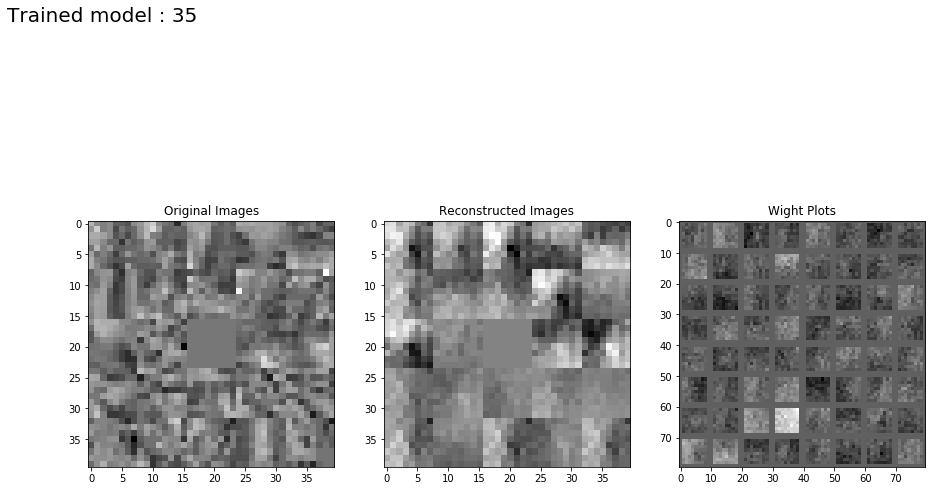

Step 1: Minibatch Loss: 0.015248 Error: 0.015248 Sparse: 0.000761
Step 100: Minibatch Loss: 0.001064 Error: 0.001054 Sparse: 0.094917
Step 200: Minibatch Loss: 0.000040 Error: 0.000030 Sparse: 0.098597
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099061
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098508
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098801
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097983
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098947
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099273
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098264
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099147
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098916
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097778
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098590
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

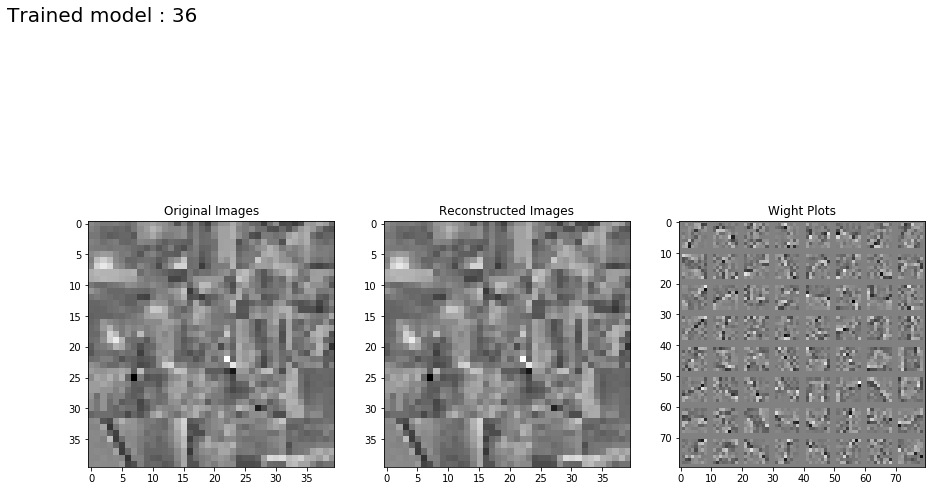

Step 1: Minibatch Loss: 0.015405 Error: 0.015404 Sparse: 0.000815
Step 100: Minibatch Loss: 0.001048 Error: 0.000952 Sparse: 0.095208
Step 200: Minibatch Loss: 0.000125 Error: 0.000026 Sparse: 0.098792
Step 300: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.099044
Step 400: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.099083
Step 500: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097850
Step 600: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098317
Step 700: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097441
Step 800: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097810
Step 900: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097900
Step 1000: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097466
Step 1100: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.095908
Step 1200: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096069
Step 1300: Minibatch Loss: 0.000094 Error: 0.000000 Sparse: 0.094182
Step 1400: Minibatch Loss: 0.000094 Error: 0.0

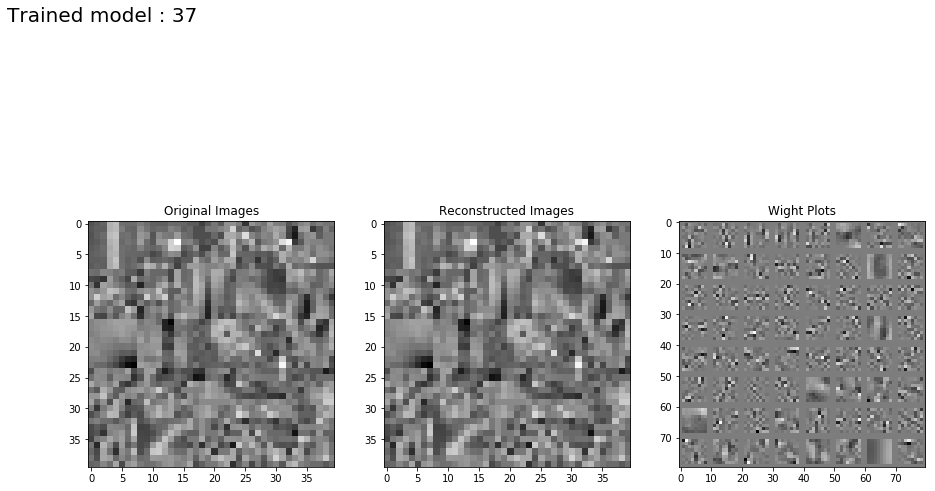

Step 1: Minibatch Loss: 0.015459 Error: 0.015451 Sparse: 0.000807
Step 100: Minibatch Loss: 0.002367 Error: 0.001452 Sparse: 0.091466
Step 200: Minibatch Loss: 0.001061 Error: 0.000105 Sparse: 0.095642
Step 300: Minibatch Loss: 0.000936 Error: 0.000004 Sparse: 0.093234
Step 400: Minibatch Loss: 0.000911 Error: 0.000004 Sparse: 0.090728
Step 500: Minibatch Loss: 0.000893 Error: 0.000004 Sparse: 0.088937
Step 600: Minibatch Loss: 0.000873 Error: 0.000004 Sparse: 0.086870
Step 700: Minibatch Loss: 0.000854 Error: 0.000004 Sparse: 0.084976
Step 800: Minibatch Loss: 0.000843 Error: 0.000004 Sparse: 0.083900
Step 900: Minibatch Loss: 0.000831 Error: 0.000004 Sparse: 0.082746
Step 1000: Minibatch Loss: 0.000833 Error: 0.000004 Sparse: 0.082889
Step 1100: Minibatch Loss: 0.000829 Error: 0.000004 Sparse: 0.082528
Step 1200: Minibatch Loss: 0.000818 Error: 0.000004 Sparse: 0.081424
Step 1300: Minibatch Loss: 0.000819 Error: 0.000004 Sparse: 0.081575
Step 1400: Minibatch Loss: 0.000824 Error: 0.0

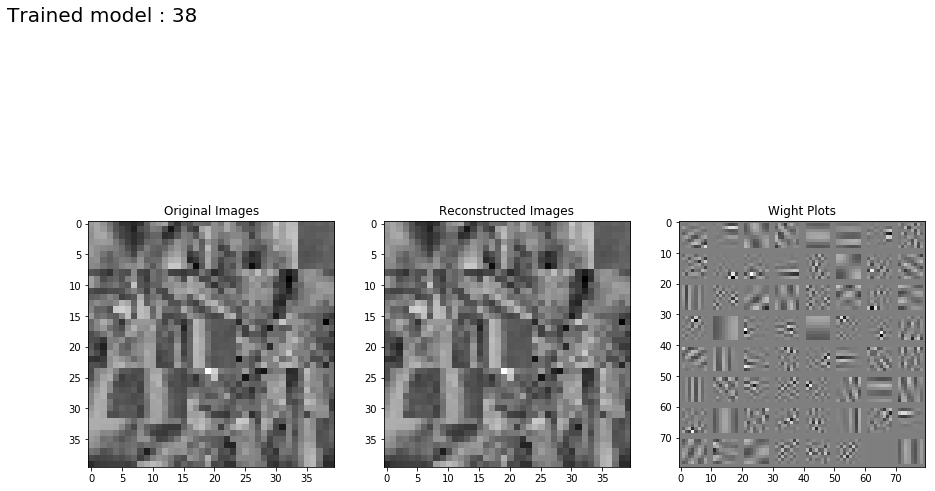

Step 1: Minibatch Loss: 0.015437 Error: 0.015357 Sparse: 0.000801
Step 100: Minibatch Loss: 0.015430 Error: 0.015357 Sparse: 0.000730
Step 200: Minibatch Loss: 0.015504 Error: 0.015436 Sparse: 0.000677
Step 300: Minibatch Loss: 0.015439 Error: 0.015373 Sparse: 0.000657
Step 400: Minibatch Loss: 0.015379 Error: 0.015311 Sparse: 0.000677
Step 500: Minibatch Loss: 0.015526 Error: 0.015468 Sparse: 0.000582
Step 600: Minibatch Loss: 0.015469 Error: 0.015405 Sparse: 0.000641
Step 700: Minibatch Loss: 0.015498 Error: 0.015436 Sparse: 0.000618
Step 800: Minibatch Loss: 0.015518 Error: 0.015452 Sparse: 0.000666
Step 900: Minibatch Loss: 0.015547 Error: 0.015483 Sparse: 0.000637
Step 1000: Minibatch Loss: 0.015457 Error: 0.015389 Sparse: 0.000680
Step 1100: Minibatch Loss: 0.015333 Error: 0.015264 Sparse: 0.000691
Step 1200: Minibatch Loss: 0.015454 Error: 0.015389 Sparse: 0.000645
Step 1300: Minibatch Loss: 0.015531 Error: 0.015467 Sparse: 0.000631
Step 1400: Minibatch Loss: 0.015516 Error: 0.0

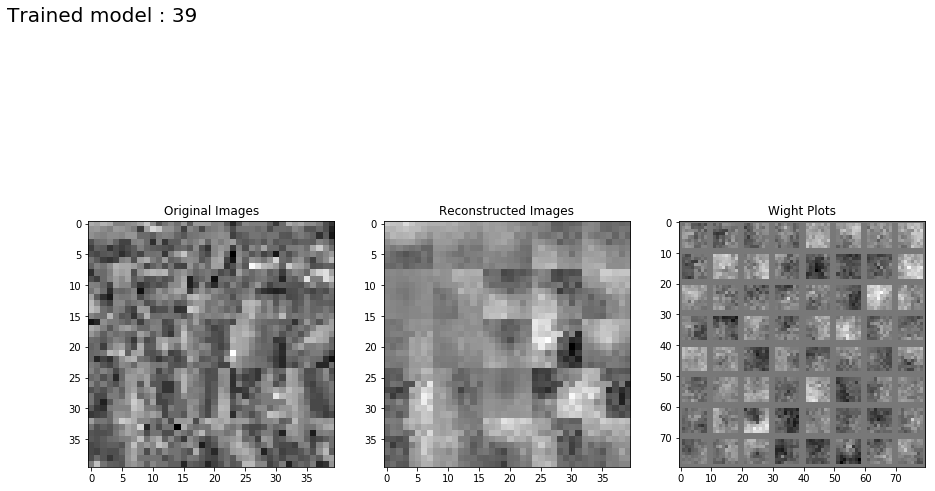

Step 1: Minibatch Loss: 0.016187 Error: 0.015404 Sparse: 0.000783
Step 100: Minibatch Loss: 0.016157 Error: 0.015436 Sparse: 0.000721
Step 200: Minibatch Loss: 0.016096 Error: 0.015436 Sparse: 0.000660
Step 300: Minibatch Loss: 0.015983 Error: 0.015358 Sparse: 0.000625
Step 400: Minibatch Loss: 0.016030 Error: 0.015374 Sparse: 0.000657
Step 500: Minibatch Loss: 0.015992 Error: 0.015405 Sparse: 0.000586
Step 600: Minibatch Loss: 0.015991 Error: 0.015436 Sparse: 0.000555
Step 700: Minibatch Loss: 0.016116 Error: 0.015483 Sparse: 0.000633
Step 800: Minibatch Loss: 0.016036 Error: 0.015436 Sparse: 0.000599
Step 900: Minibatch Loss: 0.016041 Error: 0.015405 Sparse: 0.000636
Step 1000: Minibatch Loss: 0.015989 Error: 0.015389 Sparse: 0.000600
Step 1100: Minibatch Loss: 0.016027 Error: 0.015436 Sparse: 0.000591
Step 1200: Minibatch Loss: 0.015978 Error: 0.015389 Sparse: 0.000589
Step 1300: Minibatch Loss: 0.015952 Error: 0.015374 Sparse: 0.000578
Step 1400: Minibatch Loss: 0.016109 Error: 0.0

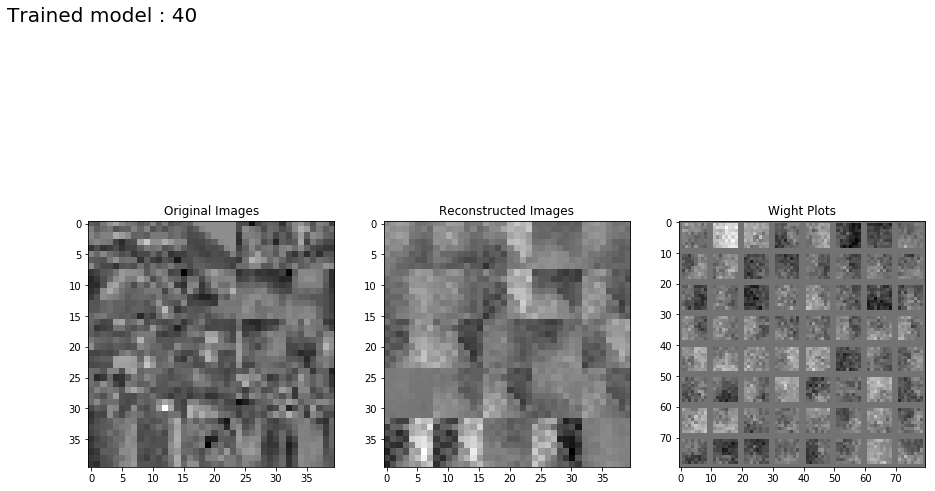

Step 1: Minibatch Loss: 0.015529 Error: 0.015529 Sparse: 0.000810
Step 100: Minibatch Loss: 0.001285 Error: 0.001276 Sparse: 0.093492
Step 200: Minibatch Loss: 0.000066 Error: 0.000057 Sparse: 0.098263
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098815
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098553
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098240
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098308
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099711
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098685
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098533
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098619
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098785
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098349
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098528
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

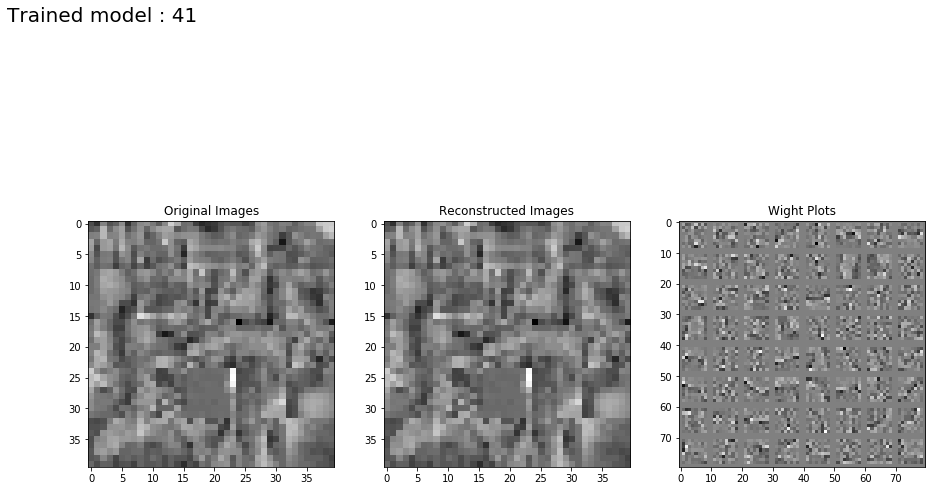

Step 1: Minibatch Loss: 0.015436 Error: 0.015436 Sparse: 0.000775
Step 100: Minibatch Loss: 0.001043 Error: 0.000946 Sparse: 0.096331
Step 200: Minibatch Loss: 0.000116 Error: 0.000017 Sparse: 0.098911
Step 300: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098906
Step 400: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098741
Step 500: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098500
Step 600: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098043
Step 700: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098393
Step 800: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097414
Step 900: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097028
Step 1000: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.095837
Step 1100: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.095867
Step 1200: Minibatch Loss: 0.000094 Error: 0.000000 Sparse: 0.094311
Step 1300: Minibatch Loss: 0.000094 Error: 0.000000 Sparse: 0.094054
Step 1400: Minibatch Loss: 0.000092 Error: 0.0

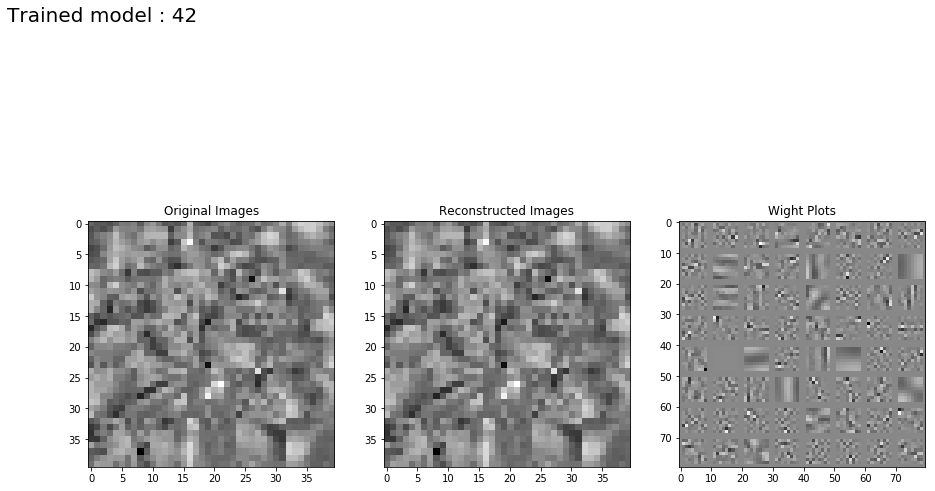

Step 1: Minibatch Loss: 0.015397 Error: 0.015389 Sparse: 0.000790
Step 100: Minibatch Loss: 0.002167 Error: 0.001238 Sparse: 0.092878
Step 200: Minibatch Loss: 0.001075 Error: 0.000119 Sparse: 0.095524
Step 300: Minibatch Loss: 0.000946 Error: 0.000004 Sparse: 0.094161
Step 400: Minibatch Loss: 0.000917 Error: 0.000004 Sparse: 0.091298
Step 500: Minibatch Loss: 0.000895 Error: 0.000004 Sparse: 0.089083
Step 600: Minibatch Loss: 0.000877 Error: 0.000004 Sparse: 0.087310
Step 700: Minibatch Loss: 0.000867 Error: 0.000004 Sparse: 0.086326
Step 800: Minibatch Loss: 0.000845 Error: 0.000004 Sparse: 0.084097
Step 900: Minibatch Loss: 0.000841 Error: 0.000004 Sparse: 0.083682
Step 1000: Minibatch Loss: 0.000834 Error: 0.000004 Sparse: 0.082978
Step 1100: Minibatch Loss: 0.000813 Error: 0.000004 Sparse: 0.080979
Step 1200: Minibatch Loss: 0.000824 Error: 0.000004 Sparse: 0.082036
Step 1300: Minibatch Loss: 0.000814 Error: 0.000004 Sparse: 0.081046
Step 1400: Minibatch Loss: 0.000808 Error: 0.0

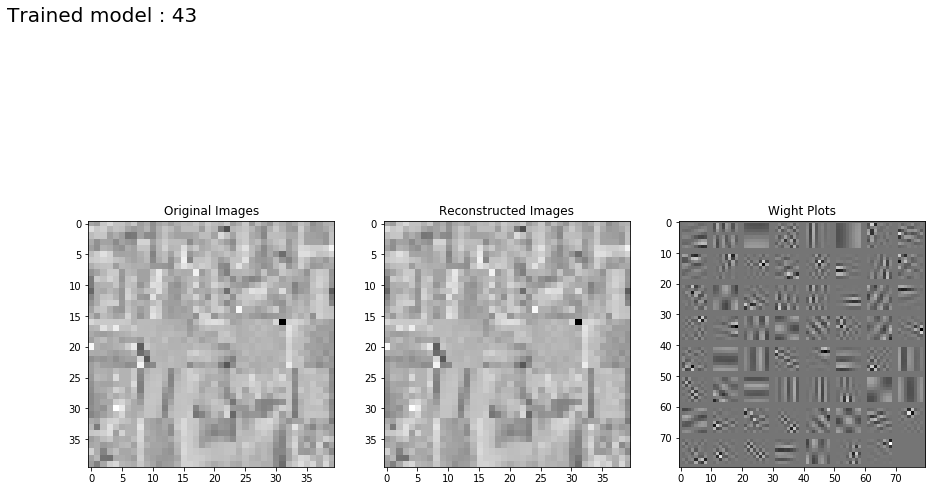

Step 1: Minibatch Loss: 0.015500 Error: 0.015420 Sparse: 0.000805
Step 100: Minibatch Loss: 0.015541 Error: 0.015467 Sparse: 0.000745
Step 200: Minibatch Loss: 0.015552 Error: 0.015483 Sparse: 0.000694
Step 300: Minibatch Loss: 0.015518 Error: 0.015452 Sparse: 0.000661
Step 400: Minibatch Loss: 0.015595 Error: 0.015530 Sparse: 0.000656
Step 500: Minibatch Loss: 0.015442 Error: 0.015373 Sparse: 0.000683
Step 600: Minibatch Loss: 0.015468 Error: 0.015405 Sparse: 0.000631
Step 700: Minibatch Loss: 0.015407 Error: 0.015342 Sparse: 0.000645
Step 800: Minibatch Loss: 0.015456 Error: 0.015389 Sparse: 0.000666
Step 900: Minibatch Loss: 0.015455 Error: 0.015389 Sparse: 0.000657
Step 1000: Minibatch Loss: 0.015485 Error: 0.015420 Sparse: 0.000650
Step 1100: Minibatch Loss: 0.015498 Error: 0.015436 Sparse: 0.000620
Step 1200: Minibatch Loss: 0.015450 Error: 0.015389 Sparse: 0.000610
Step 1300: Minibatch Loss: 0.015437 Error: 0.015374 Sparse: 0.000630
Step 1400: Minibatch Loss: 0.015427 Error: 0.0

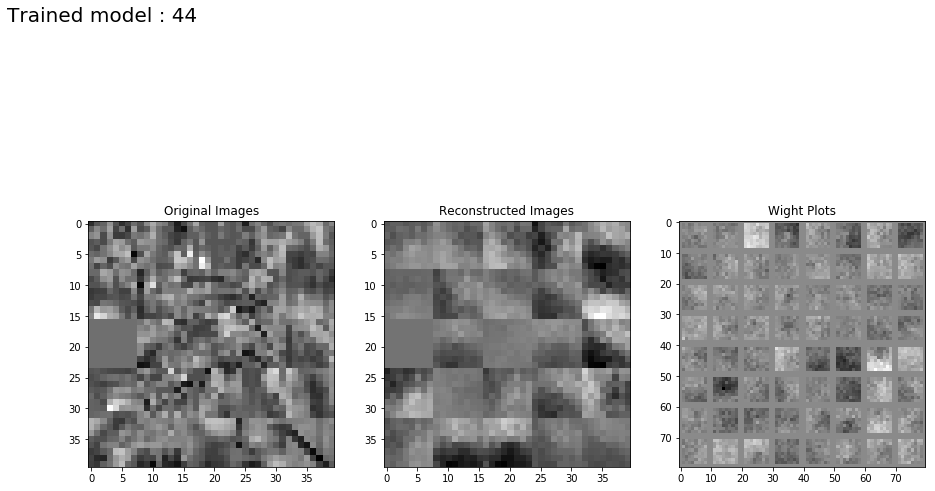

Step 1: Minibatch Loss: 0.016231 Error: 0.015451 Sparse: 0.000780
Step 100: Minibatch Loss: 0.016061 Error: 0.015389 Sparse: 0.000672
Step 200: Minibatch Loss: 0.016017 Error: 0.015358 Sparse: 0.000660
Step 300: Minibatch Loss: 0.015990 Error: 0.015342 Sparse: 0.000648
Step 400: Minibatch Loss: 0.016039 Error: 0.015468 Sparse: 0.000571
Step 500: Minibatch Loss: 0.016018 Error: 0.015405 Sparse: 0.000613
Step 600: Minibatch Loss: 0.016060 Error: 0.015420 Sparse: 0.000640
Step 700: Minibatch Loss: 0.016184 Error: 0.015530 Sparse: 0.000654
Step 800: Minibatch Loss: 0.015932 Error: 0.015327 Sparse: 0.000605
Step 900: Minibatch Loss: 0.016088 Error: 0.015467 Sparse: 0.000620
Step 1000: Minibatch Loss: 0.015939 Error: 0.015343 Sparse: 0.000596
Step 1100: Minibatch Loss: 0.016039 Error: 0.015389 Sparse: 0.000650
Step 1200: Minibatch Loss: 0.016070 Error: 0.015452 Sparse: 0.000618
Step 1300: Minibatch Loss: 0.016063 Error: 0.015405 Sparse: 0.000658
Step 1400: Minibatch Loss: 0.016082 Error: 0.0

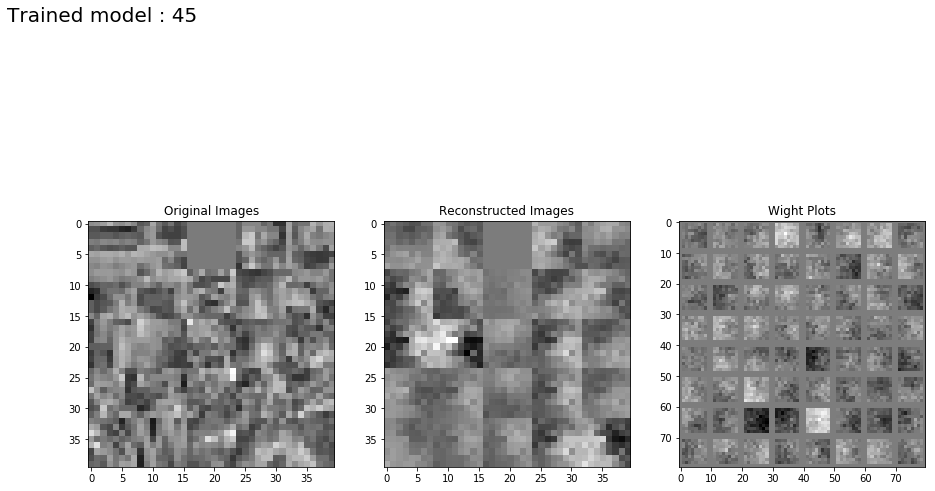

Step 1: Minibatch Loss: 0.015389 Error: 0.015389 Sparse: 0.000757
Step 100: Minibatch Loss: 0.000924 Error: 0.000914 Sparse: 0.095189
Step 200: Minibatch Loss: 0.000060 Error: 0.000050 Sparse: 0.099269
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098238
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098290
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098820
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098559
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098869
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099065
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098743
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098795
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098918
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099345
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098929
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

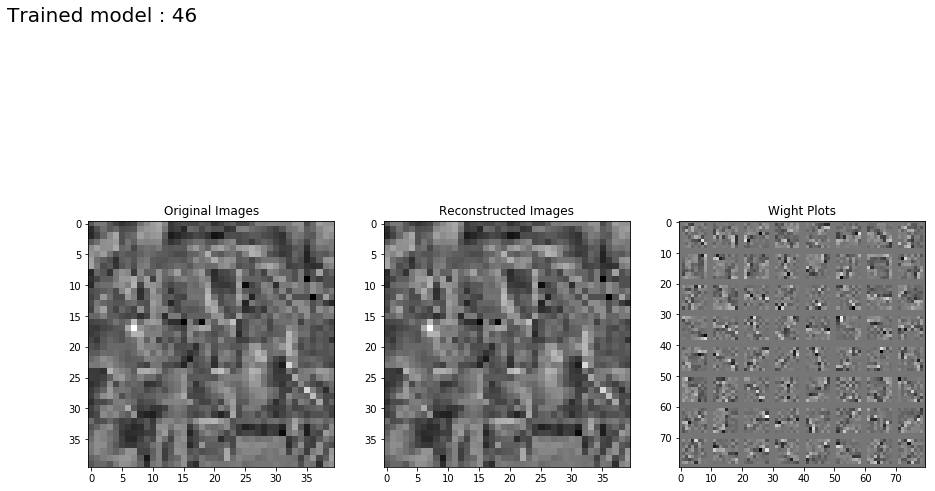

Step 1: Minibatch Loss: 0.015374 Error: 0.015373 Sparse: 0.000797
Step 100: Minibatch Loss: 0.001066 Error: 0.000971 Sparse: 0.095119
Step 200: Minibatch Loss: 0.000106 Error: 0.000007 Sparse: 0.098964
Step 300: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097641
Step 400: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098707
Step 500: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.099161
Step 600: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098065
Step 700: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098526
Step 800: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097824
Step 900: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098055
Step 1000: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097522
Step 1100: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096162
Step 1200: Minibatch Loss: 0.000095 Error: 0.000000 Sparse: 0.095429
Step 1300: Minibatch Loss: 0.000095 Error: 0.000000 Sparse: 0.095026
Step 1400: Minibatch Loss: 0.000094 Error: 0.0

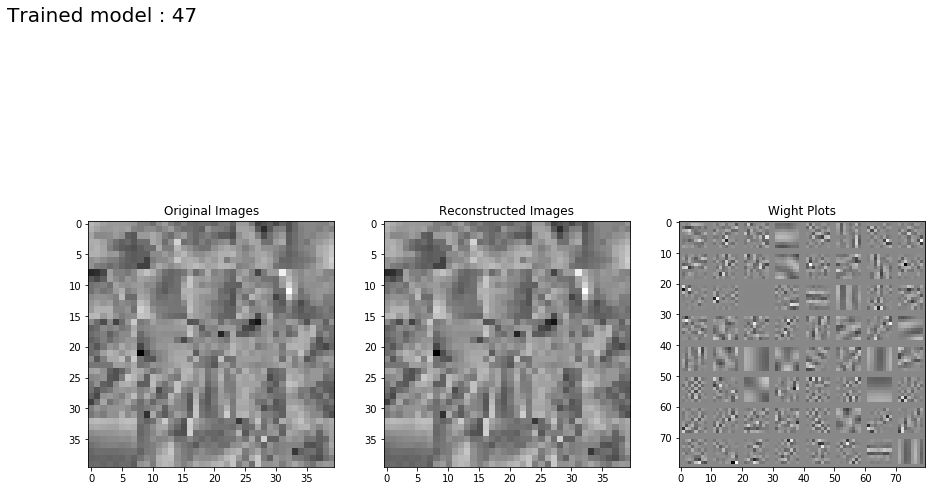

Step 1: Minibatch Loss: 0.015443 Error: 0.015435 Sparse: 0.000792
Step 100: Minibatch Loss: 0.002242 Error: 0.001325 Sparse: 0.091700
Step 200: Minibatch Loss: 0.001038 Error: 0.000086 Sparse: 0.095173
Step 300: Minibatch Loss: 0.000927 Error: 0.000004 Sparse: 0.092327
Step 400: Minibatch Loss: 0.000895 Error: 0.000004 Sparse: 0.089103
Step 500: Minibatch Loss: 0.000879 Error: 0.000004 Sparse: 0.087506
Step 600: Minibatch Loss: 0.000866 Error: 0.000004 Sparse: 0.086246
Step 700: Minibatch Loss: 0.000847 Error: 0.000004 Sparse: 0.084310
Step 800: Minibatch Loss: 0.000847 Error: 0.000004 Sparse: 0.084356
Step 900: Minibatch Loss: 0.000838 Error: 0.000004 Sparse: 0.083433
Step 1000: Minibatch Loss: 0.000830 Error: 0.000004 Sparse: 0.082642
Step 1100: Minibatch Loss: 0.000820 Error: 0.000004 Sparse: 0.081580
Step 1200: Minibatch Loss: 0.000819 Error: 0.000004 Sparse: 0.081486
Step 1300: Minibatch Loss: 0.000812 Error: 0.000004 Sparse: 0.080789
Step 1400: Minibatch Loss: 0.000808 Error: 0.0

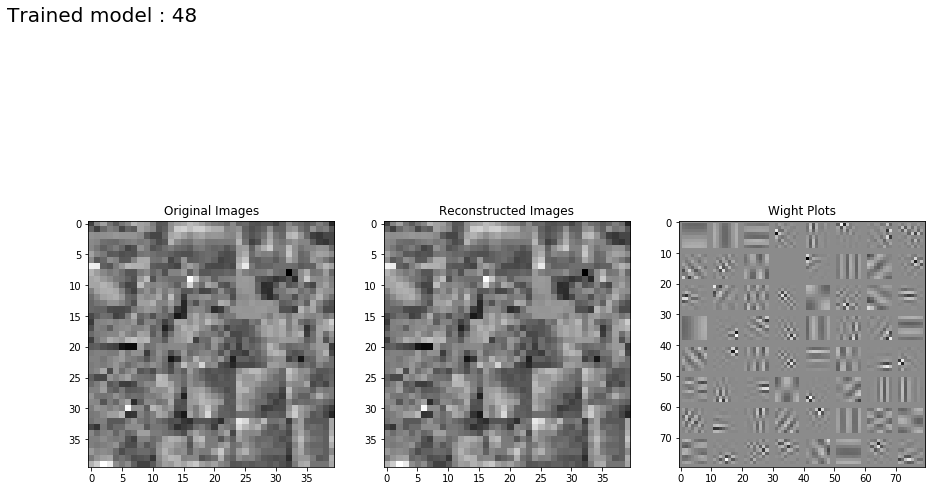

Step 1: Minibatch Loss: 0.015530 Error: 0.015451 Sparse: 0.000793
Step 100: Minibatch Loss: 0.015531 Error: 0.015451 Sparse: 0.000803
Step 200: Minibatch Loss: 0.015472 Error: 0.015405 Sparse: 0.000675
Step 300: Minibatch Loss: 0.015491 Error: 0.015420 Sparse: 0.000705
Step 400: Minibatch Loss: 0.015514 Error: 0.015452 Sparse: 0.000625
Step 500: Minibatch Loss: 0.015441 Error: 0.015373 Sparse: 0.000676
Step 600: Minibatch Loss: 0.015528 Error: 0.015468 Sparse: 0.000609
Step 700: Minibatch Loss: 0.015555 Error: 0.015483 Sparse: 0.000726
Step 800: Minibatch Loss: 0.015442 Error: 0.015373 Sparse: 0.000687
Step 900: Minibatch Loss: 0.015483 Error: 0.015421 Sparse: 0.000620
Step 1000: Minibatch Loss: 0.015458 Error: 0.015389 Sparse: 0.000691
Step 1100: Minibatch Loss: 0.015499 Error: 0.015436 Sparse: 0.000629
Step 1200: Minibatch Loss: 0.015523 Error: 0.015451 Sparse: 0.000716
Step 1300: Minibatch Loss: 0.015435 Error: 0.015374 Sparse: 0.000615
Step 1400: Minibatch Loss: 0.015449 Error: 0.0

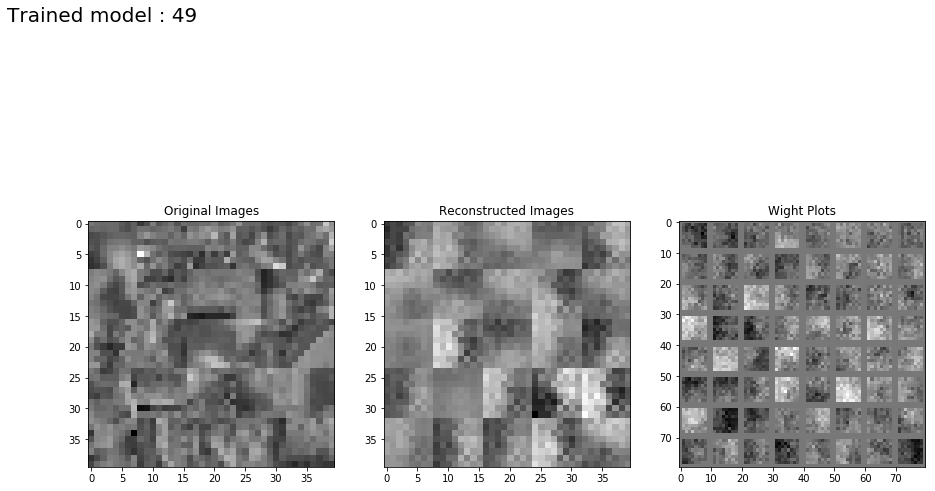

Step 1: Minibatch Loss: 0.016194 Error: 0.015420 Sparse: 0.000774
Step 100: Minibatch Loss: 0.016026 Error: 0.015342 Sparse: 0.000684
Step 200: Minibatch Loss: 0.015931 Error: 0.015296 Sparse: 0.000635
Step 300: Minibatch Loss: 0.016025 Error: 0.015421 Sparse: 0.000605
Step 400: Minibatch Loss: 0.015965 Error: 0.015327 Sparse: 0.000638
Step 500: Minibatch Loss: 0.016117 Error: 0.015452 Sparse: 0.000665
Step 600: Minibatch Loss: 0.016136 Error: 0.015467 Sparse: 0.000669
Step 700: Minibatch Loss: 0.016047 Error: 0.015436 Sparse: 0.000610
Step 800: Minibatch Loss: 0.016076 Error: 0.015452 Sparse: 0.000625
Step 900: Minibatch Loss: 0.015994 Error: 0.015374 Sparse: 0.000620
Step 1000: Minibatch Loss: 0.016067 Error: 0.015420 Sparse: 0.000646
Step 1100: Minibatch Loss: 0.016136 Error: 0.015452 Sparse: 0.000685
Step 1200: Minibatch Loss: 0.016046 Error: 0.015421 Sparse: 0.000625
Step 1300: Minibatch Loss: 0.016036 Error: 0.015374 Sparse: 0.000662
Step 1400: Minibatch Loss: 0.016092 Error: 0.0

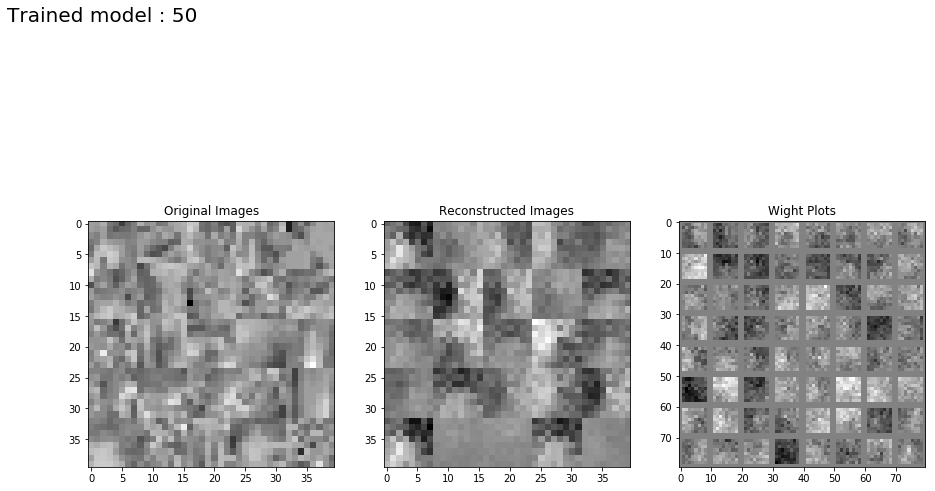

Step 1: Minibatch Loss: 0.015467 Error: 0.015467 Sparse: 0.000797
Step 100: Minibatch Loss: 0.000267 Error: 0.000257 Sparse: 0.096968
Step 200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098385
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097872
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098304
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097918
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096875
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097226
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097458
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097517
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096250


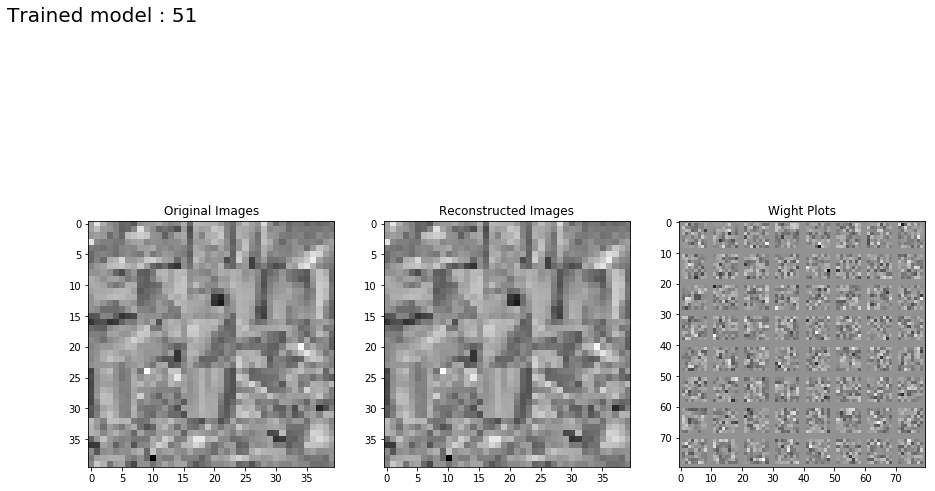

Step 1: Minibatch Loss: 0.015499 Error: 0.015498 Sparse: 0.000796
Step 100: Minibatch Loss: 0.000347 Error: 0.000250 Sparse: 0.097027
Step 200: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097761
Step 300: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096902
Step 400: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096825
Step 500: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096489
Step 600: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.095522
Step 700: Minibatch Loss: 0.000094 Error: 0.000000 Sparse: 0.093626
Step 800: Minibatch Loss: 0.000093 Error: 0.000000 Sparse: 0.092905
Step 900: Minibatch Loss: 0.000091 Error: 0.000000 Sparse: 0.091439
Step 1000: Minibatch Loss: 0.000091 Error: 0.000000 Sparse: 0.090690


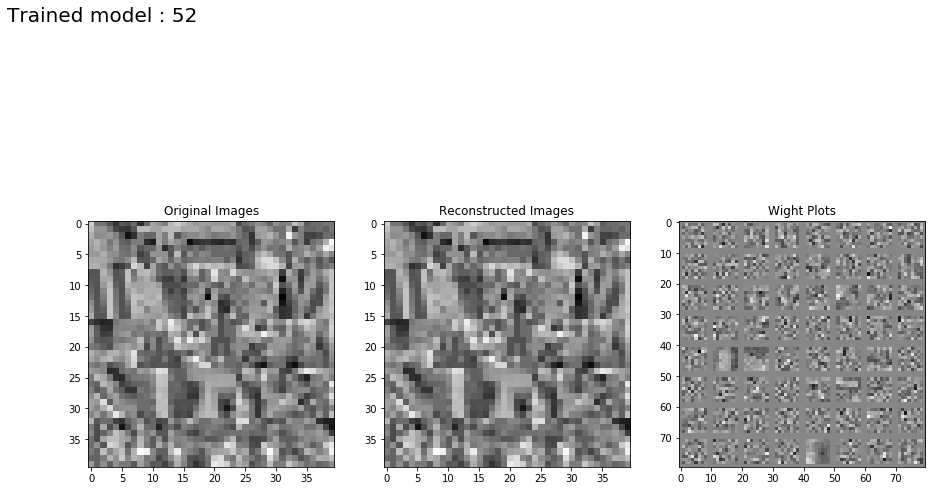

Step 1: Minibatch Loss: 0.015318 Error: 0.015311 Sparse: 0.000762
Step 100: Minibatch Loss: 0.000968 Error: 0.000047 Sparse: 0.092134
Step 200: Minibatch Loss: 0.000877 Error: 0.000004 Sparse: 0.087337
Step 300: Minibatch Loss: 0.000852 Error: 0.000004 Sparse: 0.084860
Step 400: Minibatch Loss: 0.000828 Error: 0.000004 Sparse: 0.082416
Step 500: Minibatch Loss: 0.000825 Error: 0.000004 Sparse: 0.082093
Step 600: Minibatch Loss: 0.000818 Error: 0.000004 Sparse: 0.081430
Step 700: Minibatch Loss: 0.000806 Error: 0.000004 Sparse: 0.080245
Step 800: Minibatch Loss: 0.000793 Error: 0.000004 Sparse: 0.078899
Step 900: Minibatch Loss: 0.000811 Error: 0.000004 Sparse: 0.080642
Step 1000: Minibatch Loss: 0.000799 Error: 0.000004 Sparse: 0.079530


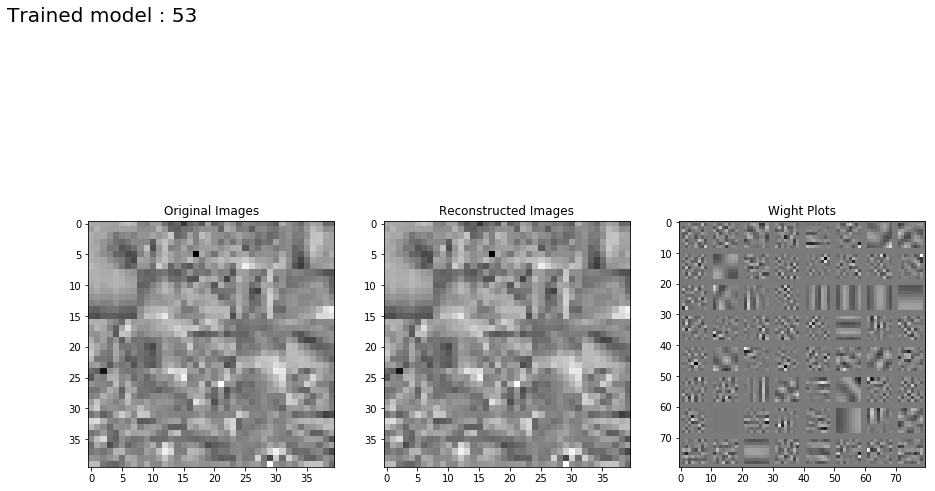

Step 1: Minibatch Loss: 0.015480 Error: 0.015404 Sparse: 0.000758
Step 100: Minibatch Loss: 0.007804 Error: 0.000508 Sparse: 0.072954
Step 200: Minibatch Loss: 0.007664 Error: 0.000514 Sparse: 0.071507
Step 300: Minibatch Loss: 0.007607 Error: 0.000502 Sparse: 0.071053
Step 400: Minibatch Loss: 0.007581 Error: 0.000519 Sparse: 0.070611
Step 500: Minibatch Loss: 0.007520 Error: 0.000505 Sparse: 0.070145
Step 600: Minibatch Loss: 0.007557 Error: 0.000514 Sparse: 0.070433
Step 700: Minibatch Loss: 0.007640 Error: 0.000527 Sparse: 0.071127
Step 800: Minibatch Loss: 0.007560 Error: 0.000521 Sparse: 0.070381
Step 900: Minibatch Loss: 0.007680 Error: 0.000548 Sparse: 0.071316
Step 1000: Minibatch Loss: 0.007590 Error: 0.000526 Sparse: 0.070633


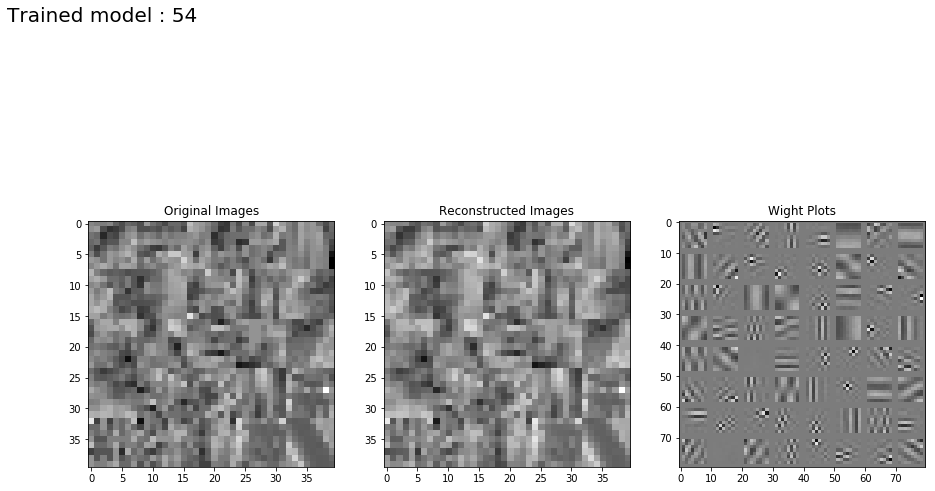

Step 1: Minibatch Loss: 0.016239 Error: 0.015451 Sparse: 0.000788
Step 100: Minibatch Loss: 0.022471 Error: 0.015313 Sparse: 0.007159
Step 200: Minibatch Loss: 0.021846 Error: 0.015357 Sparse: 0.006490
Step 300: Minibatch Loss: 0.021813 Error: 0.015251 Sparse: 0.006562
Step 400: Minibatch Loss: 0.021975 Error: 0.015380 Sparse: 0.006595
Step 500: Minibatch Loss: 0.021961 Error: 0.015281 Sparse: 0.006680
Step 600: Minibatch Loss: 0.022140 Error: 0.015277 Sparse: 0.006863
Step 700: Minibatch Loss: 0.021864 Error: 0.015312 Sparse: 0.006552
Step 800: Minibatch Loss: 0.021523 Error: 0.015339 Sparse: 0.006184
Step 900: Minibatch Loss: 0.022830 Error: 0.015259 Sparse: 0.007571
Step 1000: Minibatch Loss: 0.021464 Error: 0.015312 Sparse: 0.006152


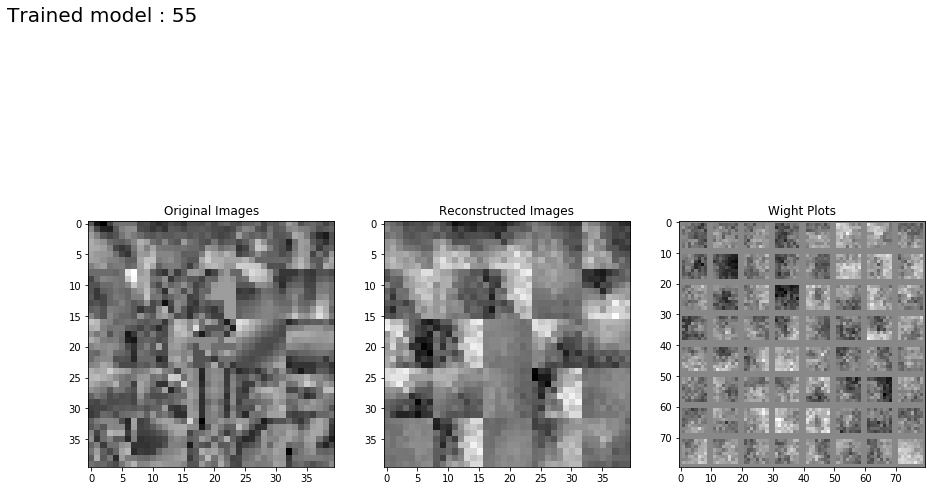

Step 1: Minibatch Loss: 0.015436 Error: 0.015436 Sparse: 0.000784
Step 100: Minibatch Loss: 0.000344 Error: 0.000334 Sparse: 0.097390
Step 200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098794
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098431
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097566
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098486
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098472
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097286
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098205
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098684
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097296
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097869
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097132
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097315
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

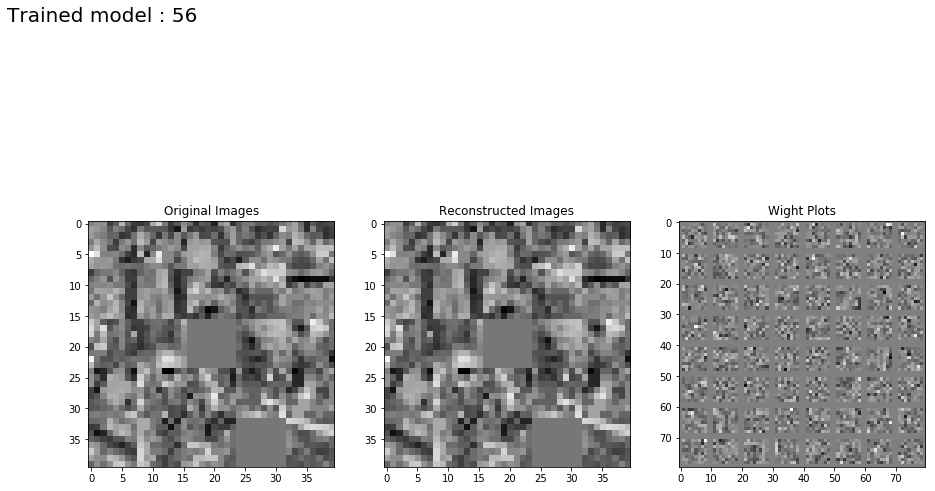

Step 1: Minibatch Loss: 0.015343 Error: 0.015342 Sparse: 0.000794
Step 100: Minibatch Loss: 0.000183 Error: 0.000085 Sparse: 0.098266
Step 200: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097137
Step 300: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.095699
Step 400: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.095682
Step 500: Minibatch Loss: 0.000094 Error: 0.000000 Sparse: 0.094175
Step 600: Minibatch Loss: 0.000093 Error: 0.000000 Sparse: 0.093256
Step 700: Minibatch Loss: 0.000091 Error: 0.000000 Sparse: 0.091180
Step 800: Minibatch Loss: 0.000090 Error: 0.000000 Sparse: 0.090438
Step 900: Minibatch Loss: 0.000089 Error: 0.000000 Sparse: 0.089254
Step 1000: Minibatch Loss: 0.000087 Error: 0.000000 Sparse: 0.087253
Step 1100: Minibatch Loss: 0.000107 Error: 0.000021 Sparse: 0.086830
Step 1200: Minibatch Loss: 0.000087 Error: 0.000000 Sparse: 0.086631
Step 1300: Minibatch Loss: 0.000091 Error: 0.000005 Sparse: 0.086477
Step 1400: Minibatch Loss: 0.000086 Error: 0.0

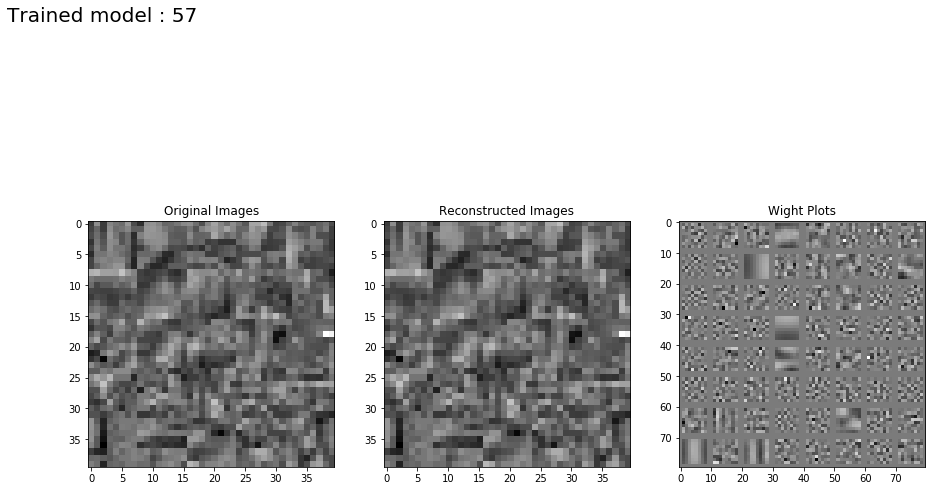

Step 1: Minibatch Loss: 0.015396 Error: 0.015389 Sparse: 0.000764
Step 100: Minibatch Loss: 0.000930 Error: 0.000010 Sparse: 0.091998
Step 200: Minibatch Loss: 0.000868 Error: 0.000004 Sparse: 0.086432
Step 300: Minibatch Loss: 0.000849 Error: 0.000004 Sparse: 0.084551
Step 400: Minibatch Loss: 0.000837 Error: 0.000004 Sparse: 0.083326
Step 500: Minibatch Loss: 0.000814 Error: 0.000004 Sparse: 0.081038
Step 600: Minibatch Loss: 0.000812 Error: 0.000004 Sparse: 0.080782
Step 700: Minibatch Loss: 0.000804 Error: 0.000004 Sparse: 0.080059
Step 800: Minibatch Loss: 0.000814 Error: 0.000012 Sparse: 0.080197
Step 900: Minibatch Loss: 0.000808 Error: 0.000007 Sparse: 0.080134
Step 1000: Minibatch Loss: 0.000797 Error: 0.000005 Sparse: 0.079285
Step 1100: Minibatch Loss: 0.000792 Error: 0.000005 Sparse: 0.078655
Step 1200: Minibatch Loss: 0.000794 Error: 0.000006 Sparse: 0.078824
Step 1300: Minibatch Loss: 0.000789 Error: 0.000005 Sparse: 0.078434
Step 1400: Minibatch Loss: 0.000787 Error: 0.0

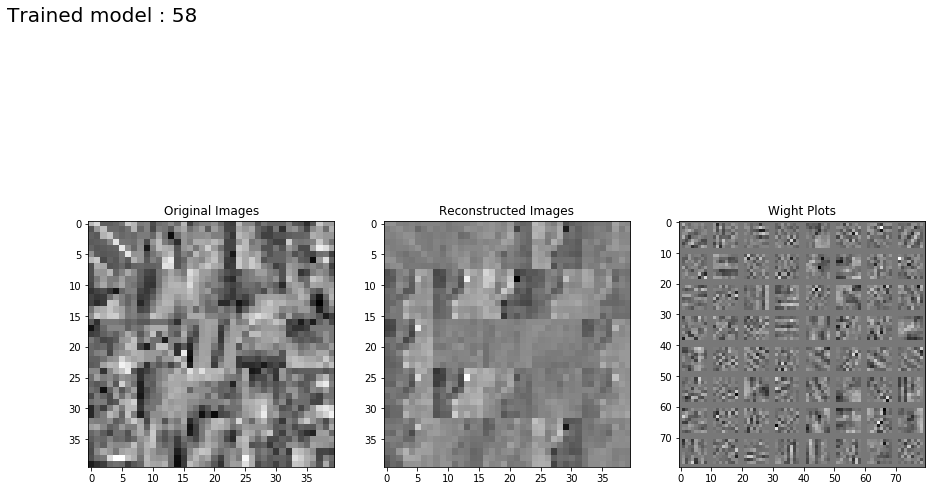

Step 1: Minibatch Loss: 0.015513 Error: 0.015436 Sparse: 0.000771
Step 100: Minibatch Loss: 0.007870 Error: 0.000656 Sparse: 0.072139
Step 200: Minibatch Loss: 0.007651 Error: 0.000592 Sparse: 0.070597
Step 300: Minibatch Loss: 0.007577 Error: 0.000603 Sparse: 0.069734
Step 400: Minibatch Loss: 0.007562 Error: 0.000582 Sparse: 0.069809
Step 500: Minibatch Loss: 0.007513 Error: 0.000582 Sparse: 0.069307
Step 600: Minibatch Loss: 0.007577 Error: 0.000600 Sparse: 0.069767
Step 700: Minibatch Loss: 0.007616 Error: 0.000596 Sparse: 0.070206
Step 800: Minibatch Loss: 0.007657 Error: 0.000617 Sparse: 0.070399
Step 900: Minibatch Loss: 0.007544 Error: 0.000583 Sparse: 0.069613
Step 1000: Minibatch Loss: 0.007450 Error: 0.000568 Sparse: 0.068816
Step 1100: Minibatch Loss: 0.007538 Error: 0.000588 Sparse: 0.069501
Step 1200: Minibatch Loss: 0.007605 Error: 0.000623 Sparse: 0.069815
Step 1300: Minibatch Loss: 0.007589 Error: 0.000604 Sparse: 0.069848
Step 1400: Minibatch Loss: 0.007546 Error: 0.0

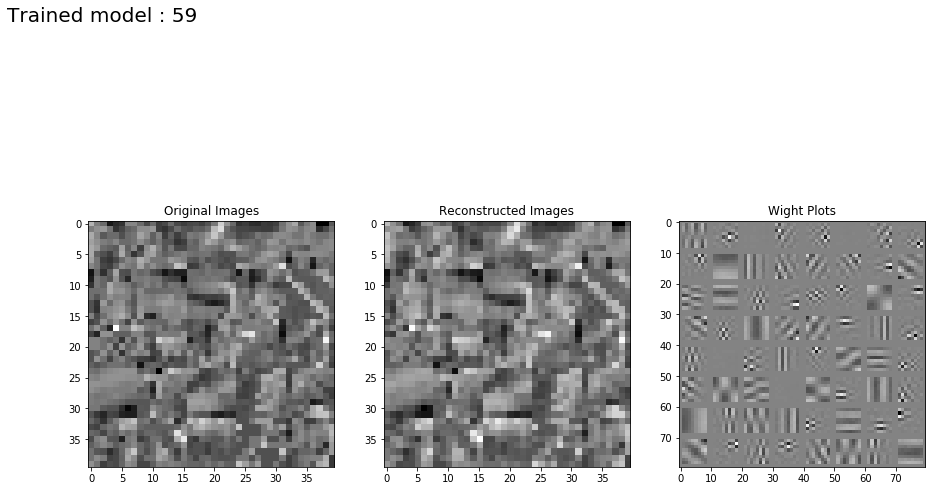

Step 1: Minibatch Loss: 0.016117 Error: 0.015326 Sparse: 0.000790
Step 100: Minibatch Loss: 0.022530 Error: 0.015211 Sparse: 0.007319
Step 200: Minibatch Loss: 0.022149 Error: 0.015287 Sparse: 0.006863
Step 300: Minibatch Loss: 0.021839 Error: 0.015265 Sparse: 0.006574
Step 400: Minibatch Loss: 0.021905 Error: 0.015392 Sparse: 0.006512
Step 500: Minibatch Loss: 0.021592 Error: 0.015302 Sparse: 0.006290
Step 600: Minibatch Loss: 0.022040 Error: 0.015266 Sparse: 0.006773
Step 700: Minibatch Loss: 0.021706 Error: 0.015247 Sparse: 0.006459
Step 800: Minibatch Loss: 0.021690 Error: 0.015142 Sparse: 0.006548
Step 900: Minibatch Loss: 0.021626 Error: 0.015320 Sparse: 0.006306
Step 1000: Minibatch Loss: 0.021546 Error: 0.015288 Sparse: 0.006257
Step 1100: Minibatch Loss: 0.022106 Error: 0.015280 Sparse: 0.006827
Step 1200: Minibatch Loss: 0.021852 Error: 0.015266 Sparse: 0.006587
Step 1300: Minibatch Loss: 0.021206 Error: 0.015324 Sparse: 0.005882
Step 1400: Minibatch Loss: 0.021608 Error: 0.0

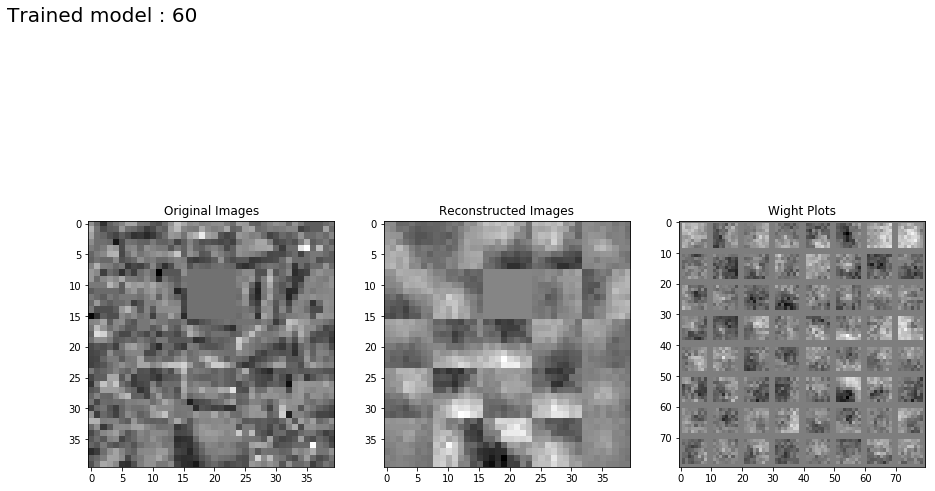

Step 1: Minibatch Loss: 0.015498 Error: 0.015498 Sparse: 0.000830
Step 100: Minibatch Loss: 0.000092 Error: 0.000082 Sparse: 0.096760
Step 200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096868
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097365
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096636
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096673
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096982
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.095940
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096222
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.095941
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.095666
Step 1100: Minibatch Loss: 0.000012 Error: 0.000003 Sparse: 0.094248
Step 1200: Minibatch Loss: 0.000015 Error: 0.000005 Sparse: 0.093885
Step 1300: Minibatch Loss: 0.000010 Error: 0.000001 Sparse: 0.094677
Step 1400: Minibatch Loss: 0.000074 Error: 0.0

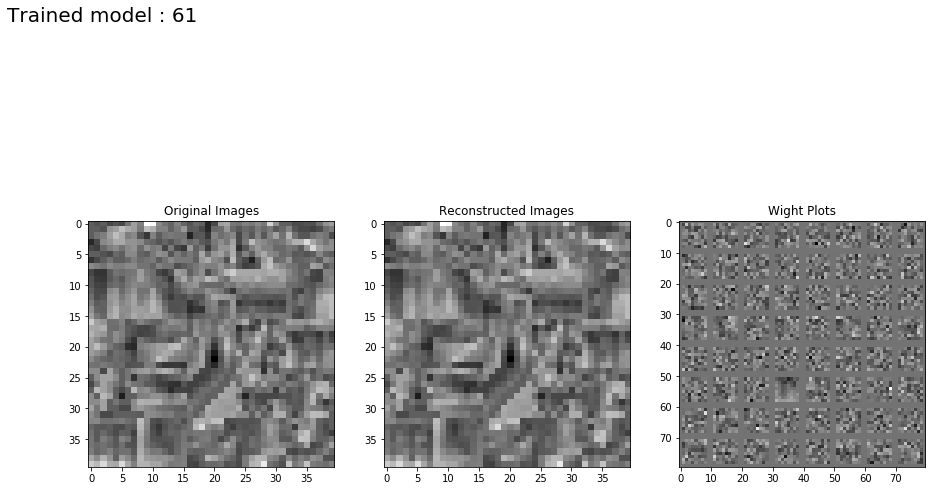

Step 1: Minibatch Loss: 0.015389 Error: 0.015389 Sparse: 0.000791
Step 100: Minibatch Loss: 0.000104 Error: 0.000006 Sparse: 0.097662
Step 200: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097309
Step 300: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096415
Step 400: Minibatch Loss: 0.000095 Error: 0.000000 Sparse: 0.094494
Step 500: Minibatch Loss: 0.000092 Error: 0.000000 Sparse: 0.091773
Step 600: Minibatch Loss: 0.000090 Error: 0.000000 Sparse: 0.090348
Step 700: Minibatch Loss: 0.000089 Error: 0.000000 Sparse: 0.088645
Step 800: Minibatch Loss: 0.000089 Error: 0.000001 Sparse: 0.088522
Step 900: Minibatch Loss: 0.000087 Error: 0.000000 Sparse: 0.086504
Step 1000: Minibatch Loss: 0.000096 Error: 0.000009 Sparse: 0.087010
Step 1100: Minibatch Loss: 0.000104 Error: 0.000018 Sparse: 0.086059
Step 1200: Minibatch Loss: 0.000087 Error: 0.000002 Sparse: 0.084523
Step 1300: Minibatch Loss: 0.000088 Error: 0.000003 Sparse: 0.084931
Step 1400: Minibatch Loss: 0.000085 Error: 0.0

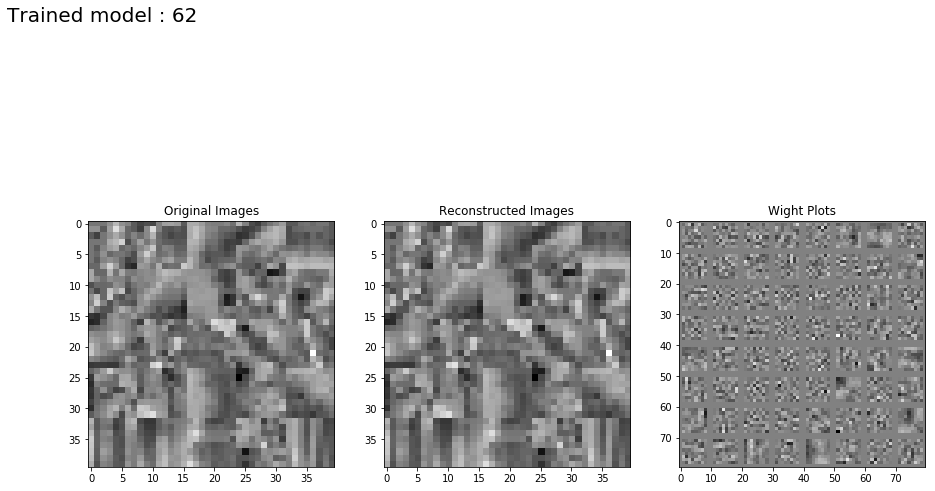

Step 1: Minibatch Loss: 0.015428 Error: 0.015420 Sparse: 0.000780
Step 100: Minibatch Loss: 0.000926 Error: 0.000014 Sparse: 0.091233
Step 200: Minibatch Loss: 0.000868 Error: 0.000004 Sparse: 0.086368
Step 300: Minibatch Loss: 0.000845 Error: 0.000004 Sparse: 0.084091
Step 400: Minibatch Loss: 0.000811 Error: 0.000004 Sparse: 0.080780
Step 500: Minibatch Loss: 0.000818 Error: 0.000004 Sparse: 0.081455
Step 600: Minibatch Loss: 0.000805 Error: 0.000004 Sparse: 0.080158
Step 700: Minibatch Loss: 0.000800 Error: 0.000004 Sparse: 0.079555
Step 800: Minibatch Loss: 0.000795 Error: 0.000004 Sparse: 0.079052
Step 900: Minibatch Loss: 0.000793 Error: 0.000006 Sparse: 0.078639
Step 1000: Minibatch Loss: 0.000792 Error: 0.000005 Sparse: 0.078700
Step 1100: Minibatch Loss: 0.000799 Error: 0.000008 Sparse: 0.079148
Step 1200: Minibatch Loss: 0.000807 Error: 0.000008 Sparse: 0.079849
Step 1300: Minibatch Loss: 0.000800 Error: 0.000008 Sparse: 0.079219
Step 1400: Minibatch Loss: 0.000799 Error: 0.0

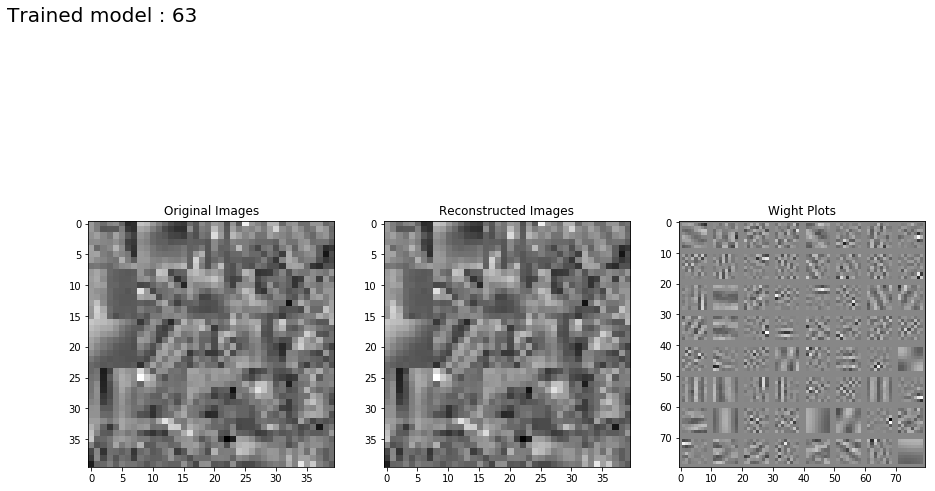

Step 1: Minibatch Loss: 0.015547 Error: 0.015467 Sparse: 0.000804
Step 100: Minibatch Loss: 0.007820 Error: 0.000666 Sparse: 0.071539
Step 200: Minibatch Loss: 0.007641 Error: 0.000592 Sparse: 0.070484
Step 300: Minibatch Loss: 0.007560 Error: 0.000581 Sparse: 0.069792
Step 400: Minibatch Loss: 0.007581 Error: 0.000590 Sparse: 0.069907
Step 500: Minibatch Loss: 0.007561 Error: 0.000591 Sparse: 0.069699
Step 600: Minibatch Loss: 0.007536 Error: 0.000585 Sparse: 0.069514
Step 700: Minibatch Loss: 0.007549 Error: 0.000589 Sparse: 0.069601
Step 800: Minibatch Loss: 0.007584 Error: 0.000592 Sparse: 0.069922
Step 900: Minibatch Loss: 0.007629 Error: 0.000623 Sparse: 0.070052
Step 1000: Minibatch Loss: 0.007631 Error: 0.000611 Sparse: 0.070199
Step 1100: Minibatch Loss: 0.007577 Error: 0.000624 Sparse: 0.069528
Step 1200: Minibatch Loss: 0.007650 Error: 0.000624 Sparse: 0.070258
Step 1300: Minibatch Loss: 0.007572 Error: 0.000609 Sparse: 0.069625
Step 1400: Minibatch Loss: 0.007569 Error: 0.0

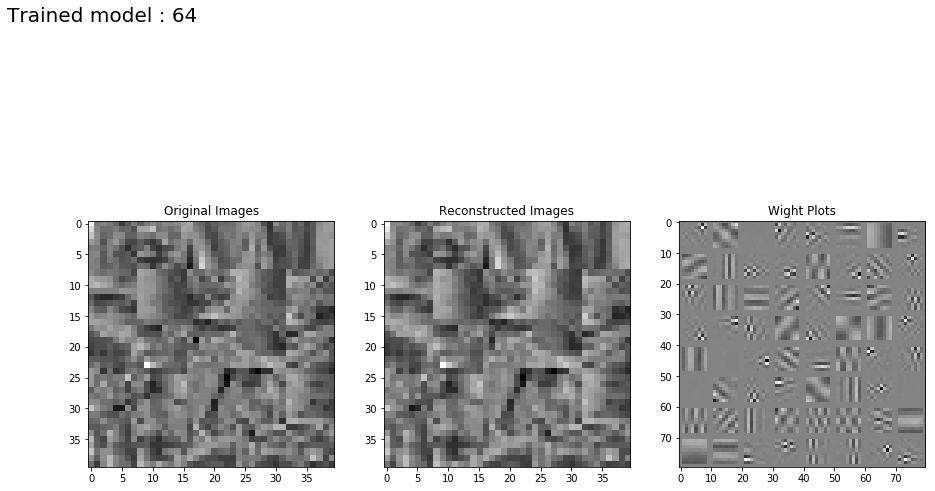

Step 1: Minibatch Loss: 0.016270 Error: 0.015514 Sparse: 0.000756
Step 100: Minibatch Loss: 0.022469 Error: 0.015310 Sparse: 0.007160
Step 200: Minibatch Loss: 0.021270 Error: 0.015238 Sparse: 0.006032
Step 300: Minibatch Loss: 0.021707 Error: 0.015186 Sparse: 0.006521
Step 400: Minibatch Loss: 0.021728 Error: 0.015284 Sparse: 0.006443
Step 500: Minibatch Loss: 0.021875 Error: 0.015359 Sparse: 0.006516
Step 600: Minibatch Loss: 0.022340 Error: 0.015208 Sparse: 0.007131
Step 700: Minibatch Loss: 0.021626 Error: 0.015331 Sparse: 0.006294
Step 800: Minibatch Loss: 0.021482 Error: 0.015310 Sparse: 0.006172
Step 900: Minibatch Loss: 0.022112 Error: 0.015397 Sparse: 0.006714
Step 1000: Minibatch Loss: 0.021774 Error: 0.015268 Sparse: 0.006507
Step 1100: Minibatch Loss: 0.021442 Error: 0.015261 Sparse: 0.006181
Step 1200: Minibatch Loss: 0.021851 Error: 0.015253 Sparse: 0.006598
Step 1300: Minibatch Loss: 0.021513 Error: 0.015273 Sparse: 0.006241
Step 1400: Minibatch Loss: 0.021792 Error: 0.0

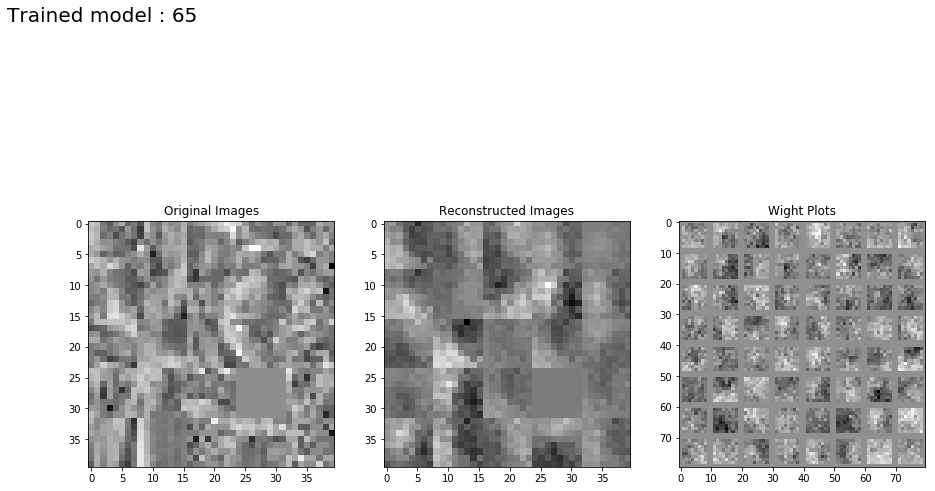

Step 1: Minibatch Loss: 0.015451 Error: 0.015451 Sparse: 0.000791
Step 100: Minibatch Loss: 0.000334 Error: 0.000324 Sparse: 0.096660
Step 200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097430
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097623
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097773
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097843
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098599
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097690
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097679
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097853
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097407
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097448
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098265
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097436
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

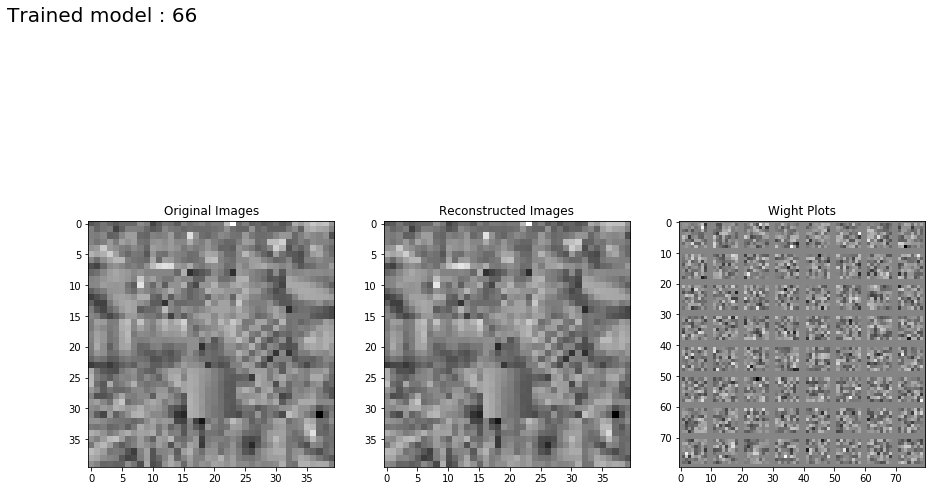

Step 1: Minibatch Loss: 0.015389 Error: 0.015389 Sparse: 0.000778
Step 100: Minibatch Loss: 0.000209 Error: 0.000111 Sparse: 0.097516
Step 200: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097694
Step 300: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097304
Step 400: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096189
Step 500: Minibatch Loss: 0.000095 Error: 0.000000 Sparse: 0.094537
Step 600: Minibatch Loss: 0.000094 Error: 0.000000 Sparse: 0.093747
Step 700: Minibatch Loss: 0.000093 Error: 0.000000 Sparse: 0.092464
Step 800: Minibatch Loss: 0.000092 Error: 0.000000 Sparse: 0.091579
Step 900: Minibatch Loss: 0.000090 Error: 0.000000 Sparse: 0.089913
Step 1000: Minibatch Loss: 0.000089 Error: 0.000000 Sparse: 0.088938
Step 1100: Minibatch Loss: 0.000090 Error: 0.000003 Sparse: 0.087249
Step 1200: Minibatch Loss: 0.000089 Error: 0.000002 Sparse: 0.087342
Step 1300: Minibatch Loss: 0.000097 Error: 0.000009 Sparse: 0.087495
Step 1400: Minibatch Loss: 0.000087 Error: 0.0

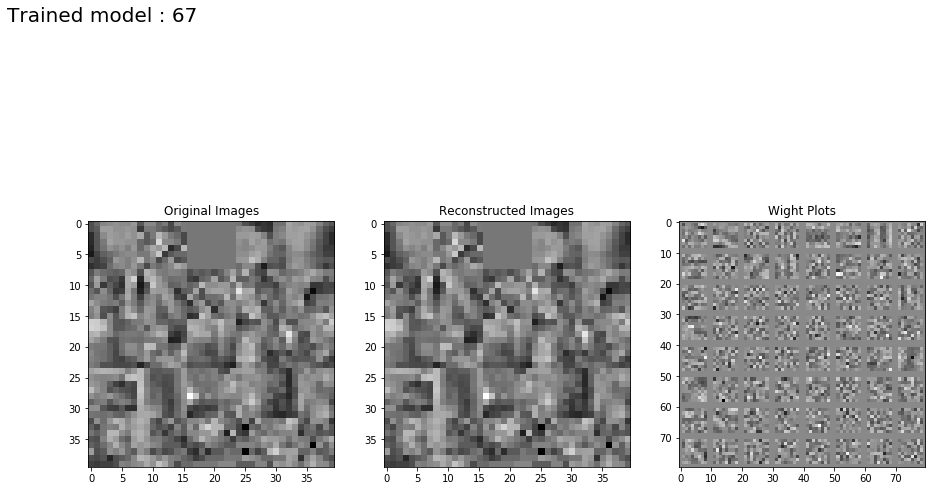

Step 1: Minibatch Loss: 0.015443 Error: 0.015436 Sparse: 0.000771
Step 100: Minibatch Loss: 0.000987 Error: 0.000066 Sparse: 0.092024
Step 200: Minibatch Loss: 0.000864 Error: 0.000004 Sparse: 0.085974
Step 300: Minibatch Loss: 0.000847 Error: 0.000004 Sparse: 0.084330
Step 400: Minibatch Loss: 0.000835 Error: 0.000004 Sparse: 0.083125
Step 500: Minibatch Loss: 0.000814 Error: 0.000004 Sparse: 0.081054
Step 600: Minibatch Loss: 0.000822 Error: 0.000004 Sparse: 0.081777
Step 700: Minibatch Loss: 0.000811 Error: 0.000004 Sparse: 0.080739
Step 800: Minibatch Loss: 0.000805 Error: 0.000004 Sparse: 0.080106
Step 900: Minibatch Loss: 0.000815 Error: 0.000012 Sparse: 0.080316
Step 1000: Minibatch Loss: 0.000804 Error: 0.000004 Sparse: 0.080034
Step 1100: Minibatch Loss: 0.000799 Error: 0.000004 Sparse: 0.079483
Step 1200: Minibatch Loss: 0.000797 Error: 0.000005 Sparse: 0.079171
Step 1300: Minibatch Loss: 0.000798 Error: 0.000008 Sparse: 0.079082
Step 1400: Minibatch Loss: 0.000796 Error: 0.0

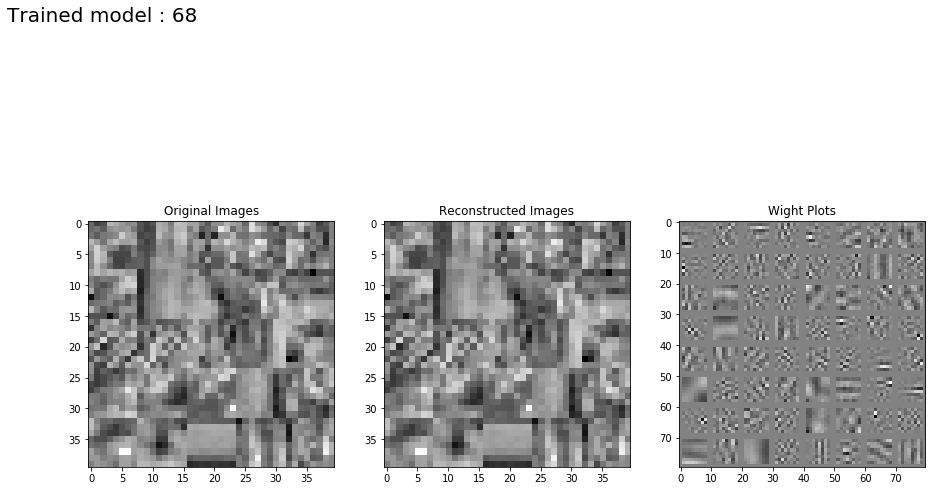

Step 1: Minibatch Loss: 0.015578 Error: 0.015498 Sparse: 0.000796
Step 100: Minibatch Loss: 0.007842 Error: 0.000561 Sparse: 0.072814
Step 200: Minibatch Loss: 0.007542 Error: 0.000443 Sparse: 0.070990
Step 300: Minibatch Loss: 0.007565 Error: 0.000452 Sparse: 0.071125
Step 400: Minibatch Loss: 0.007509 Error: 0.000453 Sparse: 0.070563
Step 500: Minibatch Loss: 0.007565 Error: 0.000450 Sparse: 0.071154
Step 600: Minibatch Loss: 0.007557 Error: 0.000462 Sparse: 0.070948
Step 700: Minibatch Loss: 0.007533 Error: 0.000462 Sparse: 0.070707
Step 800: Minibatch Loss: 0.007518 Error: 0.000482 Sparse: 0.070361
Step 900: Minibatch Loss: 0.007548 Error: 0.000479 Sparse: 0.070685
Step 1000: Minibatch Loss: 0.007615 Error: 0.000484 Sparse: 0.071314
Step 1100: Minibatch Loss: 0.007536 Error: 0.000473 Sparse: 0.070623
Step 1200: Minibatch Loss: 0.007602 Error: 0.000486 Sparse: 0.071160
Step 1300: Minibatch Loss: 0.007557 Error: 0.000487 Sparse: 0.070695
Step 1400: Minibatch Loss: 0.007466 Error: 0.0

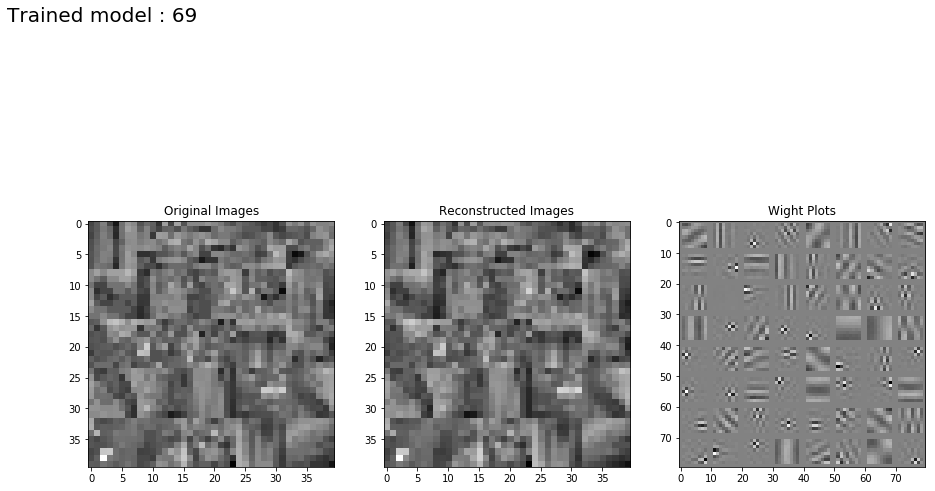

Step 1: Minibatch Loss: 0.016142 Error: 0.015357 Sparse: 0.000784
Step 100: Minibatch Loss: 0.021922 Error: 0.015225 Sparse: 0.006697
Step 200: Minibatch Loss: 0.022374 Error: 0.015264 Sparse: 0.007110
Step 300: Minibatch Loss: 0.021450 Error: 0.015259 Sparse: 0.006191
Step 400: Minibatch Loss: 0.022005 Error: 0.015312 Sparse: 0.006693
Step 500: Minibatch Loss: 0.022050 Error: 0.015336 Sparse: 0.006714
Step 600: Minibatch Loss: 0.021832 Error: 0.015178 Sparse: 0.006654
Step 700: Minibatch Loss: 0.021849 Error: 0.015332 Sparse: 0.006517
Step 800: Minibatch Loss: 0.021928 Error: 0.015258 Sparse: 0.006670
Step 900: Minibatch Loss: 0.022345 Error: 0.015161 Sparse: 0.007184
Step 1000: Minibatch Loss: 0.022221 Error: 0.015345 Sparse: 0.006876
Step 1100: Minibatch Loss: 0.021366 Error: 0.015298 Sparse: 0.006068
Step 1200: Minibatch Loss: 0.022832 Error: 0.015235 Sparse: 0.007597
Step 1300: Minibatch Loss: 0.022295 Error: 0.015327 Sparse: 0.006967
Step 1400: Minibatch Loss: 0.022243 Error: 0.0

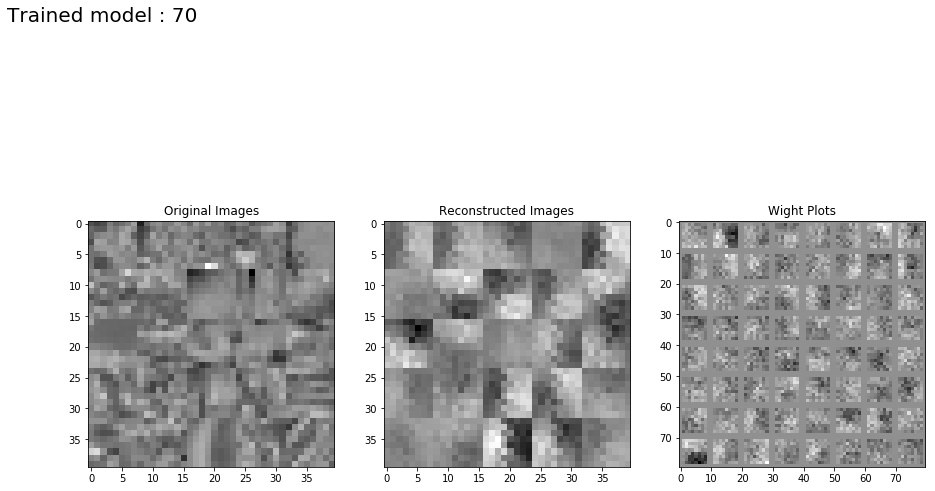

Step 1: Minibatch Loss: 0.015326 Error: 0.015326 Sparse: 0.000798
Step 100: Minibatch Loss: 0.000207 Error: 0.000197 Sparse: 0.096561
Step 200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097479
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097575
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097212
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096677
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097057
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096885
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097224
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097514
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097404
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096930
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096497
Step 1300: Minibatch Loss: 0.000013 Error: 0.000004 Sparse: 0.096760
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

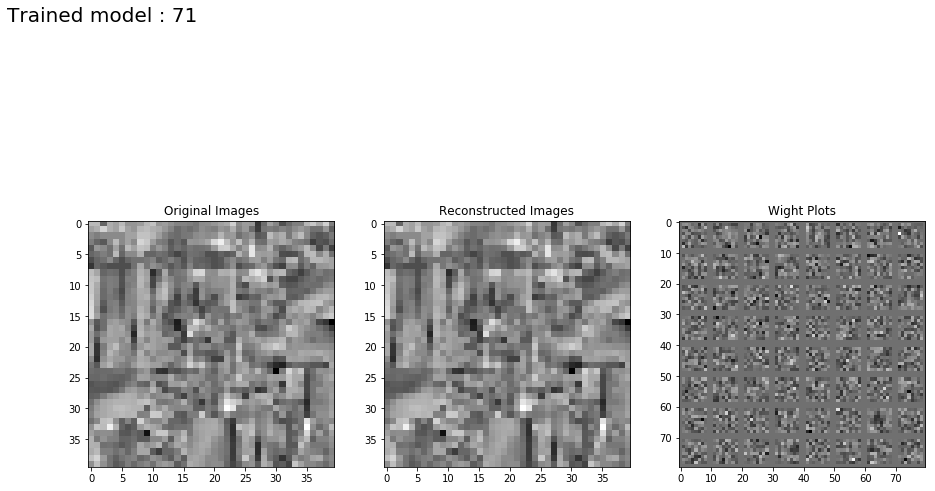

Step 1: Minibatch Loss: 0.015374 Error: 0.015373 Sparse: 0.000802
Step 100: Minibatch Loss: 0.000339 Error: 0.000242 Sparse: 0.097477
Step 200: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098501
Step 300: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097815
Step 400: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096728
Step 500: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096123
Step 600: Minibatch Loss: 0.000095 Error: 0.000000 Sparse: 0.095117
Step 700: Minibatch Loss: 0.000094 Error: 0.000000 Sparse: 0.094210
Step 800: Minibatch Loss: 0.000093 Error: 0.000000 Sparse: 0.093299
Step 900: Minibatch Loss: 0.000092 Error: 0.000000 Sparse: 0.092017
Step 1000: Minibatch Loss: 0.000091 Error: 0.000000 Sparse: 0.091128
Step 1100: Minibatch Loss: 0.000090 Error: 0.000000 Sparse: 0.089595
Step 1200: Minibatch Loss: 0.000089 Error: 0.000000 Sparse: 0.088593
Step 1300: Minibatch Loss: 0.000088 Error: 0.000000 Sparse: 0.088101
Step 1400: Minibatch Loss: 0.000087 Error: 0.0

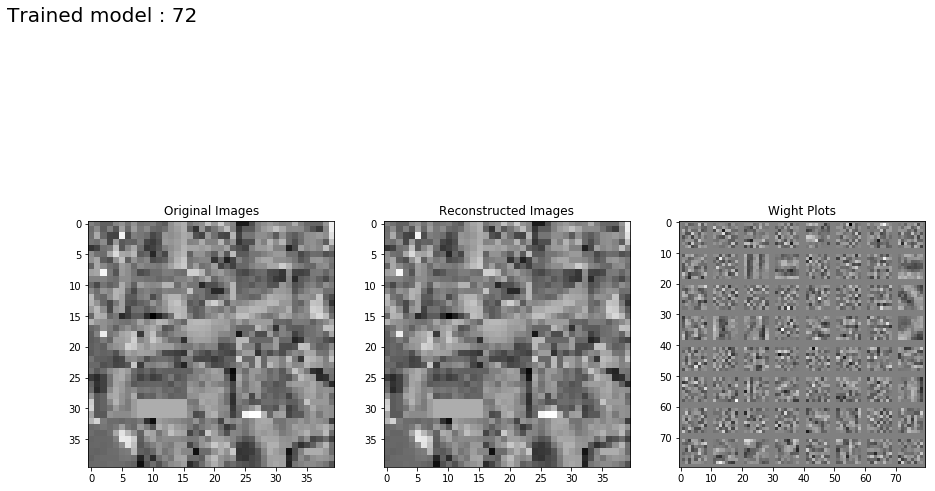

Step 1: Minibatch Loss: 0.015522 Error: 0.015514 Sparse: 0.000793
Step 100: Minibatch Loss: 0.001141 Error: 0.000228 Sparse: 0.091299
Step 200: Minibatch Loss: 0.000880 Error: 0.000004 Sparse: 0.087640
Step 300: Minibatch Loss: 0.000861 Error: 0.000004 Sparse: 0.085755
Step 400: Minibatch Loss: 0.000843 Error: 0.000004 Sparse: 0.083878
Step 500: Minibatch Loss: 0.000839 Error: 0.000004 Sparse: 0.083527
Step 600: Minibatch Loss: 0.000824 Error: 0.000004 Sparse: 0.081995
Step 700: Minibatch Loss: 0.000819 Error: 0.000004 Sparse: 0.081529
Step 800: Minibatch Loss: 0.000818 Error: 0.000004 Sparse: 0.081421
Step 900: Minibatch Loss: 0.000826 Error: 0.000004 Sparse: 0.082228
Step 1000: Minibatch Loss: 0.000803 Error: 0.000004 Sparse: 0.079908
Step 1100: Minibatch Loss: 0.000804 Error: 0.000004 Sparse: 0.079986
Step 1200: Minibatch Loss: 0.000805 Error: 0.000004 Sparse: 0.080135
Step 1300: Minibatch Loss: 0.000812 Error: 0.000004 Sparse: 0.080793
Step 1400: Minibatch Loss: 0.000792 Error: 0.0

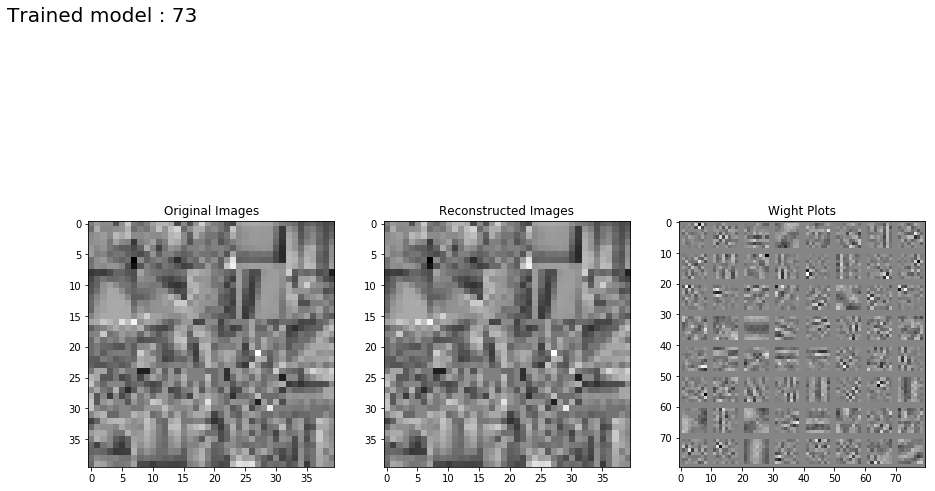

Step 1: Minibatch Loss: 0.015595 Error: 0.015514 Sparse: 0.000810
Step 100: Minibatch Loss: 0.007946 Error: 0.000823 Sparse: 0.071223
Step 200: Minibatch Loss: 0.007666 Error: 0.000706 Sparse: 0.069598
Step 300: Minibatch Loss: 0.007604 Error: 0.000687 Sparse: 0.069167
Step 400: Minibatch Loss: 0.007563 Error: 0.000680 Sparse: 0.068839
Step 500: Minibatch Loss: 0.007590 Error: 0.000664 Sparse: 0.069257
Step 600: Minibatch Loss: 0.007588 Error: 0.000683 Sparse: 0.069051
Step 700: Minibatch Loss: 0.007600 Error: 0.000693 Sparse: 0.069075
Step 800: Minibatch Loss: 0.007503 Error: 0.000652 Sparse: 0.068506
Step 900: Minibatch Loss: 0.007566 Error: 0.000674 Sparse: 0.068922
Step 1000: Minibatch Loss: 0.007551 Error: 0.000679 Sparse: 0.068722
Step 1100: Minibatch Loss: 0.007553 Error: 0.000685 Sparse: 0.068682
Step 1200: Minibatch Loss: 0.007501 Error: 0.000669 Sparse: 0.068315
Step 1300: Minibatch Loss: 0.007607 Error: 0.000699 Sparse: 0.069078
Step 1400: Minibatch Loss: 0.007657 Error: 0.0

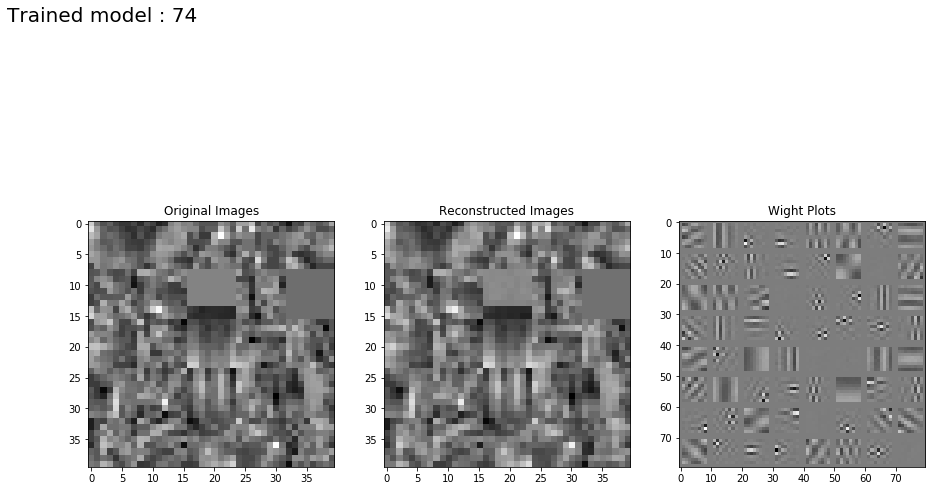

Step 1: Minibatch Loss: 0.016233 Error: 0.015451 Sparse: 0.000782
Step 100: Minibatch Loss: 0.021984 Error: 0.015360 Sparse: 0.006624
Step 200: Minibatch Loss: 0.021920 Error: 0.015354 Sparse: 0.006567
Step 300: Minibatch Loss: 0.021617 Error: 0.015234 Sparse: 0.006383
Step 400: Minibatch Loss: 0.022592 Error: 0.015326 Sparse: 0.007266
Step 500: Minibatch Loss: 0.021576 Error: 0.015362 Sparse: 0.006215
Step 600: Minibatch Loss: 0.022187 Error: 0.015267 Sparse: 0.006920
Step 700: Minibatch Loss: 0.021641 Error: 0.015239 Sparse: 0.006402
Step 800: Minibatch Loss: 0.021746 Error: 0.015237 Sparse: 0.006509
Step 900: Minibatch Loss: 0.022461 Error: 0.015280 Sparse: 0.007182
Step 1000: Minibatch Loss: 0.021946 Error: 0.015288 Sparse: 0.006658
Step 1100: Minibatch Loss: 0.021563 Error: 0.015289 Sparse: 0.006273
Step 1200: Minibatch Loss: 0.021557 Error: 0.015291 Sparse: 0.006266
Step 1300: Minibatch Loss: 0.021628 Error: 0.015211 Sparse: 0.006418
Step 1400: Minibatch Loss: 0.022207 Error: 0.0

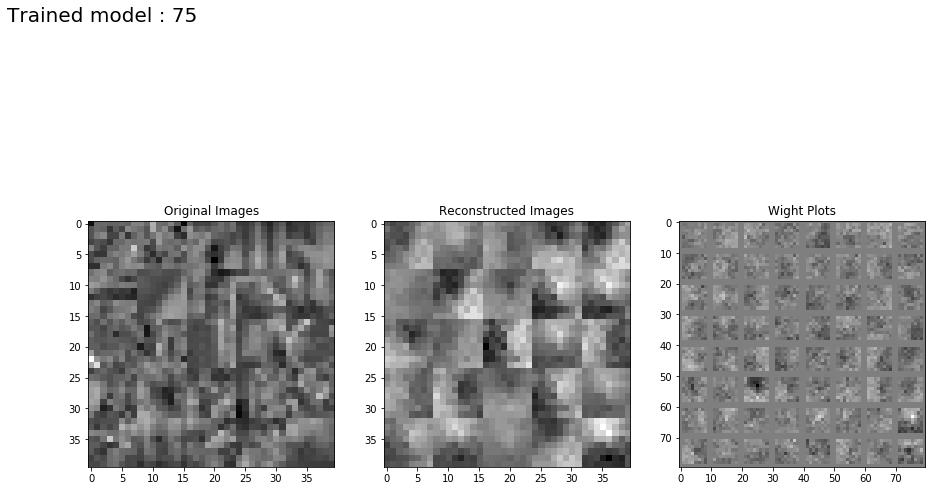

Step 1: Minibatch Loss: 0.015279 Error: 0.015279 Sparse: 0.000817
Step 100: Minibatch Loss: 0.002983 Error: 0.002974 Sparse: 0.088874
Step 200: Minibatch Loss: 0.001156 Error: 0.001147 Sparse: 0.094283
Step 300: Minibatch Loss: 0.000689 Error: 0.000680 Sparse: 0.095048
Step 400: Minibatch Loss: 0.000452 Error: 0.000442 Sparse: 0.096525
Step 500: Minibatch Loss: 0.000280 Error: 0.000270 Sparse: 0.097780
Step 600: Minibatch Loss: 0.000178 Error: 0.000168 Sparse: 0.098127
Step 700: Minibatch Loss: 0.000094 Error: 0.000084 Sparse: 0.098217
Step 800: Minibatch Loss: 0.000055 Error: 0.000045 Sparse: 0.097874
Step 900: Minibatch Loss: 0.000031 Error: 0.000021 Sparse: 0.098960
Step 1000: Minibatch Loss: 0.000013 Error: 0.000003 Sparse: 0.097820


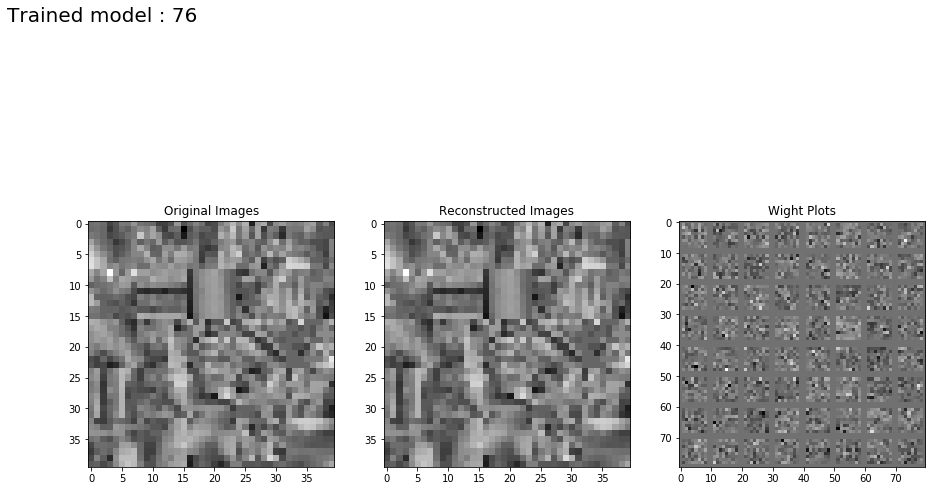

Step 1: Minibatch Loss: 0.015374 Error: 0.015373 Sparse: 0.000779
Step 100: Minibatch Loss: 0.003171 Error: 0.003083 Sparse: 0.088572
Step 200: Minibatch Loss: 0.001290 Error: 0.001197 Sparse: 0.093242
Step 300: Minibatch Loss: 0.000823 Error: 0.000728 Sparse: 0.094659
Step 400: Minibatch Loss: 0.000498 Error: 0.000402 Sparse: 0.096040
Step 500: Minibatch Loss: 0.000329 Error: 0.000232 Sparse: 0.096898
Step 600: Minibatch Loss: 0.000228 Error: 0.000130 Sparse: 0.097563
Step 700: Minibatch Loss: 0.000152 Error: 0.000055 Sparse: 0.097657
Step 800: Minibatch Loss: 0.000125 Error: 0.000027 Sparse: 0.097532
Step 900: Minibatch Loss: 0.000104 Error: 0.000007 Sparse: 0.097739
Step 1000: Minibatch Loss: 0.000099 Error: 0.000001 Sparse: 0.097962


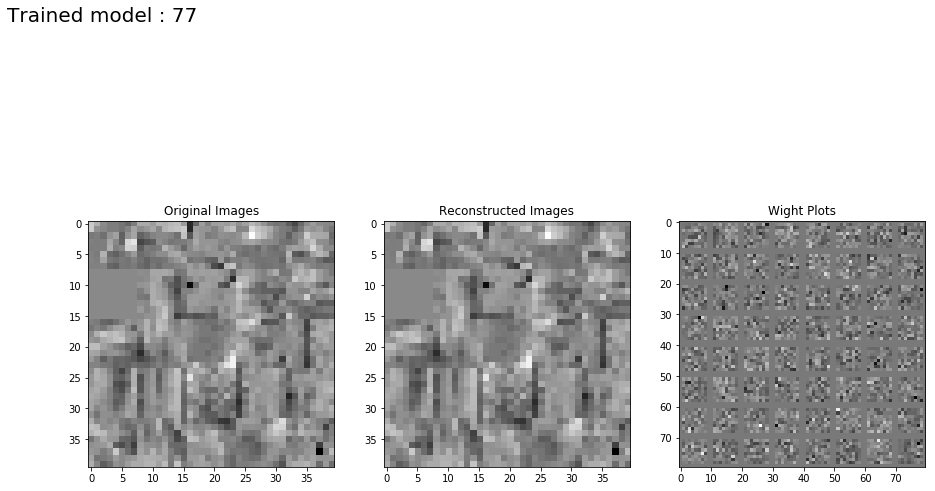

Step 1: Minibatch Loss: 0.015459 Error: 0.015451 Sparse: 0.000768
Step 100: Minibatch Loss: 0.005181 Error: 0.004275 Sparse: 0.090593
Step 200: Minibatch Loss: 0.002393 Error: 0.001464 Sparse: 0.092893
Step 300: Minibatch Loss: 0.001819 Error: 0.000884 Sparse: 0.093528
Step 400: Minibatch Loss: 0.001563 Error: 0.000617 Sparse: 0.094613
Step 500: Minibatch Loss: 0.001387 Error: 0.000436 Sparse: 0.095113
Step 600: Minibatch Loss: 0.001216 Error: 0.000262 Sparse: 0.095339
Step 700: Minibatch Loss: 0.001147 Error: 0.000184 Sparse: 0.096386
Step 800: Minibatch Loss: 0.001069 Error: 0.000108 Sparse: 0.096126
Step 900: Minibatch Loss: 0.001016 Error: 0.000056 Sparse: 0.095998
Step 1000: Minibatch Loss: 0.000976 Error: 0.000021 Sparse: 0.095514


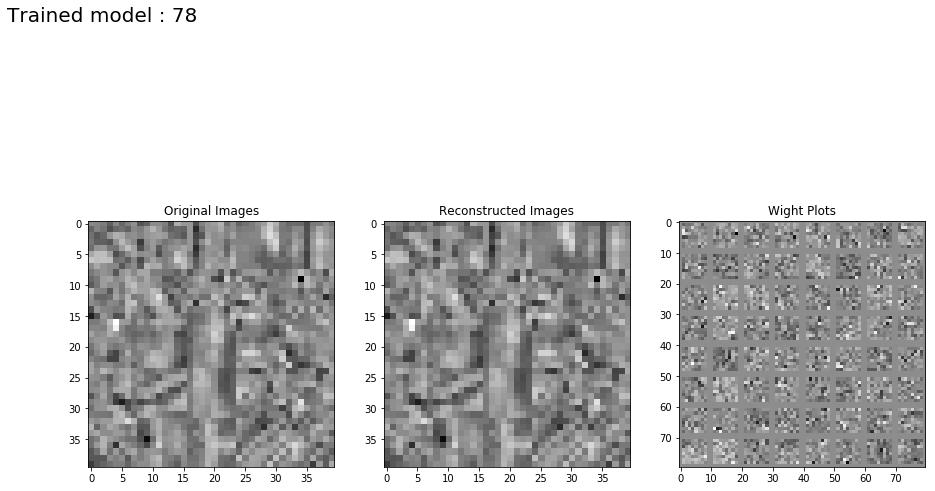

Step 1: Minibatch Loss: 0.015419 Error: 0.015342 Sparse: 0.000776
Step 100: Minibatch Loss: 0.015405 Error: 0.006606 Sparse: 0.087995
Step 200: Minibatch Loss: 0.010686 Error: 0.002005 Sparse: 0.086807
Step 300: Minibatch Loss: 0.009898 Error: 0.001325 Sparse: 0.085733
Step 400: Minibatch Loss: 0.009413 Error: 0.001016 Sparse: 0.083973
Step 500: Minibatch Loss: 0.009119 Error: 0.000851 Sparse: 0.082683
Step 600: Minibatch Loss: 0.008868 Error: 0.000737 Sparse: 0.081307
Step 700: Minibatch Loss: 0.008750 Error: 0.000661 Sparse: 0.080891
Step 800: Minibatch Loss: 0.008613 Error: 0.000607 Sparse: 0.080064
Step 900: Minibatch Loss: 0.008475 Error: 0.000561 Sparse: 0.079139
Step 1000: Minibatch Loss: 0.008367 Error: 0.000527 Sparse: 0.078399


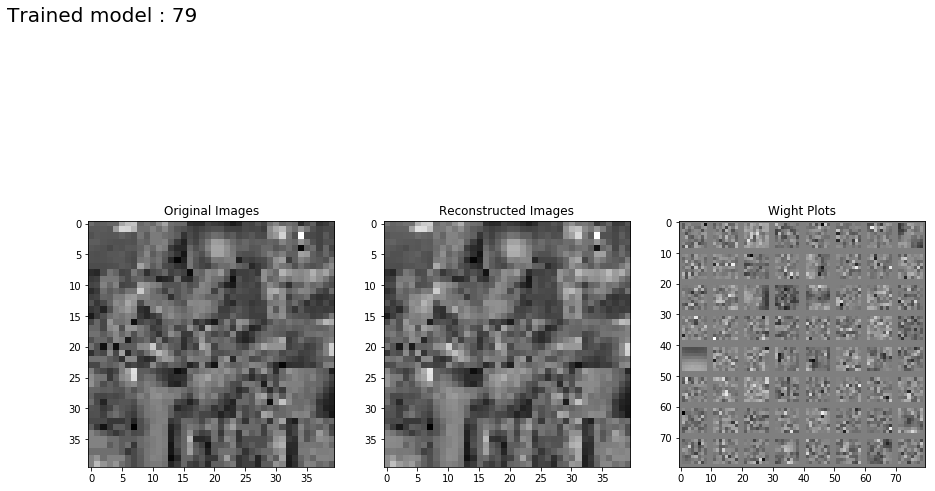

Step 1: Minibatch Loss: 0.016112 Error: 0.015342 Sparse: 0.000770
Step 100: Minibatch Loss: 0.072245 Error: 0.011284 Sparse: 0.060961
Step 200: Minibatch Loss: 0.033873 Error: 0.014070 Sparse: 0.019804
Step 300: Minibatch Loss: 0.017493 Error: 0.015250 Sparse: 0.002243
Step 400: Minibatch Loss: 0.016362 Error: 0.015466 Sparse: 0.000896
Step 500: Minibatch Loss: 0.016281 Error: 0.015293 Sparse: 0.000988
Step 600: Minibatch Loss: 0.016789 Error: 0.015400 Sparse: 0.001388
Step 700: Minibatch Loss: 0.016819 Error: 0.015414 Sparse: 0.001405
Step 800: Minibatch Loss: 0.016848 Error: 0.015367 Sparse: 0.001481
Step 900: Minibatch Loss: 0.017236 Error: 0.015424 Sparse: 0.001812
Step 1000: Minibatch Loss: 0.017220 Error: 0.015344 Sparse: 0.001875


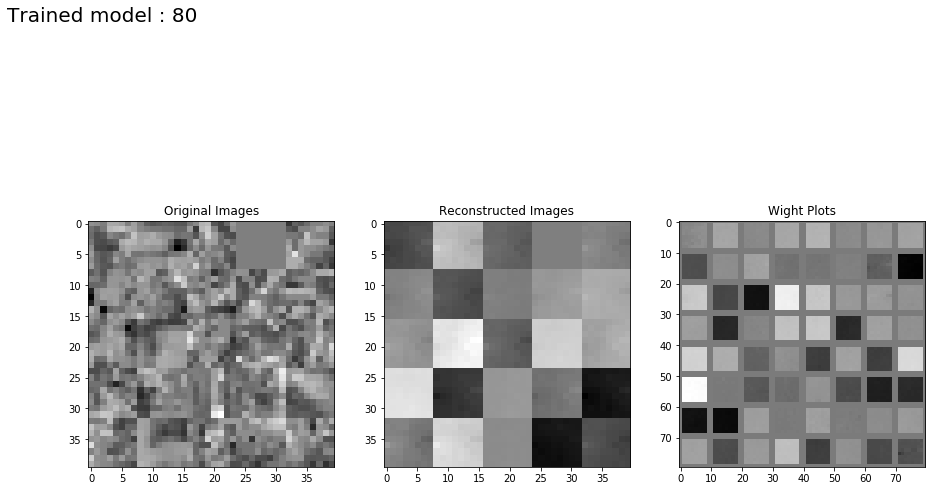

Step 1: Minibatch Loss: 0.015389 Error: 0.015389 Sparse: 0.000788
Step 100: Minibatch Loss: 0.002607 Error: 0.002598 Sparse: 0.090591
Step 200: Minibatch Loss: 0.001069 Error: 0.001060 Sparse: 0.093638
Step 300: Minibatch Loss: 0.000661 Error: 0.000652 Sparse: 0.095078
Step 400: Minibatch Loss: 0.000377 Error: 0.000367 Sparse: 0.096208
Step 500: Minibatch Loss: 0.000211 Error: 0.000201 Sparse: 0.096460
Step 600: Minibatch Loss: 0.000112 Error: 0.000102 Sparse: 0.097609
Step 700: Minibatch Loss: 0.000042 Error: 0.000032 Sparse: 0.097831
Step 800: Minibatch Loss: 0.000015 Error: 0.000005 Sparse: 0.097767
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098712
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097829
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097913
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097759
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097959
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

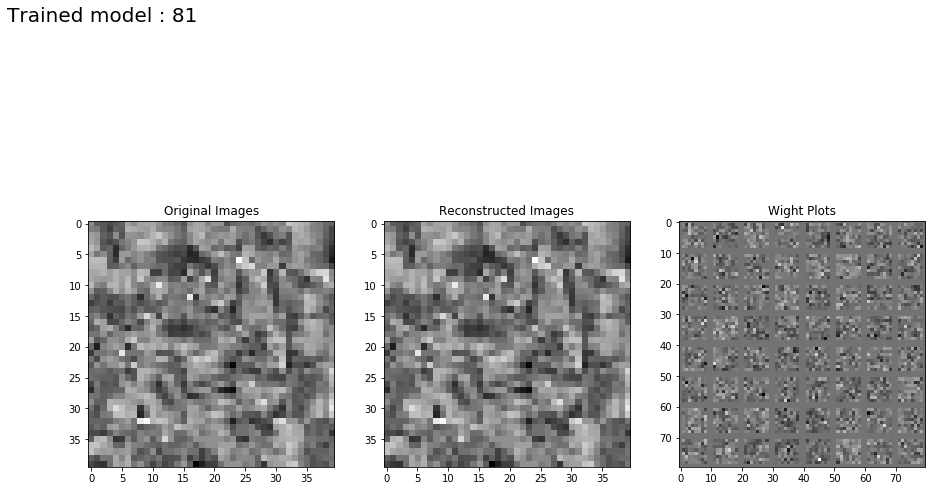

Step 1: Minibatch Loss: 0.015467 Error: 0.015467 Sparse: 0.000804
Step 100: Minibatch Loss: 0.003213 Error: 0.003123 Sparse: 0.089650
Step 200: Minibatch Loss: 0.001439 Error: 0.001346 Sparse: 0.092958
Step 300: Minibatch Loss: 0.000977 Error: 0.000883 Sparse: 0.093785
Step 400: Minibatch Loss: 0.000731 Error: 0.000637 Sparse: 0.094165
Step 500: Minibatch Loss: 0.000523 Error: 0.000428 Sparse: 0.094836
Step 600: Minibatch Loss: 0.000412 Error: 0.000316 Sparse: 0.095910
Step 700: Minibatch Loss: 0.000312 Error: 0.000215 Sparse: 0.097206
Step 800: Minibatch Loss: 0.000254 Error: 0.000157 Sparse: 0.096975
Step 900: Minibatch Loss: 0.000209 Error: 0.000111 Sparse: 0.098031
Step 1000: Minibatch Loss: 0.000183 Error: 0.000085 Sparse: 0.097686
Step 1100: Minibatch Loss: 0.000162 Error: 0.000065 Sparse: 0.097345
Step 1200: Minibatch Loss: 0.000151 Error: 0.000053 Sparse: 0.097788
Step 1300: Minibatch Loss: 0.000152 Error: 0.000055 Sparse: 0.096695
Step 1400: Minibatch Loss: 0.000156 Error: 0.0

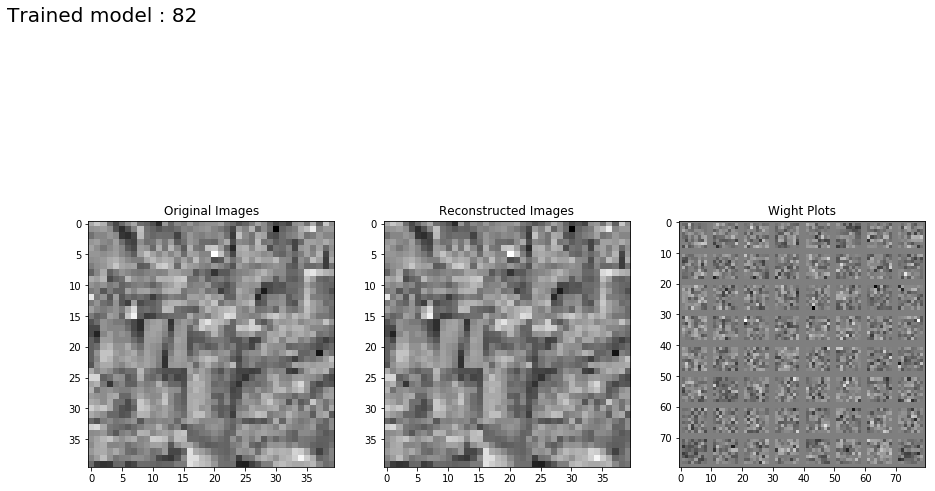

Step 1: Minibatch Loss: 0.015412 Error: 0.015404 Sparse: 0.000771
Step 100: Minibatch Loss: 0.005886 Error: 0.004973 Sparse: 0.091390
Step 200: Minibatch Loss: 0.002812 Error: 0.001888 Sparse: 0.092365
Step 300: Minibatch Loss: 0.002114 Error: 0.001187 Sparse: 0.092734
Step 400: Minibatch Loss: 0.001768 Error: 0.000835 Sparse: 0.093306
Step 500: Minibatch Loss: 0.001571 Error: 0.000631 Sparse: 0.093994
Step 600: Minibatch Loss: 0.001389 Error: 0.000444 Sparse: 0.094469
Step 700: Minibatch Loss: 0.001309 Error: 0.000357 Sparse: 0.095188
Step 800: Minibatch Loss: 0.001213 Error: 0.000261 Sparse: 0.095187
Step 900: Minibatch Loss: 0.001145 Error: 0.000195 Sparse: 0.095017
Step 1000: Minibatch Loss: 0.001109 Error: 0.000155 Sparse: 0.095366
Step 1100: Minibatch Loss: 0.001069 Error: 0.000116 Sparse: 0.095286
Step 1200: Minibatch Loss: 0.001036 Error: 0.000074 Sparse: 0.096136
Step 1300: Minibatch Loss: 0.000988 Error: 0.000040 Sparse: 0.094757
Step 1400: Minibatch Loss: 0.000963 Error: 0.0

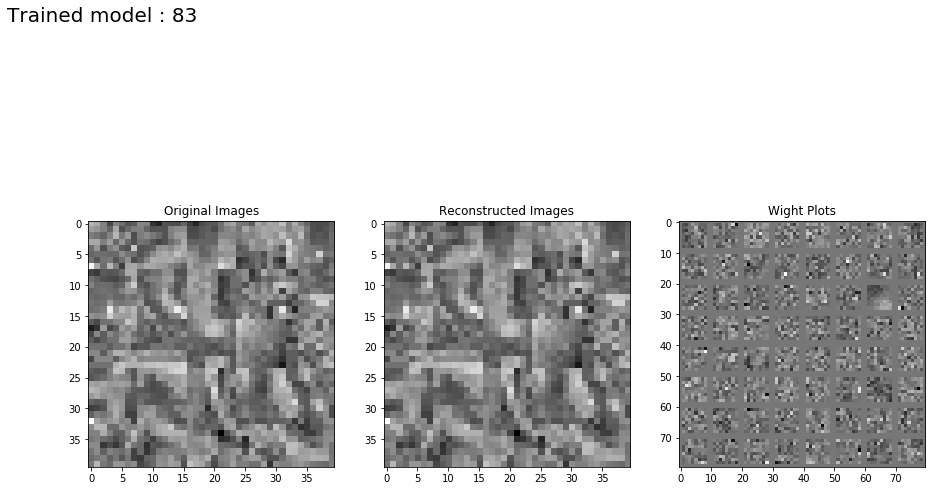

Step 1: Minibatch Loss: 0.015387 Error: 0.015311 Sparse: 0.000768
Step 100: Minibatch Loss: 0.013904 Error: 0.005392 Sparse: 0.085120
Step 200: Minibatch Loss: 0.010304 Error: 0.001816 Sparse: 0.084883
Step 300: Minibatch Loss: 0.009629 Error: 0.001287 Sparse: 0.083414
Step 400: Minibatch Loss: 0.009076 Error: 0.000998 Sparse: 0.080784
Step 500: Minibatch Loss: 0.008739 Error: 0.000822 Sparse: 0.079170
Step 600: Minibatch Loss: 0.008550 Error: 0.000710 Sparse: 0.078401
Step 700: Minibatch Loss: 0.008392 Error: 0.000619 Sparse: 0.077727
Step 800: Minibatch Loss: 0.008403 Error: 0.000582 Sparse: 0.078209
Step 900: Minibatch Loss: 0.008288 Error: 0.000542 Sparse: 0.077455
Step 1000: Minibatch Loss: 0.008173 Error: 0.000511 Sparse: 0.076628
Step 1100: Minibatch Loss: 0.008082 Error: 0.000491 Sparse: 0.075903
Step 1200: Minibatch Loss: 0.008023 Error: 0.000477 Sparse: 0.075468
Step 1300: Minibatch Loss: 0.007940 Error: 0.000470 Sparse: 0.074697
Step 1400: Minibatch Loss: 0.008010 Error: 0.0

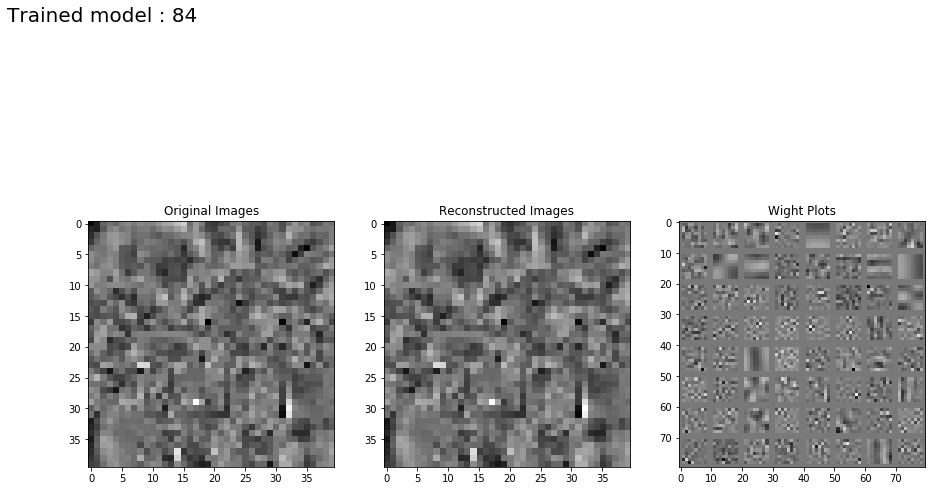

Step 1: Minibatch Loss: 0.016192 Error: 0.015404 Sparse: 0.000788
Step 100: Minibatch Loss: 0.065349 Error: 0.011343 Sparse: 0.054005
Step 200: Minibatch Loss: 0.028263 Error: 0.014582 Sparse: 0.013681
Step 300: Minibatch Loss: 0.016850 Error: 0.015422 Sparse: 0.001427
Step 400: Minibatch Loss: 0.016538 Error: 0.015275 Sparse: 0.001263
Step 500: Minibatch Loss: 0.016793 Error: 0.015257 Sparse: 0.001536
Step 600: Minibatch Loss: 0.017309 Error: 0.015425 Sparse: 0.001884
Step 700: Minibatch Loss: 0.017341 Error: 0.015424 Sparse: 0.001917
Step 800: Minibatch Loss: 0.017704 Error: 0.015545 Sparse: 0.002159
Step 900: Minibatch Loss: 0.017429 Error: 0.015391 Sparse: 0.002039
Step 1000: Minibatch Loss: 0.017839 Error: 0.015461 Sparse: 0.002378
Step 1100: Minibatch Loss: 0.018157 Error: 0.015393 Sparse: 0.002764
Step 1200: Minibatch Loss: 0.018284 Error: 0.015409 Sparse: 0.002875
Step 1300: Minibatch Loss: 0.018670 Error: 0.015430 Sparse: 0.003240
Step 1400: Minibatch Loss: 0.018981 Error: 0.0

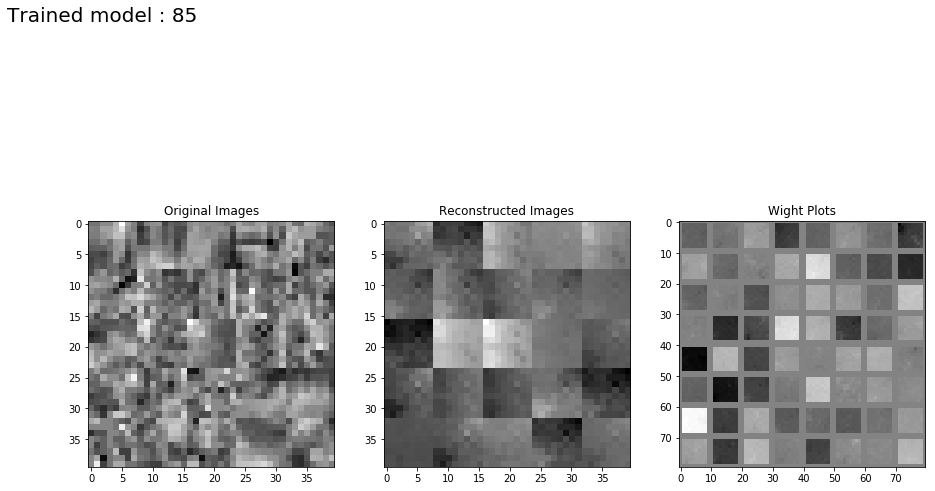

Step 1: Minibatch Loss: 0.015420 Error: 0.015420 Sparse: 0.000798
Step 100: Minibatch Loss: 0.003137 Error: 0.003128 Sparse: 0.088877
Step 200: Minibatch Loss: 0.001271 Error: 0.001262 Sparse: 0.092837
Step 300: Minibatch Loss: 0.000794 Error: 0.000784 Sparse: 0.094824
Step 400: Minibatch Loss: 0.000501 Error: 0.000491 Sparse: 0.095600
Step 500: Minibatch Loss: 0.000346 Error: 0.000337 Sparse: 0.095566
Step 600: Minibatch Loss: 0.000213 Error: 0.000203 Sparse: 0.096691
Step 700: Minibatch Loss: 0.000169 Error: 0.000159 Sparse: 0.097418
Step 800: Minibatch Loss: 0.000129 Error: 0.000119 Sparse: 0.097010
Step 900: Minibatch Loss: 0.000098 Error: 0.000088 Sparse: 0.097016
Step 1000: Minibatch Loss: 0.000066 Error: 0.000056 Sparse: 0.098203
Step 1100: Minibatch Loss: 0.000043 Error: 0.000033 Sparse: 0.097931
Step 1200: Minibatch Loss: 0.000016 Error: 0.000006 Sparse: 0.097523
Step 1300: Minibatch Loss: 0.000010 Error: 0.000001 Sparse: 0.097806
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

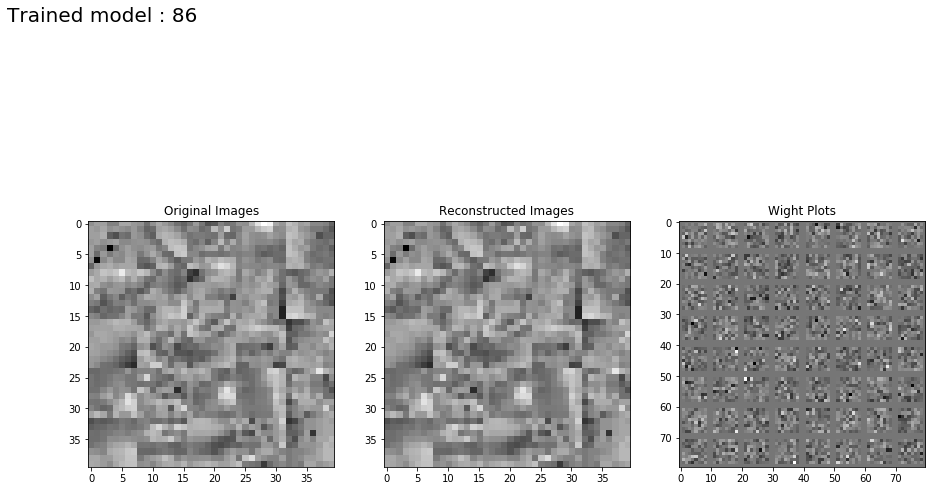

Step 1: Minibatch Loss: 0.015436 Error: 0.015436 Sparse: 0.000766
Step 100: Minibatch Loss: 0.002710 Error: 0.002621 Sparse: 0.089432
Step 200: Minibatch Loss: 0.001098 Error: 0.001005 Sparse: 0.093215
Step 300: Minibatch Loss: 0.000655 Error: 0.000558 Sparse: 0.096278
Step 400: Minibatch Loss: 0.000417 Error: 0.000320 Sparse: 0.096572
Step 500: Minibatch Loss: 0.000257 Error: 0.000159 Sparse: 0.097352
Step 600: Minibatch Loss: 0.000175 Error: 0.000077 Sparse: 0.097755
Step 700: Minibatch Loss: 0.000147 Error: 0.000049 Sparse: 0.098205
Step 800: Minibatch Loss: 0.000127 Error: 0.000029 Sparse: 0.098019
Step 900: Minibatch Loss: 0.000101 Error: 0.000003 Sparse: 0.098087
Step 1000: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098321
Step 1100: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097993
Step 1200: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098023
Step 1300: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097859
Step 1400: Minibatch Loss: 0.000097 Error: 0.0

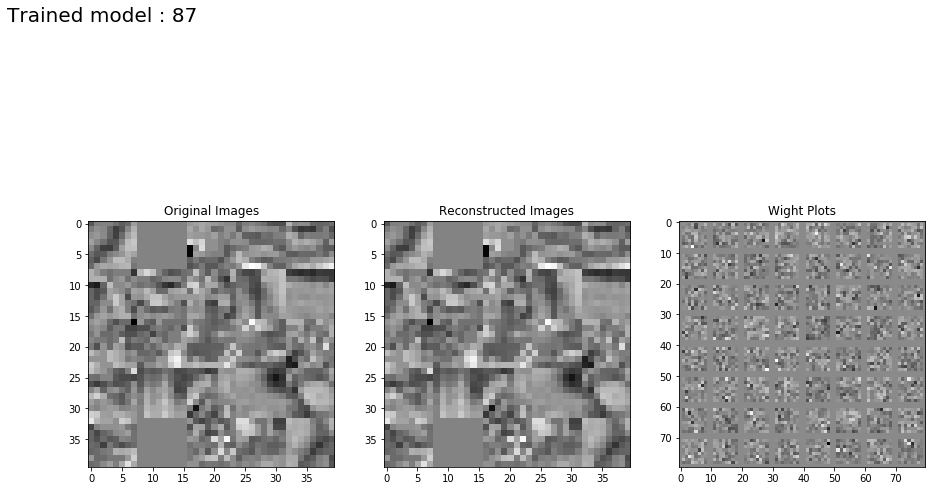

Step 1: Minibatch Loss: 0.015412 Error: 0.015404 Sparse: 0.000802
Step 100: Minibatch Loss: 0.005355 Error: 0.004486 Sparse: 0.086846
Step 200: Minibatch Loss: 0.002269 Error: 0.001348 Sparse: 0.092140
Step 300: Minibatch Loss: 0.001741 Error: 0.000804 Sparse: 0.093737
Step 400: Minibatch Loss: 0.001467 Error: 0.000522 Sparse: 0.094438
Step 500: Minibatch Loss: 0.001304 Error: 0.000344 Sparse: 0.095975
Step 600: Minibatch Loss: 0.001167 Error: 0.000218 Sparse: 0.094917
Step 700: Minibatch Loss: 0.001105 Error: 0.000156 Sparse: 0.094959
Step 800: Minibatch Loss: 0.001072 Error: 0.000118 Sparse: 0.095446
Step 900: Minibatch Loss: 0.001021 Error: 0.000074 Sparse: 0.094749
Step 1000: Minibatch Loss: 0.001003 Error: 0.000061 Sparse: 0.094233
Step 1100: Minibatch Loss: 0.000990 Error: 0.000054 Sparse: 0.093656
Step 1200: Minibatch Loss: 0.000989 Error: 0.000057 Sparse: 0.093190
Step 1300: Minibatch Loss: 0.000980 Error: 0.000048 Sparse: 0.093215
Step 1400: Minibatch Loss: 0.000971 Error: 0.0

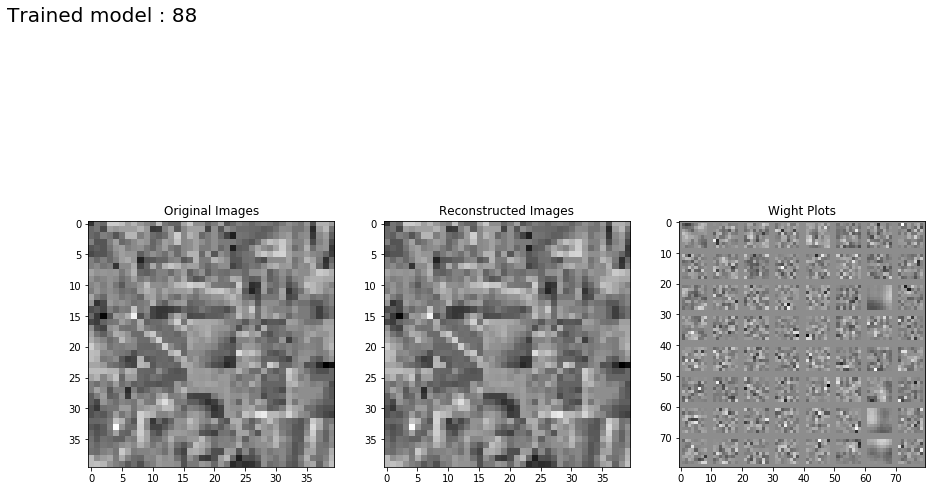

Step 1: Minibatch Loss: 0.015434 Error: 0.015358 Sparse: 0.000767
Step 100: Minibatch Loss: 0.012836 Error: 0.004301 Sparse: 0.085349
Step 200: Minibatch Loss: 0.010159 Error: 0.001686 Sparse: 0.084739
Step 300: Minibatch Loss: 0.009504 Error: 0.001222 Sparse: 0.082818
Step 400: Minibatch Loss: 0.009147 Error: 0.000987 Sparse: 0.081604
Step 500: Minibatch Loss: 0.008776 Error: 0.000838 Sparse: 0.079377
Step 600: Minibatch Loss: 0.008556 Error: 0.000721 Sparse: 0.078346
Step 700: Minibatch Loss: 0.008306 Error: 0.000637 Sparse: 0.076692
Step 800: Minibatch Loss: 0.008121 Error: 0.000567 Sparse: 0.075544
Step 900: Minibatch Loss: 0.008126 Error: 0.000536 Sparse: 0.075903
Step 1000: Minibatch Loss: 0.008115 Error: 0.000514 Sparse: 0.076007
Step 1100: Minibatch Loss: 0.008034 Error: 0.000489 Sparse: 0.075452
Step 1200: Minibatch Loss: 0.007974 Error: 0.000484 Sparse: 0.074902
Step 1300: Minibatch Loss: 0.007938 Error: 0.000486 Sparse: 0.074523
Step 1400: Minibatch Loss: 0.007935 Error: 0.0

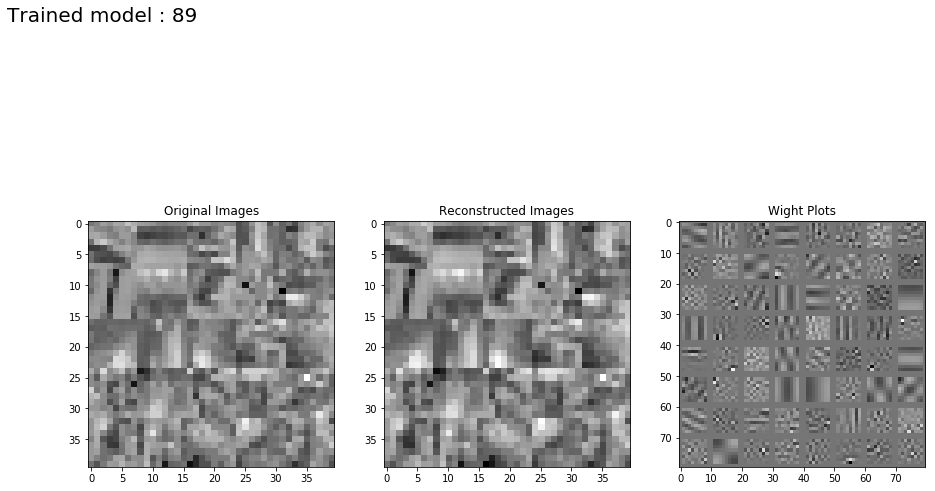

Step 1: Minibatch Loss: 0.016259 Error: 0.015435 Sparse: 0.000823
Step 100: Minibatch Loss: 0.061193 Error: 0.011200 Sparse: 0.049993
Step 200: Minibatch Loss: 0.026493 Error: 0.014834 Sparse: 0.011659
Step 300: Minibatch Loss: 0.016470 Error: 0.015369 Sparse: 0.001101
Step 400: Minibatch Loss: 0.016791 Error: 0.015431 Sparse: 0.001360
Step 500: Minibatch Loss: 0.017020 Error: 0.015413 Sparse: 0.001607
Step 600: Minibatch Loss: 0.017509 Error: 0.015407 Sparse: 0.002101
Step 700: Minibatch Loss: 0.017597 Error: 0.015356 Sparse: 0.002241
Step 800: Minibatch Loss: 0.017901 Error: 0.015367 Sparse: 0.002535
Step 900: Minibatch Loss: 0.018232 Error: 0.015376 Sparse: 0.002855
Step 1000: Minibatch Loss: 0.017914 Error: 0.015432 Sparse: 0.002482
Step 1100: Minibatch Loss: 0.018485 Error: 0.015406 Sparse: 0.003079
Step 1200: Minibatch Loss: 0.019262 Error: 0.015424 Sparse: 0.003838
Step 1300: Minibatch Loss: 0.019162 Error: 0.015378 Sparse: 0.003783
Step 1400: Minibatch Loss: 0.019248 Error: 0.0

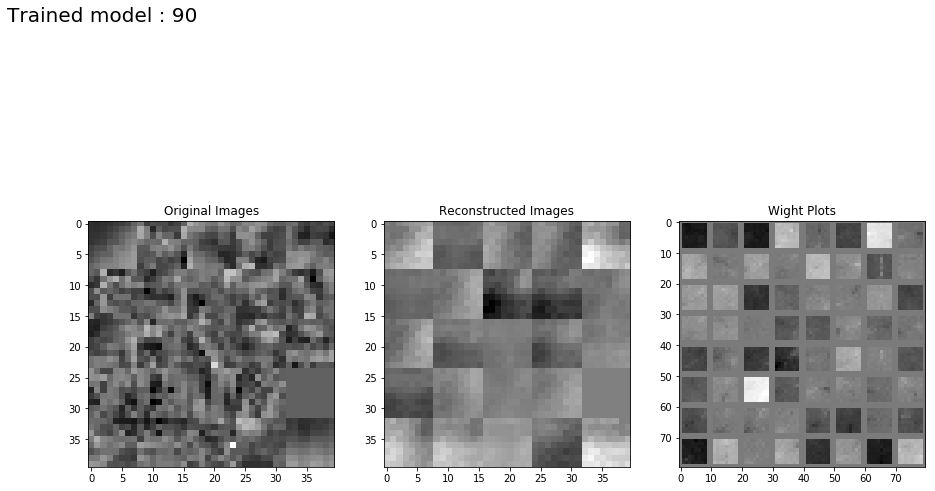

Step 1: Minibatch Loss: 0.015404 Error: 0.015404 Sparse: 0.000803
Step 100: Minibatch Loss: 0.002758 Error: 0.002748 Sparse: 0.091256
Step 200: Minibatch Loss: 0.001196 Error: 0.001187 Sparse: 0.094024
Step 300: Minibatch Loss: 0.000654 Error: 0.000645 Sparse: 0.094940
Step 400: Minibatch Loss: 0.000399 Error: 0.000389 Sparse: 0.096237
Step 500: Minibatch Loss: 0.000220 Error: 0.000210 Sparse: 0.097125
Step 600: Minibatch Loss: 0.000128 Error: 0.000118 Sparse: 0.097478
Step 700: Minibatch Loss: 0.000072 Error: 0.000062 Sparse: 0.097937
Step 800: Minibatch Loss: 0.000034 Error: 0.000024 Sparse: 0.098122
Step 900: Minibatch Loss: 0.000013 Error: 0.000003 Sparse: 0.098302
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097922
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097624
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097746
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098444
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

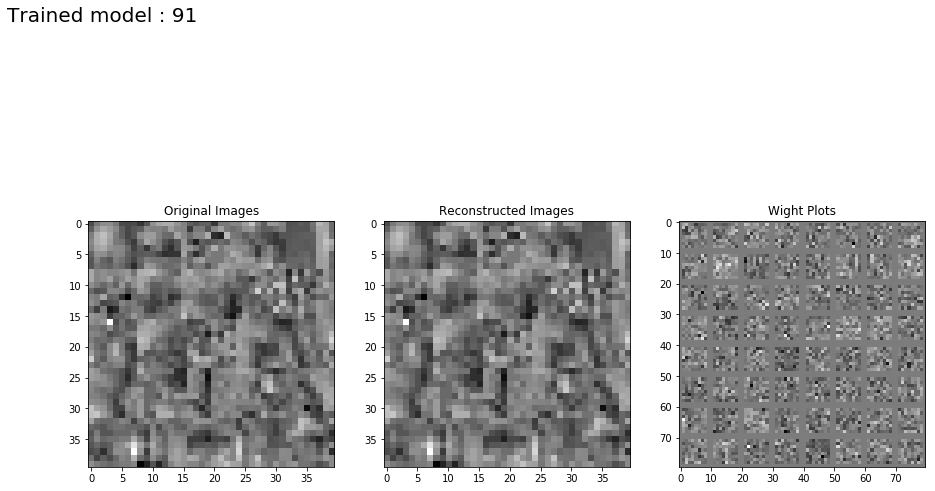

Step 1: Minibatch Loss: 0.015421 Error: 0.015420 Sparse: 0.000786
Step 100: Minibatch Loss: 0.002668 Error: 0.002579 Sparse: 0.089193
Step 200: Minibatch Loss: 0.001125 Error: 0.001032 Sparse: 0.093508
Step 300: Minibatch Loss: 0.000620 Error: 0.000523 Sparse: 0.096654
Step 400: Minibatch Loss: 0.000358 Error: 0.000261 Sparse: 0.096775
Step 500: Minibatch Loss: 0.000271 Error: 0.000174 Sparse: 0.097502
Step 600: Minibatch Loss: 0.000196 Error: 0.000098 Sparse: 0.097238
Step 700: Minibatch Loss: 0.000157 Error: 0.000059 Sparse: 0.097984
Step 800: Minibatch Loss: 0.000137 Error: 0.000039 Sparse: 0.097950
Step 900: Minibatch Loss: 0.000110 Error: 0.000012 Sparse: 0.098518
Step 1000: Minibatch Loss: 0.000099 Error: 0.000001 Sparse: 0.098544
Step 1100: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098121
Step 1200: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098545
Step 1300: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097888
Step 1400: Minibatch Loss: 0.000097 Error: 0.0

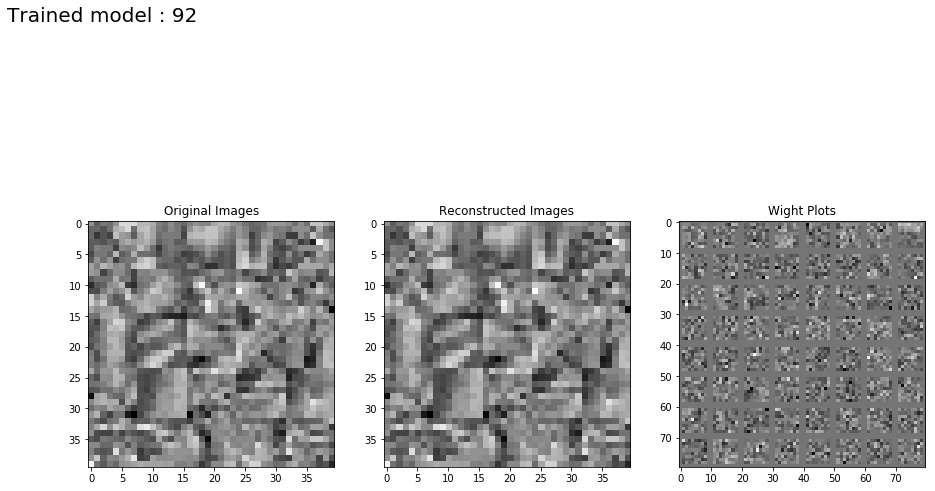

Step 1: Minibatch Loss: 0.015350 Error: 0.015342 Sparse: 0.000776
Step 100: Minibatch Loss: 0.005024 Error: 0.004122 Sparse: 0.090215
Step 200: Minibatch Loss: 0.002334 Error: 0.001403 Sparse: 0.093049
Step 300: Minibatch Loss: 0.001792 Error: 0.000856 Sparse: 0.093525
Step 400: Minibatch Loss: 0.001519 Error: 0.000581 Sparse: 0.093764
Step 500: Minibatch Loss: 0.001362 Error: 0.000415 Sparse: 0.094710
Step 600: Minibatch Loss: 0.001243 Error: 0.000293 Sparse: 0.095033
Step 700: Minibatch Loss: 0.001160 Error: 0.000205 Sparse: 0.095523
Step 800: Minibatch Loss: 0.001098 Error: 0.000145 Sparse: 0.095310
Step 900: Minibatch Loss: 0.001040 Error: 0.000087 Sparse: 0.095287
Step 1000: Minibatch Loss: 0.001008 Error: 0.000058 Sparse: 0.095025
Step 1100: Minibatch Loss: 0.001012 Error: 0.000059 Sparse: 0.095278
Step 1200: Minibatch Loss: 0.000989 Error: 0.000048 Sparse: 0.094142
Step 1300: Minibatch Loss: 0.000969 Error: 0.000035 Sparse: 0.093373
Step 1400: Minibatch Loss: 0.000956 Error: 0.0

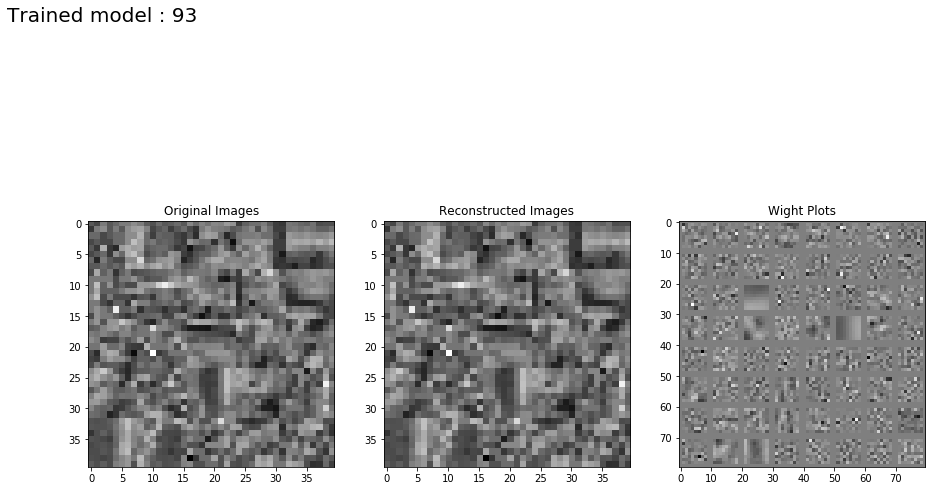

Step 1: Minibatch Loss: 0.015545 Error: 0.015467 Sparse: 0.000779
Step 100: Minibatch Loss: 0.014122 Error: 0.005320 Sparse: 0.088013
Step 200: Minibatch Loss: 0.010442 Error: 0.001925 Sparse: 0.085176
Step 300: Minibatch Loss: 0.009633 Error: 0.001264 Sparse: 0.083689
Step 400: Minibatch Loss: 0.009264 Error: 0.001039 Sparse: 0.082252
Step 500: Minibatch Loss: 0.008910 Error: 0.000886 Sparse: 0.080246
Step 600: Minibatch Loss: 0.008695 Error: 0.000806 Sparse: 0.078891
Step 700: Minibatch Loss: 0.008652 Error: 0.000736 Sparse: 0.079153
Step 800: Minibatch Loss: 0.008479 Error: 0.000681 Sparse: 0.077979
Step 900: Minibatch Loss: 0.008424 Error: 0.000663 Sparse: 0.077614
Step 1000: Minibatch Loss: 0.008281 Error: 0.000618 Sparse: 0.076628
Step 1100: Minibatch Loss: 0.008163 Error: 0.000565 Sparse: 0.075982
Step 1200: Minibatch Loss: 0.008081 Error: 0.000542 Sparse: 0.075387
Step 1300: Minibatch Loss: 0.008092 Error: 0.000536 Sparse: 0.075558
Step 1400: Minibatch Loss: 0.008002 Error: 0.0

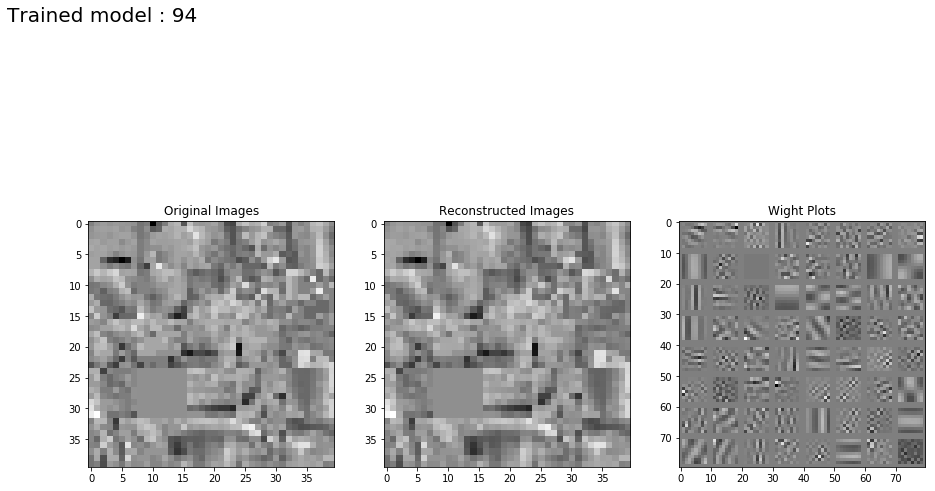

Step 1: Minibatch Loss: 0.016166 Error: 0.015389 Sparse: 0.000777
Step 100: Minibatch Loss: 0.061246 Error: 0.011406 Sparse: 0.049840
Step 200: Minibatch Loss: 0.023950 Error: 0.014982 Sparse: 0.008969
Step 300: Minibatch Loss: 0.016562 Error: 0.015432 Sparse: 0.001129
Step 400: Minibatch Loss: 0.016446 Error: 0.015324 Sparse: 0.001122
Step 500: Minibatch Loss: 0.016985 Error: 0.015460 Sparse: 0.001525
Step 600: Minibatch Loss: 0.017160 Error: 0.015363 Sparse: 0.001797
Step 700: Minibatch Loss: 0.017280 Error: 0.015348 Sparse: 0.001932
Step 800: Minibatch Loss: 0.017401 Error: 0.015490 Sparse: 0.001911
Step 900: Minibatch Loss: 0.017457 Error: 0.015328 Sparse: 0.002129
Step 1000: Minibatch Loss: 0.017672 Error: 0.015340 Sparse: 0.002332
Step 1100: Minibatch Loss: 0.018007 Error: 0.015431 Sparse: 0.002577
Step 1200: Minibatch Loss: 0.018737 Error: 0.015432 Sparse: 0.003305
Step 1300: Minibatch Loss: 0.018207 Error: 0.015286 Sparse: 0.002921
Step 1400: Minibatch Loss: 0.018595 Error: 0.0

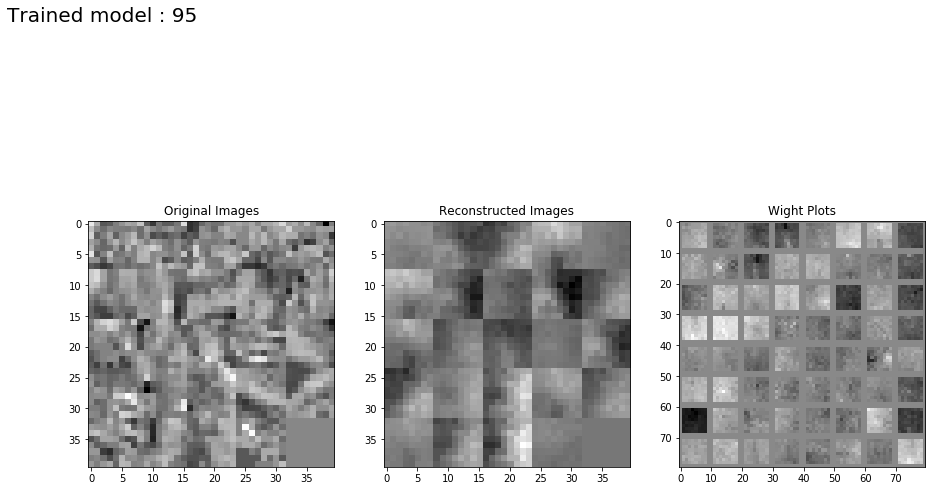

Step 1: Minibatch Loss: 0.015404 Error: 0.015404 Sparse: 0.000790
Step 100: Minibatch Loss: 0.003169 Error: 0.003160 Sparse: 0.091127
Step 200: Minibatch Loss: 0.001127 Error: 0.001117 Sparse: 0.094243
Step 300: Minibatch Loss: 0.000741 Error: 0.000731 Sparse: 0.095838
Step 400: Minibatch Loss: 0.000457 Error: 0.000447 Sparse: 0.096042
Step 500: Minibatch Loss: 0.000295 Error: 0.000285 Sparse: 0.097560
Step 600: Minibatch Loss: 0.000201 Error: 0.000191 Sparse: 0.098237
Step 700: Minibatch Loss: 0.000131 Error: 0.000121 Sparse: 0.098277
Step 800: Minibatch Loss: 0.000086 Error: 0.000076 Sparse: 0.098666
Step 900: Minibatch Loss: 0.000065 Error: 0.000055 Sparse: 0.097895
Step 1000: Minibatch Loss: 0.000066 Error: 0.000056 Sparse: 0.098589
Step 1100: Minibatch Loss: 0.000061 Error: 0.000052 Sparse: 0.098334
Step 1200: Minibatch Loss: 0.000051 Error: 0.000041 Sparse: 0.098587
Step 1300: Minibatch Loss: 0.000029 Error: 0.000020 Sparse: 0.098823
Step 1400: Minibatch Loss: 0.000015 Error: 0.0

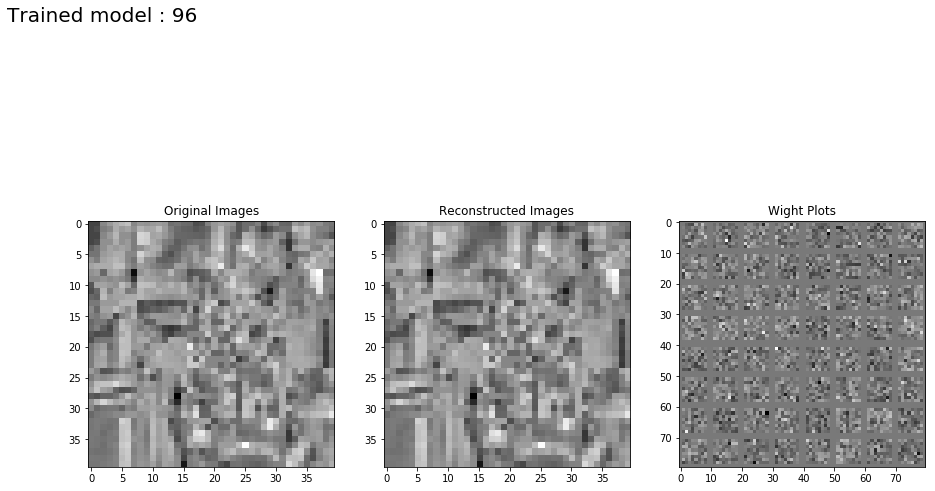

Step 1: Minibatch Loss: 0.015327 Error: 0.015326 Sparse: 0.000823
Step 100: Minibatch Loss: 0.004131 Error: 0.004042 Sparse: 0.088670
Step 200: Minibatch Loss: 0.001665 Error: 0.001572 Sparse: 0.092200
Step 300: Minibatch Loss: 0.001143 Error: 0.001050 Sparse: 0.092787
Step 400: Minibatch Loss: 0.000862 Error: 0.000768 Sparse: 0.094054
Step 500: Minibatch Loss: 0.000645 Error: 0.000550 Sparse: 0.095031
Step 600: Minibatch Loss: 0.000474 Error: 0.000378 Sparse: 0.095562
Step 700: Minibatch Loss: 0.000354 Error: 0.000259 Sparse: 0.095369
Step 800: Minibatch Loss: 0.000282 Error: 0.000186 Sparse: 0.096822
Step 900: Minibatch Loss: 0.000244 Error: 0.000147 Sparse: 0.097155
Step 1000: Minibatch Loss: 0.000197 Error: 0.000100 Sparse: 0.096727
Step 1100: Minibatch Loss: 0.000190 Error: 0.000093 Sparse: 0.097092
Step 1200: Minibatch Loss: 0.000164 Error: 0.000067 Sparse: 0.097376
Step 1300: Minibatch Loss: 0.000151 Error: 0.000053 Sparse: 0.097207
Step 1400: Minibatch Loss: 0.000150 Error: 0.0

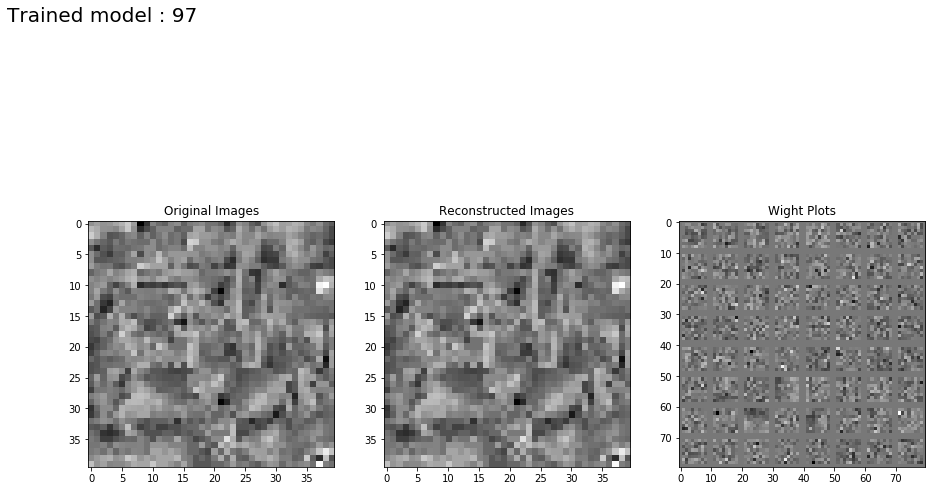

Step 1: Minibatch Loss: 0.015412 Error: 0.015404 Sparse: 0.000784
Step 100: Minibatch Loss: 0.004526 Error: 0.003620 Sparse: 0.090642
Step 200: Minibatch Loss: 0.002251 Error: 0.001326 Sparse: 0.092576
Step 300: Minibatch Loss: 0.001757 Error: 0.000823 Sparse: 0.093430
Step 400: Minibatch Loss: 0.001507 Error: 0.000571 Sparse: 0.093543
Step 500: Minibatch Loss: 0.001384 Error: 0.000443 Sparse: 0.094068
Step 600: Minibatch Loss: 0.001238 Error: 0.000285 Sparse: 0.095303
Step 700: Minibatch Loss: 0.001145 Error: 0.000193 Sparse: 0.095232
Step 800: Minibatch Loss: 0.001065 Error: 0.000123 Sparse: 0.094217
Step 900: Minibatch Loss: 0.001029 Error: 0.000083 Sparse: 0.094605
Step 1000: Minibatch Loss: 0.001014 Error: 0.000065 Sparse: 0.094974
Step 1100: Minibatch Loss: 0.001013 Error: 0.000065 Sparse: 0.094814
Step 1200: Minibatch Loss: 0.001003 Error: 0.000054 Sparse: 0.094872
Step 1300: Minibatch Loss: 0.000996 Error: 0.000058 Sparse: 0.093813
Step 1400: Minibatch Loss: 0.000981 Error: 0.0

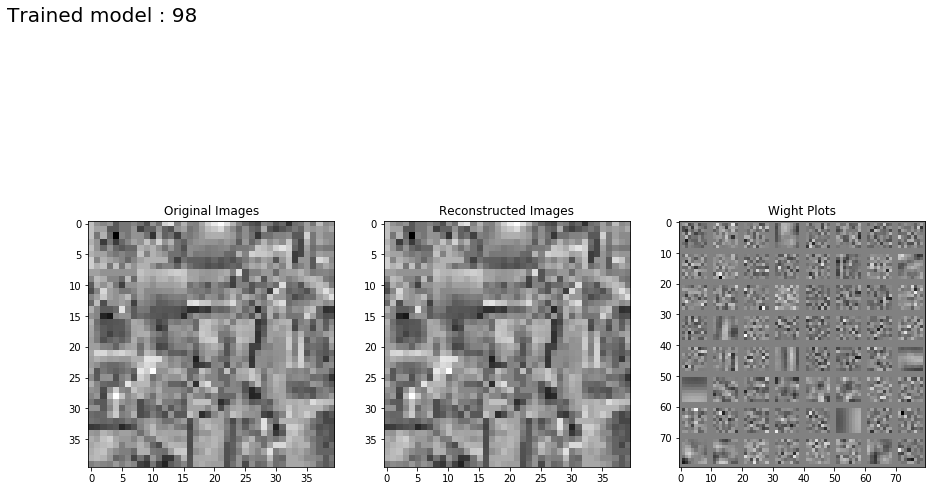

Step 1: Minibatch Loss: 0.015577 Error: 0.015498 Sparse: 0.000785
Step 100: Minibatch Loss: 0.015831 Error: 0.006888 Sparse: 0.089428
Step 200: Minibatch Loss: 0.010628 Error: 0.002010 Sparse: 0.086176
Step 300: Minibatch Loss: 0.009854 Error: 0.001371 Sparse: 0.084822
Step 400: Minibatch Loss: 0.009496 Error: 0.001133 Sparse: 0.083627
Step 500: Minibatch Loss: 0.009250 Error: 0.000964 Sparse: 0.082856
Step 600: Minibatch Loss: 0.009003 Error: 0.000868 Sparse: 0.081354
Step 700: Minibatch Loss: 0.008659 Error: 0.000784 Sparse: 0.078753
Step 800: Minibatch Loss: 0.008675 Error: 0.000731 Sparse: 0.079435
Step 900: Minibatch Loss: 0.008520 Error: 0.000711 Sparse: 0.078097
Step 1000: Minibatch Loss: 0.008359 Error: 0.000647 Sparse: 0.077115
Step 1100: Minibatch Loss: 0.008346 Error: 0.000609 Sparse: 0.077376
Step 1200: Minibatch Loss: 0.008207 Error: 0.000553 Sparse: 0.076544
Step 1300: Minibatch Loss: 0.008188 Error: 0.000531 Sparse: 0.076575
Step 1400: Minibatch Loss: 0.008111 Error: 0.0

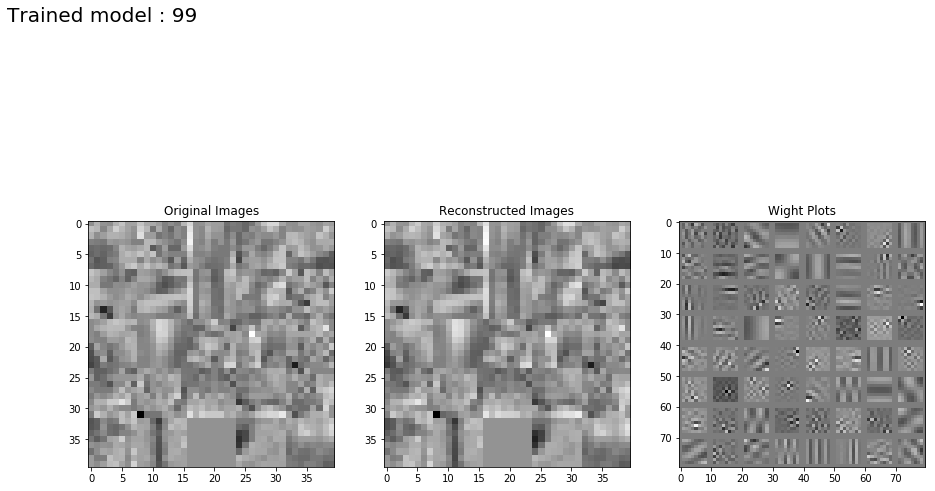

Step 1: Minibatch Loss: 0.016187 Error: 0.015420 Sparse: 0.000767
Step 100: Minibatch Loss: 0.065249 Error: 0.011153 Sparse: 0.054097
Step 200: Minibatch Loss: 0.028138 Error: 0.014431 Sparse: 0.013708
Step 300: Minibatch Loss: 0.017209 Error: 0.015360 Sparse: 0.001849
Step 400: Minibatch Loss: 0.016671 Error: 0.015401 Sparse: 0.001270
Step 500: Minibatch Loss: 0.017053 Error: 0.015397 Sparse: 0.001656
Step 600: Minibatch Loss: 0.017148 Error: 0.015475 Sparse: 0.001673
Step 700: Minibatch Loss: 0.017364 Error: 0.015440 Sparse: 0.001923
Step 800: Minibatch Loss: 0.017781 Error: 0.015359 Sparse: 0.002423
Step 900: Minibatch Loss: 0.017791 Error: 0.015198 Sparse: 0.002594
Step 1000: Minibatch Loss: 0.018004 Error: 0.015349 Sparse: 0.002655
Step 1100: Minibatch Loss: 0.018438 Error: 0.015370 Sparse: 0.003067
Step 1200: Minibatch Loss: 0.018086 Error: 0.015366 Sparse: 0.002721
Step 1300: Minibatch Loss: 0.018721 Error: 0.015411 Sparse: 0.003310
Step 1400: Minibatch Loss: 0.018666 Error: 0.0

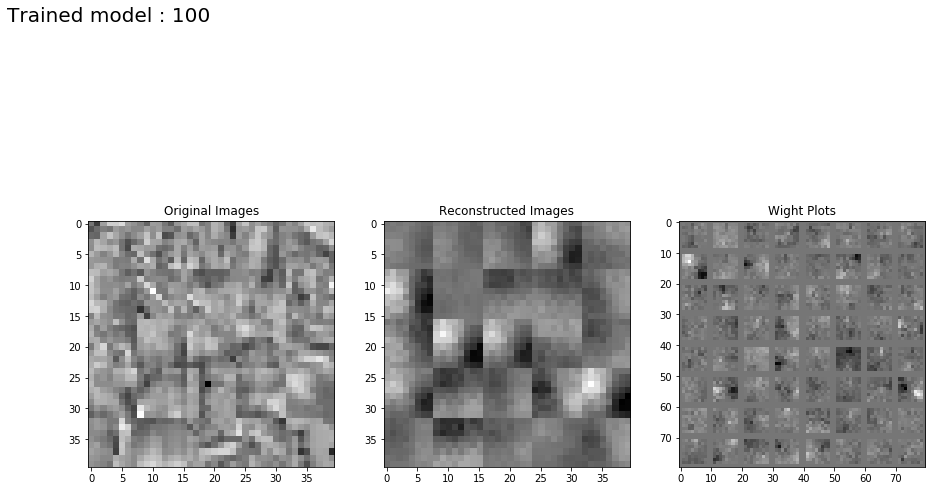

Step 1: Minibatch Loss: 0.015451 Error: 0.015451 Sparse: 0.000788
Step 100: Minibatch Loss: 33.132427 Error: 33.132370 Sparse: 0.556770
Step 200: Minibatch Loss: 7.412387 Error: 7.412350 Sparse: 0.370966
Step 300: Minibatch Loss: 3.009755 Error: 3.009725 Sparse: 0.299230
Step 400: Minibatch Loss: 1.464784 Error: 1.464758 Sparse: 0.254122
Step 500: Minibatch Loss: 0.822746 Error: 0.822724 Sparse: 0.224256
Step 600: Minibatch Loss: 0.520375 Error: 0.520355 Sparse: 0.203197
Step 700: Minibatch Loss: 0.336664 Error: 0.336645 Sparse: 0.185392
Step 800: Minibatch Loss: 0.235873 Error: 0.235856 Sparse: 0.174843
Step 900: Minibatch Loss: 0.166720 Error: 0.166704 Sparse: 0.163861
Step 1000: Minibatch Loss: 0.122639 Error: 0.122623 Sparse: 0.154899


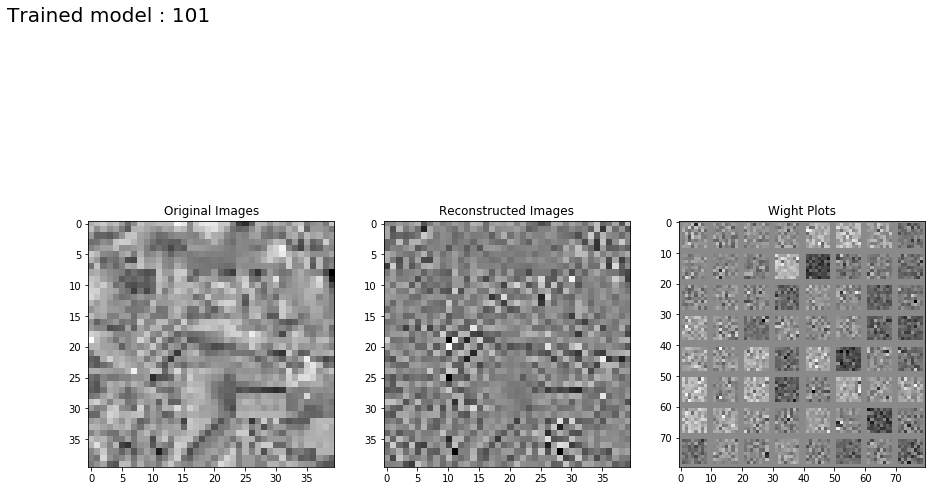

Step 1: Minibatch Loss: 0.015468 Error: 0.015467 Sparse: 0.000790
Step 100: Minibatch Loss: 27.845024 Error: 27.844500 Sparse: 0.523702
Step 200: Minibatch Loss: 6.405062 Error: 6.404705 Sparse: 0.357212
Step 300: Minibatch Loss: 2.570926 Error: 2.570637 Sparse: 0.288901
Step 400: Minibatch Loss: 1.323577 Error: 1.323328 Sparse: 0.249186
Step 500: Minibatch Loss: 0.751985 Error: 0.751765 Sparse: 0.219923
Step 600: Minibatch Loss: 0.466564 Error: 0.466366 Sparse: 0.198087
Step 700: Minibatch Loss: 0.322485 Error: 0.322299 Sparse: 0.186466
Step 800: Minibatch Loss: 0.219325 Error: 0.219152 Sparse: 0.173282
Step 900: Minibatch Loss: 0.153162 Error: 0.153000 Sparse: 0.162579
Step 1000: Minibatch Loss: 0.110411 Error: 0.110259 Sparse: 0.151846


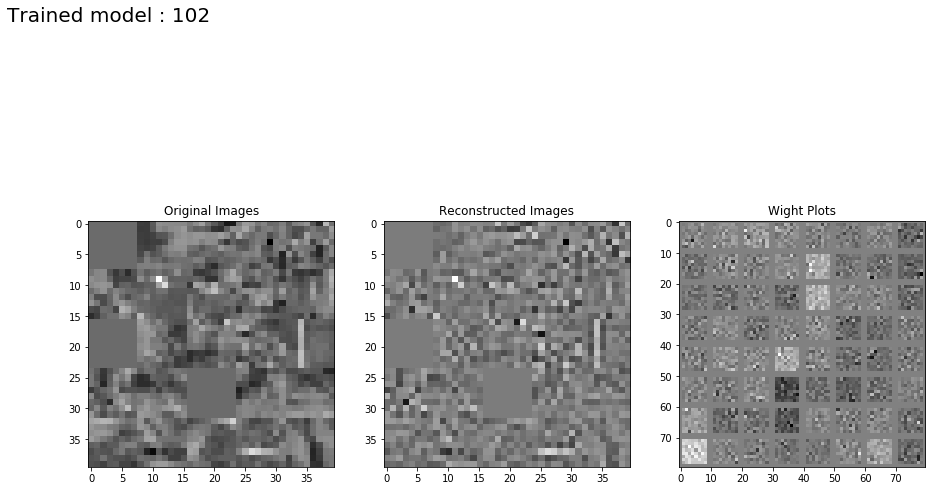

Step 1: Minibatch Loss: 0.015444 Error: 0.015435 Sparse: 0.000815
Step 100: Minibatch Loss: 42.122105 Error: 42.116314 Sparse: 0.579081
Step 200: Minibatch Loss: 10.003234 Error: 9.999261 Sparse: 0.397314
Step 300: Minibatch Loss: 3.827556 Error: 3.824415 Sparse: 0.314100
Step 400: Minibatch Loss: 1.929878 Error: 1.927179 Sparse: 0.269900
Step 500: Minibatch Loss: 1.163966 Error: 1.161545 Sparse: 0.242136
Step 600: Minibatch Loss: 0.717822 Error: 0.715640 Sparse: 0.218184
Step 700: Minibatch Loss: 0.463662 Error: 0.461676 Sparse: 0.198597
Step 800: Minibatch Loss: 0.327037 Error: 0.325182 Sparse: 0.185488
Step 900: Minibatch Loss: 0.232280 Error: 0.230540 Sparse: 0.174091
Step 1000: Minibatch Loss: 0.175074 Error: 0.173408 Sparse: 0.166690


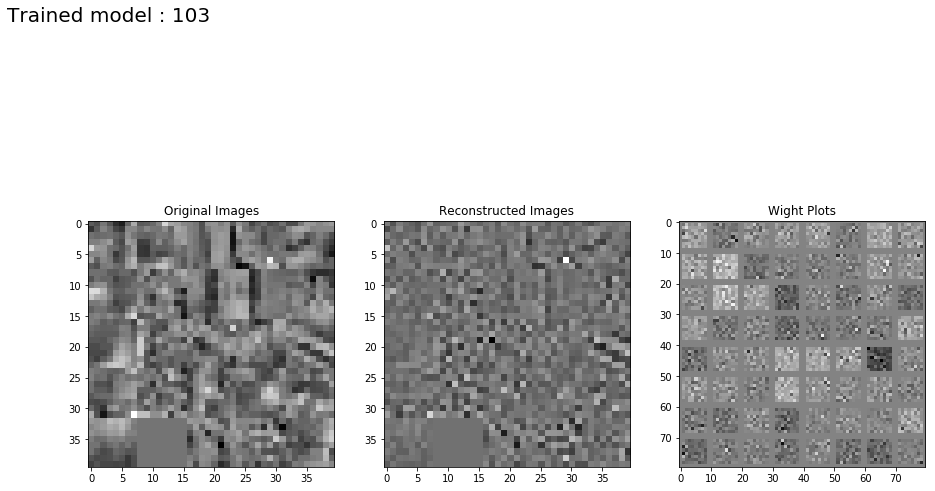

Step 1: Minibatch Loss: 0.015452 Error: 0.015373 Sparse: 0.000788
Step 100: Minibatch Loss: 77.058456 Error: 76.992920 Sparse: 0.655327
Step 200: Minibatch Loss: 17.810789 Error: 17.765886 Sparse: 0.449032
Step 300: Minibatch Loss: 7.652296 Error: 7.615468 Sparse: 0.368286
Step 400: Minibatch Loss: 3.846690 Error: 3.815390 Sparse: 0.313000
Step 500: Minibatch Loss: 2.193369 Error: 2.165776 Sparse: 0.275934
Step 600: Minibatch Loss: 1.375727 Error: 1.350731 Sparse: 0.249955
Step 700: Minibatch Loss: 0.942163 Error: 0.919262 Sparse: 0.229005
Step 800: Minibatch Loss: 0.656197 Error: 0.635167 Sparse: 0.210302
Step 900: Minibatch Loss: 0.458816 Error: 0.439382 Sparse: 0.194343
Step 1000: Minibatch Loss: 0.348949 Error: 0.330376 Sparse: 0.185734


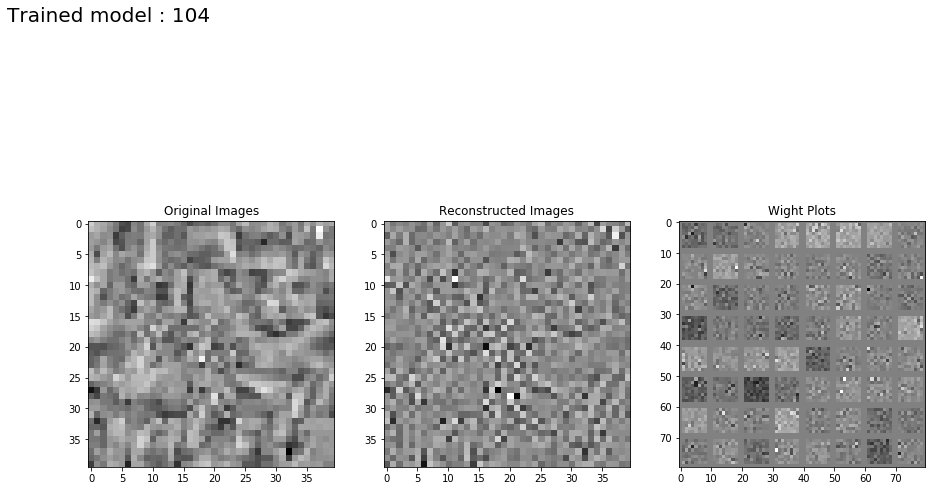

Step 1: Minibatch Loss: 0.016229 Error: 0.015420 Sparse: 0.000809
Step 100: Minibatch Loss: 90.358047 Error: 89.679665 Sparse: 0.678385
Step 200: Minibatch Loss: 21.427481 Error: 20.964340 Sparse: 0.463140
Step 300: Minibatch Loss: 9.273088 Error: 8.893866 Sparse: 0.379223
Step 400: Minibatch Loss: 4.746459 Error: 4.426038 Sparse: 0.320422
Step 500: Minibatch Loss: 2.803560 Error: 2.522069 Sparse: 0.281490
Step 600: Minibatch Loss: 1.811570 Error: 1.561090 Sparse: 0.250480
Step 700: Minibatch Loss: 1.223976 Error: 0.997733 Sparse: 0.226243
Step 800: Minibatch Loss: 0.883953 Error: 0.676735 Sparse: 0.207218
Step 900: Minibatch Loss: 0.662006 Error: 0.471583 Sparse: 0.190422
Step 1000: Minibatch Loss: 0.525873 Error: 0.348431 Sparse: 0.177442


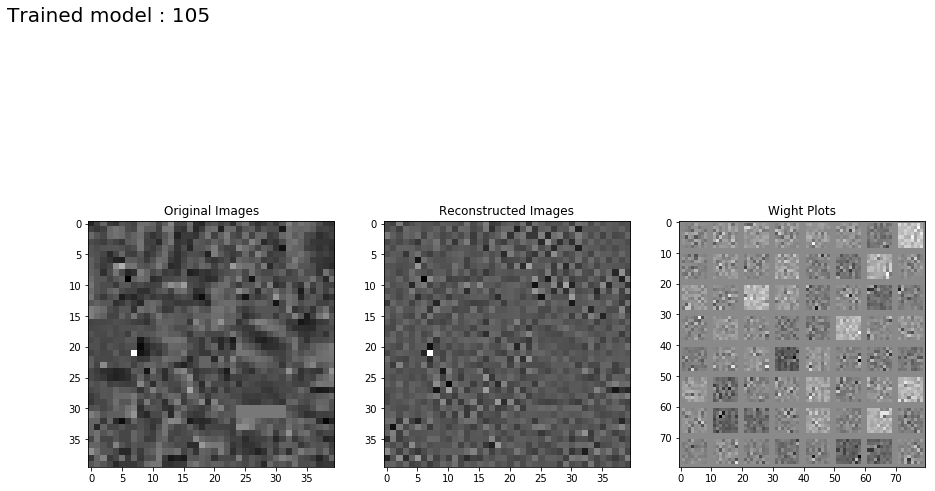

Step 1: Minibatch Loss: 0.015326 Error: 0.015326 Sparse: 0.000774
Step 100: Minibatch Loss: 43.248138 Error: 43.248081 Sparse: 0.584818
Step 200: Minibatch Loss: 9.791751 Error: 9.791711 Sparse: 0.399703
Step 300: Minibatch Loss: 3.918603 Error: 3.918571 Sparse: 0.319747
Step 400: Minibatch Loss: 1.988409 Error: 1.988381 Sparse: 0.271726
Step 500: Minibatch Loss: 1.126300 Error: 1.126276 Sparse: 0.240011
Step 600: Minibatch Loss: 0.710999 Error: 0.710977 Sparse: 0.216031
Step 700: Minibatch Loss: 0.476421 Error: 0.476401 Sparse: 0.199147
Step 800: Minibatch Loss: 0.328922 Error: 0.328903 Sparse: 0.186508
Step 900: Minibatch Loss: 0.240830 Error: 0.240813 Sparse: 0.175842
Step 1000: Minibatch Loss: 0.174106 Error: 0.174089 Sparse: 0.166365
Step 1100: Minibatch Loss: 0.125065 Error: 0.125049 Sparse: 0.156414
Step 1200: Minibatch Loss: 0.092557 Error: 0.092543 Sparse: 0.147936
Step 1300: Minibatch Loss: 0.075389 Error: 0.075374 Sparse: 0.145531
Step 1400: Minibatch Loss: 0.058290 Error: 0

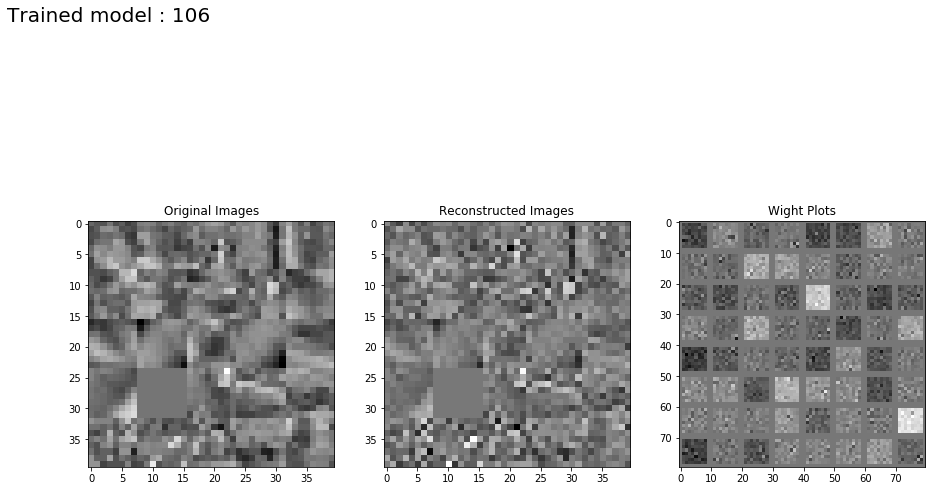

Step 1: Minibatch Loss: 0.015374 Error: 0.015373 Sparse: 0.000789
Step 100: Minibatch Loss: 29.541761 Error: 29.541237 Sparse: 0.523904
Step 200: Minibatch Loss: 6.390314 Error: 6.389963 Sparse: 0.350719
Step 300: Minibatch Loss: 2.782178 Error: 2.781885 Sparse: 0.292454
Step 400: Minibatch Loss: 1.307689 Error: 1.307445 Sparse: 0.244014
Step 500: Minibatch Loss: 0.785604 Error: 0.785384 Sparse: 0.220551
Step 600: Minibatch Loss: 0.499798 Error: 0.499600 Sparse: 0.198631
Step 700: Minibatch Loss: 0.322735 Error: 0.322552 Sparse: 0.183020
Step 800: Minibatch Loss: 0.223341 Error: 0.223170 Sparse: 0.171311
Step 900: Minibatch Loss: 0.158532 Error: 0.158371 Sparse: 0.160838
Step 1000: Minibatch Loss: 0.116631 Error: 0.116478 Sparse: 0.153126
Step 1100: Minibatch Loss: 0.084425 Error: 0.084281 Sparse: 0.144307
Step 1200: Minibatch Loss: 0.065364 Error: 0.065224 Sparse: 0.140385
Step 1300: Minibatch Loss: 0.050114 Error: 0.049980 Sparse: 0.133545
Step 1400: Minibatch Loss: 0.038540 Error: 0

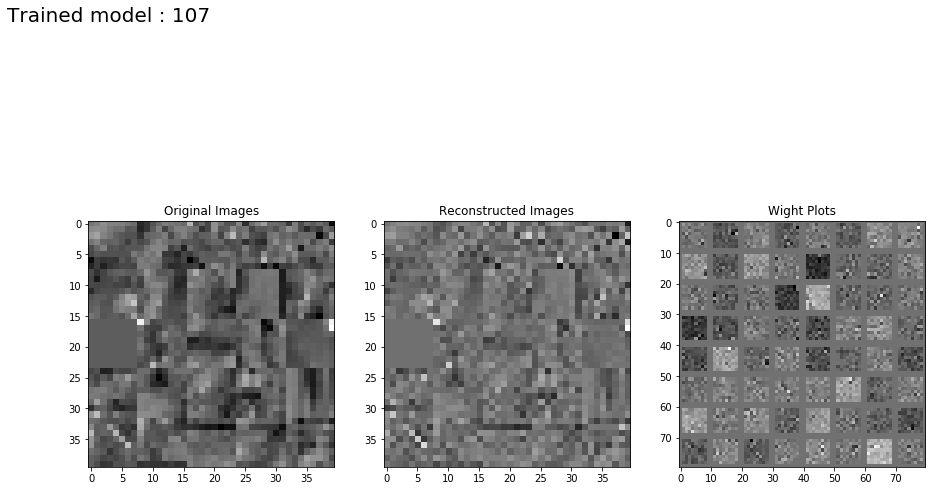

Step 1: Minibatch Loss: 0.015428 Error: 0.015420 Sparse: 0.000781
Step 100: Minibatch Loss: 35.497032 Error: 35.491539 Sparse: 0.549343
Step 200: Minibatch Loss: 7.879818 Error: 7.876130 Sparse: 0.368764
Step 300: Minibatch Loss: 3.198593 Error: 3.195613 Sparse: 0.298045
Step 400: Minibatch Loss: 1.624152 Error: 1.621586 Sparse: 0.256580
Step 500: Minibatch Loss: 0.946198 Error: 0.943898 Sparse: 0.229996
Step 600: Minibatch Loss: 0.592316 Error: 0.590236 Sparse: 0.207956
Step 700: Minibatch Loss: 0.385448 Error: 0.383551 Sparse: 0.189665
Step 800: Minibatch Loss: 0.268504 Error: 0.266731 Sparse: 0.177255
Step 900: Minibatch Loss: 0.187150 Error: 0.185494 Sparse: 0.165597
Step 1000: Minibatch Loss: 0.137583 Error: 0.136017 Sparse: 0.156638
Step 1100: Minibatch Loss: 0.107197 Error: 0.105683 Sparse: 0.151394
Step 1200: Minibatch Loss: 0.078755 Error: 0.077316 Sparse: 0.143854
Step 1300: Minibatch Loss: 0.059839 Error: 0.058459 Sparse: 0.138064
Step 1400: Minibatch Loss: 0.045901 Error: 0

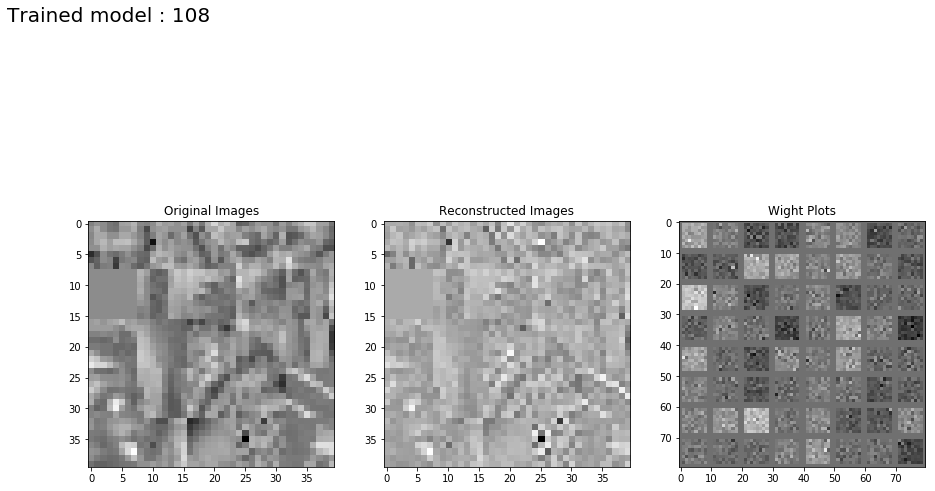

Step 1: Minibatch Loss: 0.015576 Error: 0.015498 Sparse: 0.000775
Step 100: Minibatch Loss: 98.269814 Error: 98.199127 Sparse: 0.706836
Step 200: Minibatch Loss: 24.037930 Error: 23.989794 Sparse: 0.481360
Step 300: Minibatch Loss: 10.006761 Error: 9.967434 Sparse: 0.393270
Step 400: Minibatch Loss: 4.983853 Error: 4.950764 Sparse: 0.330896
Step 500: Minibatch Loss: 2.748564 Error: 2.719895 Sparse: 0.286693
Step 600: Minibatch Loss: 1.799284 Error: 1.773239 Sparse: 0.260448
Step 700: Minibatch Loss: 1.151913 Error: 1.128490 Sparse: 0.234230
Step 800: Minibatch Loss: 0.805994 Error: 0.784243 Sparse: 0.217504
Step 900: Minibatch Loss: 0.569592 Error: 0.549482 Sparse: 0.201108
Step 1000: Minibatch Loss: 0.429669 Error: 0.410695 Sparse: 0.189743
Step 1100: Minibatch Loss: 0.321259 Error: 0.303340 Sparse: 0.179188
Step 1200: Minibatch Loss: 0.253640 Error: 0.236542 Sparse: 0.170986
Step 1300: Minibatch Loss: 0.192779 Error: 0.176602 Sparse: 0.161771
Step 1400: Minibatch Loss: 0.153756 Error

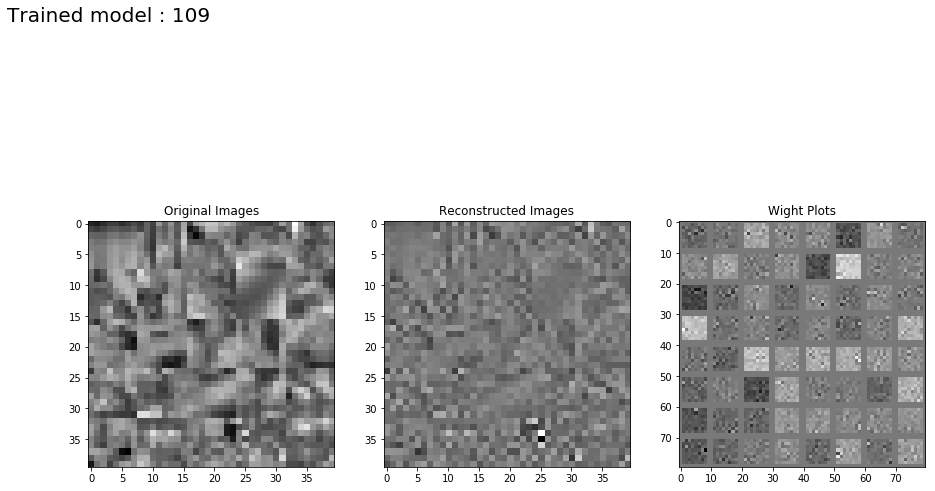

Step 1: Minibatch Loss: 0.016194 Error: 0.015404 Sparse: 0.000790
Step 100: Minibatch Loss: 91.928024 Error: 91.235718 Sparse: 0.692305
Step 200: Minibatch Loss: 20.196148 Error: 19.736979 Sparse: 0.459170
Step 300: Minibatch Loss: 8.194818 Error: 7.830894 Sparse: 0.363923
Step 400: Minibatch Loss: 4.140867 Error: 3.830171 Sparse: 0.310696
Step 500: Minibatch Loss: 2.406115 Error: 2.137187 Sparse: 0.268929
Step 600: Minibatch Loss: 1.584275 Error: 1.341275 Sparse: 0.243001
Step 700: Minibatch Loss: 1.137690 Error: 0.913929 Sparse: 0.223762
Step 800: Minibatch Loss: 0.794188 Error: 0.591658 Sparse: 0.202530
Step 900: Minibatch Loss: 0.608277 Error: 0.420959 Sparse: 0.187318
Step 1000: Minibatch Loss: 0.460170 Error: 0.289582 Sparse: 0.170588
Step 1100: Minibatch Loss: 0.381152 Error: 0.220184 Sparse: 0.160968
Step 1200: Minibatch Loss: 0.307119 Error: 0.158200 Sparse: 0.148919
Step 1300: Minibatch Loss: 0.256164 Error: 0.118287 Sparse: 0.137877
Step 1400: Minibatch Loss: 0.221683 Error:

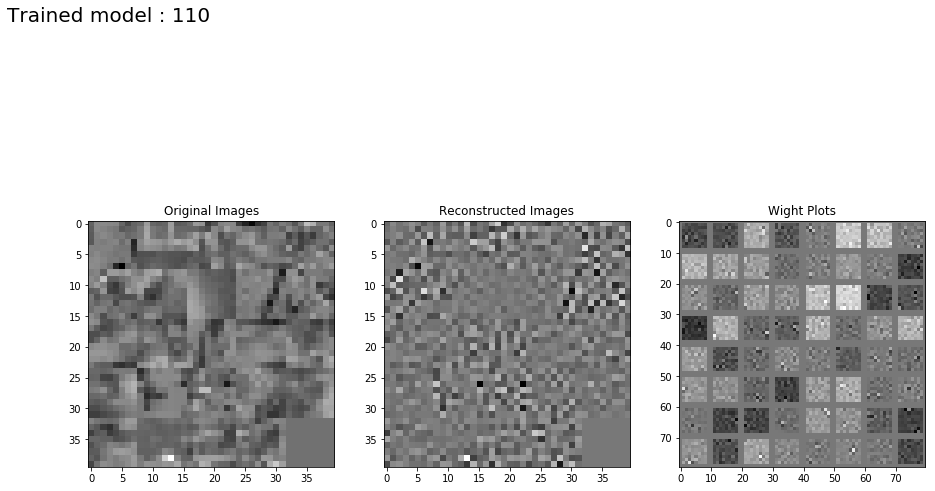

Step 1: Minibatch Loss: 0.015264 Error: 0.015264 Sparse: 0.000742
Step 100: Minibatch Loss: 33.104511 Error: 33.104458 Sparse: 0.545254
Step 200: Minibatch Loss: 7.328907 Error: 7.328871 Sparse: 0.364443
Step 300: Minibatch Loss: 2.983115 Error: 2.983086 Sparse: 0.296328
Step 400: Minibatch Loss: 1.536550 Error: 1.536525 Sparse: 0.254630
Step 500: Minibatch Loss: 0.873101 Error: 0.873078 Sparse: 0.225970
Step 600: Minibatch Loss: 0.548280 Error: 0.548259 Sparse: 0.203865
Step 700: Minibatch Loss: 0.354542 Error: 0.354523 Sparse: 0.187415
Step 800: Minibatch Loss: 0.231939 Error: 0.231922 Sparse: 0.172646
Step 900: Minibatch Loss: 0.173106 Error: 0.173090 Sparse: 0.165246
Step 1000: Minibatch Loss: 0.124269 Error: 0.124254 Sparse: 0.156627
Step 1100: Minibatch Loss: 0.092236 Error: 0.092221 Sparse: 0.148105
Step 1200: Minibatch Loss: 0.071752 Error: 0.071738 Sparse: 0.144015
Step 1300: Minibatch Loss: 0.055910 Error: 0.055896 Sparse: 0.138909
Step 1400: Minibatch Loss: 0.041956 Error: 0

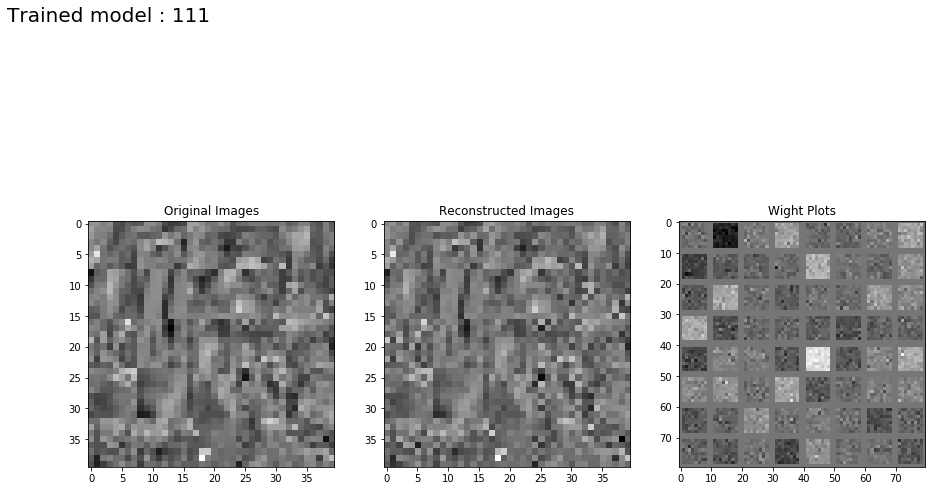

Step 1: Minibatch Loss: 0.015421 Error: 0.015420 Sparse: 0.000791
Step 100: Minibatch Loss: 20.958530 Error: 20.958042 Sparse: 0.488692
Step 200: Minibatch Loss: 4.624716 Error: 4.624388 Sparse: 0.328394
Step 300: Minibatch Loss: 1.918696 Error: 1.918429 Sparse: 0.267320
Step 400: Minibatch Loss: 1.022157 Error: 1.021924 Sparse: 0.233162
Step 500: Minibatch Loss: 0.610554 Error: 0.610345 Sparse: 0.208996
Step 600: Minibatch Loss: 0.366634 Error: 0.366445 Sparse: 0.188282
Step 700: Minibatch Loss: 0.252223 Error: 0.252047 Sparse: 0.176291
Step 800: Minibatch Loss: 0.172745 Error: 0.172582 Sparse: 0.163449
Step 900: Minibatch Loss: 0.122340 Error: 0.122185 Sparse: 0.154278
Step 1000: Minibatch Loss: 0.092211 Error: 0.092063 Sparse: 0.148099
Step 1100: Minibatch Loss: 0.065938 Error: 0.065797 Sparse: 0.140827
Step 1200: Minibatch Loss: 0.051204 Error: 0.051067 Sparse: 0.136616
Step 1300: Minibatch Loss: 0.038655 Error: 0.038524 Sparse: 0.131153
Step 1400: Minibatch Loss: 0.030573 Error: 0

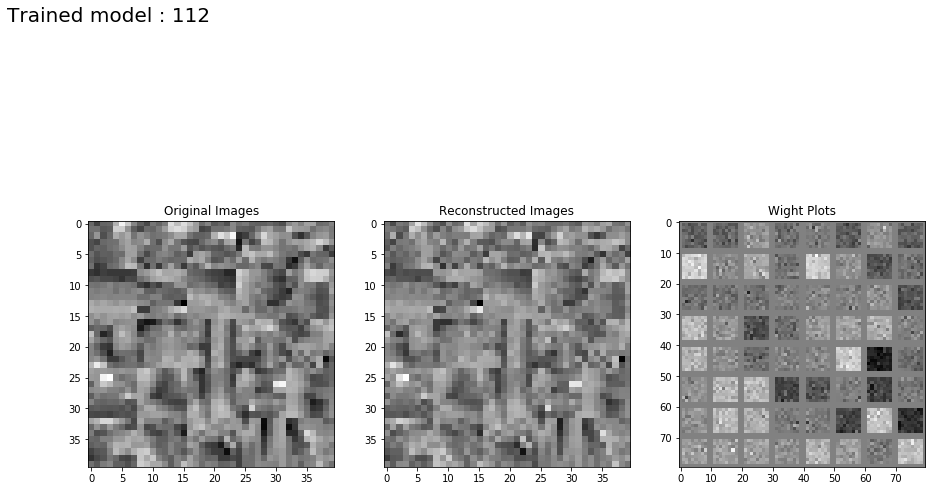

Step 1: Minibatch Loss: 0.015490 Error: 0.015482 Sparse: 0.000798
Step 100: Minibatch Loss: 37.252094 Error: 37.246475 Sparse: 0.561854
Step 200: Minibatch Loss: 8.386955 Error: 8.383151 Sparse: 0.380407
Step 300: Minibatch Loss: 3.407997 Error: 3.404926 Sparse: 0.307110
Step 400: Minibatch Loss: 1.729256 Error: 1.726606 Sparse: 0.264955
Step 500: Minibatch Loss: 0.995231 Error: 0.992894 Sparse: 0.233727
Step 600: Minibatch Loss: 0.634365 Error: 0.632247 Sparse: 0.211779
Step 700: Minibatch Loss: 0.407351 Error: 0.405412 Sparse: 0.193899
Step 800: Minibatch Loss: 0.285698 Error: 0.283881 Sparse: 0.181762
Step 900: Minibatch Loss: 0.198085 Error: 0.196404 Sparse: 0.168128
Step 1000: Minibatch Loss: 0.150420 Error: 0.148802 Sparse: 0.161790
Step 1100: Minibatch Loss: 0.111714 Error: 0.110183 Sparse: 0.153138
Step 1200: Minibatch Loss: 0.083039 Error: 0.081576 Sparse: 0.146295
Step 1300: Minibatch Loss: 0.063169 Error: 0.061769 Sparse: 0.140043
Step 1400: Minibatch Loss: 0.050435 Error: 0

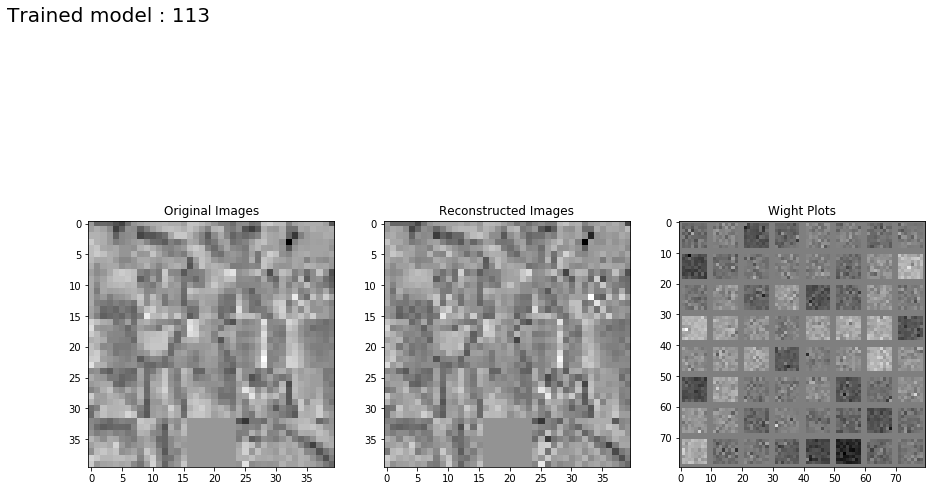

Step 1: Minibatch Loss: 0.015452 Error: 0.015373 Sparse: 0.000786
Step 100: Minibatch Loss: 63.271912 Error: 63.209538 Sparse: 0.623758
Step 200: Minibatch Loss: 14.426301 Error: 14.384467 Sparse: 0.418337
Step 300: Minibatch Loss: 6.070787 Error: 6.036701 Sparse: 0.340867
Step 400: Minibatch Loss: 3.119417 Error: 3.090090 Sparse: 0.293277
Step 500: Minibatch Loss: 1.837469 Error: 1.811239 Sparse: 0.262302
Step 600: Minibatch Loss: 1.145781 Error: 1.122409 Sparse: 0.233713
Step 700: Minibatch Loss: 0.741888 Error: 0.720508 Sparse: 0.213795
Step 800: Minibatch Loss: 0.526044 Error: 0.506113 Sparse: 0.199308
Step 900: Minibatch Loss: 0.382429 Error: 0.363845 Sparse: 0.185834
Step 1000: Minibatch Loss: 0.284791 Error: 0.267166 Sparse: 0.176251
Step 1100: Minibatch Loss: 0.213435 Error: 0.196810 Sparse: 0.166247
Step 1200: Minibatch Loss: 0.169119 Error: 0.153216 Sparse: 0.159033
Step 1300: Minibatch Loss: 0.128321 Error: 0.113296 Sparse: 0.150252
Step 1400: Minibatch Loss: 0.104861 Error:

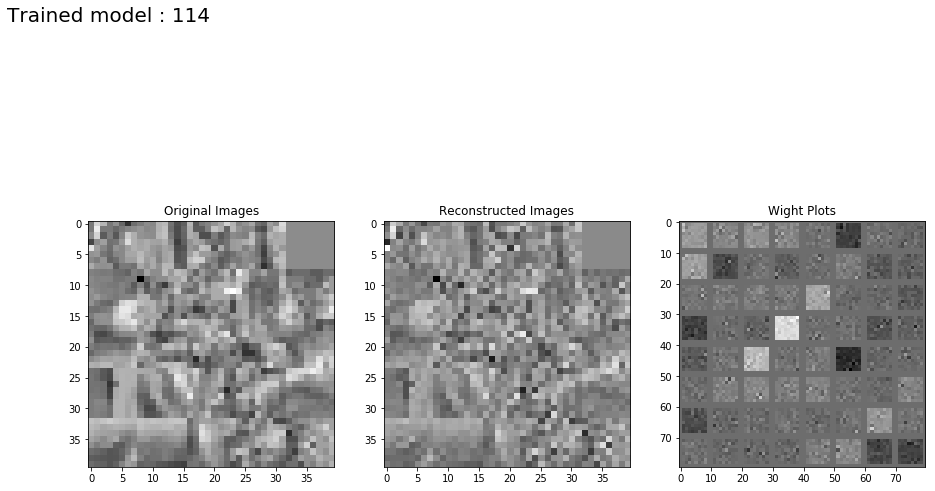

Step 1: Minibatch Loss: 0.016288 Error: 0.015498 Sparse: 0.000790
Step 100: Minibatch Loss: 74.582939 Error: 73.937172 Sparse: 0.645765
Step 200: Minibatch Loss: 17.890450 Error: 17.446678 Sparse: 0.443771
Step 300: Minibatch Loss: 7.311964 Error: 6.960445 Sparse: 0.351518
Step 400: Minibatch Loss: 3.908761 Error: 3.607265 Sparse: 0.301496
Step 500: Minibatch Loss: 2.379644 Error: 2.113508 Sparse: 0.266136
Step 600: Minibatch Loss: 1.567561 Error: 1.327640 Sparse: 0.239921
Step 700: Minibatch Loss: 1.086396 Error: 0.870347 Sparse: 0.216049
Step 800: Minibatch Loss: 0.799363 Error: 0.599548 Sparse: 0.199815
Step 900: Minibatch Loss: 0.603201 Error: 0.419666 Sparse: 0.183534
Step 1000: Minibatch Loss: 0.466412 Error: 0.298548 Sparse: 0.167865
Step 1100: Minibatch Loss: 0.375417 Error: 0.218066 Sparse: 0.157351
Step 1200: Minibatch Loss: 0.316812 Error: 0.168669 Sparse: 0.148143
Step 1300: Minibatch Loss: 0.266538 Error: 0.128380 Sparse: 0.138158
Step 1400: Minibatch Loss: 0.224601 Error:

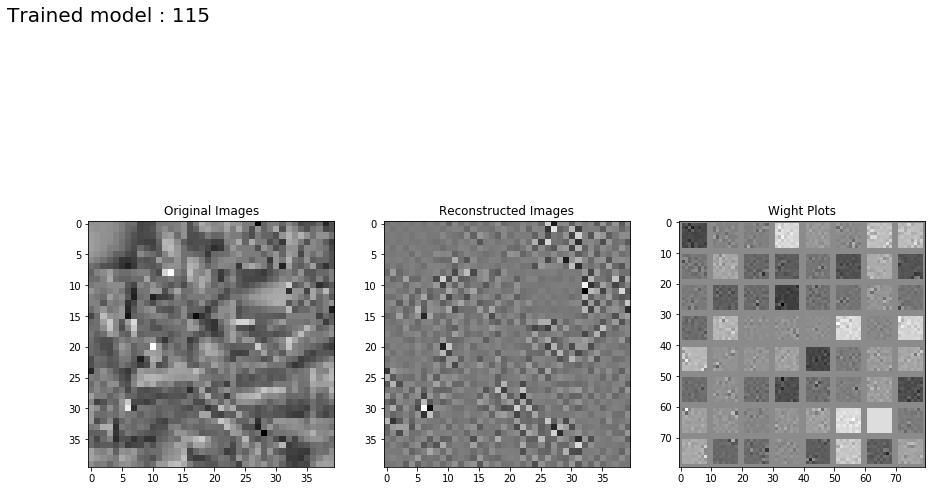

Step 1: Minibatch Loss: 0.015498 Error: 0.015498 Sparse: 0.000856
Step 100: Minibatch Loss: 30.017776 Error: 30.017723 Sparse: 0.537667
Step 200: Minibatch Loss: 6.604854 Error: 6.604817 Sparse: 0.360360
Step 300: Minibatch Loss: 2.725218 Error: 2.725189 Sparse: 0.293182
Step 400: Minibatch Loss: 1.387375 Error: 1.387349 Sparse: 0.251323
Step 500: Minibatch Loss: 0.785449 Error: 0.785427 Sparse: 0.223872
Step 600: Minibatch Loss: 0.489321 Error: 0.489301 Sparse: 0.202959
Step 700: Minibatch Loss: 0.331466 Error: 0.331447 Sparse: 0.187484
Step 800: Minibatch Loss: 0.222882 Error: 0.222864 Sparse: 0.173232
Step 900: Minibatch Loss: 0.164868 Error: 0.164851 Sparse: 0.164277
Step 1000: Minibatch Loss: 0.118453 Error: 0.118438 Sparse: 0.155293
Step 1100: Minibatch Loss: 0.087719 Error: 0.087704 Sparse: 0.148552
Step 1200: Minibatch Loss: 0.065767 Error: 0.065753 Sparse: 0.141607
Step 1300: Minibatch Loss: 0.050197 Error: 0.050183 Sparse: 0.136453
Step 1400: Minibatch Loss: 0.040519 Error: 0

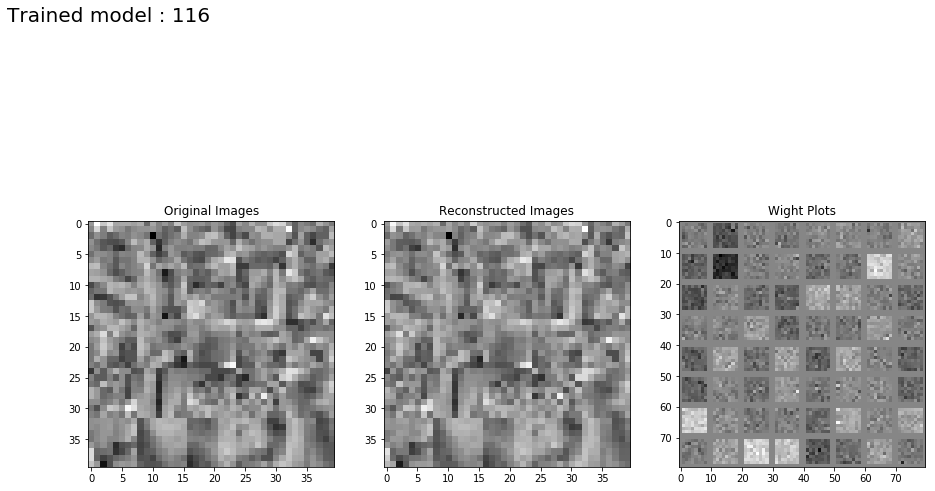

Step 1: Minibatch Loss: 0.015421 Error: 0.015420 Sparse: 0.000797
Step 100: Minibatch Loss: 22.077782 Error: 22.077290 Sparse: 0.492698
Step 200: Minibatch Loss: 4.759140 Error: 4.758808 Sparse: 0.332033
Step 300: Minibatch Loss: 1.949307 Error: 1.949038 Sparse: 0.268244
Step 400: Minibatch Loss: 0.988499 Error: 0.988267 Sparse: 0.231937
Step 500: Minibatch Loss: 0.582941 Error: 0.582733 Sparse: 0.208013
Step 600: Minibatch Loss: 0.368705 Error: 0.368516 Sparse: 0.189557
Step 700: Minibatch Loss: 0.246028 Error: 0.245852 Sparse: 0.175619
Step 800: Minibatch Loss: 0.168481 Error: 0.168317 Sparse: 0.163884
Step 900: Minibatch Loss: 0.119905 Error: 0.119750 Sparse: 0.154938
Step 1000: Minibatch Loss: 0.086637 Error: 0.086490 Sparse: 0.146875
Step 1100: Minibatch Loss: 0.065671 Error: 0.065529 Sparse: 0.142360
Step 1200: Minibatch Loss: 0.049614 Error: 0.049478 Sparse: 0.136155
Step 1300: Minibatch Loss: 0.037761 Error: 0.037629 Sparse: 0.131328
Step 1400: Minibatch Loss: 0.029504 Error: 0

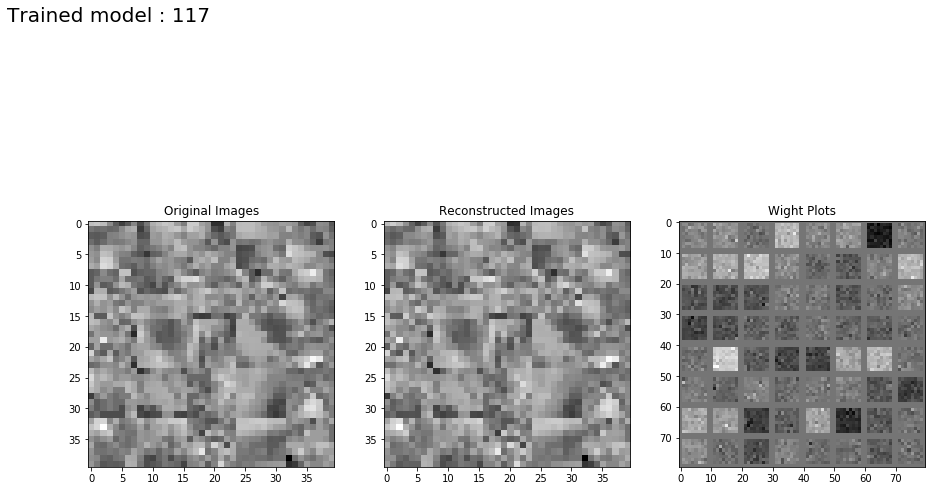

Step 1: Minibatch Loss: 0.015396 Error: 0.015389 Sparse: 0.000765
Step 100: Minibatch Loss: 54.792442 Error: 54.786343 Sparse: 0.609856
Step 200: Minibatch Loss: 12.609440 Error: 12.605311 Sparse: 0.412839
Step 300: Minibatch Loss: 5.035116 Error: 5.031783 Sparse: 0.333254
Step 400: Minibatch Loss: 2.558827 Error: 2.555965 Sparse: 0.286184
Step 500: Minibatch Loss: 1.531434 Error: 1.528873 Sparse: 0.256096
Step 600: Minibatch Loss: 0.952822 Error: 0.950517 Sparse: 0.230472
Step 700: Minibatch Loss: 0.608492 Error: 0.606399 Sparse: 0.209277
Step 800: Minibatch Loss: 0.421933 Error: 0.419989 Sparse: 0.194376
Step 900: Minibatch Loss: 0.306730 Error: 0.304893 Sparse: 0.183726
Step 1000: Minibatch Loss: 0.222703 Error: 0.220966 Sparse: 0.173642
Step 1100: Minibatch Loss: 0.165687 Error: 0.164048 Sparse: 0.163909
Step 1200: Minibatch Loss: 0.121602 Error: 0.120049 Sparse: 0.155336
Step 1300: Minibatch Loss: 0.097737 Error: 0.096232 Sparse: 0.150485
Step 1400: Minibatch Loss: 0.072865 Error:

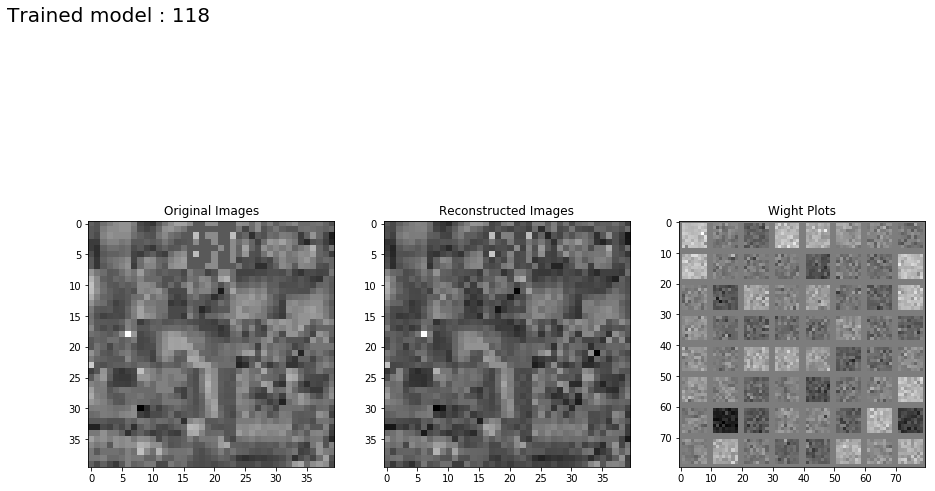

Step 1: Minibatch Loss: 0.015373 Error: 0.015295 Sparse: 0.000786
Step 100: Minibatch Loss: 72.095848 Error: 72.030685 Sparse: 0.651592
Step 200: Minibatch Loss: 17.961237 Error: 17.916285 Sparse: 0.449525
Step 300: Minibatch Loss: 7.510332 Error: 7.473811 Sparse: 0.365215
Step 400: Minibatch Loss: 3.852849 Error: 3.821608 Sparse: 0.312406
Step 500: Minibatch Loss: 2.189646 Error: 2.162381 Sparse: 0.272653
Step 600: Minibatch Loss: 1.428474 Error: 1.403597 Sparse: 0.248771
Step 700: Minibatch Loss: 0.959056 Error: 0.936383 Sparse: 0.226729
Step 800: Minibatch Loss: 0.647531 Error: 0.626585 Sparse: 0.209462
Step 900: Minibatch Loss: 0.462263 Error: 0.442808 Sparse: 0.194553
Step 1000: Minibatch Loss: 0.341787 Error: 0.323474 Sparse: 0.183124
Step 1100: Minibatch Loss: 0.261359 Error: 0.244059 Sparse: 0.173001
Step 1200: Minibatch Loss: 0.207296 Error: 0.190792 Sparse: 0.165042
Step 1300: Minibatch Loss: 0.164478 Error: 0.148622 Sparse: 0.158562
Step 1400: Minibatch Loss: 0.130527 Error:

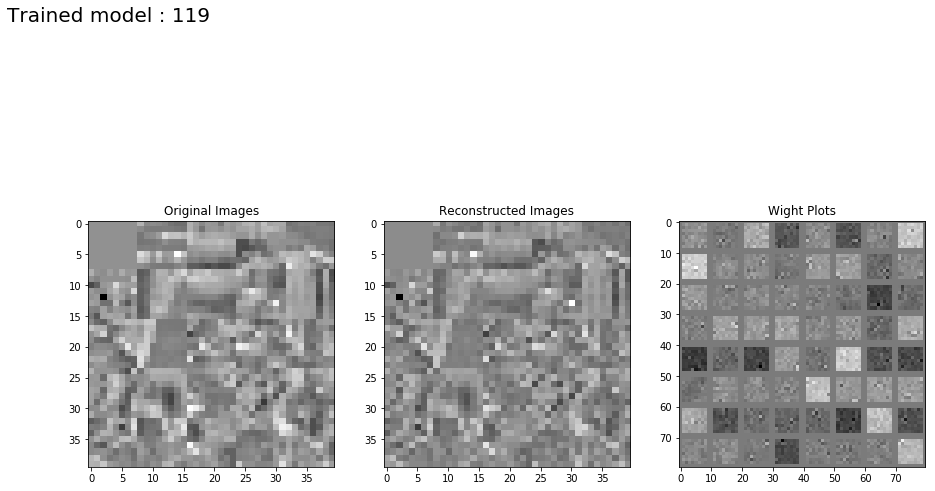

Step 1: Minibatch Loss: 0.016230 Error: 0.015467 Sparse: 0.000763
Step 100: Minibatch Loss: 57.693130 Error: 57.092438 Sparse: 0.600692
Step 200: Minibatch Loss: 14.280530 Error: 13.866953 Sparse: 0.413577
Step 300: Minibatch Loss: 6.252829 Error: 5.913934 Sparse: 0.338895
Step 400: Minibatch Loss: 3.362277 Error: 3.073144 Sparse: 0.289133
Step 500: Minibatch Loss: 1.983636 Error: 1.730910 Sparse: 0.252727
Step 600: Minibatch Loss: 1.343654 Error: 1.115145 Sparse: 0.228510
Step 700: Minibatch Loss: 0.904622 Error: 0.700533 Sparse: 0.204089
Step 800: Minibatch Loss: 0.685938 Error: 0.497311 Sparse: 0.188627
Step 900: Minibatch Loss: 0.525334 Error: 0.351539 Sparse: 0.173795
Step 1000: Minibatch Loss: 0.406079 Error: 0.245887 Sparse: 0.160192
Step 1100: Minibatch Loss: 0.331525 Error: 0.182633 Sparse: 0.148892
Step 1200: Minibatch Loss: 0.274694 Error: 0.136372 Sparse: 0.138323
Step 1300: Minibatch Loss: 0.232488 Error: 0.102856 Sparse: 0.129632
Step 1400: Minibatch Loss: 0.204182 Error:

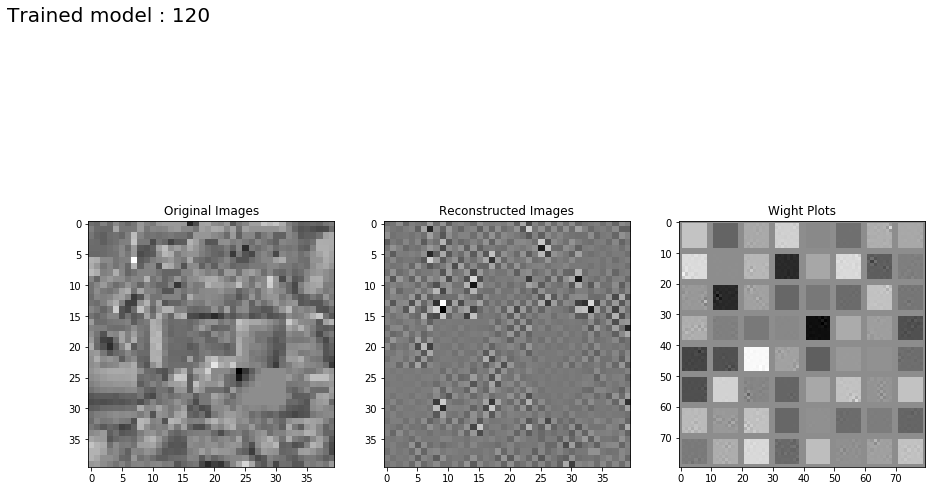

Step 1: Minibatch Loss: 0.015248 Error: 0.015248 Sparse: 0.000769
Step 100: Minibatch Loss: 31.457117 Error: 31.457064 Sparse: 0.539553
Step 200: Minibatch Loss: 6.869149 Error: 6.869112 Sparse: 0.365384
Step 300: Minibatch Loss: 2.722308 Error: 2.722279 Sparse: 0.291971
Step 400: Minibatch Loss: 1.393506 Error: 1.393480 Sparse: 0.254005
Step 500: Minibatch Loss: 0.786565 Error: 0.786542 Sparse: 0.222980
Step 600: Minibatch Loss: 0.510055 Error: 0.510034 Sparse: 0.205144
Step 700: Minibatch Loss: 0.331878 Error: 0.331859 Sparse: 0.186765
Step 800: Minibatch Loss: 0.221950 Error: 0.221932 Sparse: 0.172848
Step 900: Minibatch Loss: 0.158991 Error: 0.158974 Sparse: 0.164555
Step 1000: Minibatch Loss: 0.111183 Error: 0.111168 Sparse: 0.153950
Step 1100: Minibatch Loss: 0.082846 Error: 0.082831 Sparse: 0.147550
Step 1200: Minibatch Loss: 0.064077 Error: 0.064063 Sparse: 0.140910
Step 1300: Minibatch Loss: 0.051810 Error: 0.051796 Sparse: 0.138822
Step 1400: Minibatch Loss: 0.038769 Error: 0

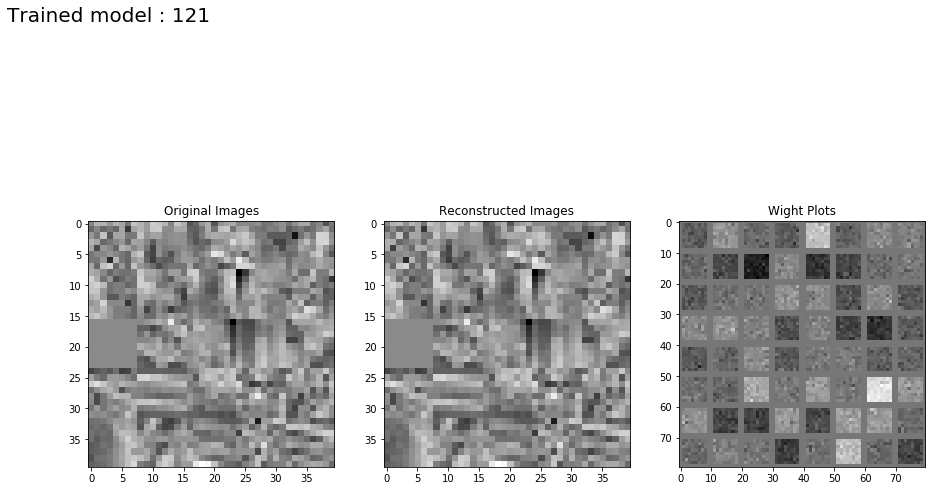

Step 1: Minibatch Loss: 0.015249 Error: 0.015248 Sparse: 0.000822
Step 100: Minibatch Loss: 36.545944 Error: 36.545383 Sparse: 0.559174
Step 200: Minibatch Loss: 8.597106 Error: 8.596723 Sparse: 0.383629
Step 300: Minibatch Loss: 3.571798 Error: 3.571488 Sparse: 0.309772
Step 400: Minibatch Loss: 1.728935 Error: 1.728671 Sparse: 0.264015
Step 500: Minibatch Loss: 0.995055 Error: 0.994821 Sparse: 0.233510
Step 600: Minibatch Loss: 0.621430 Error: 0.621219 Sparse: 0.211141
Step 700: Minibatch Loss: 0.407248 Error: 0.407054 Sparse: 0.194108
Step 800: Minibatch Loss: 0.277542 Error: 0.277362 Sparse: 0.179878
Step 900: Minibatch Loss: 0.200426 Error: 0.200257 Sparse: 0.168972
Step 1000: Minibatch Loss: 0.144639 Error: 0.144479 Sparse: 0.159802
Step 1100: Minibatch Loss: 0.110883 Error: 0.110730 Sparse: 0.153258
Step 1200: Minibatch Loss: 0.083277 Error: 0.083130 Sparse: 0.146302
Step 1300: Minibatch Loss: 0.064366 Error: 0.064225 Sparse: 0.141820
Step 1400: Minibatch Loss: 0.050781 Error: 0

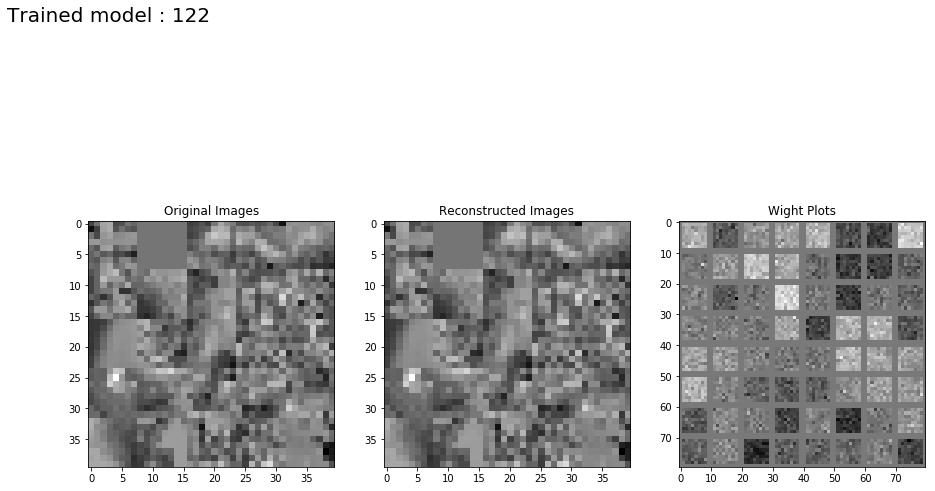

Step 1: Minibatch Loss: 0.015428 Error: 0.015420 Sparse: 0.000781
Step 100: Minibatch Loss: 50.933384 Error: 50.927284 Sparse: 0.609852
Step 200: Minibatch Loss: 11.599835 Error: 11.595725 Sparse: 0.411050
Step 300: Minibatch Loss: 4.927042 Error: 4.923675 Sparse: 0.336678
Step 400: Minibatch Loss: 2.497390 Error: 2.494518 Sparse: 0.287253
Step 500: Minibatch Loss: 1.407114 Error: 1.404576 Sparse: 0.253823
Step 600: Minibatch Loss: 0.863863 Error: 0.861597 Sparse: 0.226553
Step 700: Minibatch Loss: 0.567986 Error: 0.565913 Sparse: 0.207333
Step 800: Minibatch Loss: 0.392948 Error: 0.391028 Sparse: 0.192021
Step 900: Minibatch Loss: 0.266820 Error: 0.265038 Sparse: 0.178197
Step 1000: Minibatch Loss: 0.206945 Error: 0.205242 Sparse: 0.170309
Step 1100: Minibatch Loss: 0.148136 Error: 0.146535 Sparse: 0.160089
Step 1200: Minibatch Loss: 0.116403 Error: 0.114863 Sparse: 0.153936
Step 1300: Minibatch Loss: 0.088853 Error: 0.087375 Sparse: 0.147734
Step 1400: Minibatch Loss: 0.069937 Error:

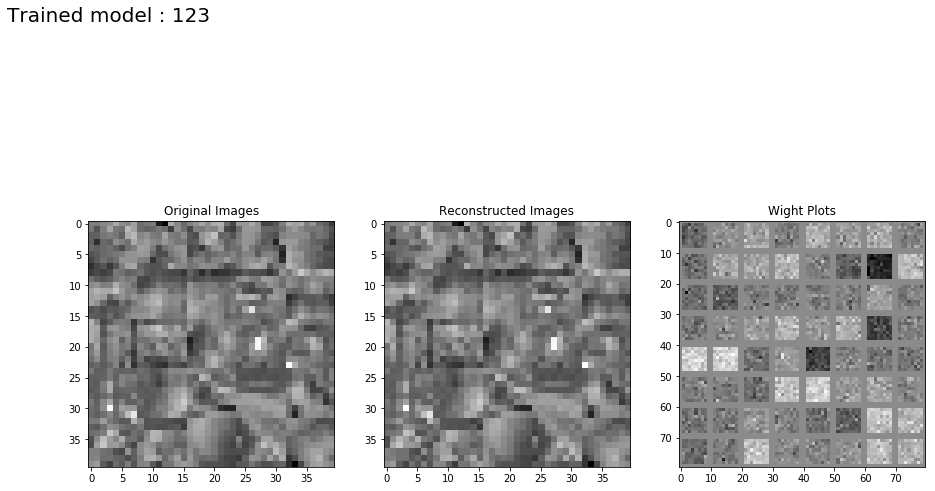

Step 1: Minibatch Loss: 0.015577 Error: 0.015498 Sparse: 0.000791
Step 100: Minibatch Loss: 69.213791 Error: 69.148933 Sparse: 0.648549
Step 200: Minibatch Loss: 15.315016 Error: 15.271514 Sparse: 0.435018
Step 300: Minibatch Loss: 6.485629 Error: 6.450113 Sparse: 0.355153
Step 400: Minibatch Loss: 3.282351 Error: 3.252025 Sparse: 0.303266
Step 500: Minibatch Loss: 1.827810 Error: 1.801481 Sparse: 0.263293
Step 600: Minibatch Loss: 1.146319 Error: 1.122535 Sparse: 0.237844
Step 700: Minibatch Loss: 0.819084 Error: 0.796904 Sparse: 0.221796
Step 800: Minibatch Loss: 0.531130 Error: 0.511074 Sparse: 0.200554
Step 900: Minibatch Loss: 0.384666 Error: 0.365882 Sparse: 0.187848
Step 1000: Minibatch Loss: 0.278088 Error: 0.260664 Sparse: 0.174236
Step 1100: Minibatch Loss: 0.214841 Error: 0.198245 Sparse: 0.165960
Step 1200: Minibatch Loss: 0.162445 Error: 0.146733 Sparse: 0.157111
Step 1300: Minibatch Loss: 0.130210 Error: 0.115050 Sparse: 0.151597
Step 1400: Minibatch Loss: 0.103714 Error:

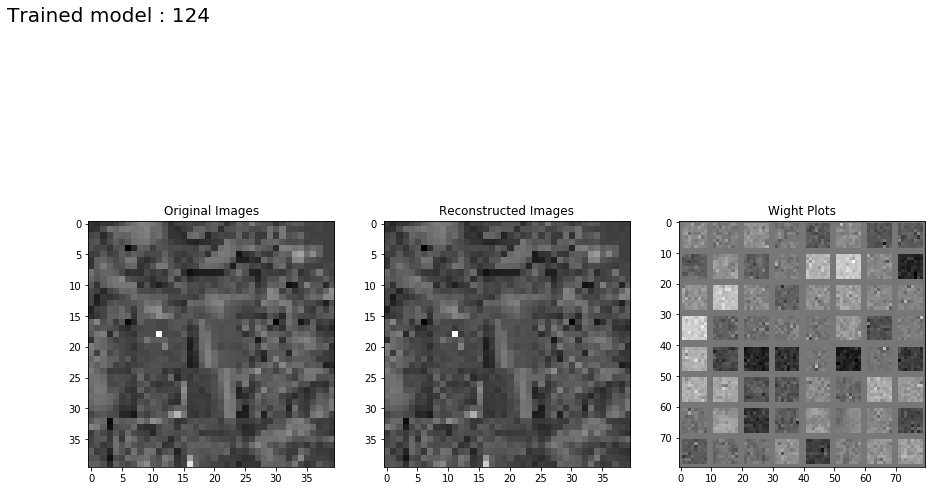

Step 1: Minibatch Loss: 0.016215 Error: 0.015436 Sparse: 0.000779
Step 100: Minibatch Loss: 64.327019 Error: 63.692001 Sparse: 0.635017
Step 200: Minibatch Loss: 14.435765 Error: 14.018378 Sparse: 0.417387
Step 300: Minibatch Loss: 6.001022 Error: 5.666133 Sparse: 0.334889
Step 400: Minibatch Loss: 3.255988 Error: 2.966296 Sparse: 0.289692
Step 500: Minibatch Loss: 1.882316 Error: 1.631709 Sparse: 0.250607
Step 600: Minibatch Loss: 1.189502 Error: 0.968723 Sparse: 0.220779
Step 700: Minibatch Loss: 0.839918 Error: 0.640563 Sparse: 0.199355
Step 800: Minibatch Loss: 0.633291 Error: 0.449159 Sparse: 0.184133
Step 900: Minibatch Loss: 0.479588 Error: 0.310518 Sparse: 0.169070
Step 1000: Minibatch Loss: 0.373136 Error: 0.218408 Sparse: 0.154728
Step 1100: Minibatch Loss: 0.299000 Error: 0.155690 Sparse: 0.143310
Step 1200: Minibatch Loss: 0.255194 Error: 0.121280 Sparse: 0.133914
Step 1300: Minibatch Loss: 0.217511 Error: 0.092370 Sparse: 0.125141
Step 1400: Minibatch Loss: 0.188816 Error:

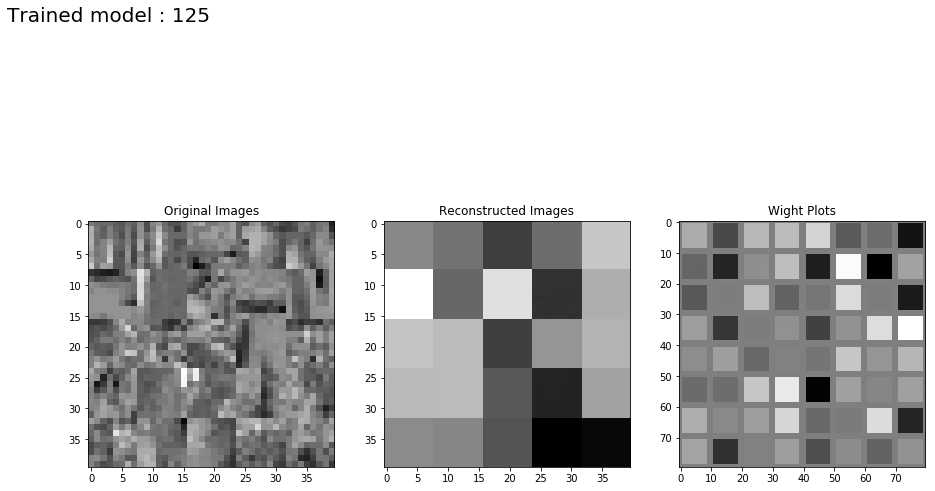

Step 1: Minibatch Loss: 0.015132 Error: 0.015131 Sparse: 0.007892
Step 100: Minibatch Loss: 0.007502 Error: 0.007495 Sparse: 0.066916
Step 200: Minibatch Loss: 0.004479 Error: 0.004471 Sparse: 0.080909
Step 300: Minibatch Loss: 0.002752 Error: 0.002743 Sparse: 0.087831
Step 400: Minibatch Loss: 0.001814 Error: 0.001805 Sparse: 0.091580
Step 500: Minibatch Loss: 0.001187 Error: 0.001178 Sparse: 0.093900
Step 600: Minibatch Loss: 0.000702 Error: 0.000693 Sparse: 0.095934
Step 700: Minibatch Loss: 0.000428 Error: 0.000418 Sparse: 0.097119
Step 800: Minibatch Loss: 0.000233 Error: 0.000224 Sparse: 0.098150
Step 900: Minibatch Loss: 0.000120 Error: 0.000110 Sparse: 0.098971
Step 1000: Minibatch Loss: 0.000062 Error: 0.000053 Sparse: 0.099167


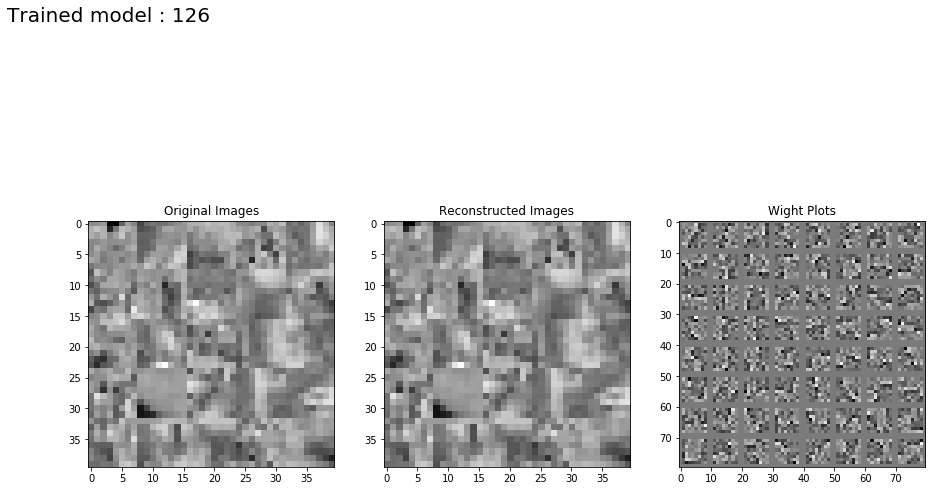

Step 1: Minibatch Loss: 0.015266 Error: 0.015258 Sparse: 0.007889
Step 100: Minibatch Loss: 0.007291 Error: 0.007222 Sparse: 0.068484
Step 200: Minibatch Loss: 0.004556 Error: 0.004475 Sparse: 0.080853
Step 300: Minibatch Loss: 0.002805 Error: 0.002717 Sparse: 0.087817
Step 400: Minibatch Loss: 0.001944 Error: 0.001852 Sparse: 0.092336
Step 500: Minibatch Loss: 0.001212 Error: 0.001117 Sparse: 0.094516
Step 600: Minibatch Loss: 0.000750 Error: 0.000655 Sparse: 0.095827
Step 700: Minibatch Loss: 0.000490 Error: 0.000393 Sparse: 0.097497
Step 800: Minibatch Loss: 0.000343 Error: 0.000245 Sparse: 0.097882
Step 900: Minibatch Loss: 0.000233 Error: 0.000134 Sparse: 0.098745
Step 1000: Minibatch Loss: 0.000171 Error: 0.000072 Sparse: 0.099722


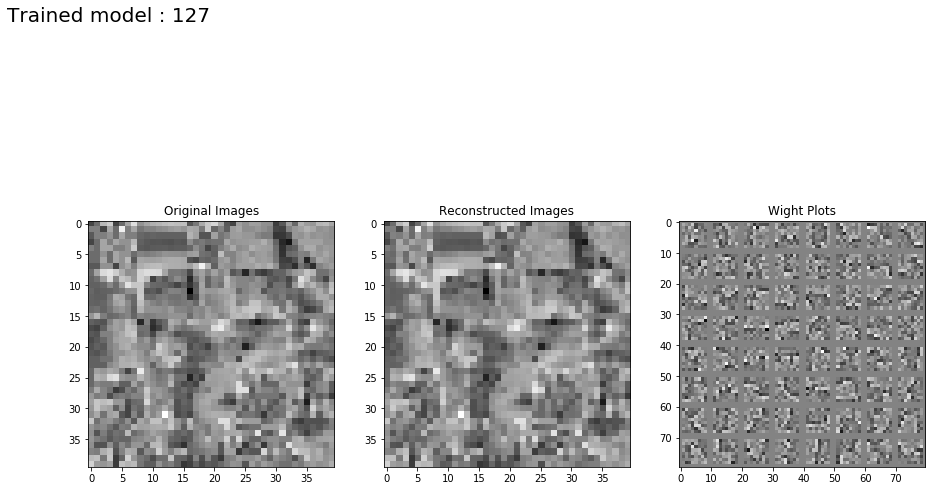

Step 1: Minibatch Loss: 0.015314 Error: 0.015234 Sparse: 0.008026
Step 100: Minibatch Loss: 0.007957 Error: 0.007283 Sparse: 0.067381
Step 200: Minibatch Loss: 0.005159 Error: 0.004354 Sparse: 0.080539
Step 300: Minibatch Loss: 0.003635 Error: 0.002754 Sparse: 0.088092
Step 400: Minibatch Loss: 0.002704 Error: 0.001788 Sparse: 0.091549
Step 500: Minibatch Loss: 0.002016 Error: 0.001086 Sparse: 0.093046
Step 600: Minibatch Loss: 0.001629 Error: 0.000671 Sparse: 0.095747
Step 700: Minibatch Loss: 0.001347 Error: 0.000381 Sparse: 0.096576
Step 800: Minibatch Loss: 0.001197 Error: 0.000228 Sparse: 0.096951
Step 900: Minibatch Loss: 0.001087 Error: 0.000108 Sparse: 0.097964
Step 1000: Minibatch Loss: 0.001019 Error: 0.000040 Sparse: 0.097866


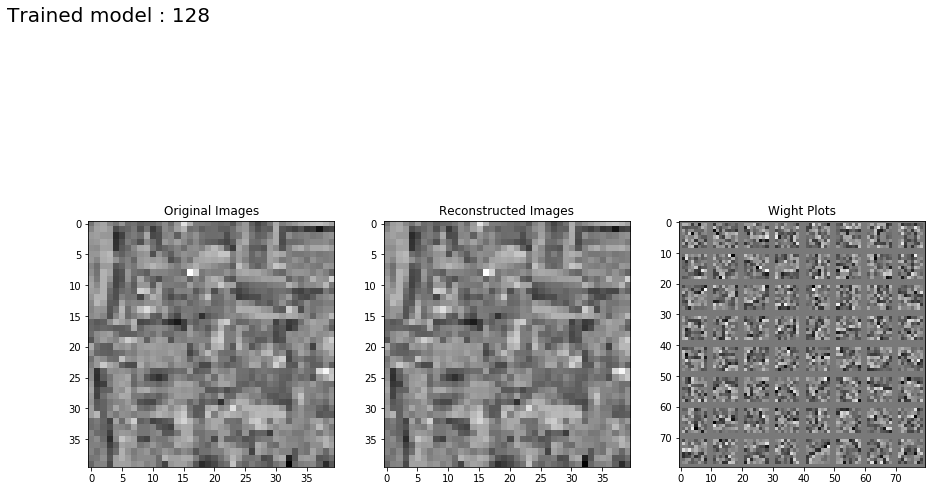

Step 1: Minibatch Loss: 0.015987 Error: 0.015187 Sparse: 0.008000
Step 100: Minibatch Loss: 0.015541 Error: 0.015531 Sparse: 0.000098
Step 200: Minibatch Loss: 0.015430 Error: 0.015422 Sparse: 0.000080
Step 300: Minibatch Loss: 0.015397 Error: 0.015391 Sparse: 0.000067
Step 400: Minibatch Loss: 0.015476 Error: 0.015469 Sparse: 0.000069
Step 500: Minibatch Loss: 0.015491 Error: 0.015484 Sparse: 0.000067
Step 600: Minibatch Loss: 0.015366 Error: 0.015359 Sparse: 0.000067
Step 700: Minibatch Loss: 0.015350 Error: 0.015344 Sparse: 0.000065
Step 800: Minibatch Loss: 0.015319 Error: 0.015312 Sparse: 0.000067
Step 900: Minibatch Loss: 0.015444 Error: 0.015437 Sparse: 0.000066
Step 1000: Minibatch Loss: 0.015490 Error: 0.015484 Sparse: 0.000059


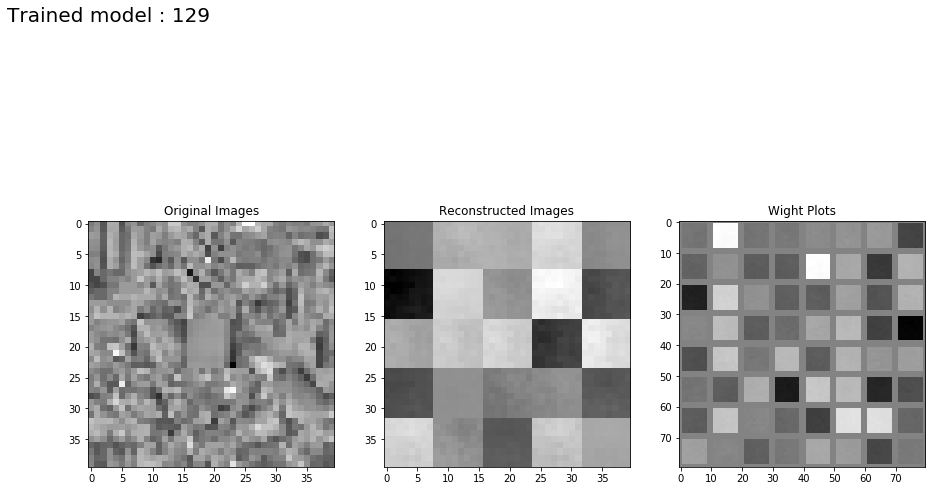

Step 1: Minibatch Loss: 0.023048 Error: 0.015244 Sparse: 0.007804
Step 100: Minibatch Loss: 0.015400 Error: 0.015297 Sparse: 0.000104
Step 200: Minibatch Loss: 0.015402 Error: 0.015328 Sparse: 0.000074
Step 300: Minibatch Loss: 0.015524 Error: 0.015453 Sparse: 0.000071
Step 400: Minibatch Loss: 0.015507 Error: 0.015437 Sparse: 0.000069
Step 500: Minibatch Loss: 0.015490 Error: 0.015422 Sparse: 0.000068
Step 600: Minibatch Loss: 0.015452 Error: 0.015391 Sparse: 0.000061
Step 700: Minibatch Loss: 0.015500 Error: 0.015437 Sparse: 0.000062
Step 800: Minibatch Loss: 0.015435 Error: 0.015375 Sparse: 0.000060
Step 900: Minibatch Loss: 0.015474 Error: 0.015406 Sparse: 0.000068
Step 1000: Minibatch Loss: 0.015453 Error: 0.015391 Sparse: 0.000062


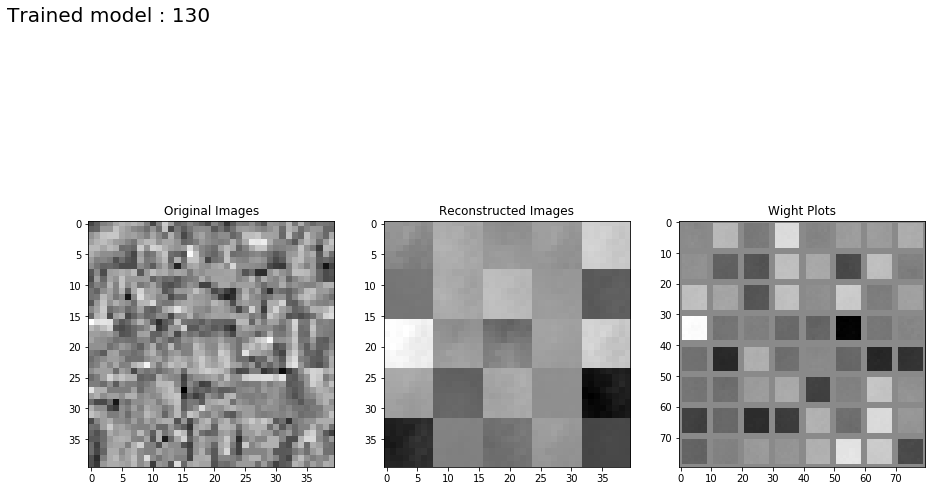

Step 1: Minibatch Loss: 0.015240 Error: 0.015239 Sparse: 0.007938
Step 100: Minibatch Loss: 0.007000 Error: 0.006993 Sparse: 0.069533
Step 200: Minibatch Loss: 0.004221 Error: 0.004212 Sparse: 0.082164
Step 300: Minibatch Loss: 0.002730 Error: 0.002721 Sparse: 0.089041
Step 400: Minibatch Loss: 0.001856 Error: 0.001847 Sparse: 0.092577
Step 500: Minibatch Loss: 0.001156 Error: 0.001147 Sparse: 0.094534
Step 600: Minibatch Loss: 0.000654 Error: 0.000644 Sparse: 0.096069
Step 700: Minibatch Loss: 0.000394 Error: 0.000384 Sparse: 0.098507
Step 800: Minibatch Loss: 0.000241 Error: 0.000232 Sparse: 0.098389
Step 900: Minibatch Loss: 0.000129 Error: 0.000119 Sparse: 0.098042
Step 1000: Minibatch Loss: 0.000056 Error: 0.000046 Sparse: 0.099669
Step 1100: Minibatch Loss: 0.000016 Error: 0.000006 Sparse: 0.099327
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099121
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099563
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

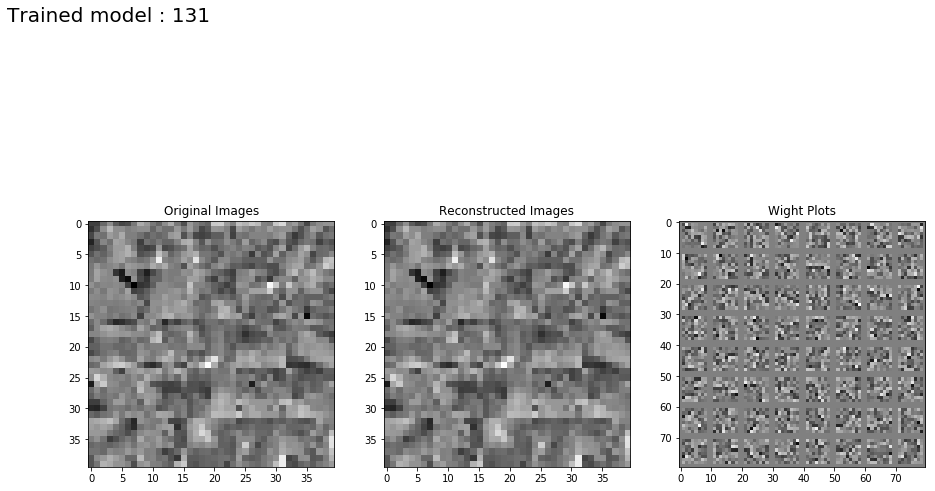

Step 1: Minibatch Loss: 0.015250 Error: 0.015243 Sparse: 0.007873
Step 100: Minibatch Loss: 0.007383 Error: 0.007316 Sparse: 0.067206
Step 200: Minibatch Loss: 0.004418 Error: 0.004337 Sparse: 0.081245
Step 300: Minibatch Loss: 0.002904 Error: 0.002815 Sparse: 0.088177
Step 400: Minibatch Loss: 0.001949 Error: 0.001857 Sparse: 0.091560
Step 500: Minibatch Loss: 0.001225 Error: 0.001130 Sparse: 0.094498
Step 600: Minibatch Loss: 0.000843 Error: 0.000746 Sparse: 0.096326
Step 700: Minibatch Loss: 0.000534 Error: 0.000436 Sparse: 0.097907
Step 800: Minibatch Loss: 0.000383 Error: 0.000285 Sparse: 0.098595
Step 900: Minibatch Loss: 0.000258 Error: 0.000159 Sparse: 0.098599
Step 1000: Minibatch Loss: 0.000194 Error: 0.000096 Sparse: 0.098946
Step 1100: Minibatch Loss: 0.000149 Error: 0.000049 Sparse: 0.099142
Step 1200: Minibatch Loss: 0.000114 Error: 0.000015 Sparse: 0.099216
Step 1300: Minibatch Loss: 0.000100 Error: 0.000001 Sparse: 0.099208
Step 1400: Minibatch Loss: 0.000100 Error: 0.0

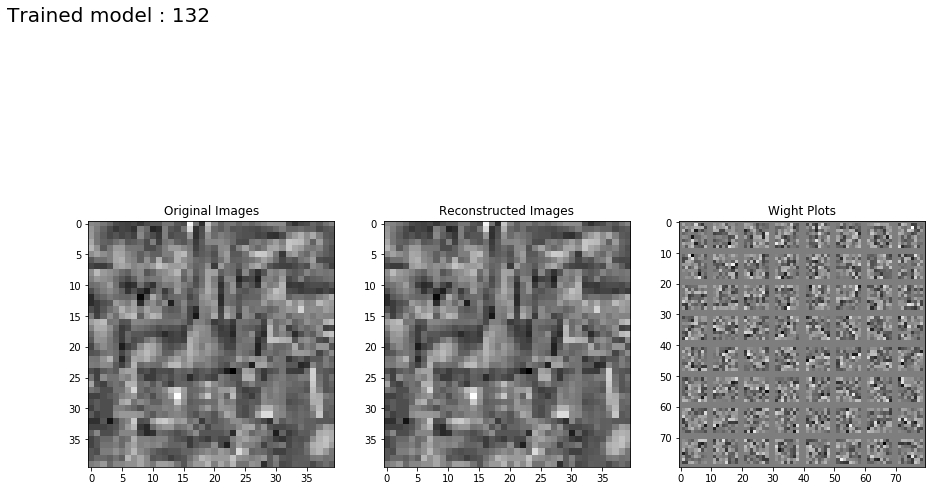

Step 1: Minibatch Loss: 0.015316 Error: 0.015237 Sparse: 0.007940
Step 100: Minibatch Loss: 0.007563 Error: 0.006871 Sparse: 0.069172
Step 200: Minibatch Loss: 0.005052 Error: 0.004236 Sparse: 0.081553
Step 300: Minibatch Loss: 0.003621 Error: 0.002745 Sparse: 0.087637
Step 400: Minibatch Loss: 0.002601 Error: 0.001688 Sparse: 0.091234
Step 500: Minibatch Loss: 0.002014 Error: 0.001070 Sparse: 0.094361
Step 600: Minibatch Loss: 0.001637 Error: 0.000684 Sparse: 0.095259
Step 700: Minibatch Loss: 0.001399 Error: 0.000427 Sparse: 0.097165
Step 800: Minibatch Loss: 0.001205 Error: 0.000229 Sparse: 0.097596
Step 900: Minibatch Loss: 0.001097 Error: 0.000124 Sparse: 0.097330
Step 1000: Minibatch Loss: 0.001061 Error: 0.000078 Sparse: 0.098300
Step 1100: Minibatch Loss: 0.001030 Error: 0.000051 Sparse: 0.097860
Step 1200: Minibatch Loss: 0.001013 Error: 0.000035 Sparse: 0.097763
Step 1300: Minibatch Loss: 0.000995 Error: 0.000018 Sparse: 0.097750
Step 1400: Minibatch Loss: 0.000982 Error: 0.0

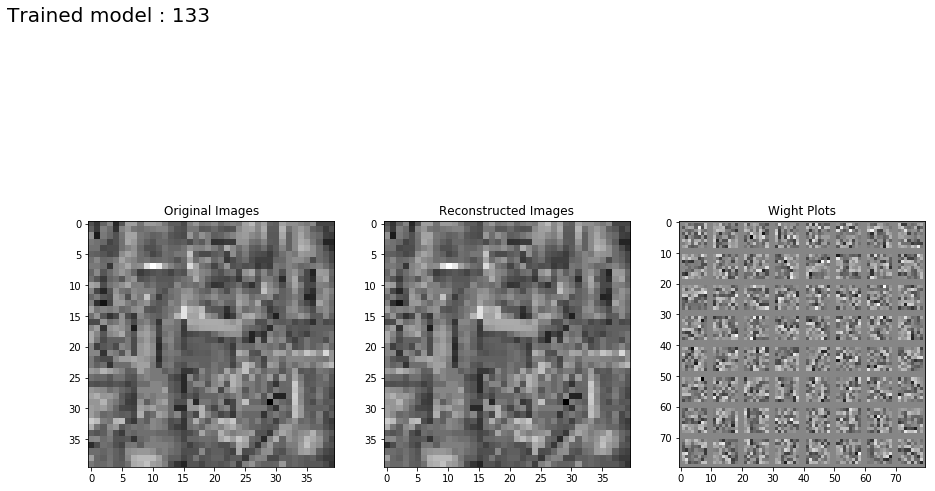

Step 1: Minibatch Loss: 0.016065 Error: 0.015265 Sparse: 0.008000
Step 100: Minibatch Loss: 0.015417 Error: 0.015406 Sparse: 0.000104
Step 200: Minibatch Loss: 0.015492 Error: 0.015484 Sparse: 0.000077
Step 300: Minibatch Loss: 0.015398 Error: 0.015391 Sparse: 0.000076
Step 400: Minibatch Loss: 0.015412 Error: 0.015406 Sparse: 0.000062
Step 500: Minibatch Loss: 0.015444 Error: 0.015438 Sparse: 0.000068
Step 600: Minibatch Loss: 0.015538 Error: 0.015531 Sparse: 0.000068
Step 700: Minibatch Loss: 0.015365 Error: 0.015359 Sparse: 0.000058
Step 800: Minibatch Loss: 0.015397 Error: 0.015391 Sparse: 0.000061
Step 900: Minibatch Loss: 0.015366 Error: 0.015359 Sparse: 0.000065
Step 1000: Minibatch Loss: 0.015429 Error: 0.015422 Sparse: 0.000069
Step 1100: Minibatch Loss: 0.015460 Error: 0.015453 Sparse: 0.000069
Step 1200: Minibatch Loss: 0.015397 Error: 0.015391 Sparse: 0.000061
Step 1300: Minibatch Loss: 0.015444 Error: 0.015437 Sparse: 0.000065
Step 1400: Minibatch Loss: 0.015396 Error: 0.0

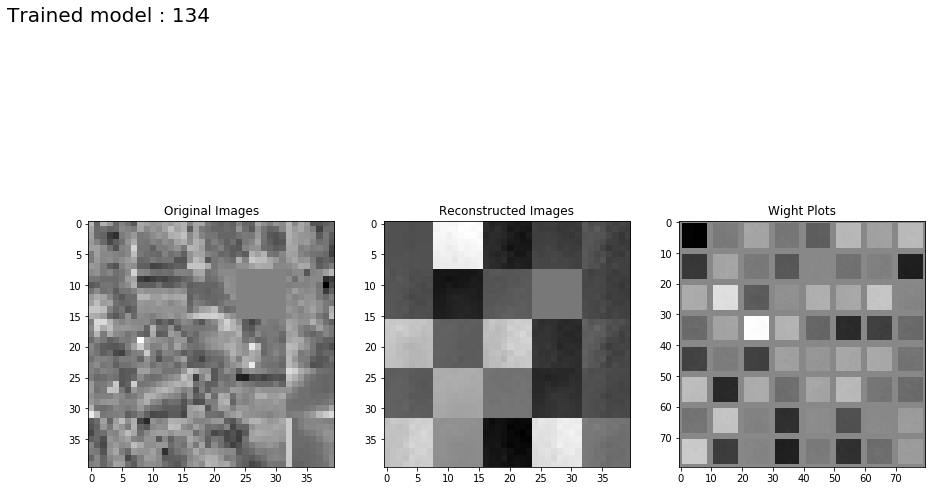

Step 1: Minibatch Loss: 0.023061 Error: 0.015194 Sparse: 0.007866
Step 100: Minibatch Loss: 0.015513 Error: 0.015422 Sparse: 0.000091
Step 200: Minibatch Loss: 0.015361 Error: 0.015281 Sparse: 0.000080
Step 300: Minibatch Loss: 0.015462 Error: 0.015391 Sparse: 0.000071
Step 400: Minibatch Loss: 0.015457 Error: 0.015391 Sparse: 0.000067
Step 500: Minibatch Loss: 0.015507 Error: 0.015437 Sparse: 0.000070
Step 600: Minibatch Loss: 0.015408 Error: 0.015344 Sparse: 0.000064
Step 700: Minibatch Loss: 0.015507 Error: 0.015437 Sparse: 0.000069
Step 800: Minibatch Loss: 0.015501 Error: 0.015437 Sparse: 0.000063
Step 900: Minibatch Loss: 0.015484 Error: 0.015422 Sparse: 0.000062
Step 1000: Minibatch Loss: 0.015362 Error: 0.015297 Sparse: 0.000065
Step 1100: Minibatch Loss: 0.015437 Error: 0.015375 Sparse: 0.000062
Step 1200: Minibatch Loss: 0.015454 Error: 0.015391 Sparse: 0.000064
Step 1300: Minibatch Loss: 0.015496 Error: 0.015437 Sparse: 0.000059
Step 1400: Minibatch Loss: 0.015567 Error: 0.0

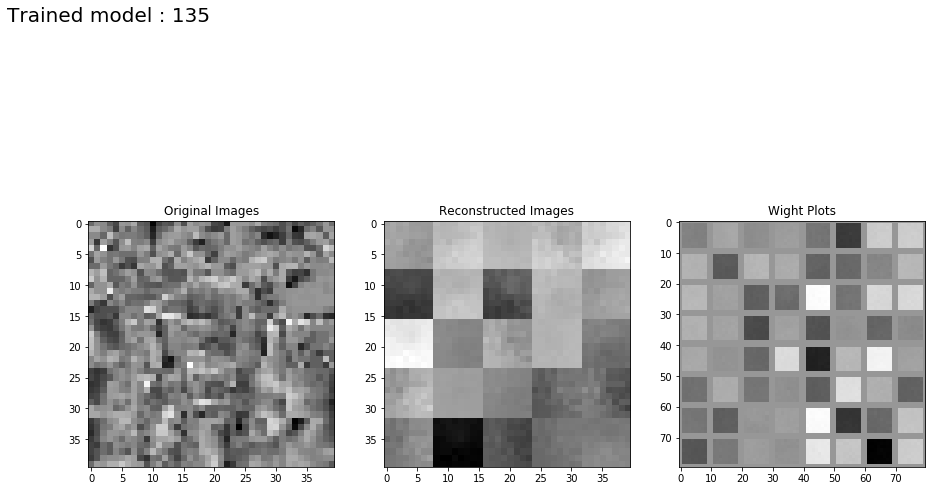

Step 1: Minibatch Loss: 0.015218 Error: 0.015217 Sparse: 0.007738
Step 100: Minibatch Loss: 0.007232 Error: 0.007225 Sparse: 0.068566
Step 200: Minibatch Loss: 0.004367 Error: 0.004359 Sparse: 0.080944
Step 300: Minibatch Loss: 0.002798 Error: 0.002789 Sparse: 0.088245
Step 400: Minibatch Loss: 0.001825 Error: 0.001816 Sparse: 0.091988
Step 500: Minibatch Loss: 0.001167 Error: 0.001157 Sparse: 0.094717
Step 600: Minibatch Loss: 0.000714 Error: 0.000704 Sparse: 0.096299
Step 700: Minibatch Loss: 0.000440 Error: 0.000431 Sparse: 0.097063
Step 800: Minibatch Loss: 0.000248 Error: 0.000238 Sparse: 0.098499
Step 900: Minibatch Loss: 0.000121 Error: 0.000111 Sparse: 0.098808
Step 1000: Minibatch Loss: 0.000066 Error: 0.000056 Sparse: 0.098836
Step 1100: Minibatch Loss: 0.000034 Error: 0.000024 Sparse: 0.098837
Step 1200: Minibatch Loss: 0.000013 Error: 0.000003 Sparse: 0.098963
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099503
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

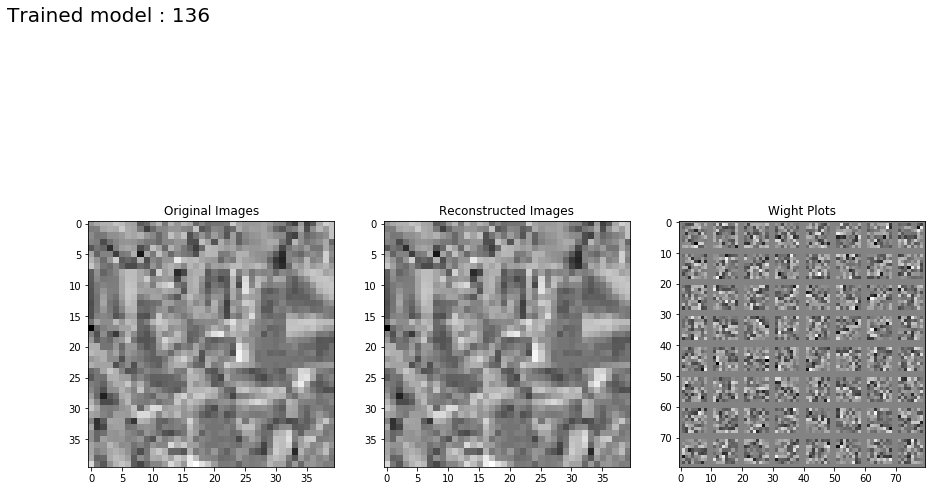

Step 1: Minibatch Loss: 0.015186 Error: 0.015178 Sparse: 0.008123
Step 100: Minibatch Loss: 0.007421 Error: 0.007354 Sparse: 0.067140
Step 200: Minibatch Loss: 0.004405 Error: 0.004323 Sparse: 0.081736
Step 300: Minibatch Loss: 0.002869 Error: 0.002781 Sparse: 0.088232
Step 400: Minibatch Loss: 0.001845 Error: 0.001754 Sparse: 0.091486
Step 500: Minibatch Loss: 0.001187 Error: 0.001093 Sparse: 0.094630
Step 600: Minibatch Loss: 0.000729 Error: 0.000633 Sparse: 0.095417
Step 700: Minibatch Loss: 0.000503 Error: 0.000406 Sparse: 0.097504
Step 800: Minibatch Loss: 0.000331 Error: 0.000233 Sparse: 0.098394
Step 900: Minibatch Loss: 0.000218 Error: 0.000119 Sparse: 0.098765
Step 1000: Minibatch Loss: 0.000160 Error: 0.000061 Sparse: 0.098767
Step 1100: Minibatch Loss: 0.000130 Error: 0.000031 Sparse: 0.098864
Step 1200: Minibatch Loss: 0.000105 Error: 0.000006 Sparse: 0.098862
Step 1300: Minibatch Loss: 0.000100 Error: 0.000000 Sparse: 0.099831
Step 1400: Minibatch Loss: 0.000099 Error: 0.0

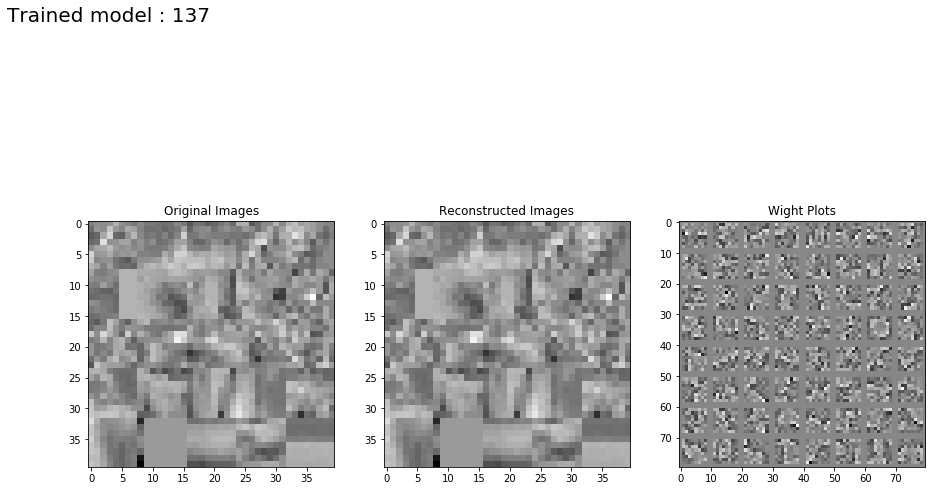

Step 1: Minibatch Loss: 0.015297 Error: 0.015216 Sparse: 0.008081
Step 100: Minibatch Loss: 0.008000 Error: 0.007328 Sparse: 0.067285
Step 200: Minibatch Loss: 0.005224 Error: 0.004417 Sparse: 0.080755
Step 300: Minibatch Loss: 0.003544 Error: 0.002669 Sparse: 0.087505
Step 400: Minibatch Loss: 0.002692 Error: 0.001779 Sparse: 0.091316
Step 500: Minibatch Loss: 0.002035 Error: 0.001097 Sparse: 0.093842
Step 600: Minibatch Loss: 0.001639 Error: 0.000686 Sparse: 0.095348
Step 700: Minibatch Loss: 0.001400 Error: 0.000437 Sparse: 0.096243
Step 800: Minibatch Loss: 0.001214 Error: 0.000242 Sparse: 0.097170
Step 900: Minibatch Loss: 0.001101 Error: 0.000132 Sparse: 0.096978
Step 1000: Minibatch Loss: 0.001039 Error: 0.000059 Sparse: 0.097973
Step 1100: Minibatch Loss: 0.000994 Error: 0.000020 Sparse: 0.097396
Step 1200: Minibatch Loss: 0.000981 Error: 0.000005 Sparse: 0.097506
Step 1300: Minibatch Loss: 0.000984 Error: 0.000004 Sparse: 0.098014
Step 1400: Minibatch Loss: 0.000976 Error: 0.0

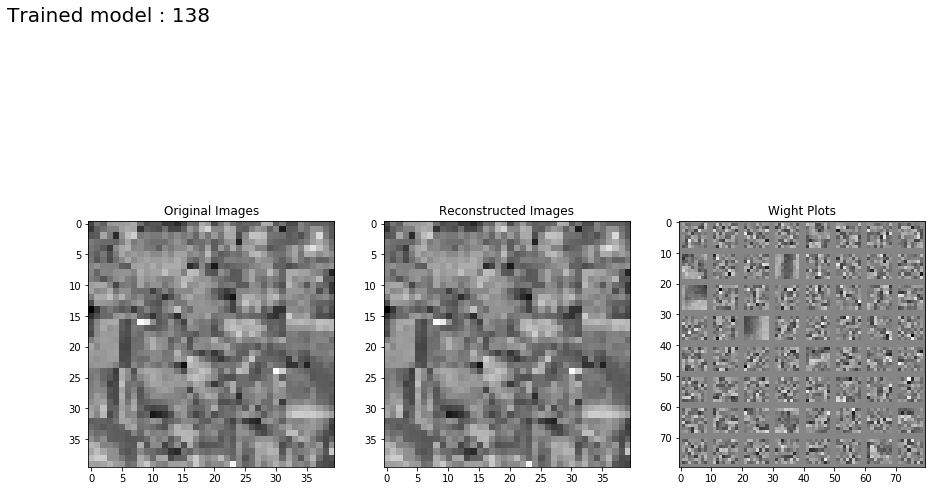

Step 1: Minibatch Loss: 0.015954 Error: 0.015188 Sparse: 0.007658
Step 100: Minibatch Loss: 0.015542 Error: 0.015531 Sparse: 0.000104
Step 200: Minibatch Loss: 0.015539 Error: 0.015531 Sparse: 0.000075
Step 300: Minibatch Loss: 0.015398 Error: 0.015391 Sparse: 0.000074
Step 400: Minibatch Loss: 0.015397 Error: 0.015391 Sparse: 0.000064
Step 500: Minibatch Loss: 0.015382 Error: 0.015375 Sparse: 0.000068
Step 600: Minibatch Loss: 0.015491 Error: 0.015484 Sparse: 0.000070
Step 700: Minibatch Loss: 0.015476 Error: 0.015469 Sparse: 0.000068
Step 800: Minibatch Loss: 0.015412 Error: 0.015406 Sparse: 0.000059
Step 900: Minibatch Loss: 0.015444 Error: 0.015437 Sparse: 0.000063
Step 1000: Minibatch Loss: 0.015444 Error: 0.015438 Sparse: 0.000066
Step 1100: Minibatch Loss: 0.015459 Error: 0.015453 Sparse: 0.000063
Step 1200: Minibatch Loss: 0.015507 Error: 0.015500 Sparse: 0.000069
Step 1300: Minibatch Loss: 0.015522 Error: 0.015516 Sparse: 0.000067
Step 1400: Minibatch Loss: 0.015475 Error: 0.0

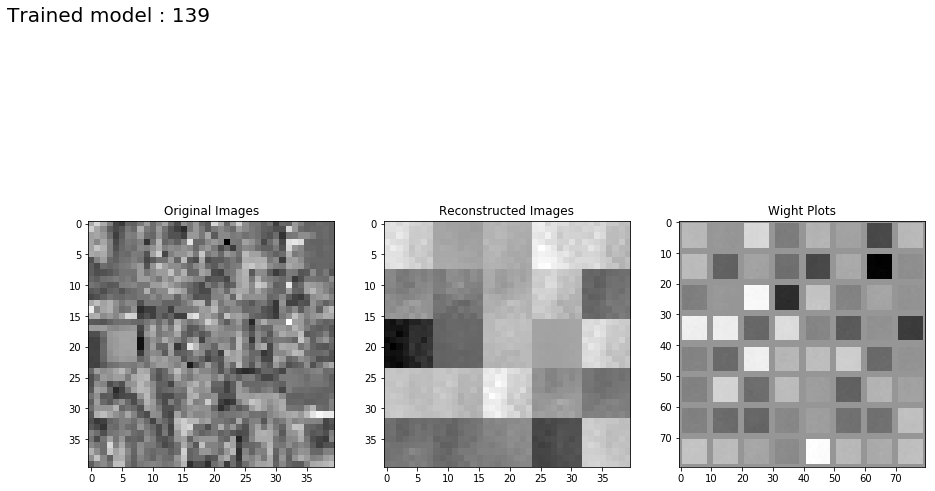

Step 1: Minibatch Loss: 0.023102 Error: 0.015259 Sparse: 0.007843
Step 100: Minibatch Loss: 0.015394 Error: 0.015297 Sparse: 0.000097
Step 200: Minibatch Loss: 0.015550 Error: 0.015469 Sparse: 0.000081
Step 300: Minibatch Loss: 0.015446 Error: 0.015375 Sparse: 0.000071
Step 400: Minibatch Loss: 0.015448 Error: 0.015375 Sparse: 0.000073
Step 500: Minibatch Loss: 0.015444 Error: 0.015375 Sparse: 0.000069
Step 600: Minibatch Loss: 0.015427 Error: 0.015359 Sparse: 0.000068
Step 700: Minibatch Loss: 0.015510 Error: 0.015437 Sparse: 0.000073
Step 800: Minibatch Loss: 0.015409 Error: 0.015344 Sparse: 0.000065
Step 900: Minibatch Loss: 0.015473 Error: 0.015406 Sparse: 0.000066
Step 1000: Minibatch Loss: 0.015371 Error: 0.015312 Sparse: 0.000059
Step 1100: Minibatch Loss: 0.015579 Error: 0.015516 Sparse: 0.000063
Step 1200: Minibatch Loss: 0.015577 Error: 0.015516 Sparse: 0.000061
Step 1300: Minibatch Loss: 0.015613 Error: 0.015547 Sparse: 0.000066
Step 1400: Minibatch Loss: 0.015485 Error: 0.0

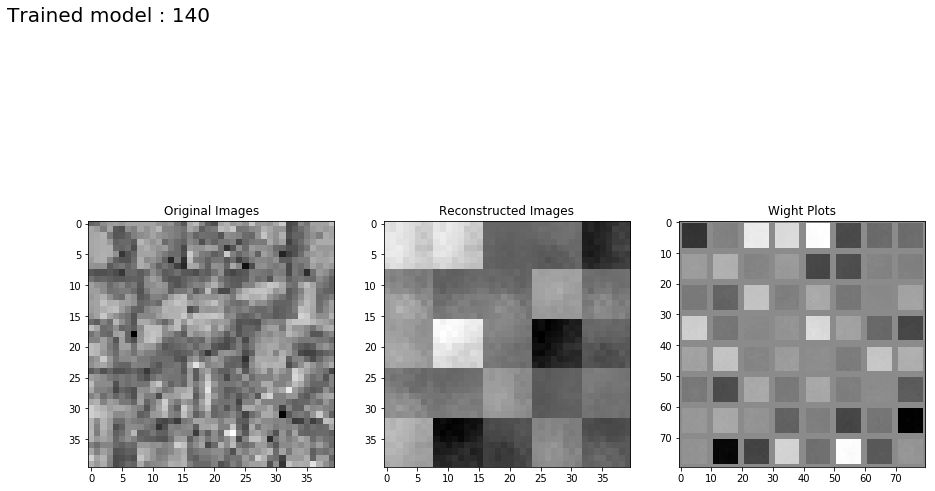

Step 1: Minibatch Loss: 0.015279 Error: 0.015278 Sparse: 0.007757
Step 100: Minibatch Loss: 0.007102 Error: 0.007095 Sparse: 0.069428
Step 200: Minibatch Loss: 0.004467 Error: 0.004459 Sparse: 0.081324
Step 300: Minibatch Loss: 0.002697 Error: 0.002688 Sparse: 0.088143
Step 400: Minibatch Loss: 0.001841 Error: 0.001832 Sparse: 0.091793
Step 500: Minibatch Loss: 0.001173 Error: 0.001164 Sparse: 0.094687
Step 600: Minibatch Loss: 0.000676 Error: 0.000667 Sparse: 0.096964
Step 700: Minibatch Loss: 0.000433 Error: 0.000423 Sparse: 0.097741
Step 800: Minibatch Loss: 0.000255 Error: 0.000245 Sparse: 0.097683
Step 900: Minibatch Loss: 0.000136 Error: 0.000127 Sparse: 0.098830
Step 1000: Minibatch Loss: 0.000071 Error: 0.000061 Sparse: 0.099539
Step 1100: Minibatch Loss: 0.000044 Error: 0.000034 Sparse: 0.099210
Step 1200: Minibatch Loss: 0.000020 Error: 0.000010 Sparse: 0.099080
Step 1300: Minibatch Loss: 0.000011 Error: 0.000001 Sparse: 0.099724
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

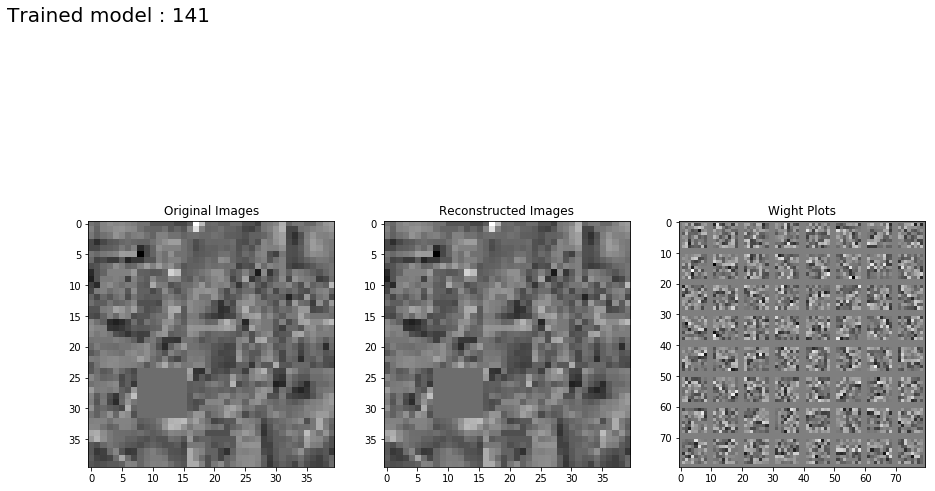

Step 1: Minibatch Loss: 0.015338 Error: 0.015330 Sparse: 0.008014
Step 100: Minibatch Loss: 0.007593 Error: 0.007526 Sparse: 0.066883
Step 200: Minibatch Loss: 0.004438 Error: 0.004356 Sparse: 0.081791
Step 300: Minibatch Loss: 0.002942 Error: 0.002854 Sparse: 0.087998
Step 400: Minibatch Loss: 0.001995 Error: 0.001904 Sparse: 0.091195
Step 500: Minibatch Loss: 0.001270 Error: 0.001177 Sparse: 0.093304
Step 600: Minibatch Loss: 0.000829 Error: 0.000733 Sparse: 0.095508
Step 700: Minibatch Loss: 0.000555 Error: 0.000458 Sparse: 0.097210
Step 800: Minibatch Loss: 0.000340 Error: 0.000242 Sparse: 0.098093
Step 900: Minibatch Loss: 0.000227 Error: 0.000128 Sparse: 0.098755
Step 1000: Minibatch Loss: 0.000155 Error: 0.000056 Sparse: 0.098861
Step 1100: Minibatch Loss: 0.000118 Error: 0.000019 Sparse: 0.099169
Step 1200: Minibatch Loss: 0.000102 Error: 0.000002 Sparse: 0.100043
Step 1300: Minibatch Loss: 0.000100 Error: 0.000000 Sparse: 0.099840
Step 1400: Minibatch Loss: 0.000099 Error: 0.0

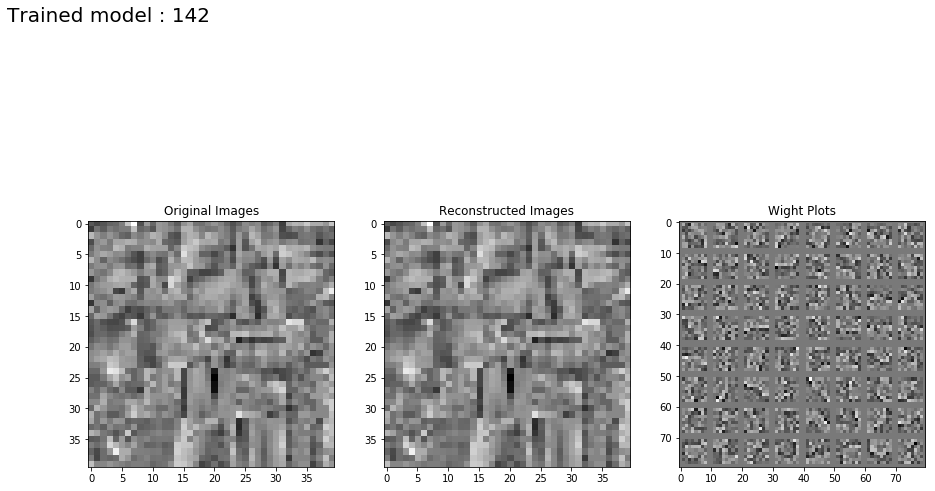

Step 1: Minibatch Loss: 0.015328 Error: 0.015247 Sparse: 0.008080
Step 100: Minibatch Loss: 0.007871 Error: 0.007190 Sparse: 0.068127
Step 200: Minibatch Loss: 0.005189 Error: 0.004384 Sparse: 0.080498
Step 300: Minibatch Loss: 0.003536 Error: 0.002651 Sparse: 0.088551
Step 400: Minibatch Loss: 0.002620 Error: 0.001706 Sparse: 0.091402
Step 500: Minibatch Loss: 0.002037 Error: 0.001100 Sparse: 0.093776
Step 600: Minibatch Loss: 0.001573 Error: 0.000614 Sparse: 0.095876
Step 700: Minibatch Loss: 0.001339 Error: 0.000377 Sparse: 0.096228
Step 800: Minibatch Loss: 0.001168 Error: 0.000198 Sparse: 0.096963
Step 900: Minibatch Loss: 0.001058 Error: 0.000082 Sparse: 0.097589
Step 1000: Minibatch Loss: 0.001005 Error: 0.000028 Sparse: 0.097743
Step 1100: Minibatch Loss: 0.000987 Error: 0.000008 Sparse: 0.097886
Step 1200: Minibatch Loss: 0.000989 Error: 0.000004 Sparse: 0.098434
Step 1300: Minibatch Loss: 0.000984 Error: 0.000004 Sparse: 0.097995
Step 1400: Minibatch Loss: 0.000992 Error: 0.0

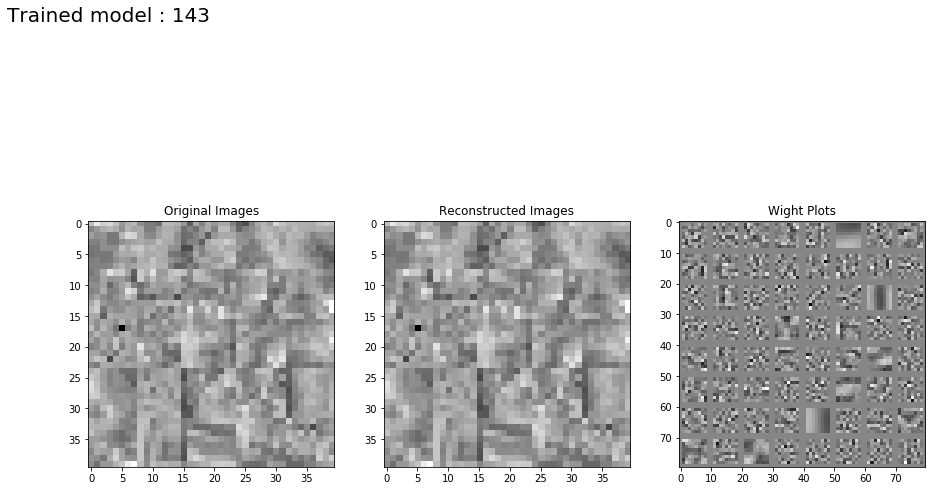

Step 1: Minibatch Loss: 0.016050 Error: 0.015251 Sparse: 0.007990
Step 100: Minibatch Loss: 0.015417 Error: 0.015406 Sparse: 0.000105
Step 200: Minibatch Loss: 0.015461 Error: 0.015453 Sparse: 0.000075
Step 300: Minibatch Loss: 0.015413 Error: 0.015406 Sparse: 0.000072
Step 400: Minibatch Loss: 0.015351 Error: 0.015344 Sparse: 0.000071
Step 500: Minibatch Loss: 0.015413 Error: 0.015406 Sparse: 0.000071
Step 600: Minibatch Loss: 0.015382 Error: 0.015375 Sparse: 0.000065
Step 700: Minibatch Loss: 0.015351 Error: 0.015344 Sparse: 0.000069
Step 800: Minibatch Loss: 0.015506 Error: 0.015500 Sparse: 0.000065
Step 900: Minibatch Loss: 0.015443 Error: 0.015437 Sparse: 0.000060
Step 1000: Minibatch Loss: 0.015381 Error: 0.015375 Sparse: 0.000058
Step 1100: Minibatch Loss: 0.015365 Error: 0.015359 Sparse: 0.000062
Step 1200: Minibatch Loss: 0.015381 Error: 0.015375 Sparse: 0.000061
Step 1300: Minibatch Loss: 0.015412 Error: 0.015406 Sparse: 0.000062
Step 1400: Minibatch Loss: 0.015350 Error: 0.0

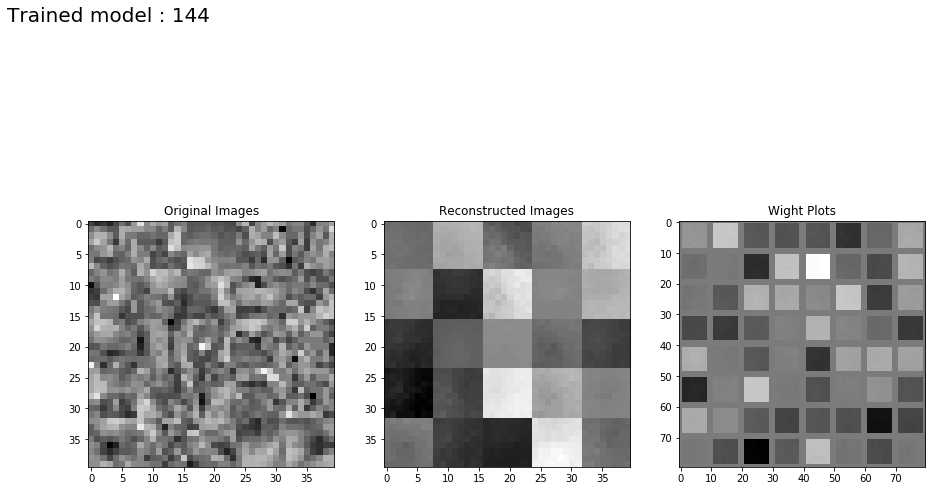

Step 1: Minibatch Loss: 0.023231 Error: 0.015169 Sparse: 0.008062
Step 100: Minibatch Loss: 0.015547 Error: 0.015453 Sparse: 0.000094
Step 200: Minibatch Loss: 0.015494 Error: 0.015422 Sparse: 0.000072
Step 300: Minibatch Loss: 0.015416 Error: 0.015344 Sparse: 0.000073
Step 400: Minibatch Loss: 0.015512 Error: 0.015437 Sparse: 0.000075
Step 500: Minibatch Loss: 0.015533 Error: 0.015469 Sparse: 0.000064
Step 600: Minibatch Loss: 0.015408 Error: 0.015344 Sparse: 0.000065
Step 700: Minibatch Loss: 0.015468 Error: 0.015406 Sparse: 0.000062
Step 800: Minibatch Loss: 0.015455 Error: 0.015391 Sparse: 0.000064
Step 900: Minibatch Loss: 0.015518 Error: 0.015453 Sparse: 0.000065
Step 1000: Minibatch Loss: 0.015404 Error: 0.015344 Sparse: 0.000060
Step 1100: Minibatch Loss: 0.015430 Error: 0.015359 Sparse: 0.000071
Step 1200: Minibatch Loss: 0.015547 Error: 0.015484 Sparse: 0.000063
Step 1300: Minibatch Loss: 0.015413 Error: 0.015344 Sparse: 0.000070
Step 1400: Minibatch Loss: 0.015487 Error: 0.0

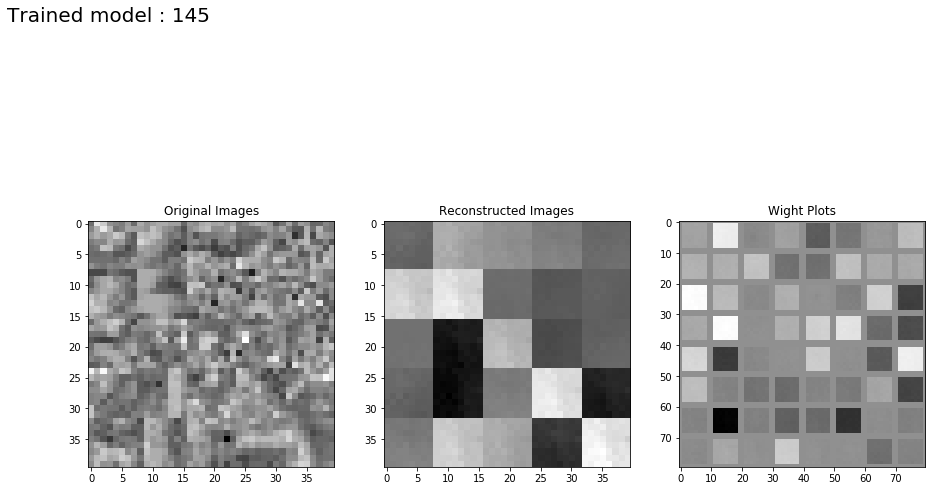

Step 1: Minibatch Loss: 0.015127 Error: 0.015126 Sparse: 0.007957
Step 100: Minibatch Loss: 0.007165 Error: 0.007158 Sparse: 0.068649
Step 200: Minibatch Loss: 0.004269 Error: 0.004261 Sparse: 0.082222
Step 300: Minibatch Loss: 0.002718 Error: 0.002709 Sparse: 0.087992
Step 400: Minibatch Loss: 0.001736 Error: 0.001727 Sparse: 0.091931
Step 500: Minibatch Loss: 0.001060 Error: 0.001051 Sparse: 0.094549
Step 600: Minibatch Loss: 0.000686 Error: 0.000676 Sparse: 0.096018
Step 700: Minibatch Loss: 0.000443 Error: 0.000433 Sparse: 0.096955
Step 800: Minibatch Loss: 0.000248 Error: 0.000238 Sparse: 0.098379
Step 900: Minibatch Loss: 0.000143 Error: 0.000133 Sparse: 0.099171
Step 1000: Minibatch Loss: 0.000082 Error: 0.000072 Sparse: 0.099514
Step 1100: Minibatch Loss: 0.000055 Error: 0.000045 Sparse: 0.098757
Step 1200: Minibatch Loss: 0.000034 Error: 0.000024 Sparse: 0.099187
Step 1300: Minibatch Loss: 0.000015 Error: 0.000005 Sparse: 0.099454
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

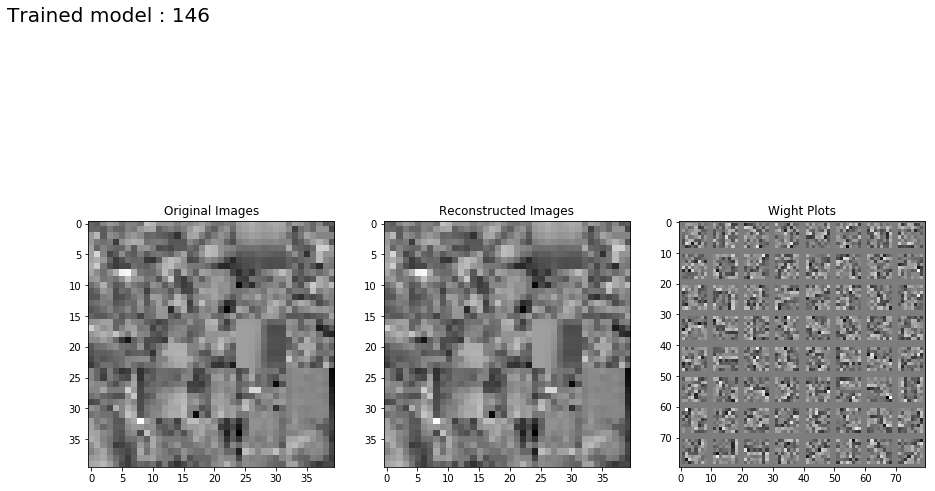

Step 1: Minibatch Loss: 0.015290 Error: 0.015282 Sparse: 0.007689
Step 100: Minibatch Loss: 0.007221 Error: 0.007152 Sparse: 0.068759
Step 200: Minibatch Loss: 0.004483 Error: 0.004402 Sparse: 0.081283
Step 300: Minibatch Loss: 0.002871 Error: 0.002783 Sparse: 0.088235
Step 400: Minibatch Loss: 0.001881 Error: 0.001789 Sparse: 0.092055
Step 500: Minibatch Loss: 0.001164 Error: 0.001070 Sparse: 0.094587
Step 600: Minibatch Loss: 0.000719 Error: 0.000623 Sparse: 0.096217
Step 700: Minibatch Loss: 0.000456 Error: 0.000359 Sparse: 0.097560
Step 800: Minibatch Loss: 0.000283 Error: 0.000185 Sparse: 0.098124
Step 900: Minibatch Loss: 0.000203 Error: 0.000103 Sparse: 0.099418
Step 1000: Minibatch Loss: 0.000164 Error: 0.000065 Sparse: 0.099077
Step 1100: Minibatch Loss: 0.000116 Error: 0.000017 Sparse: 0.098958
Step 1200: Minibatch Loss: 0.000102 Error: 0.000002 Sparse: 0.100243
Step 1300: Minibatch Loss: 0.000100 Error: 0.000000 Sparse: 0.099443
Step 1400: Minibatch Loss: 0.000099 Error: 0.0

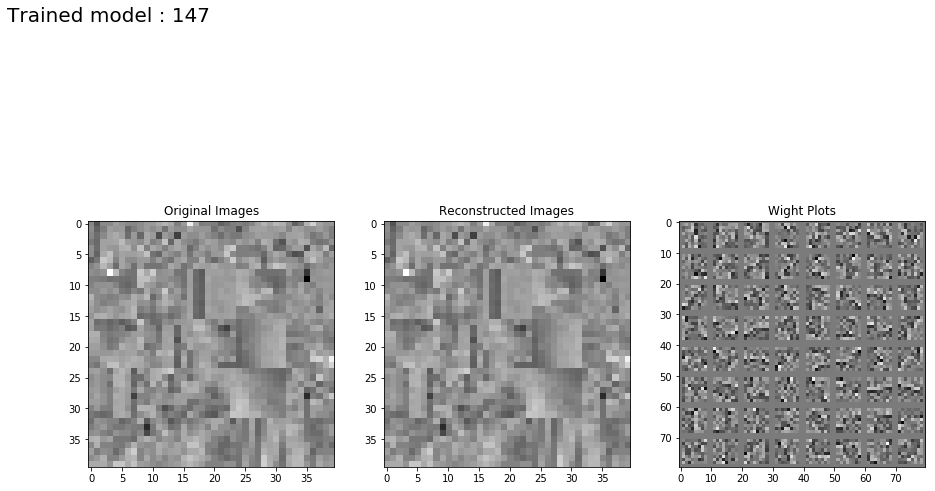

Step 1: Minibatch Loss: 0.015154 Error: 0.015073 Sparse: 0.008087
Step 100: Minibatch Loss: 0.007901 Error: 0.007221 Sparse: 0.067960
Step 200: Minibatch Loss: 0.005069 Error: 0.004255 Sparse: 0.081349
Step 300: Minibatch Loss: 0.003693 Error: 0.002829 Sparse: 0.086439
Step 400: Minibatch Loss: 0.002699 Error: 0.001786 Sparse: 0.091242
Step 500: Minibatch Loss: 0.001998 Error: 0.001054 Sparse: 0.094348
Step 600: Minibatch Loss: 0.001680 Error: 0.000730 Sparse: 0.095046
Step 700: Minibatch Loss: 0.001366 Error: 0.000403 Sparse: 0.096361
Step 800: Minibatch Loss: 0.001191 Error: 0.000212 Sparse: 0.097896
Step 900: Minibatch Loss: 0.001092 Error: 0.000110 Sparse: 0.098202
Step 1000: Minibatch Loss: 0.001046 Error: 0.000071 Sparse: 0.097499
Step 1100: Minibatch Loss: 0.001037 Error: 0.000047 Sparse: 0.099000
Step 1200: Minibatch Loss: 0.000996 Error: 0.000021 Sparse: 0.097494
Step 1300: Minibatch Loss: 0.000989 Error: 0.000005 Sparse: 0.098362
Step 1400: Minibatch Loss: 0.000978 Error: 0.0

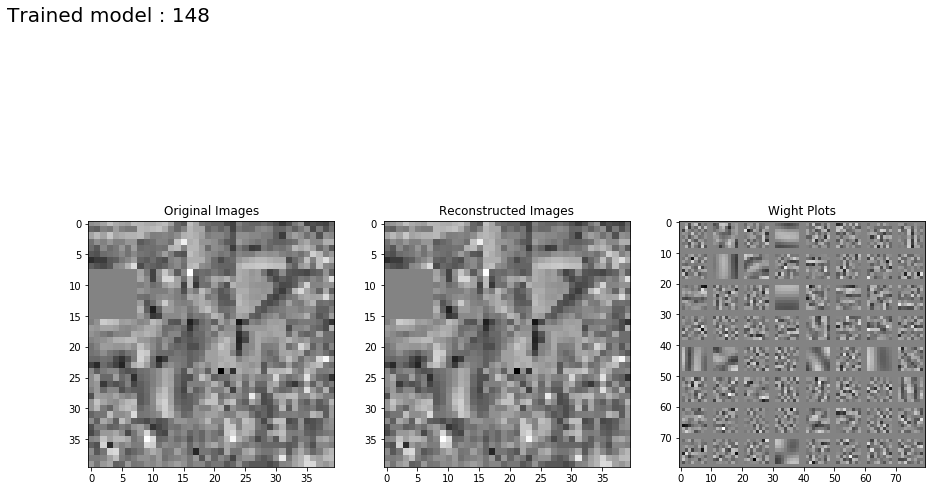

Step 1: Minibatch Loss: 0.016013 Error: 0.015199 Sparse: 0.008134
Step 100: Minibatch Loss: 0.015448 Error: 0.015438 Sparse: 0.000108
Step 200: Minibatch Loss: 0.015445 Error: 0.015437 Sparse: 0.000078
Step 300: Minibatch Loss: 0.015398 Error: 0.015391 Sparse: 0.000071
Step 400: Minibatch Loss: 0.015351 Error: 0.015344 Sparse: 0.000068
Step 500: Minibatch Loss: 0.015491 Error: 0.015484 Sparse: 0.000062
Step 600: Minibatch Loss: 0.015381 Error: 0.015375 Sparse: 0.000060
Step 700: Minibatch Loss: 0.015491 Error: 0.015484 Sparse: 0.000071
Step 800: Minibatch Loss: 0.015445 Error: 0.015437 Sparse: 0.000071
Step 900: Minibatch Loss: 0.015381 Error: 0.015375 Sparse: 0.000063
Step 1000: Minibatch Loss: 0.015475 Error: 0.015469 Sparse: 0.000063
Step 1100: Minibatch Loss: 0.015507 Error: 0.015500 Sparse: 0.000068
Step 1200: Minibatch Loss: 0.015319 Error: 0.015313 Sparse: 0.000061
Step 1300: Minibatch Loss: 0.015522 Error: 0.015516 Sparse: 0.000064
Step 1400: Minibatch Loss: 0.015366 Error: 0.0

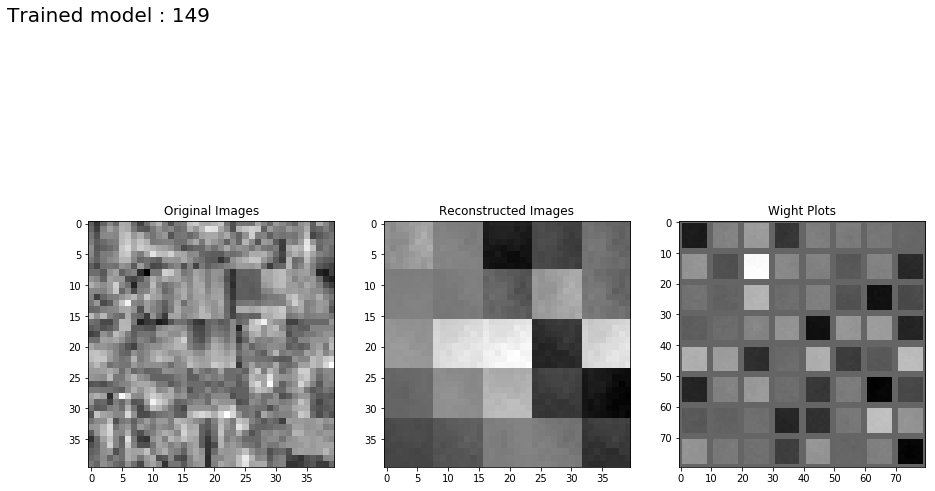

Step 1: Minibatch Loss: 0.023149 Error: 0.015306 Sparse: 0.007842
Step 100: Minibatch Loss: 0.015459 Error: 0.015359 Sparse: 0.000099
Step 200: Minibatch Loss: 0.015470 Error: 0.015391 Sparse: 0.000079
Step 300: Minibatch Loss: 0.015496 Error: 0.015422 Sparse: 0.000074
Step 400: Minibatch Loss: 0.015612 Error: 0.015547 Sparse: 0.000065
Step 500: Minibatch Loss: 0.015455 Error: 0.015391 Sparse: 0.000064
Step 600: Minibatch Loss: 0.015546 Error: 0.015484 Sparse: 0.000061
Step 700: Minibatch Loss: 0.015533 Error: 0.015469 Sparse: 0.000065
Step 800: Minibatch Loss: 0.015481 Error: 0.015422 Sparse: 0.000059
Step 900: Minibatch Loss: 0.015423 Error: 0.015359 Sparse: 0.000064
Step 1000: Minibatch Loss: 0.015519 Error: 0.015453 Sparse: 0.000066
Step 1100: Minibatch Loss: 0.015512 Error: 0.015453 Sparse: 0.000059
Step 1200: Minibatch Loss: 0.015451 Error: 0.015391 Sparse: 0.000061
Step 1300: Minibatch Loss: 0.015562 Error: 0.015500 Sparse: 0.000062
Step 1400: Minibatch Loss: 0.015391 Error: 0.0

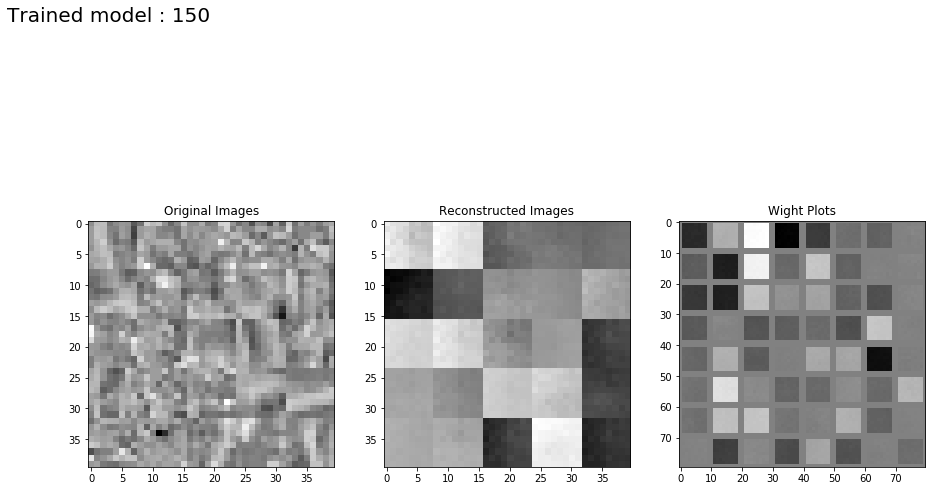

Step 1: Minibatch Loss: 0.015235 Error: 0.015234 Sparse: 0.008042
Step 100: Minibatch Loss: 0.000723 Error: 0.000713 Sparse: 0.096953
Step 200: Minibatch Loss: 0.000024 Error: 0.000014 Sparse: 0.099089
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099119
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099792
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099763
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098658
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099681
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098651
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099404
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098808


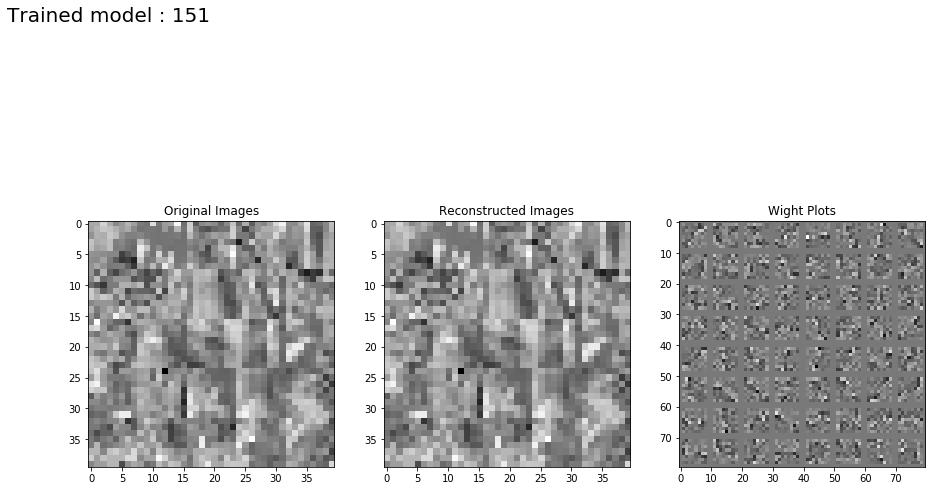

Step 1: Minibatch Loss: 0.015181 Error: 0.015173 Sparse: 0.007986
Step 100: Minibatch Loss: 0.000716 Error: 0.000619 Sparse: 0.097244
Step 200: Minibatch Loss: 0.000101 Error: 0.000002 Sparse: 0.099113
Step 300: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098912
Step 400: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098392
Step 500: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098887
Step 600: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.099078
Step 700: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098073
Step 800: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098872
Step 900: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097607
Step 1000: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097533


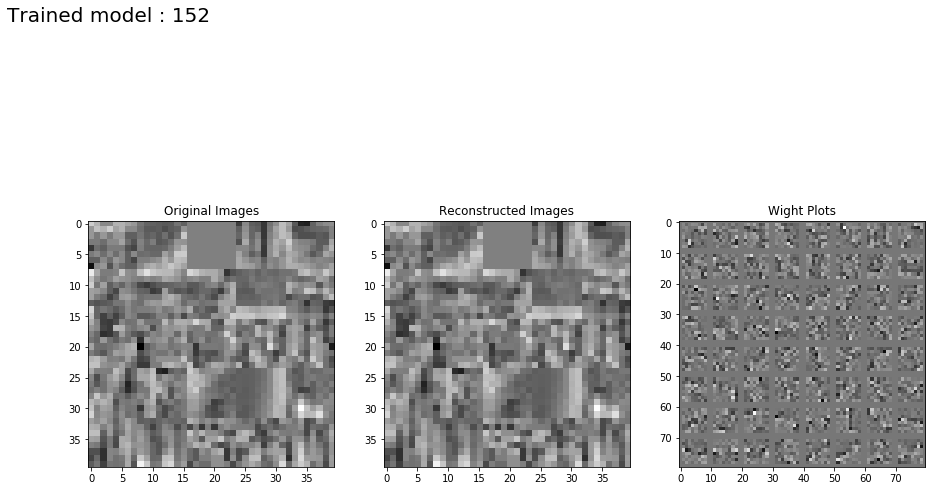

Step 1: Minibatch Loss: 0.015247 Error: 0.015169 Sparse: 0.007714
Step 100: Minibatch Loss: 0.001609 Error: 0.000653 Sparse: 0.095631
Step 200: Minibatch Loss: 0.000974 Error: 0.000005 Sparse: 0.096948
Step 300: Minibatch Loss: 0.000948 Error: 0.000004 Sparse: 0.094442
Step 400: Minibatch Loss: 0.000918 Error: 0.000004 Sparse: 0.091404
Step 500: Minibatch Loss: 0.000882 Error: 0.000004 Sparse: 0.087862
Step 600: Minibatch Loss: 0.000875 Error: 0.000004 Sparse: 0.087157
Step 700: Minibatch Loss: 0.000857 Error: 0.000004 Sparse: 0.085337
Step 800: Minibatch Loss: 0.000848 Error: 0.000004 Sparse: 0.084433
Step 900: Minibatch Loss: 0.000845 Error: 0.000004 Sparse: 0.084146
Step 1000: Minibatch Loss: 0.000836 Error: 0.000004 Sparse: 0.083208


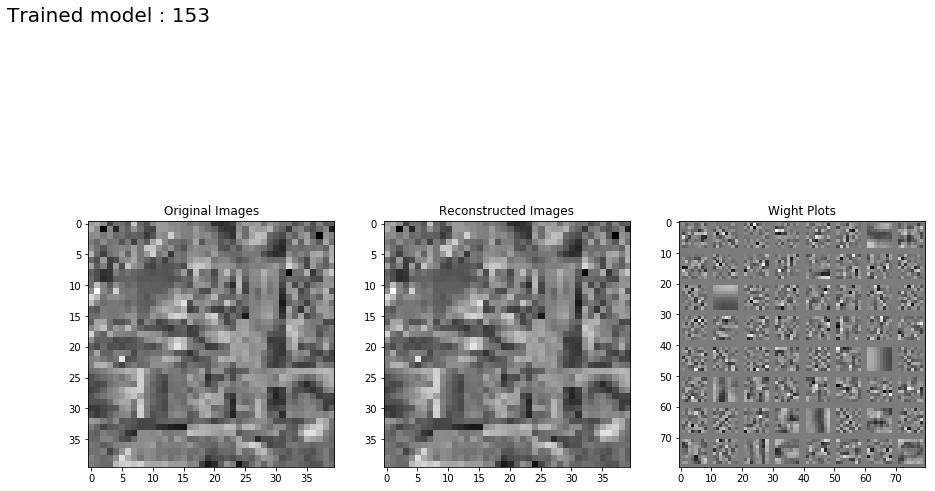

Step 1: Minibatch Loss: 0.016073 Error: 0.015262 Sparse: 0.008110
Step 100: Minibatch Loss: 0.015512 Error: 0.015436 Sparse: 0.000761
Step 200: Minibatch Loss: 0.015544 Error: 0.015467 Sparse: 0.000769
Step 300: Minibatch Loss: 0.015567 Error: 0.015498 Sparse: 0.000687
Step 400: Minibatch Loss: 0.015563 Error: 0.015499 Sparse: 0.000644
Step 500: Minibatch Loss: 0.015440 Error: 0.015373 Sparse: 0.000662
Step 600: Minibatch Loss: 0.015563 Error: 0.015499 Sparse: 0.000641
Step 700: Minibatch Loss: 0.015559 Error: 0.015499 Sparse: 0.000607
Step 800: Minibatch Loss: 0.015513 Error: 0.015452 Sparse: 0.000608
Step 900: Minibatch Loss: 0.015501 Error: 0.015436 Sparse: 0.000647
Step 1000: Minibatch Loss: 0.015377 Error: 0.015311 Sparse: 0.000662


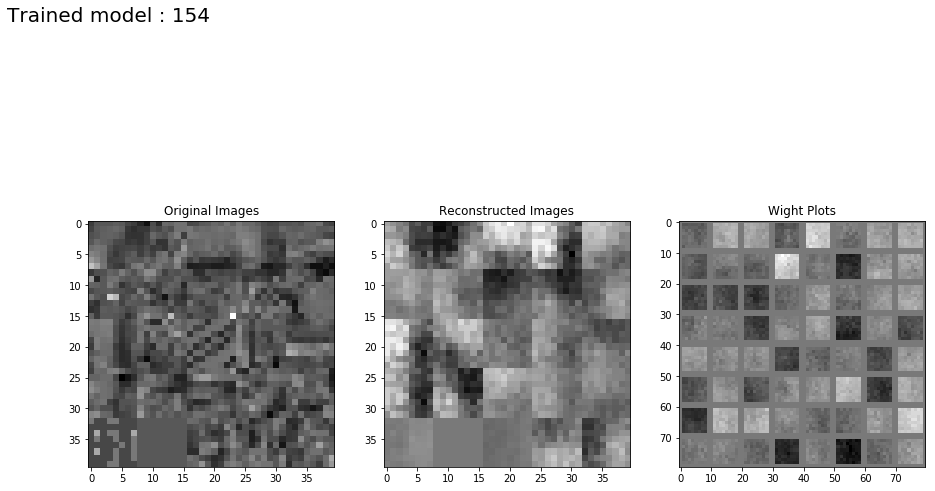

Step 1: Minibatch Loss: 0.022922 Error: 0.015201 Sparse: 0.007721
Step 100: Minibatch Loss: 0.016105 Error: 0.015373 Sparse: 0.000732
Step 200: Minibatch Loss: 0.016153 Error: 0.015483 Sparse: 0.000670
Step 300: Minibatch Loss: 0.015945 Error: 0.015264 Sparse: 0.000681
Step 400: Minibatch Loss: 0.016016 Error: 0.015436 Sparse: 0.000580
Step 500: Minibatch Loss: 0.016035 Error: 0.015373 Sparse: 0.000662
Step 600: Minibatch Loss: 0.016069 Error: 0.015436 Sparse: 0.000633
Step 700: Minibatch Loss: 0.016054 Error: 0.015452 Sparse: 0.000602
Step 800: Minibatch Loss: 0.016066 Error: 0.015436 Sparse: 0.000629
Step 900: Minibatch Loss: 0.016088 Error: 0.015420 Sparse: 0.000668
Step 1000: Minibatch Loss: 0.016092 Error: 0.015420 Sparse: 0.000671


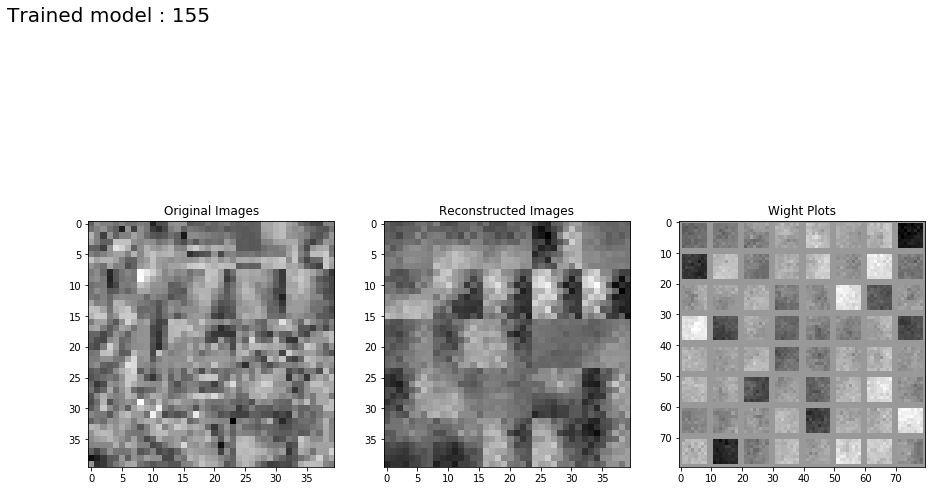

Step 1: Minibatch Loss: 0.015189 Error: 0.015189 Sparse: 0.007925
Step 100: Minibatch Loss: 0.000850 Error: 0.000841 Sparse: 0.095680
Step 200: Minibatch Loss: 0.000052 Error: 0.000043 Sparse: 0.099216
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098597
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099577
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099466
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098746
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099216
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098904
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099136
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099591
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099225
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099334
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098966
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

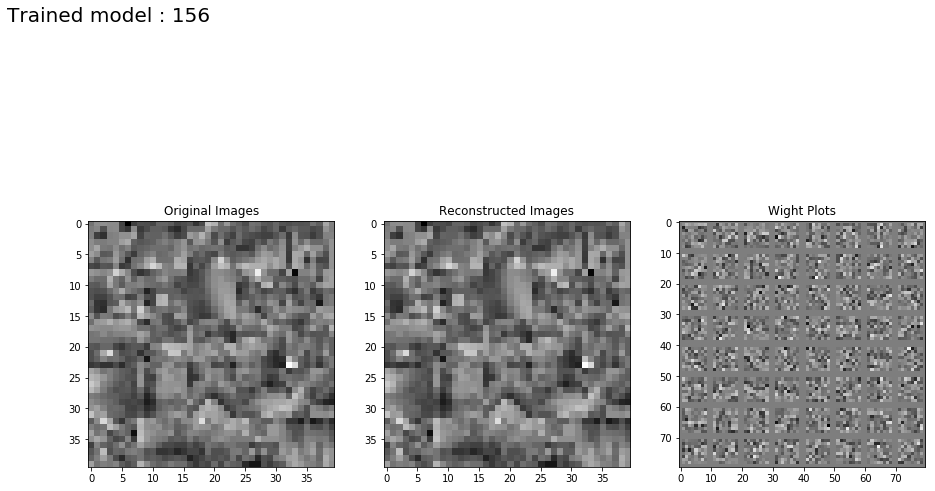

Step 1: Minibatch Loss: 0.015246 Error: 0.015238 Sparse: 0.007977
Step 100: Minibatch Loss: 0.000786 Error: 0.000690 Sparse: 0.096015
Step 200: Minibatch Loss: 0.000126 Error: 0.000026 Sparse: 0.099660
Step 300: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.099261
Step 400: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098418
Step 500: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.099108
Step 600: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098126
Step 700: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098850
Step 800: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098233
Step 900: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098350
Step 1000: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096944
Step 1100: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096694
Step 1200: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.095956
Step 1300: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.095555
Step 1400: Minibatch Loss: 0.000094 Error: 0.0

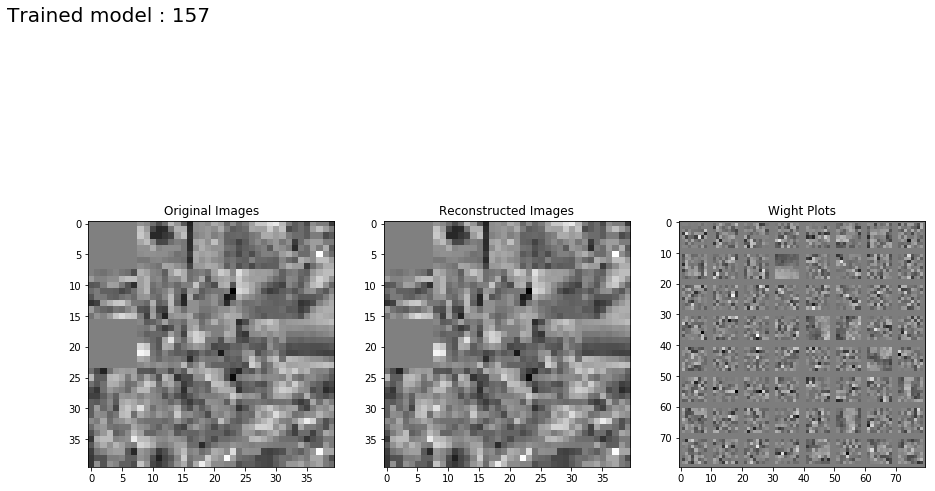

Step 1: Minibatch Loss: 0.015408 Error: 0.015327 Sparse: 0.008056
Step 100: Minibatch Loss: 0.001572 Error: 0.000618 Sparse: 0.095383
Step 200: Minibatch Loss: 0.000976 Error: 0.000006 Sparse: 0.097057
Step 300: Minibatch Loss: 0.000955 Error: 0.000004 Sparse: 0.095100
Step 400: Minibatch Loss: 0.000918 Error: 0.000004 Sparse: 0.091362
Step 500: Minibatch Loss: 0.000897 Error: 0.000004 Sparse: 0.089339
Step 600: Minibatch Loss: 0.000869 Error: 0.000004 Sparse: 0.086538
Step 700: Minibatch Loss: 0.000860 Error: 0.000004 Sparse: 0.085590
Step 800: Minibatch Loss: 0.000841 Error: 0.000004 Sparse: 0.083699
Step 900: Minibatch Loss: 0.000826 Error: 0.000004 Sparse: 0.082232
Step 1000: Minibatch Loss: 0.000826 Error: 0.000004 Sparse: 0.082249
Step 1100: Minibatch Loss: 0.000828 Error: 0.000004 Sparse: 0.082443
Step 1200: Minibatch Loss: 0.000825 Error: 0.000004 Sparse: 0.082076
Step 1300: Minibatch Loss: 0.000818 Error: 0.000004 Sparse: 0.081394
Step 1400: Minibatch Loss: 0.000809 Error: 0.0

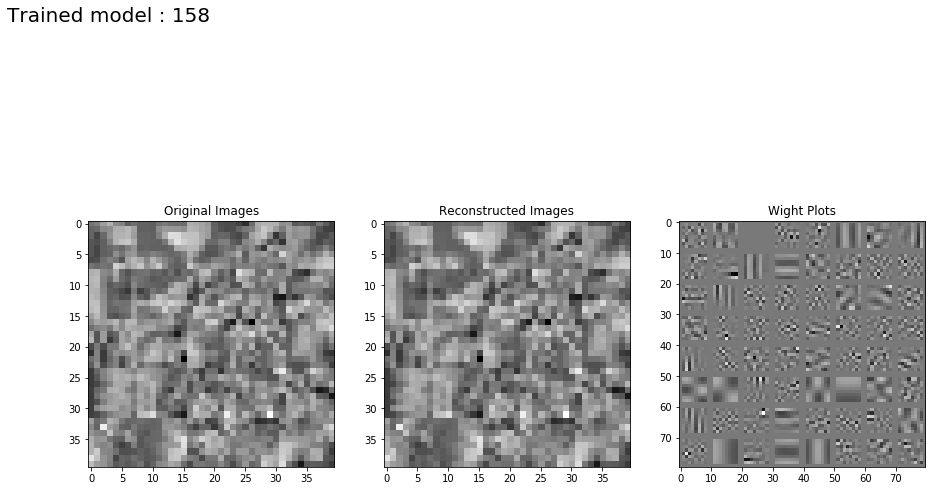

Step 1: Minibatch Loss: 0.015941 Error: 0.015171 Sparse: 0.007698
Step 100: Minibatch Loss: 0.015479 Error: 0.015404 Sparse: 0.000752
Step 200: Minibatch Loss: 0.015553 Error: 0.015483 Sparse: 0.000704
Step 300: Minibatch Loss: 0.015379 Error: 0.015311 Sparse: 0.000682
Step 400: Minibatch Loss: 0.015484 Error: 0.015420 Sparse: 0.000637
Step 500: Minibatch Loss: 0.015328 Error: 0.015264 Sparse: 0.000636
Step 600: Minibatch Loss: 0.015504 Error: 0.015436 Sparse: 0.000680
Step 700: Minibatch Loss: 0.015532 Error: 0.015467 Sparse: 0.000647
Step 800: Minibatch Loss: 0.015279 Error: 0.015217 Sparse: 0.000620
Step 900: Minibatch Loss: 0.015486 Error: 0.015420 Sparse: 0.000657
Step 1000: Minibatch Loss: 0.015477 Error: 0.015404 Sparse: 0.000730
Step 1100: Minibatch Loss: 0.015412 Error: 0.015342 Sparse: 0.000700
Step 1200: Minibatch Loss: 0.015439 Error: 0.015374 Sparse: 0.000654
Step 1300: Minibatch Loss: 0.015422 Error: 0.015358 Sparse: 0.000640
Step 1400: Minibatch Loss: 0.015520 Error: 0.0

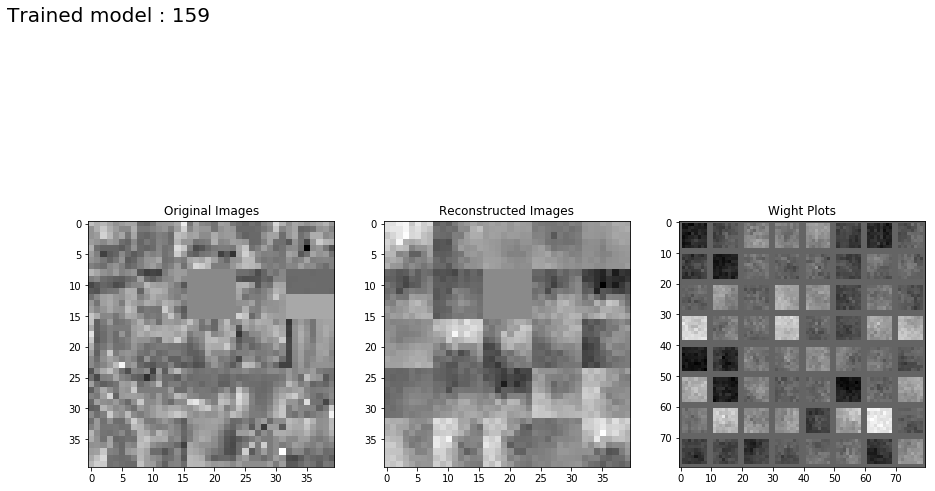

Step 1: Minibatch Loss: 0.022934 Error: 0.015269 Sparse: 0.007665
Step 100: Minibatch Loss: 0.016146 Error: 0.015467 Sparse: 0.000679
Step 200: Minibatch Loss: 0.015969 Error: 0.015358 Sparse: 0.000611
Step 300: Minibatch Loss: 0.015951 Error: 0.015343 Sparse: 0.000609
Step 400: Minibatch Loss: 0.016021 Error: 0.015389 Sparse: 0.000632
Step 500: Minibatch Loss: 0.016052 Error: 0.015374 Sparse: 0.000679
Step 600: Minibatch Loss: 0.016042 Error: 0.015452 Sparse: 0.000590
Step 700: Minibatch Loss: 0.015859 Error: 0.015264 Sparse: 0.000594
Step 800: Minibatch Loss: 0.016095 Error: 0.015467 Sparse: 0.000628
Step 900: Minibatch Loss: 0.015987 Error: 0.015374 Sparse: 0.000614
Step 1000: Minibatch Loss: 0.016025 Error: 0.015358 Sparse: 0.000668
Step 1100: Minibatch Loss: 0.016091 Error: 0.015452 Sparse: 0.000639
Step 1200: Minibatch Loss: 0.016126 Error: 0.015467 Sparse: 0.000659
Step 1300: Minibatch Loss: 0.015951 Error: 0.015343 Sparse: 0.000608
Step 1400: Minibatch Loss: 0.016051 Error: 0.0

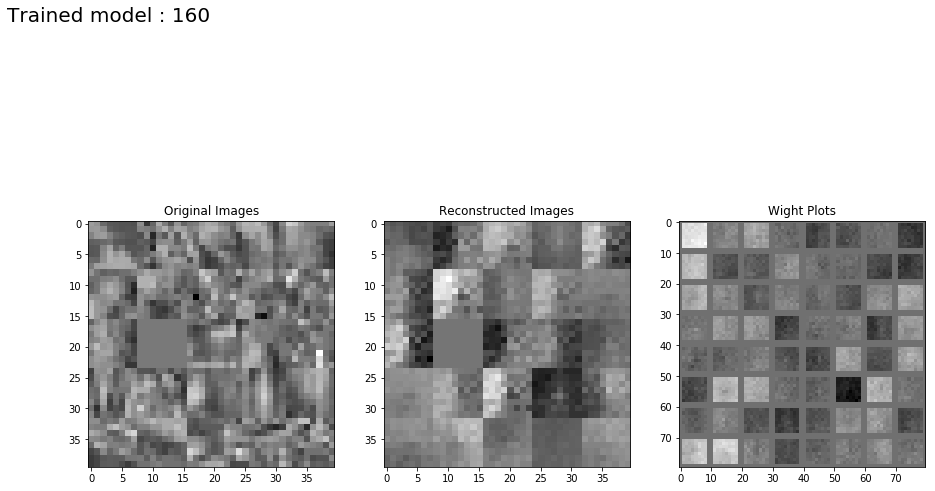

Step 1: Minibatch Loss: 0.015061 Error: 0.015060 Sparse: 0.007659
Step 100: Minibatch Loss: 0.000630 Error: 0.000620 Sparse: 0.096424
Step 200: Minibatch Loss: 0.000034 Error: 0.000024 Sparse: 0.100006
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099112
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099741
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099411
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099270
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.100018
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099139
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098714
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098590
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098559
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098893
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098050
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

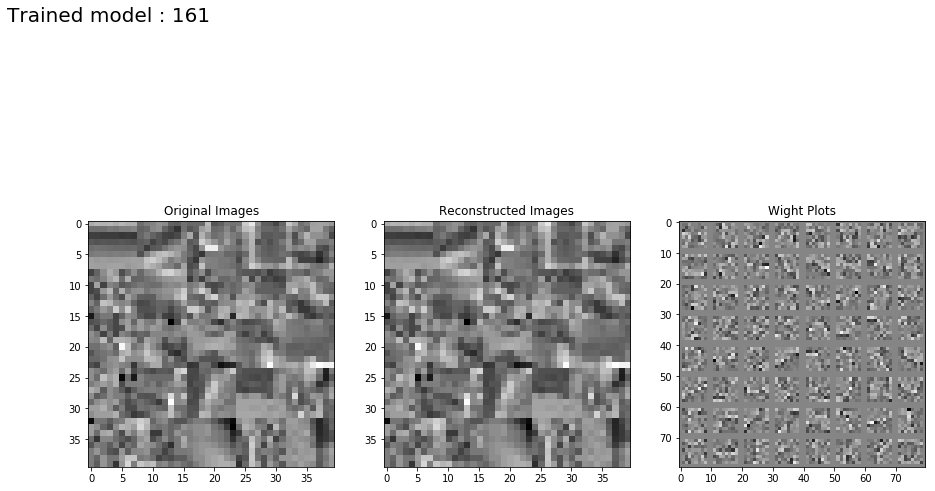

Step 1: Minibatch Loss: 0.015294 Error: 0.015285 Sparse: 0.008231
Step 100: Minibatch Loss: 0.000766 Error: 0.000669 Sparse: 0.096790
Step 200: Minibatch Loss: 0.000112 Error: 0.000013 Sparse: 0.098918
Step 300: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.099177
Step 400: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.099369
Step 500: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098567
Step 600: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097954
Step 700: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098693
Step 800: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097909
Step 900: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097243
Step 1000: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097098
Step 1100: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096391
Step 1200: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.095611
Step 1300: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.095532
Step 1400: Minibatch Loss: 0.000094 Error: 0.0

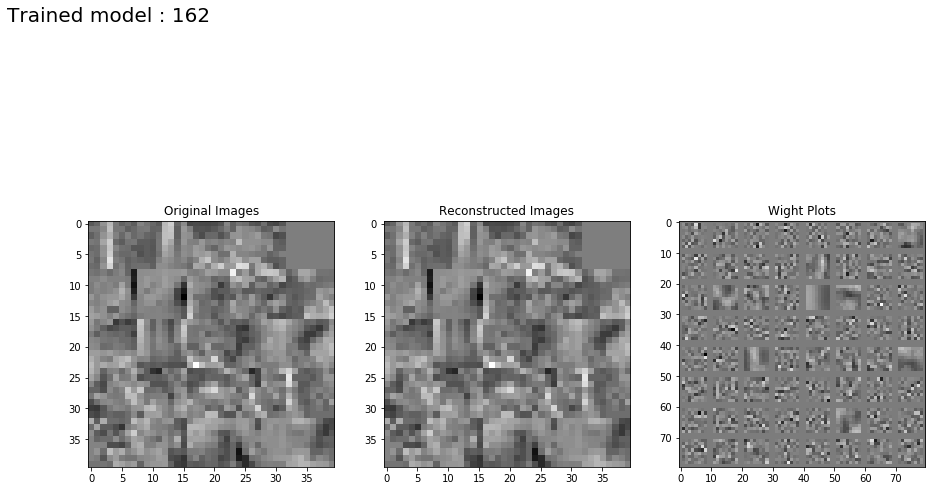

Step 1: Minibatch Loss: 0.015286 Error: 0.015207 Sparse: 0.007938
Step 100: Minibatch Loss: 0.001653 Error: 0.000698 Sparse: 0.095582
Step 200: Minibatch Loss: 0.001011 Error: 0.000038 Sparse: 0.097374
Step 300: Minibatch Loss: 0.000954 Error: 0.000004 Sparse: 0.095019
Step 400: Minibatch Loss: 0.000925 Error: 0.000004 Sparse: 0.092127
Step 500: Minibatch Loss: 0.000900 Error: 0.000004 Sparse: 0.089657
Step 600: Minibatch Loss: 0.000879 Error: 0.000004 Sparse: 0.087512
Step 700: Minibatch Loss: 0.000860 Error: 0.000004 Sparse: 0.085657
Step 800: Minibatch Loss: 0.000841 Error: 0.000004 Sparse: 0.083728
Step 900: Minibatch Loss: 0.000846 Error: 0.000004 Sparse: 0.084219
Step 1000: Minibatch Loss: 0.000837 Error: 0.000004 Sparse: 0.083273
Step 1100: Minibatch Loss: 0.000816 Error: 0.000004 Sparse: 0.081218
Step 1200: Minibatch Loss: 0.000815 Error: 0.000004 Sparse: 0.081136
Step 1300: Minibatch Loss: 0.000809 Error: 0.000004 Sparse: 0.080550
Step 1400: Minibatch Loss: 0.000802 Error: 0.0

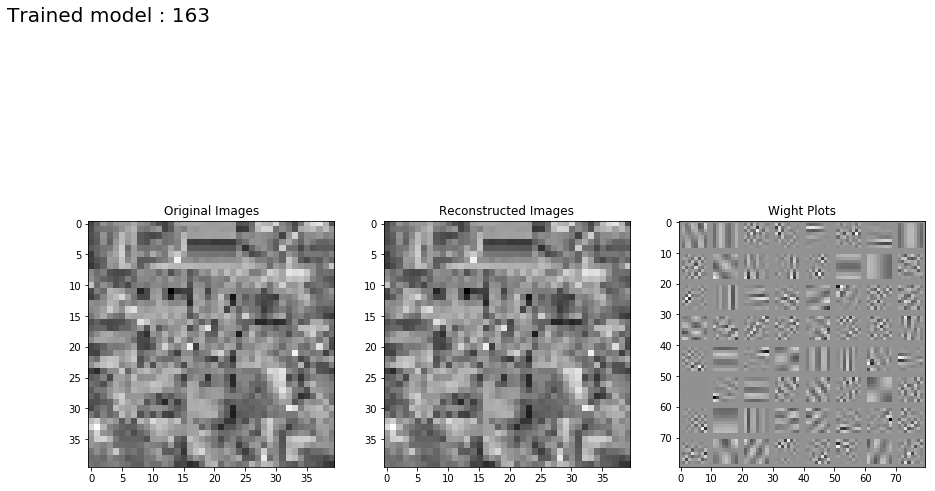

Step 1: Minibatch Loss: 0.016009 Error: 0.015229 Sparse: 0.007800
Step 100: Minibatch Loss: 0.015479 Error: 0.015404 Sparse: 0.000744
Step 200: Minibatch Loss: 0.015446 Error: 0.015373 Sparse: 0.000731
Step 300: Minibatch Loss: 0.015442 Error: 0.015373 Sparse: 0.000689
Step 400: Minibatch Loss: 0.015470 Error: 0.015405 Sparse: 0.000651
Step 500: Minibatch Loss: 0.015534 Error: 0.015467 Sparse: 0.000669
Step 600: Minibatch Loss: 0.015440 Error: 0.015374 Sparse: 0.000666
Step 700: Minibatch Loss: 0.015483 Error: 0.015421 Sparse: 0.000622
Step 800: Minibatch Loss: 0.015452 Error: 0.015389 Sparse: 0.000632
Step 900: Minibatch Loss: 0.015485 Error: 0.015420 Sparse: 0.000643
Step 1000: Minibatch Loss: 0.015535 Error: 0.015467 Sparse: 0.000679
Step 1100: Minibatch Loss: 0.015436 Error: 0.015374 Sparse: 0.000619
Step 1200: Minibatch Loss: 0.015377 Error: 0.015311 Sparse: 0.000657
Step 1300: Minibatch Loss: 0.015494 Error: 0.015420 Sparse: 0.000738
Step 1400: Minibatch Loss: 0.015485 Error: 0.0

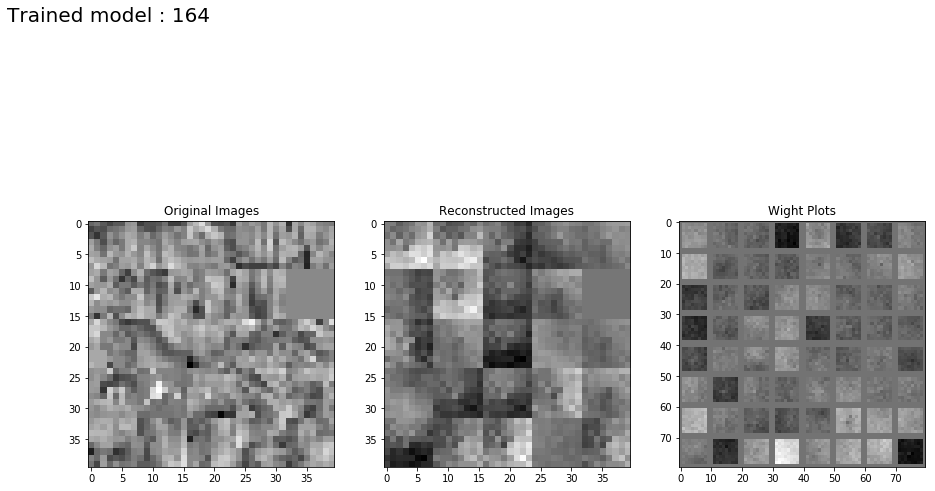

Step 1: Minibatch Loss: 0.023351 Error: 0.015263 Sparse: 0.008088
Step 100: Minibatch Loss: 0.016035 Error: 0.015311 Sparse: 0.000725
Step 200: Minibatch Loss: 0.016251 Error: 0.015545 Sparse: 0.000706
Step 300: Minibatch Loss: 0.015988 Error: 0.015342 Sparse: 0.000646
Step 400: Minibatch Loss: 0.016002 Error: 0.015358 Sparse: 0.000644
Step 500: Minibatch Loss: 0.016018 Error: 0.015389 Sparse: 0.000629
Step 600: Minibatch Loss: 0.016154 Error: 0.015514 Sparse: 0.000639
Step 700: Minibatch Loss: 0.016003 Error: 0.015374 Sparse: 0.000630
Step 800: Minibatch Loss: 0.015994 Error: 0.015374 Sparse: 0.000620
Step 900: Minibatch Loss: 0.016044 Error: 0.015389 Sparse: 0.000655
Step 1000: Minibatch Loss: 0.016047 Error: 0.015358 Sparse: 0.000689
Step 1100: Minibatch Loss: 0.015978 Error: 0.015342 Sparse: 0.000636
Step 1200: Minibatch Loss: 0.016033 Error: 0.015436 Sparse: 0.000597
Step 1300: Minibatch Loss: 0.015994 Error: 0.015358 Sparse: 0.000636
Step 1400: Minibatch Loss: 0.016111 Error: 0.0

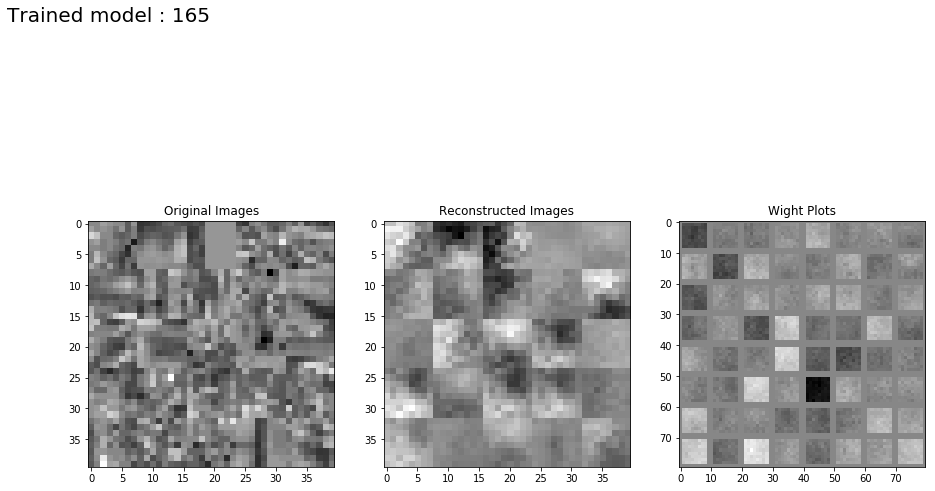

Step 1: Minibatch Loss: 0.015180 Error: 0.015180 Sparse: 0.007858
Step 100: Minibatch Loss: 0.000719 Error: 0.000709 Sparse: 0.096682
Step 200: Minibatch Loss: 0.000013 Error: 0.000003 Sparse: 0.099451
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098644
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099400
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098361
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099528
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098851
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099158
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099334
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099269
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099077
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098172
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099357
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

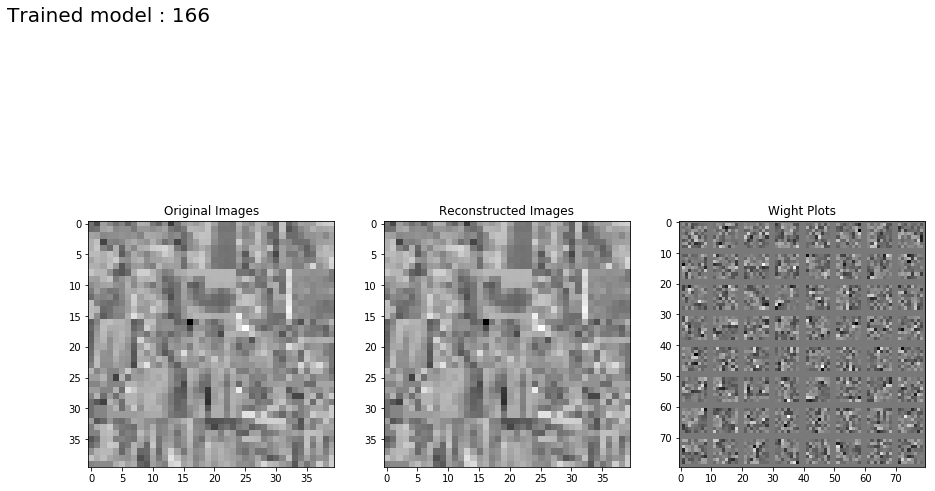

Step 1: Minibatch Loss: 0.015156 Error: 0.015148 Sparse: 0.007882
Step 100: Minibatch Loss: 0.000765 Error: 0.000668 Sparse: 0.096911
Step 200: Minibatch Loss: 0.000111 Error: 0.000012 Sparse: 0.098483
Step 300: Minibatch Loss: 0.000100 Error: 0.000000 Sparse: 0.099512
Step 400: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098726
Step 500: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098785
Step 600: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098631
Step 700: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098609
Step 800: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098330
Step 900: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097552
Step 1000: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098073
Step 1100: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097260
Step 1200: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096905
Step 1300: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096386
Step 1400: Minibatch Loss: 0.000095 Error: 0.0

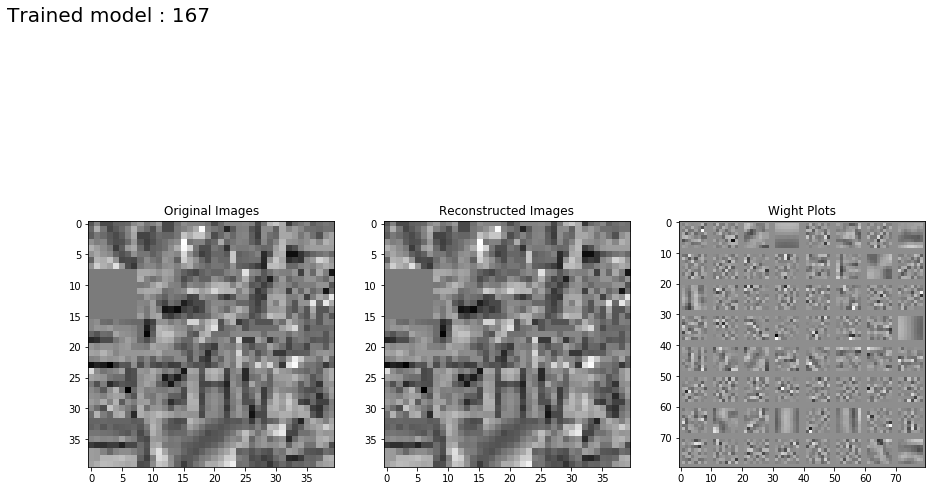

Step 1: Minibatch Loss: 0.015290 Error: 0.015211 Sparse: 0.007872
Step 100: Minibatch Loss: 0.001643 Error: 0.000685 Sparse: 0.095851
Step 200: Minibatch Loss: 0.000996 Error: 0.000023 Sparse: 0.097342
Step 300: Minibatch Loss: 0.000945 Error: 0.000004 Sparse: 0.094119
Step 400: Minibatch Loss: 0.000906 Error: 0.000004 Sparse: 0.090239
Step 500: Minibatch Loss: 0.000890 Error: 0.000004 Sparse: 0.088579
Step 600: Minibatch Loss: 0.000873 Error: 0.000004 Sparse: 0.086871
Step 700: Minibatch Loss: 0.000857 Error: 0.000004 Sparse: 0.085287
Step 800: Minibatch Loss: 0.000847 Error: 0.000004 Sparse: 0.084282
Step 900: Minibatch Loss: 0.000844 Error: 0.000004 Sparse: 0.083985
Step 1000: Minibatch Loss: 0.000832 Error: 0.000004 Sparse: 0.082797
Step 1100: Minibatch Loss: 0.000833 Error: 0.000004 Sparse: 0.082921
Step 1200: Minibatch Loss: 0.000826 Error: 0.000004 Sparse: 0.082261
Step 1300: Minibatch Loss: 0.000812 Error: 0.000004 Sparse: 0.080857
Step 1400: Minibatch Loss: 0.000820 Error: 0.0

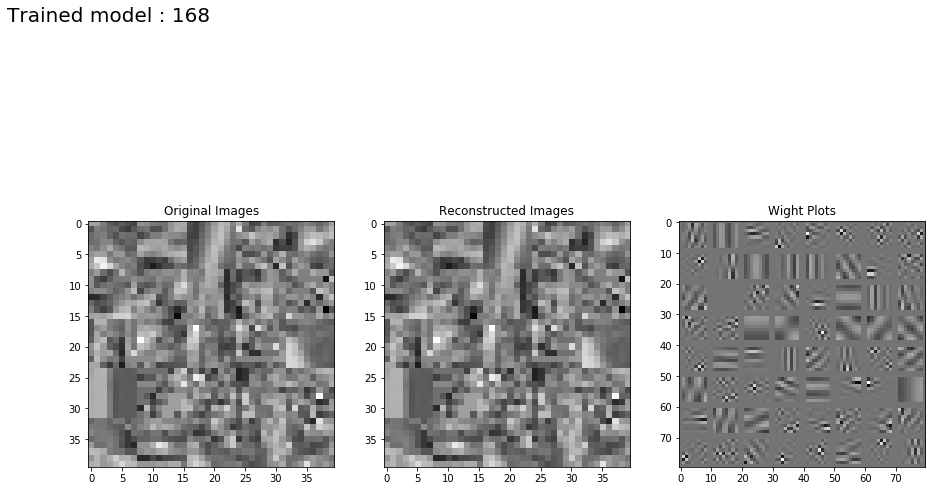

Step 1: Minibatch Loss: 0.016047 Error: 0.015259 Sparse: 0.007884
Step 100: Minibatch Loss: 0.015416 Error: 0.015342 Sparse: 0.000739
Step 200: Minibatch Loss: 0.015477 Error: 0.015404 Sparse: 0.000725
Step 300: Minibatch Loss: 0.015467 Error: 0.015405 Sparse: 0.000623
Step 400: Minibatch Loss: 0.015550 Error: 0.015483 Sparse: 0.000672
Step 500: Minibatch Loss: 0.015423 Error: 0.015358 Sparse: 0.000650
Step 600: Minibatch Loss: 0.015492 Error: 0.015420 Sparse: 0.000721
Step 700: Minibatch Loss: 0.015488 Error: 0.015420 Sparse: 0.000674
Step 800: Minibatch Loss: 0.015511 Error: 0.015435 Sparse: 0.000757
Step 900: Minibatch Loss: 0.015467 Error: 0.015405 Sparse: 0.000625
Step 1000: Minibatch Loss: 0.015396 Error: 0.015327 Sparse: 0.000692
Step 1100: Minibatch Loss: 0.015487 Error: 0.015420 Sparse: 0.000663
Step 1200: Minibatch Loss: 0.015439 Error: 0.015373 Sparse: 0.000655
Step 1300: Minibatch Loss: 0.015515 Error: 0.015452 Sparse: 0.000635
Step 1400: Minibatch Loss: 0.015447 Error: 0.0

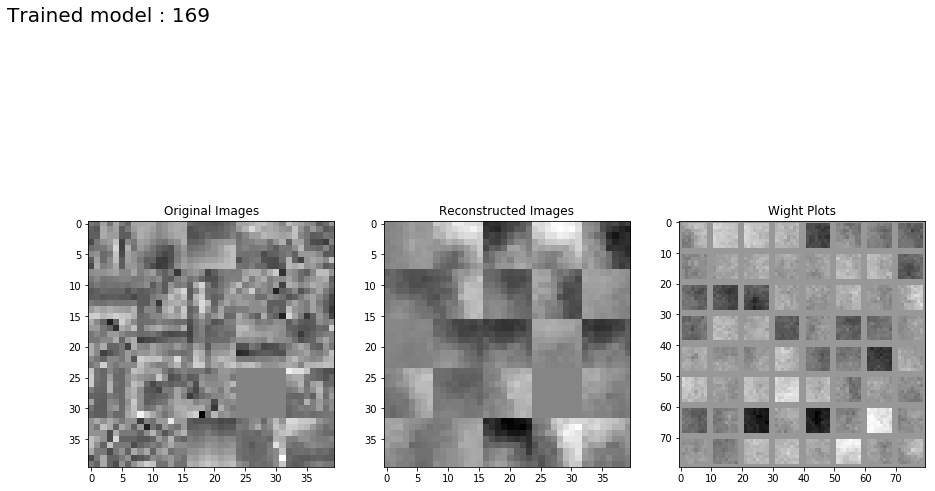

Step 1: Minibatch Loss: 0.023016 Error: 0.015165 Sparse: 0.007851
Step 100: Minibatch Loss: 0.016132 Error: 0.015420 Sparse: 0.000712
Step 200: Minibatch Loss: 0.016138 Error: 0.015420 Sparse: 0.000718
Step 300: Minibatch Loss: 0.016076 Error: 0.015421 Sparse: 0.000655
Step 400: Minibatch Loss: 0.015937 Error: 0.015343 Sparse: 0.000594
Step 500: Minibatch Loss: 0.016109 Error: 0.015467 Sparse: 0.000641
Step 600: Minibatch Loss: 0.016200 Error: 0.015498 Sparse: 0.000702
Step 700: Minibatch Loss: 0.016008 Error: 0.015421 Sparse: 0.000587
Step 800: Minibatch Loss: 0.015997 Error: 0.015374 Sparse: 0.000623
Step 900: Minibatch Loss: 0.016066 Error: 0.015436 Sparse: 0.000629
Step 1000: Minibatch Loss: 0.015872 Error: 0.015280 Sparse: 0.000592
Step 1100: Minibatch Loss: 0.015924 Error: 0.015280 Sparse: 0.000644
Step 1200: Minibatch Loss: 0.016097 Error: 0.015483 Sparse: 0.000614
Step 1300: Minibatch Loss: 0.015980 Error: 0.015358 Sparse: 0.000622
Step 1400: Minibatch Loss: 0.016153 Error: 0.0

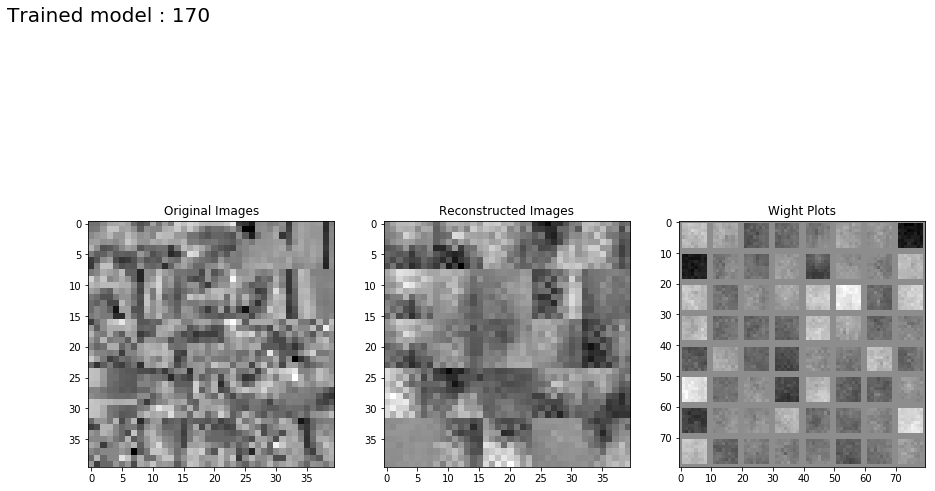

Step 1: Minibatch Loss: 0.015202 Error: 0.015201 Sparse: 0.008021
Step 100: Minibatch Loss: 0.000691 Error: 0.000682 Sparse: 0.096987
Step 200: Minibatch Loss: 0.000032 Error: 0.000022 Sparse: 0.098898
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099504
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098700
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099424
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.100224
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099675
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098936
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099445
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099488
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099985
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098957
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099274
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

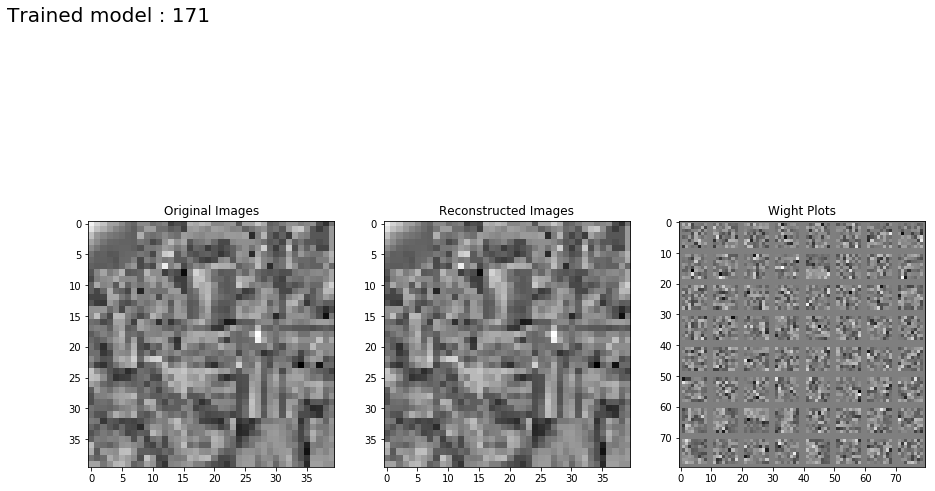

Step 1: Minibatch Loss: 0.015207 Error: 0.015199 Sparse: 0.008058
Step 100: Minibatch Loss: 0.000829 Error: 0.000733 Sparse: 0.096485
Step 200: Minibatch Loss: 0.000109 Error: 0.000010 Sparse: 0.099328
Step 300: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098850
Step 400: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098652
Step 500: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098914
Step 600: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098738
Step 700: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097665
Step 800: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097752
Step 900: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097527
Step 1000: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096240
Step 1100: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096380
Step 1200: Minibatch Loss: 0.000095 Error: 0.000000 Sparse: 0.095445
Step 1300: Minibatch Loss: 0.000094 Error: 0.000000 Sparse: 0.094197
Step 1400: Minibatch Loss: 0.000094 Error: 0.0

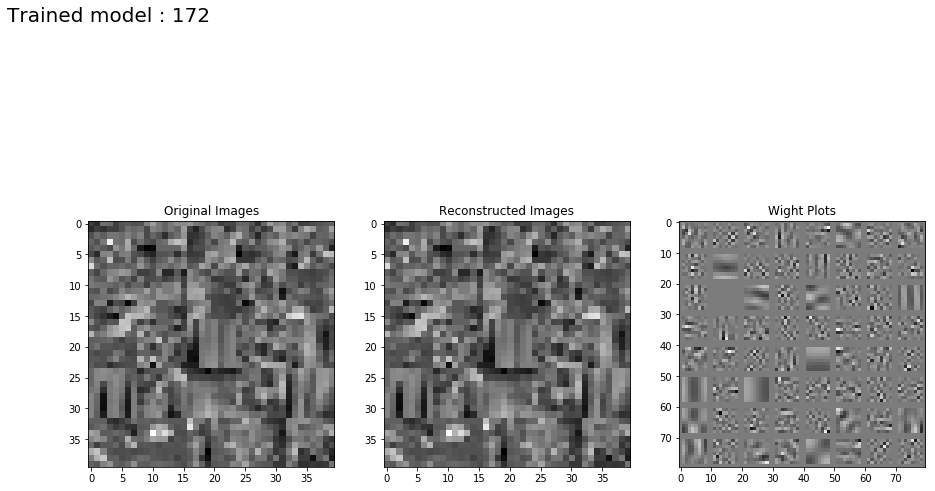

Step 1: Minibatch Loss: 0.015195 Error: 0.015117 Sparse: 0.007806
Step 100: Minibatch Loss: 0.001596 Error: 0.000637 Sparse: 0.095862
Step 200: Minibatch Loss: 0.000976 Error: 0.000005 Sparse: 0.097133
Step 300: Minibatch Loss: 0.000942 Error: 0.000004 Sparse: 0.093847
Step 400: Minibatch Loss: 0.000908 Error: 0.000004 Sparse: 0.090457
Step 500: Minibatch Loss: 0.000876 Error: 0.000004 Sparse: 0.087173
Step 600: Minibatch Loss: 0.000875 Error: 0.000004 Sparse: 0.087081
Step 700: Minibatch Loss: 0.000865 Error: 0.000004 Sparse: 0.086123
Step 800: Minibatch Loss: 0.000851 Error: 0.000004 Sparse: 0.084699
Step 900: Minibatch Loss: 0.000848 Error: 0.000004 Sparse: 0.084412
Step 1000: Minibatch Loss: 0.000838 Error: 0.000004 Sparse: 0.083405
Step 1100: Minibatch Loss: 0.000826 Error: 0.000004 Sparse: 0.082206
Step 1200: Minibatch Loss: 0.000814 Error: 0.000004 Sparse: 0.081028
Step 1300: Minibatch Loss: 0.000813 Error: 0.000004 Sparse: 0.080933
Step 1400: Minibatch Loss: 0.000812 Error: 0.0

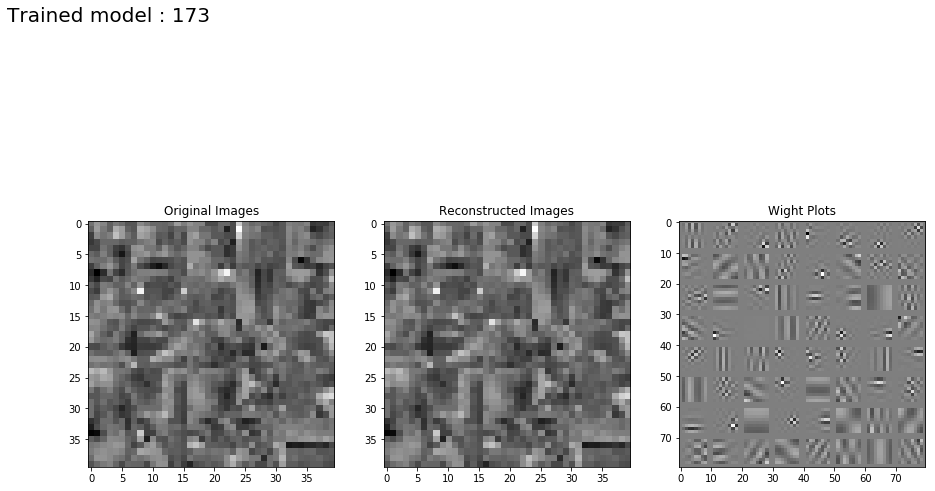

Step 1: Minibatch Loss: 0.016054 Error: 0.015250 Sparse: 0.008037
Step 100: Minibatch Loss: 0.015511 Error: 0.015436 Sparse: 0.000755
Step 200: Minibatch Loss: 0.015476 Error: 0.015404 Sparse: 0.000720
Step 300: Minibatch Loss: 0.015446 Error: 0.015390 Sparse: 0.000559
Step 400: Minibatch Loss: 0.015409 Error: 0.015342 Sparse: 0.000664
Step 500: Minibatch Loss: 0.015467 Error: 0.015405 Sparse: 0.000623
Step 600: Minibatch Loss: 0.015426 Error: 0.015358 Sparse: 0.000683
Step 700: Minibatch Loss: 0.015521 Error: 0.015452 Sparse: 0.000696
Step 800: Minibatch Loss: 0.015473 Error: 0.015405 Sparse: 0.000682
Step 900: Minibatch Loss: 0.015376 Error: 0.015311 Sparse: 0.000653
Step 1000: Minibatch Loss: 0.015447 Error: 0.015373 Sparse: 0.000743
Step 1100: Minibatch Loss: 0.015469 Error: 0.015405 Sparse: 0.000641
Step 1200: Minibatch Loss: 0.015472 Error: 0.015405 Sparse: 0.000669
Step 1300: Minibatch Loss: 0.015533 Error: 0.015467 Sparse: 0.000662
Step 1400: Minibatch Loss: 0.015484 Error: 0.0

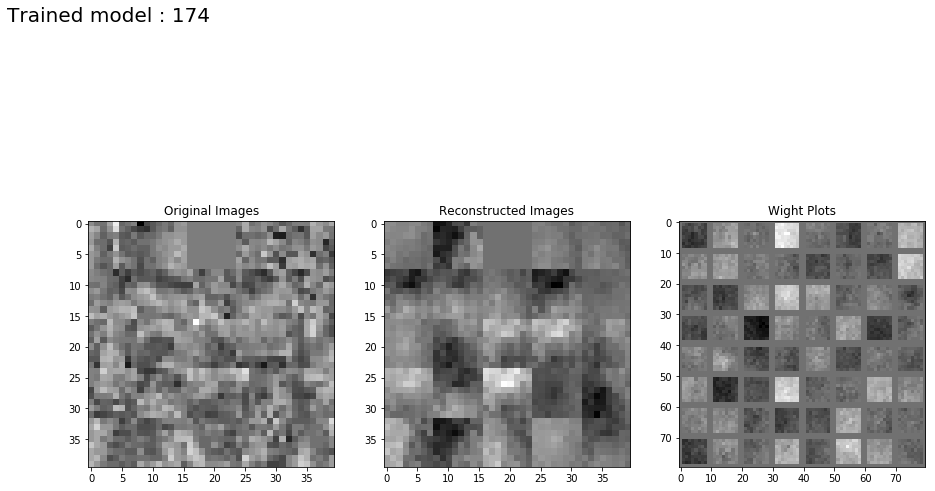

Step 1: Minibatch Loss: 0.023046 Error: 0.015262 Sparse: 0.007784
Step 100: Minibatch Loss: 0.016091 Error: 0.015420 Sparse: 0.000670
Step 200: Minibatch Loss: 0.016127 Error: 0.015452 Sparse: 0.000676
Step 300: Minibatch Loss: 0.015969 Error: 0.015311 Sparse: 0.000658
Step 400: Minibatch Loss: 0.016001 Error: 0.015421 Sparse: 0.000581
Step 500: Minibatch Loss: 0.015938 Error: 0.015358 Sparse: 0.000579
Step 600: Minibatch Loss: 0.015994 Error: 0.015342 Sparse: 0.000651
Step 700: Minibatch Loss: 0.016037 Error: 0.015405 Sparse: 0.000632
Step 800: Minibatch Loss: 0.015918 Error: 0.015343 Sparse: 0.000576
Step 900: Minibatch Loss: 0.016009 Error: 0.015405 Sparse: 0.000604
Step 1000: Minibatch Loss: 0.015996 Error: 0.015389 Sparse: 0.000606
Step 1100: Minibatch Loss: 0.016215 Error: 0.015514 Sparse: 0.000701
Step 1200: Minibatch Loss: 0.016079 Error: 0.015452 Sparse: 0.000627
Step 1300: Minibatch Loss: 0.015989 Error: 0.015311 Sparse: 0.000678
Step 1400: Minibatch Loss: 0.015931 Error: 0.0

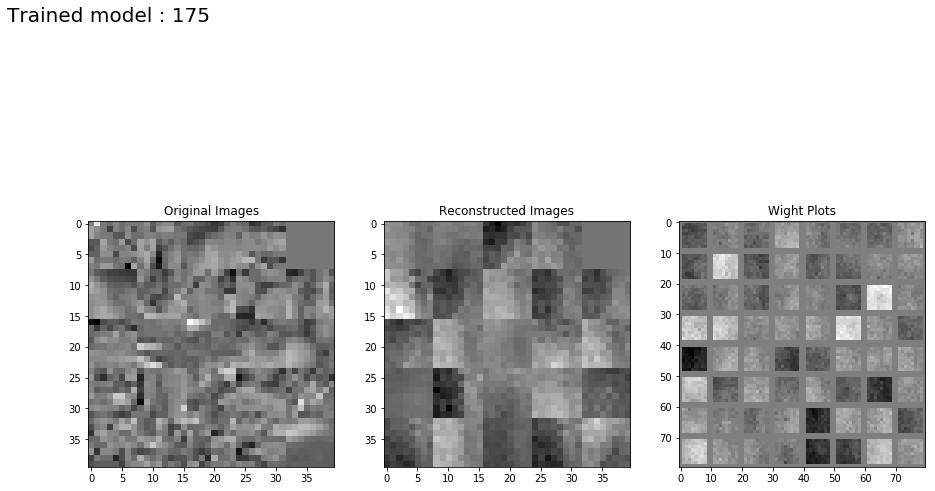

Step 1: Minibatch Loss: 0.015268 Error: 0.015267 Sparse: 0.007673
Step 100: Minibatch Loss: 0.000012 Error: 0.000002 Sparse: 0.096896
Step 200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097090
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096768
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097019
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096955
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096477
Step 700: Minibatch Loss: 0.000049 Error: 0.000039 Sparse: 0.095622
Step 800: Minibatch Loss: 0.000009 Error: 0.000000 Sparse: 0.093882
Step 900: Minibatch Loss: 0.000009 Error: 0.000000 Sparse: 0.094234
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.093112


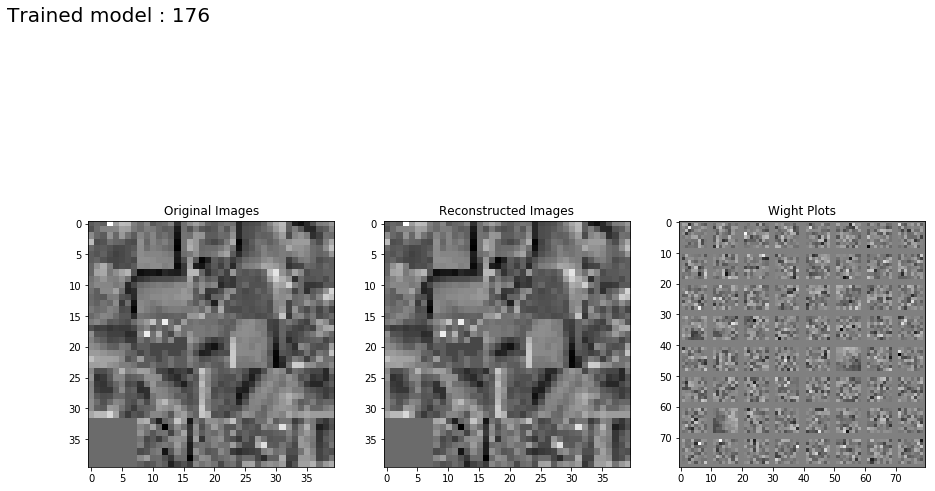

Step 1: Minibatch Loss: 0.015151 Error: 0.015143 Sparse: 0.007936
Step 100: Minibatch Loss: 0.000155 Error: 0.000058 Sparse: 0.096728
Step 200: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096588
Step 300: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096247
Step 400: Minibatch Loss: 0.000095 Error: 0.000000 Sparse: 0.095343
Step 500: Minibatch Loss: 0.000093 Error: 0.000000 Sparse: 0.093053
Step 600: Minibatch Loss: 0.000093 Error: 0.000000 Sparse: 0.093031
Step 700: Minibatch Loss: 0.000091 Error: 0.000000 Sparse: 0.091096
Step 800: Minibatch Loss: 0.000092 Error: 0.000000 Sparse: 0.091559
Step 900: Minibatch Loss: 0.000090 Error: 0.000000 Sparse: 0.089951
Step 1000: Minibatch Loss: 0.000089 Error: 0.000000 Sparse: 0.089334


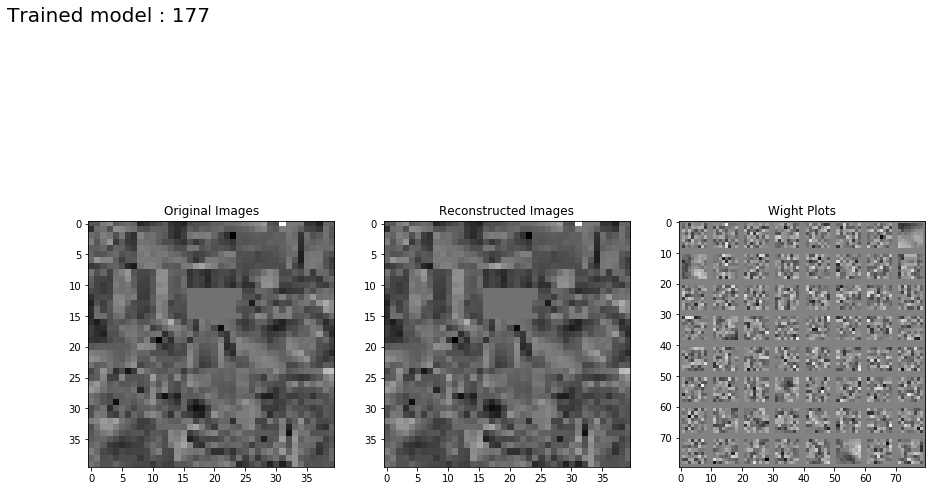

Step 1: Minibatch Loss: 0.015290 Error: 0.015212 Sparse: 0.007865
Step 100: Minibatch Loss: 0.000970 Error: 0.000021 Sparse: 0.094897
Step 200: Minibatch Loss: 0.000907 Error: 0.000004 Sparse: 0.090314
Step 300: Minibatch Loss: 0.000853 Error: 0.000004 Sparse: 0.084949
Step 400: Minibatch Loss: 0.000845 Error: 0.000004 Sparse: 0.084071
Step 500: Minibatch Loss: 0.000830 Error: 0.000004 Sparse: 0.082642
Step 600: Minibatch Loss: 0.000825 Error: 0.000004 Sparse: 0.082150
Step 700: Minibatch Loss: 0.000816 Error: 0.000004 Sparse: 0.081156
Step 800: Minibatch Loss: 0.000811 Error: 0.000010 Sparse: 0.080105
Step 900: Minibatch Loss: 0.000803 Error: 0.000005 Sparse: 0.079813
Step 1000: Minibatch Loss: 0.000785 Error: 0.000004 Sparse: 0.078071


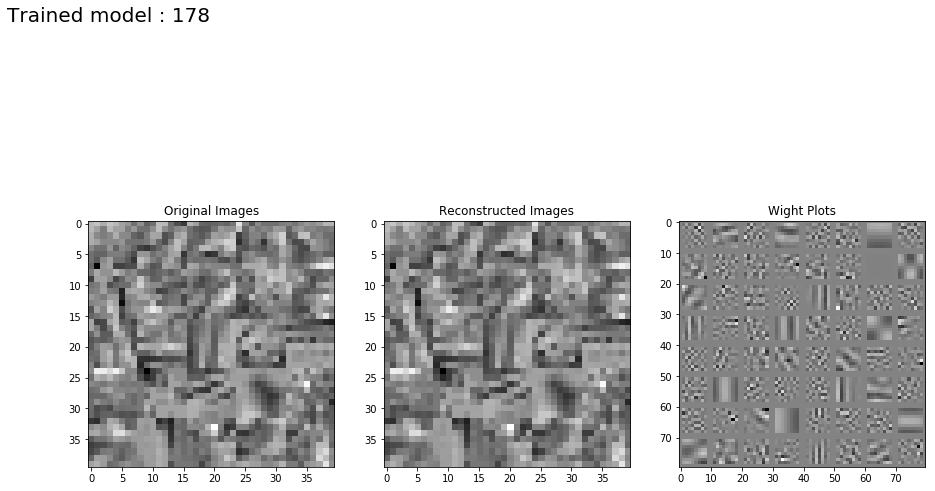

Step 1: Minibatch Loss: 0.015975 Error: 0.015199 Sparse: 0.007768
Step 100: Minibatch Loss: 0.007876 Error: 0.000694 Sparse: 0.071818
Step 200: Minibatch Loss: 0.007695 Error: 0.000644 Sparse: 0.070509
Step 300: Minibatch Loss: 0.007612 Error: 0.000634 Sparse: 0.069774
Step 400: Minibatch Loss: 0.007565 Error: 0.000633 Sparse: 0.069322
Step 500: Minibatch Loss: 0.007616 Error: 0.000662 Sparse: 0.069545
Step 600: Minibatch Loss: 0.007576 Error: 0.000638 Sparse: 0.069380
Step 700: Minibatch Loss: 0.007585 Error: 0.000639 Sparse: 0.069454
Step 800: Minibatch Loss: 0.007546 Error: 0.000635 Sparse: 0.069104
Step 900: Minibatch Loss: 0.007477 Error: 0.000611 Sparse: 0.068654
Step 1000: Minibatch Loss: 0.007581 Error: 0.000624 Sparse: 0.069569


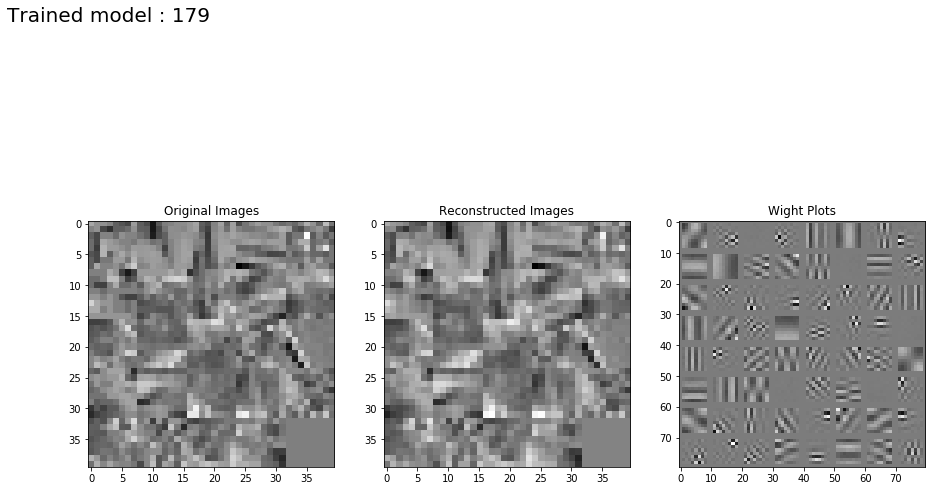

Step 1: Minibatch Loss: 0.023406 Error: 0.015276 Sparse: 0.008130
Step 100: Minibatch Loss: 0.022087 Error: 0.015216 Sparse: 0.006871
Step 200: Minibatch Loss: 0.022230 Error: 0.015319 Sparse: 0.006912
Step 300: Minibatch Loss: 0.021589 Error: 0.015276 Sparse: 0.006313
Step 400: Minibatch Loss: 0.021734 Error: 0.015236 Sparse: 0.006498
Step 500: Minibatch Loss: 0.021702 Error: 0.015347 Sparse: 0.006355
Step 600: Minibatch Loss: 0.022180 Error: 0.015245 Sparse: 0.006935
Step 700: Minibatch Loss: 0.021899 Error: 0.015225 Sparse: 0.006674
Step 800: Minibatch Loss: 0.021653 Error: 0.015323 Sparse: 0.006329
Step 900: Minibatch Loss: 0.021020 Error: 0.015300 Sparse: 0.005721
Step 1000: Minibatch Loss: 0.022014 Error: 0.015375 Sparse: 0.006640


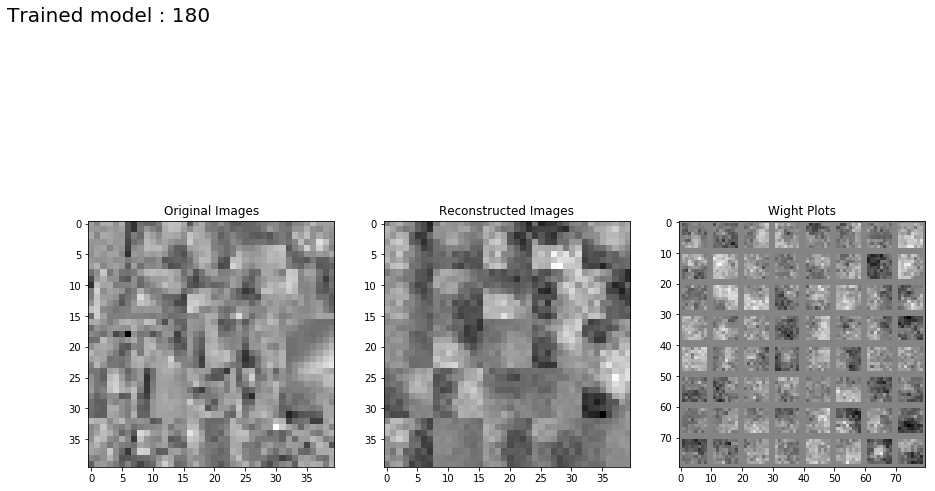

Step 1: Minibatch Loss: 0.015150 Error: 0.015149 Sparse: 0.007509
Step 100: Minibatch Loss: 0.000011 Error: 0.000001 Sparse: 0.097405
Step 200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097155
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096906
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096178
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096149
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096268
Step 700: Minibatch Loss: 0.003113 Error: 0.003103 Sparse: 0.100271
Step 800: Minibatch Loss: 0.000074 Error: 0.000064 Sparse: 0.097645
Step 900: Minibatch Loss: 0.000019 Error: 0.000009 Sparse: 0.098287
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097748
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098184
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097328
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098192
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

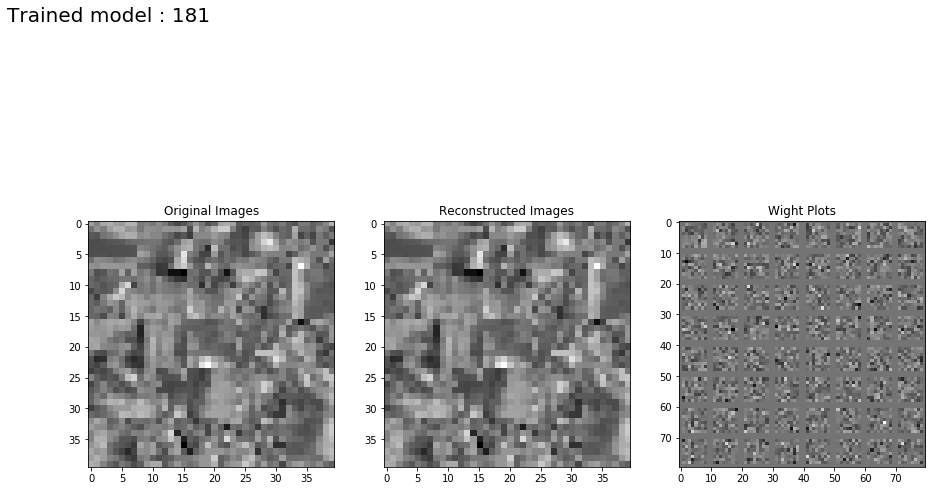

Step 1: Minibatch Loss: 0.015233 Error: 0.015225 Sparse: 0.007874
Step 100: Minibatch Loss: 0.000110 Error: 0.000012 Sparse: 0.098633
Step 200: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097324
Step 300: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096377
Step 400: Minibatch Loss: 0.000095 Error: 0.000000 Sparse: 0.095148
Step 500: Minibatch Loss: 0.000092 Error: 0.000000 Sparse: 0.092378
Step 600: Minibatch Loss: 0.000091 Error: 0.000000 Sparse: 0.090463
Step 700: Minibatch Loss: 0.000090 Error: 0.000000 Sparse: 0.090015
Step 800: Minibatch Loss: 0.000090 Error: 0.000000 Sparse: 0.089693
Step 900: Minibatch Loss: 0.000089 Error: 0.000000 Sparse: 0.088963
Step 1000: Minibatch Loss: 0.000089 Error: 0.000000 Sparse: 0.088586
Step 1100: Minibatch Loss: 0.000087 Error: 0.000001 Sparse: 0.086933
Step 1200: Minibatch Loss: 0.000087 Error: 0.000001 Sparse: 0.086438
Step 1300: Minibatch Loss: 0.000088 Error: 0.000001 Sparse: 0.086519
Step 1400: Minibatch Loss: 0.000086 Error: 0.0

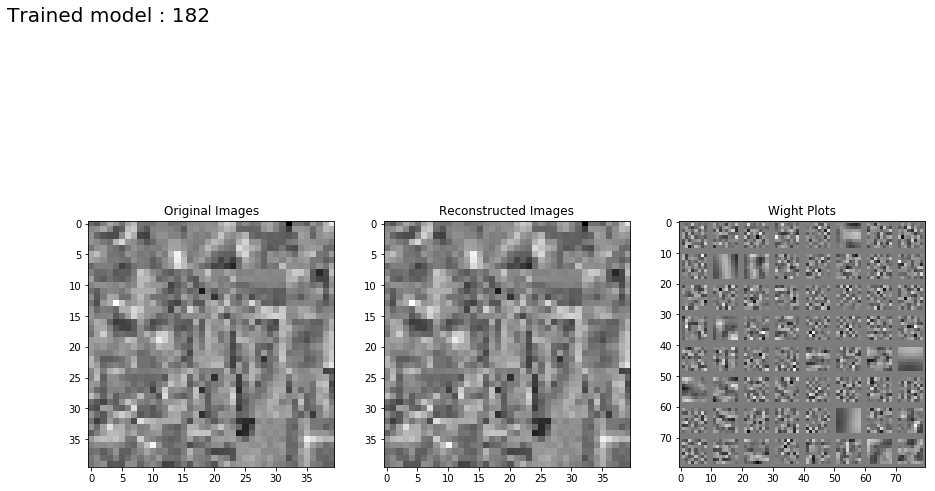

Step 1: Minibatch Loss: 0.015357 Error: 0.015280 Sparse: 0.007769
Step 100: Minibatch Loss: 0.000975 Error: 0.000046 Sparse: 0.092958
Step 200: Minibatch Loss: 0.000899 Error: 0.000004 Sparse: 0.089500
Step 300: Minibatch Loss: 0.000857 Error: 0.000004 Sparse: 0.085358
Step 400: Minibatch Loss: 0.000844 Error: 0.000004 Sparse: 0.083964
Step 500: Minibatch Loss: 0.000843 Error: 0.000004 Sparse: 0.083884
Step 600: Minibatch Loss: 0.000822 Error: 0.000004 Sparse: 0.081816
Step 700: Minibatch Loss: 0.000823 Error: 0.000004 Sparse: 0.081932
Step 800: Minibatch Loss: 0.000814 Error: 0.000004 Sparse: 0.081039
Step 900: Minibatch Loss: 0.000805 Error: 0.000004 Sparse: 0.080152
Step 1000: Minibatch Loss: 0.000809 Error: 0.000004 Sparse: 0.080448
Step 1100: Minibatch Loss: 0.000802 Error: 0.000006 Sparse: 0.079613
Step 1200: Minibatch Loss: 0.000795 Error: 0.000004 Sparse: 0.079021
Step 1300: Minibatch Loss: 0.000795 Error: 0.000004 Sparse: 0.079059
Step 1400: Minibatch Loss: 0.000823 Error: 0.0

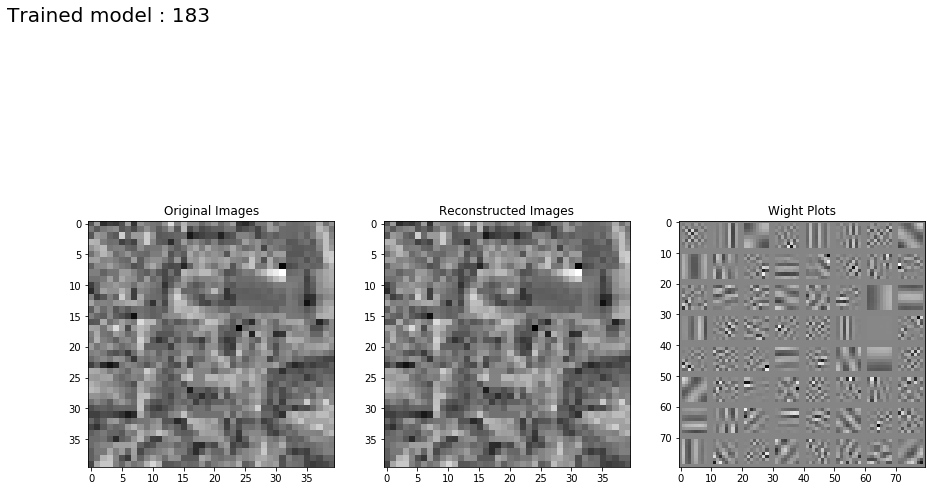

Step 1: Minibatch Loss: 0.015941 Error: 0.015172 Sparse: 0.007692
Step 100: Minibatch Loss: 0.007883 Error: 0.000751 Sparse: 0.071320
Step 200: Minibatch Loss: 0.007656 Error: 0.000690 Sparse: 0.069665
Step 300: Minibatch Loss: 0.007642 Error: 0.000694 Sparse: 0.069473
Step 400: Minibatch Loss: 0.007536 Error: 0.000685 Sparse: 0.068512
Step 500: Minibatch Loss: 0.007610 Error: 0.000687 Sparse: 0.069230
Step 600: Minibatch Loss: 0.007579 Error: 0.000666 Sparse: 0.069129
Step 700: Minibatch Loss: 0.007639 Error: 0.000692 Sparse: 0.069472
Step 800: Minibatch Loss: 0.007589 Error: 0.000672 Sparse: 0.069173
Step 900: Minibatch Loss: 0.007516 Error: 0.000684 Sparse: 0.068324
Step 1000: Minibatch Loss: 0.007554 Error: 0.000676 Sparse: 0.068777
Step 1100: Minibatch Loss: 0.007538 Error: 0.000705 Sparse: 0.068331
Step 1200: Minibatch Loss: 0.007548 Error: 0.000678 Sparse: 0.068695
Step 1300: Minibatch Loss: 0.007530 Error: 0.000712 Sparse: 0.068181
Step 1400: Minibatch Loss: 0.007543 Error: 0.0

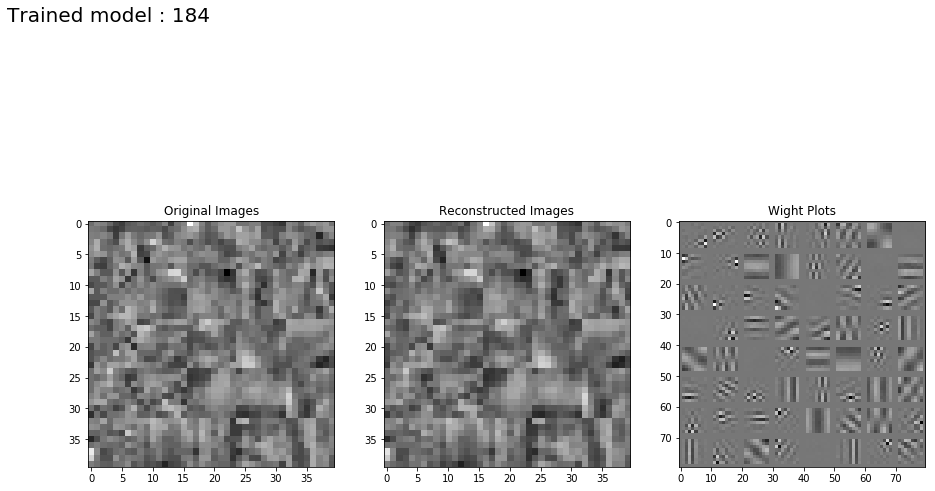

Step 1: Minibatch Loss: 0.022806 Error: 0.015209 Sparse: 0.007597
Step 100: Minibatch Loss: 0.022427 Error: 0.015279 Sparse: 0.007147
Step 200: Minibatch Loss: 0.022167 Error: 0.015296 Sparse: 0.006872
Step 300: Minibatch Loss: 0.022382 Error: 0.015388 Sparse: 0.006994
Step 400: Minibatch Loss: 0.022442 Error: 0.015198 Sparse: 0.007244
Step 500: Minibatch Loss: 0.022380 Error: 0.015276 Sparse: 0.007105
Step 600: Minibatch Loss: 0.021453 Error: 0.015215 Sparse: 0.006238
Step 700: Minibatch Loss: 0.022088 Error: 0.015257 Sparse: 0.006831
Step 800: Minibatch Loss: 0.021205 Error: 0.015269 Sparse: 0.005936
Step 900: Minibatch Loss: 0.021987 Error: 0.015281 Sparse: 0.006706
Step 1000: Minibatch Loss: 0.021443 Error: 0.015352 Sparse: 0.006091
Step 1100: Minibatch Loss: 0.021664 Error: 0.015204 Sparse: 0.006460
Step 1200: Minibatch Loss: 0.021589 Error: 0.015347 Sparse: 0.006242
Step 1300: Minibatch Loss: 0.021326 Error: 0.015253 Sparse: 0.006072
Step 1400: Minibatch Loss: 0.022475 Error: 0.0

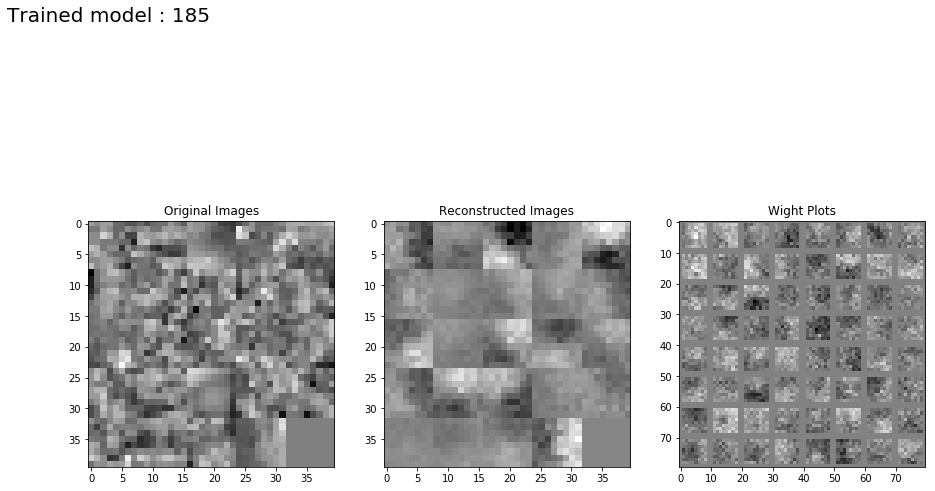

Step 1: Minibatch Loss: 0.015284 Error: 0.015283 Sparse: 0.007670
Step 100: Minibatch Loss: 0.000014 Error: 0.000004 Sparse: 0.097520
Step 200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098576
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097362
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097003
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096720
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097393
Step 700: Minibatch Loss: 0.000028 Error: 0.000018 Sparse: 0.097262
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.095976
Step 900: Minibatch Loss: 0.000034 Error: 0.000024 Sparse: 0.094776
Step 1000: Minibatch Loss: 0.000009 Error: 0.000000 Sparse: 0.093283
Step 1100: Minibatch Loss: 0.000009 Error: 0.000000 Sparse: 0.093229
Step 1200: Minibatch Loss: 0.000031 Error: 0.000022 Sparse: 0.092834
Step 1300: Minibatch Loss: 0.000009 Error: 0.000000 Sparse: 0.092703
Step 1400: Minibatch Loss: 0.000018 Error: 0.0

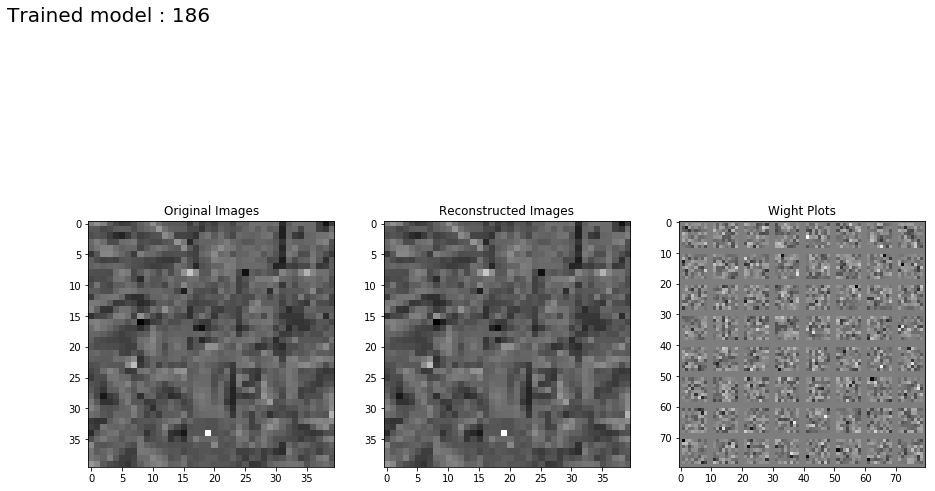

Step 1: Minibatch Loss: 0.015264 Error: 0.015257 Sparse: 0.007892
Step 100: Minibatch Loss: 0.000100 Error: 0.000002 Sparse: 0.098104
Step 200: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096946
Step 300: Minibatch Loss: 0.000095 Error: 0.000000 Sparse: 0.094509
Step 400: Minibatch Loss: 0.000093 Error: 0.000000 Sparse: 0.093100
Step 500: Minibatch Loss: 0.000092 Error: 0.000000 Sparse: 0.091879
Step 600: Minibatch Loss: 0.000104 Error: 0.000015 Sparse: 0.089566
Step 700: Minibatch Loss: 0.000090 Error: 0.000001 Sparse: 0.088579
Step 800: Minibatch Loss: 0.000090 Error: 0.000001 Sparse: 0.088702
Step 900: Minibatch Loss: 0.000100 Error: 0.000013 Sparse: 0.087206
Step 1000: Minibatch Loss: 0.000086 Error: 0.000000 Sparse: 0.085575
Step 1100: Minibatch Loss: 0.000105 Error: 0.000019 Sparse: 0.085539
Step 1200: Minibatch Loss: 0.000085 Error: 0.000000 Sparse: 0.085403
Step 1300: Minibatch Loss: 0.000092 Error: 0.000008 Sparse: 0.084225
Step 1400: Minibatch Loss: 0.000086 Error: 0.0

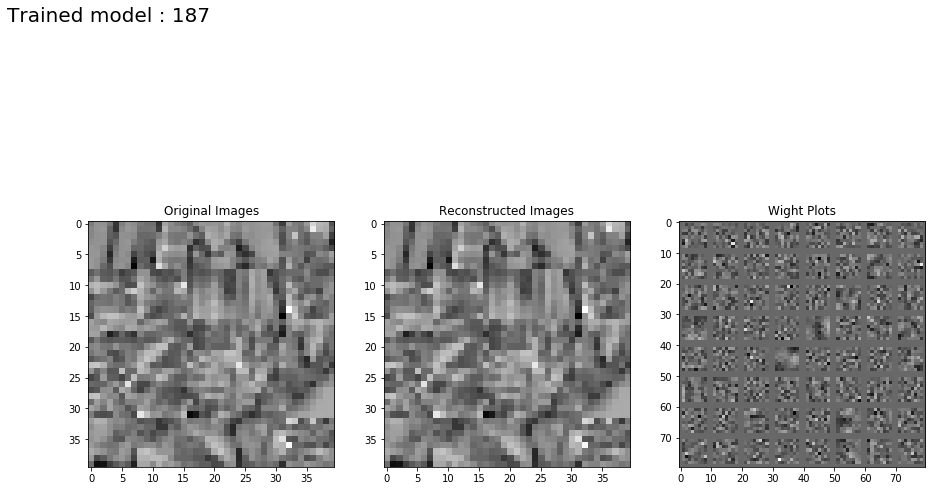

Step 1: Minibatch Loss: 0.015380 Error: 0.015300 Sparse: 0.007969
Step 100: Minibatch Loss: 0.000923 Error: 0.000006 Sparse: 0.091648
Step 200: Minibatch Loss: 0.000876 Error: 0.000004 Sparse: 0.087195
Step 300: Minibatch Loss: 0.000842 Error: 0.000004 Sparse: 0.083790
Step 400: Minibatch Loss: 0.000828 Error: 0.000004 Sparse: 0.082371
Step 500: Minibatch Loss: 0.000810 Error: 0.000004 Sparse: 0.080647
Step 600: Minibatch Loss: 0.000802 Error: 0.000004 Sparse: 0.079761
Step 700: Minibatch Loss: 0.000800 Error: 0.000004 Sparse: 0.079627
Step 800: Minibatch Loss: 0.000797 Error: 0.000007 Sparse: 0.078996
Step 900: Minibatch Loss: 0.000787 Error: 0.000005 Sparse: 0.078233
Step 1000: Minibatch Loss: 0.000796 Error: 0.000005 Sparse: 0.079039
Step 1100: Minibatch Loss: 0.000793 Error: 0.000007 Sparse: 0.078601
Step 1200: Minibatch Loss: 0.000793 Error: 0.000005 Sparse: 0.078749
Step 1300: Minibatch Loss: 0.000796 Error: 0.000009 Sparse: 0.078785
Step 1400: Minibatch Loss: 0.000807 Error: 0.0

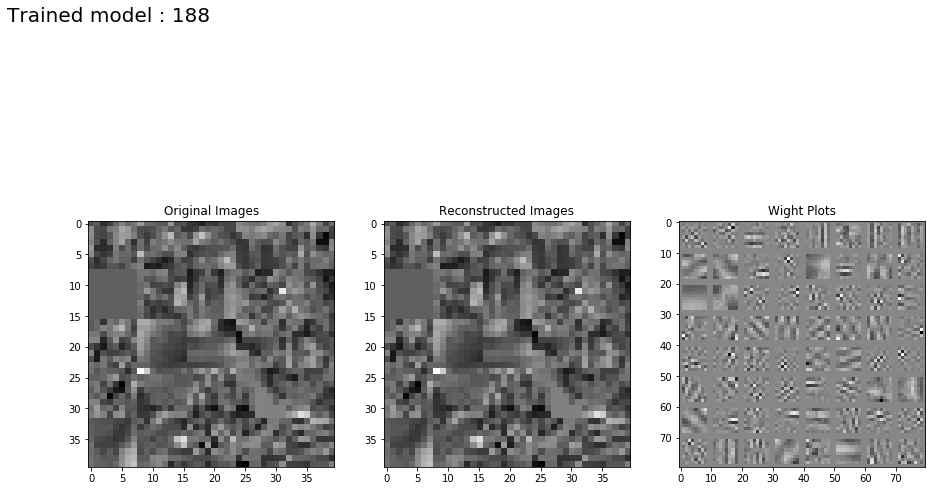

Step 1: Minibatch Loss: 0.016021 Error: 0.015220 Sparse: 0.008015
Step 100: Minibatch Loss: 0.007984 Error: 0.000759 Sparse: 0.072253
Step 200: Minibatch Loss: 0.007618 Error: 0.000667 Sparse: 0.069507
Step 300: Minibatch Loss: 0.007611 Error: 0.000680 Sparse: 0.069305
Step 400: Minibatch Loss: 0.007570 Error: 0.000676 Sparse: 0.068936
Step 500: Minibatch Loss: 0.007512 Error: 0.000669 Sparse: 0.068431
Step 600: Minibatch Loss: 0.007505 Error: 0.000666 Sparse: 0.068398
Step 700: Minibatch Loss: 0.007587 Error: 0.000668 Sparse: 0.069191
Step 800: Minibatch Loss: 0.007450 Error: 0.000667 Sparse: 0.067836
Step 900: Minibatch Loss: 0.007493 Error: 0.000676 Sparse: 0.068172
Step 1000: Minibatch Loss: 0.007492 Error: 0.000661 Sparse: 0.068316
Step 1100: Minibatch Loss: 0.007643 Error: 0.000712 Sparse: 0.069313
Step 1200: Minibatch Loss: 0.007570 Error: 0.000704 Sparse: 0.068653
Step 1300: Minibatch Loss: 0.007534 Error: 0.000671 Sparse: 0.068624
Step 1400: Minibatch Loss: 0.007570 Error: 0.0

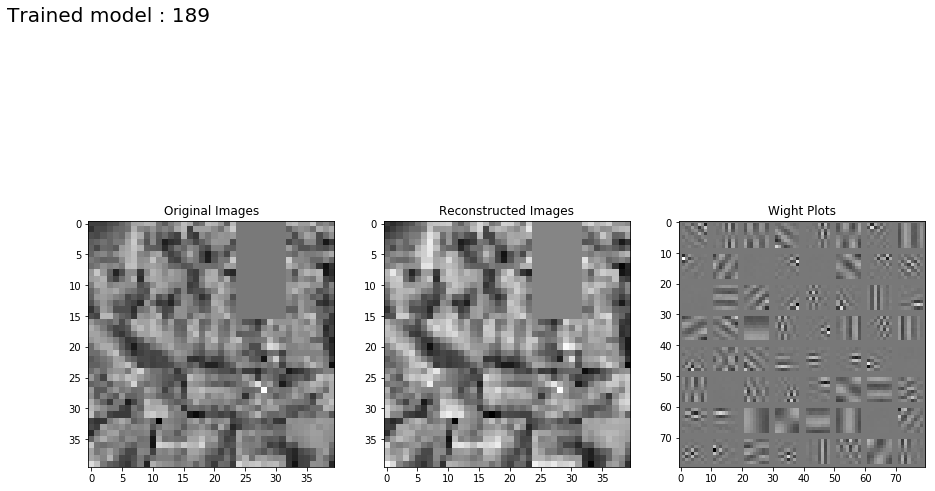

Step 1: Minibatch Loss: 0.022922 Error: 0.015169 Sparse: 0.007754
Step 100: Minibatch Loss: 0.021497 Error: 0.015326 Sparse: 0.006171
Step 200: Minibatch Loss: 0.021377 Error: 0.015202 Sparse: 0.006175
Step 300: Minibatch Loss: 0.021997 Error: 0.015289 Sparse: 0.006708
Step 400: Minibatch Loss: 0.022019 Error: 0.015312 Sparse: 0.006707
Step 500: Minibatch Loss: 0.022085 Error: 0.015321 Sparse: 0.006765
Step 600: Minibatch Loss: 0.021667 Error: 0.015337 Sparse: 0.006330
Step 700: Minibatch Loss: 0.021476 Error: 0.015241 Sparse: 0.006235
Step 800: Minibatch Loss: 0.021891 Error: 0.015192 Sparse: 0.006698
Step 900: Minibatch Loss: 0.021160 Error: 0.015236 Sparse: 0.005924
Step 1000: Minibatch Loss: 0.021744 Error: 0.015303 Sparse: 0.006441
Step 1100: Minibatch Loss: 0.022084 Error: 0.015268 Sparse: 0.006816
Step 1200: Minibatch Loss: 0.021310 Error: 0.015227 Sparse: 0.006083
Step 1300: Minibatch Loss: 0.021943 Error: 0.015240 Sparse: 0.006702
Step 1400: Minibatch Loss: 0.022119 Error: 0.0

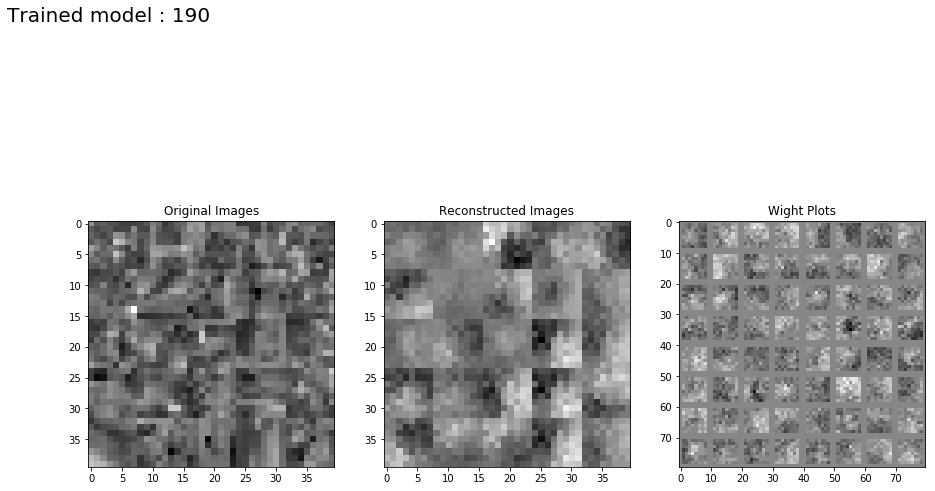

Step 1: Minibatch Loss: 0.015231 Error: 0.015230 Sparse: 0.007813
Step 100: Minibatch Loss: 0.000093 Error: 0.000083 Sparse: 0.096374
Step 200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097345
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096587
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096384
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096340
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096196
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096451
Step 800: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.095904
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.095710
Step 1000: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.095119
Step 1100: Minibatch Loss: 0.000009 Error: 0.000000 Sparse: 0.094518
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.095102
Step 1300: Minibatch Loss: 0.000009 Error: 0.000000 Sparse: 0.094501
Step 1400: Minibatch Loss: 0.000009 Error: 0.0

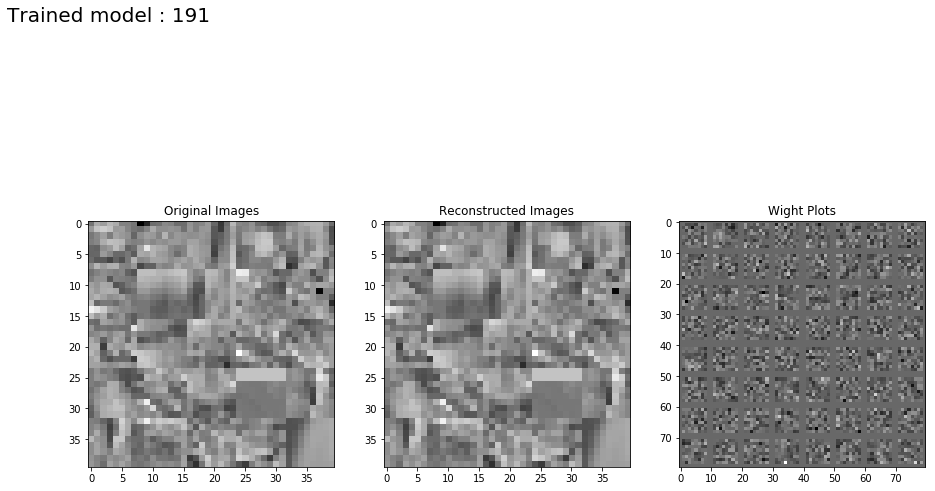

Step 1: Minibatch Loss: 0.015082 Error: 0.015074 Sparse: 0.007700
Step 100: Minibatch Loss: 0.000114 Error: 0.000016 Sparse: 0.097904
Step 200: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.097850
Step 300: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.096923
Step 400: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096331
Step 500: Minibatch Loss: 0.000096 Error: 0.000000 Sparse: 0.096011
Step 600: Minibatch Loss: 0.000094 Error: 0.000000 Sparse: 0.093958
Step 700: Minibatch Loss: 0.000092 Error: 0.000000 Sparse: 0.092023
Step 800: Minibatch Loss: 0.000090 Error: 0.000000 Sparse: 0.090126
Step 900: Minibatch Loss: 0.000090 Error: 0.000001 Sparse: 0.089534
Step 1000: Minibatch Loss: 0.000088 Error: 0.000001 Sparse: 0.087708
Step 1100: Minibatch Loss: 0.000090 Error: 0.000003 Sparse: 0.087223
Step 1200: Minibatch Loss: 0.000086 Error: 0.000000 Sparse: 0.085935
Step 1300: Minibatch Loss: 0.000086 Error: 0.000000 Sparse: 0.086008
Step 1400: Minibatch Loss: 0.000085 Error: 0.0

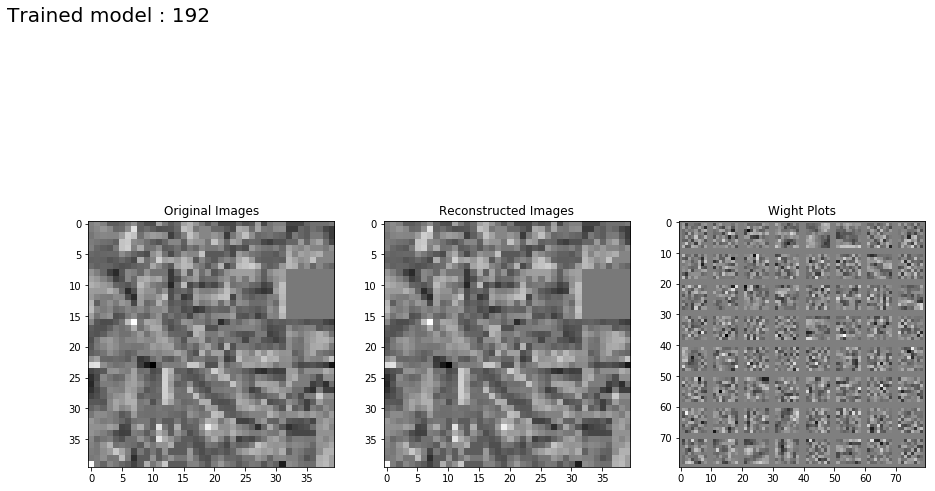

Step 1: Minibatch Loss: 0.015307 Error: 0.015229 Sparse: 0.007843
Step 100: Minibatch Loss: 0.000996 Error: 0.000064 Sparse: 0.093206
Step 200: Minibatch Loss: 0.000907 Error: 0.000004 Sparse: 0.090347
Step 300: Minibatch Loss: 0.000873 Error: 0.000004 Sparse: 0.086900
Step 400: Minibatch Loss: 0.000851 Error: 0.000004 Sparse: 0.084756
Step 500: Minibatch Loss: 0.000835 Error: 0.000004 Sparse: 0.083092
Step 600: Minibatch Loss: 0.000833 Error: 0.000004 Sparse: 0.082928
Step 700: Minibatch Loss: 0.000818 Error: 0.000004 Sparse: 0.081459
Step 800: Minibatch Loss: 0.000821 Error: 0.000004 Sparse: 0.081731
Step 900: Minibatch Loss: 0.000803 Error: 0.000004 Sparse: 0.079929
Step 1000: Minibatch Loss: 0.000812 Error: 0.000004 Sparse: 0.080801
Step 1100: Minibatch Loss: 0.000804 Error: 0.000004 Sparse: 0.079979
Step 1200: Minibatch Loss: 0.000809 Error: 0.000004 Sparse: 0.080507
Step 1300: Minibatch Loss: 0.000797 Error: 0.000004 Sparse: 0.079360
Step 1400: Minibatch Loss: 0.000786 Error: 0.0

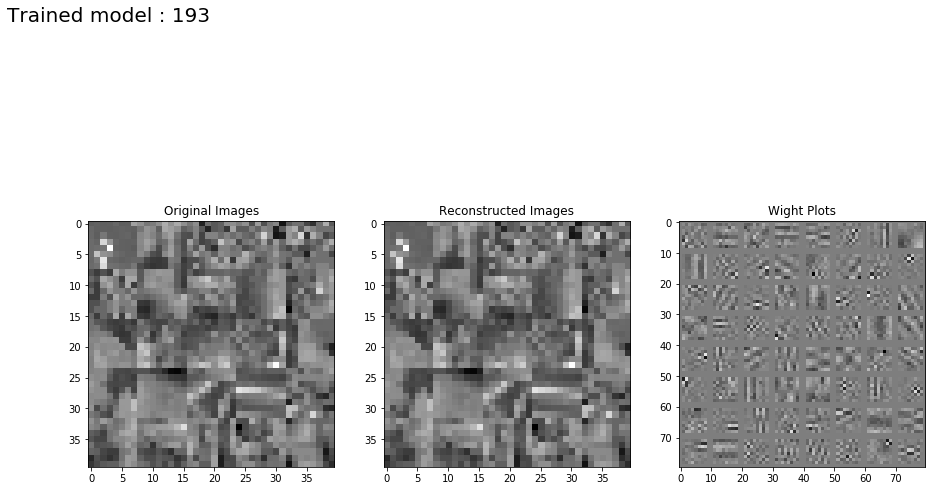

Step 1: Minibatch Loss: 0.015949 Error: 0.015161 Sparse: 0.007881
Step 100: Minibatch Loss: 0.007894 Error: 0.000629 Sparse: 0.072646
Step 200: Minibatch Loss: 0.007671 Error: 0.000543 Sparse: 0.071275
Step 300: Minibatch Loss: 0.007629 Error: 0.000558 Sparse: 0.070712
Step 400: Minibatch Loss: 0.007620 Error: 0.000558 Sparse: 0.070614
Step 500: Minibatch Loss: 0.007562 Error: 0.000535 Sparse: 0.070265
Step 600: Minibatch Loss: 0.007535 Error: 0.000551 Sparse: 0.069846
Step 700: Minibatch Loss: 0.007580 Error: 0.000548 Sparse: 0.070320
Step 800: Minibatch Loss: 0.007548 Error: 0.000580 Sparse: 0.069683
Step 900: Minibatch Loss: 0.007611 Error: 0.000563 Sparse: 0.070474
Step 1000: Minibatch Loss: 0.007500 Error: 0.000545 Sparse: 0.069547
Step 1100: Minibatch Loss: 0.007579 Error: 0.000561 Sparse: 0.070177
Step 1200: Minibatch Loss: 0.007504 Error: 0.000533 Sparse: 0.069708
Step 1300: Minibatch Loss: 0.007495 Error: 0.000559 Sparse: 0.069367
Step 1400: Minibatch Loss: 0.007558 Error: 0.0

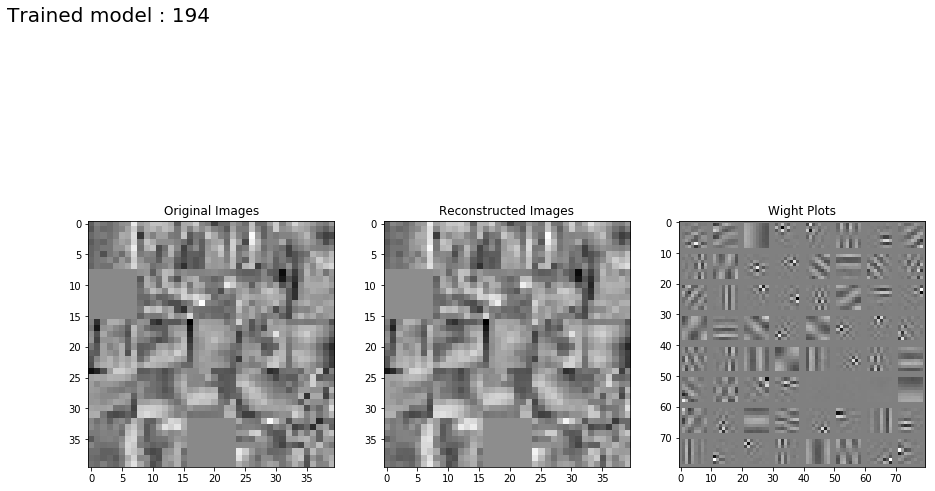

Step 1: Minibatch Loss: 0.023153 Error: 0.015157 Sparse: 0.007996
Step 100: Minibatch Loss: 0.022313 Error: 0.015260 Sparse: 0.007052
Step 200: Minibatch Loss: 0.021611 Error: 0.015273 Sparse: 0.006338
Step 300: Minibatch Loss: 0.021157 Error: 0.015407 Sparse: 0.005751
Step 400: Minibatch Loss: 0.021546 Error: 0.015407 Sparse: 0.006139
Step 500: Minibatch Loss: 0.021481 Error: 0.015284 Sparse: 0.006198
Step 600: Minibatch Loss: 0.022116 Error: 0.015267 Sparse: 0.006848
Step 700: Minibatch Loss: 0.022176 Error: 0.015260 Sparse: 0.006916
Step 800: Minibatch Loss: 0.021462 Error: 0.015244 Sparse: 0.006217
Step 900: Minibatch Loss: 0.021562 Error: 0.015239 Sparse: 0.006323
Step 1000: Minibatch Loss: 0.021795 Error: 0.015256 Sparse: 0.006539
Step 1100: Minibatch Loss: 0.021500 Error: 0.015395 Sparse: 0.006105
Step 1200: Minibatch Loss: 0.021711 Error: 0.015255 Sparse: 0.006456
Step 1300: Minibatch Loss: 0.021904 Error: 0.015209 Sparse: 0.006696
Step 1400: Minibatch Loss: 0.021583 Error: 0.0

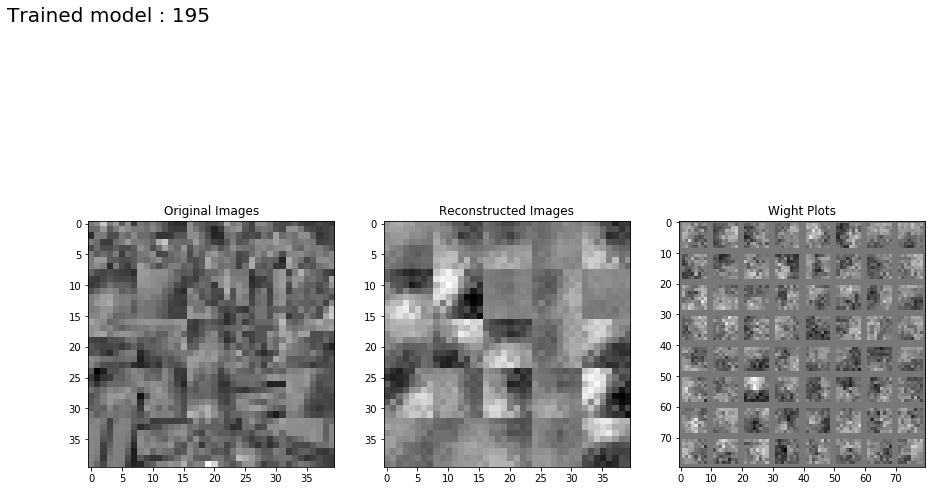

Step 1: Minibatch Loss: 0.015250 Error: 0.015249 Sparse: 0.008103
Step 100: Minibatch Loss: 0.000017 Error: 0.000007 Sparse: 0.098261
Step 200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098661
Step 300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097847
Step 400: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098060
Step 500: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097937
Step 600: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097684
Step 700: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097503
Step 800: Minibatch Loss: 0.000012 Error: 0.000002 Sparse: 0.098288
Step 900: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.096955
Step 1000: Minibatch Loss: 0.000026 Error: 0.000016 Sparse: 0.096688
Step 1100: Minibatch Loss: 0.000014 Error: 0.000004 Sparse: 0.095579
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.094224
Step 1300: Minibatch Loss: 0.000121 Error: 0.000111 Sparse: 0.095315
Step 1400: Minibatch Loss: 0.000009 Error: 0.0

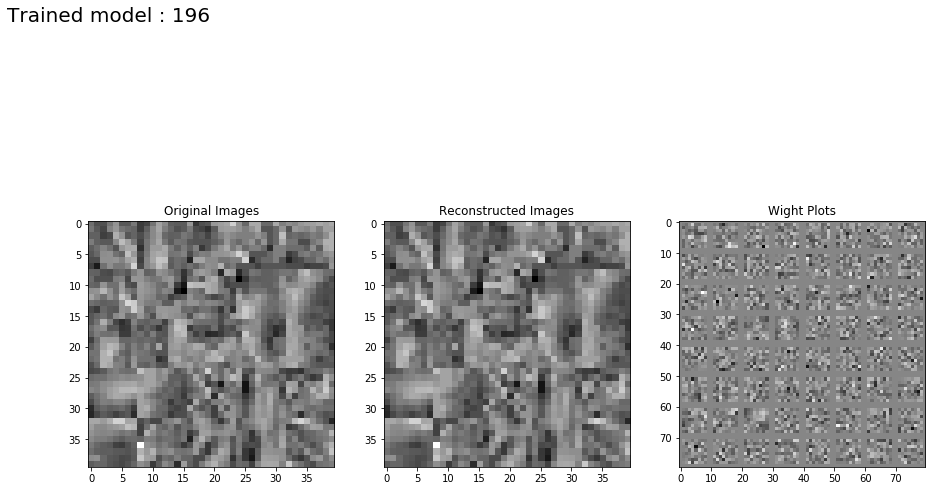

Step 1: Minibatch Loss: 0.015275 Error: 0.015267 Sparse: 0.008007
Step 100: Minibatch Loss: 0.000100 Error: 0.000002 Sparse: 0.097992
Step 200: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097280
Step 300: Minibatch Loss: 0.000095 Error: 0.000000 Sparse: 0.095419
Step 400: Minibatch Loss: 0.000093 Error: 0.000000 Sparse: 0.093138
Step 500: Minibatch Loss: 0.000092 Error: 0.000000 Sparse: 0.091655
Step 600: Minibatch Loss: 0.000091 Error: 0.000000 Sparse: 0.090664
Step 700: Minibatch Loss: 0.000090 Error: 0.000001 Sparse: 0.089180
Step 800: Minibatch Loss: 0.000088 Error: 0.000001 Sparse: 0.087324
Step 900: Minibatch Loss: 0.000089 Error: 0.000002 Sparse: 0.087254
Step 1000: Minibatch Loss: 0.000088 Error: 0.000001 Sparse: 0.086821
Step 1100: Minibatch Loss: 0.000088 Error: 0.000002 Sparse: 0.085597
Step 1200: Minibatch Loss: 0.000090 Error: 0.000006 Sparse: 0.084583
Step 1300: Minibatch Loss: 0.000086 Error: 0.000003 Sparse: 0.083183
Step 1400: Minibatch Loss: 0.000108 Error: 0.0

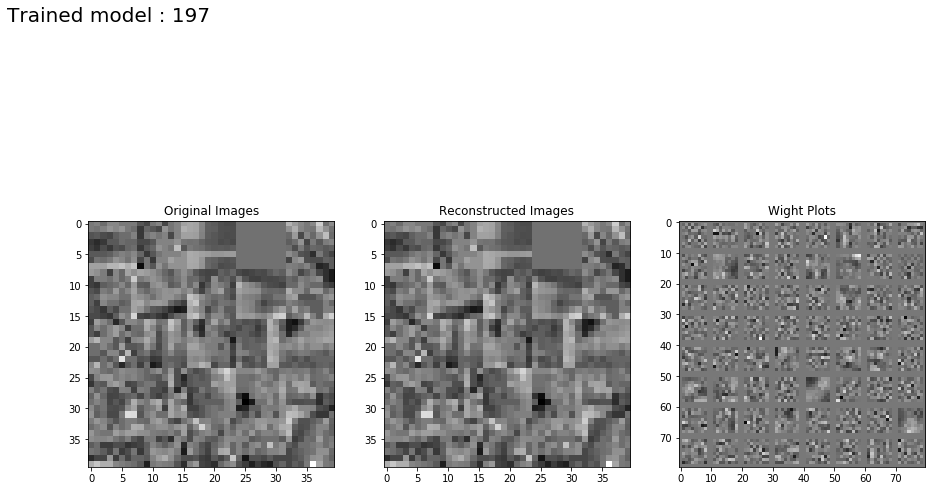

Step 1: Minibatch Loss: 0.015288 Error: 0.015213 Sparse: 0.007468
Step 100: Minibatch Loss: 0.000931 Error: 0.000006 Sparse: 0.092446
Step 200: Minibatch Loss: 0.000883 Error: 0.000004 Sparse: 0.087869
Step 300: Minibatch Loss: 0.000842 Error: 0.000004 Sparse: 0.083786
Step 400: Minibatch Loss: 0.000823 Error: 0.000004 Sparse: 0.081889
Step 500: Minibatch Loss: 0.000831 Error: 0.000004 Sparse: 0.082681
Step 600: Minibatch Loss: 0.000817 Error: 0.000004 Sparse: 0.081329
Step 700: Minibatch Loss: 0.000817 Error: 0.000004 Sparse: 0.081319
Step 800: Minibatch Loss: 0.000802 Error: 0.000004 Sparse: 0.079828
Step 900: Minibatch Loss: 0.000795 Error: 0.000004 Sparse: 0.079092
Step 1000: Minibatch Loss: 0.000796 Error: 0.000004 Sparse: 0.079172
Step 1100: Minibatch Loss: 0.000797 Error: 0.000011 Sparse: 0.078602
Step 1200: Minibatch Loss: 0.000783 Error: 0.000005 Sparse: 0.077850
Step 1300: Minibatch Loss: 0.000788 Error: 0.000009 Sparse: 0.077846
Step 1400: Minibatch Loss: 0.000796 Error: 0.0

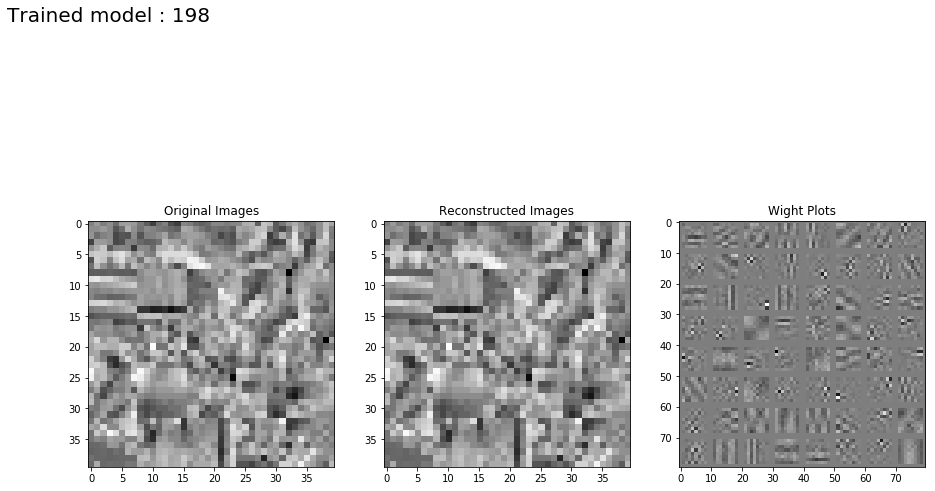

Step 1: Minibatch Loss: 0.016032 Error: 0.015237 Sparse: 0.007948
Step 100: Minibatch Loss: 0.007759 Error: 0.000490 Sparse: 0.072691
Step 200: Minibatch Loss: 0.007551 Error: 0.000469 Sparse: 0.070820
Step 300: Minibatch Loss: 0.007569 Error: 0.000470 Sparse: 0.070989
Step 400: Minibatch Loss: 0.007511 Error: 0.000462 Sparse: 0.070496
Step 500: Minibatch Loss: 0.007549 Error: 0.000481 Sparse: 0.070680
Step 600: Minibatch Loss: 0.007624 Error: 0.000482 Sparse: 0.071420
Step 700: Minibatch Loss: 0.007481 Error: 0.000479 Sparse: 0.070023
Step 800: Minibatch Loss: 0.007603 Error: 0.000481 Sparse: 0.071221
Step 900: Minibatch Loss: 0.007608 Error: 0.000489 Sparse: 0.071199
Step 1000: Minibatch Loss: 0.007615 Error: 0.000503 Sparse: 0.071127
Step 1100: Minibatch Loss: 0.007608 Error: 0.000505 Sparse: 0.071026
Step 1200: Minibatch Loss: 0.007520 Error: 0.000476 Sparse: 0.070442
Step 1300: Minibatch Loss: 0.007641 Error: 0.000512 Sparse: 0.071290
Step 1400: Minibatch Loss: 0.007541 Error: 0.0

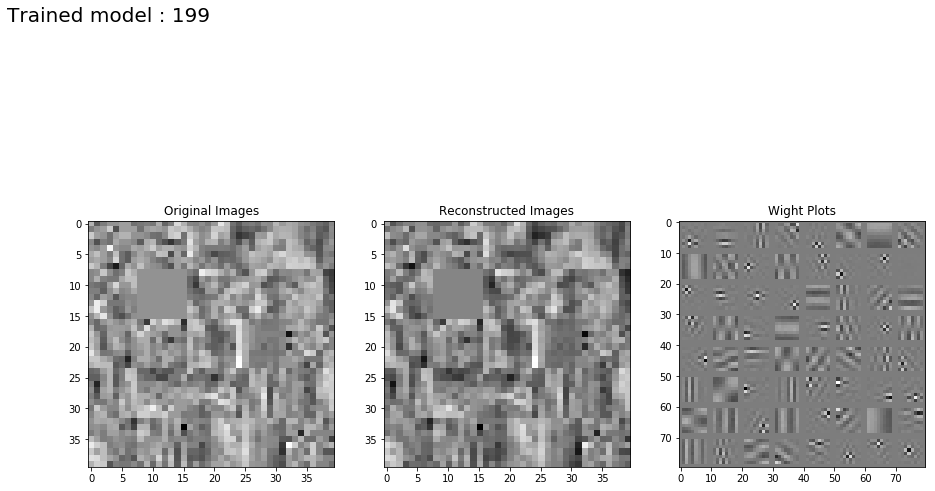

Step 1: Minibatch Loss: 0.022948 Error: 0.015252 Sparse: 0.007697
Step 100: Minibatch Loss: 0.022037 Error: 0.015250 Sparse: 0.006788
Step 200: Minibatch Loss: 0.022960 Error: 0.015328 Sparse: 0.007632
Step 300: Minibatch Loss: 0.021844 Error: 0.015358 Sparse: 0.006486
Step 400: Minibatch Loss: 0.021936 Error: 0.015057 Sparse: 0.006880
Step 500: Minibatch Loss: 0.021840 Error: 0.015347 Sparse: 0.006493
Step 600: Minibatch Loss: 0.022680 Error: 0.015241 Sparse: 0.007439
Step 700: Minibatch Loss: 0.021739 Error: 0.015318 Sparse: 0.006421
Step 800: Minibatch Loss: 0.021816 Error: 0.015347 Sparse: 0.006469
Step 900: Minibatch Loss: 0.021845 Error: 0.015317 Sparse: 0.006527
Step 1000: Minibatch Loss: 0.021733 Error: 0.015305 Sparse: 0.006428
Step 1100: Minibatch Loss: 0.021715 Error: 0.015367 Sparse: 0.006348
Step 1200: Minibatch Loss: 0.021806 Error: 0.015263 Sparse: 0.006543
Step 1300: Minibatch Loss: 0.022081 Error: 0.015284 Sparse: 0.006797
Step 1400: Minibatch Loss: 0.021353 Error: 0.0

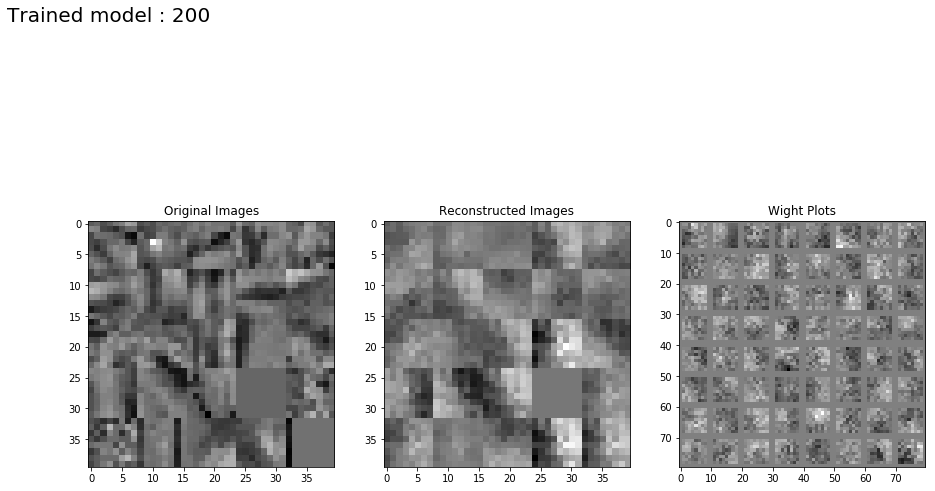

Step 1: Minibatch Loss: 0.015166 Error: 0.015165 Sparse: 0.007782
Step 100: Minibatch Loss: 0.004029 Error: 0.004019 Sparse: 0.093468
Step 200: Minibatch Loss: 0.001203 Error: 0.001193 Sparse: 0.096063
Step 300: Minibatch Loss: 0.000680 Error: 0.000670 Sparse: 0.096580
Step 400: Minibatch Loss: 0.000419 Error: 0.000409 Sparse: 0.097258
Step 500: Minibatch Loss: 0.000287 Error: 0.000277 Sparse: 0.097340
Step 600: Minibatch Loss: 0.000185 Error: 0.000176 Sparse: 0.098074
Step 700: Minibatch Loss: 0.000103 Error: 0.000093 Sparse: 0.098151
Step 800: Minibatch Loss: 0.000047 Error: 0.000037 Sparse: 0.098301
Step 900: Minibatch Loss: 0.000017 Error: 0.000007 Sparse: 0.099179
Step 1000: Minibatch Loss: 0.000011 Error: 0.000001 Sparse: 0.099376


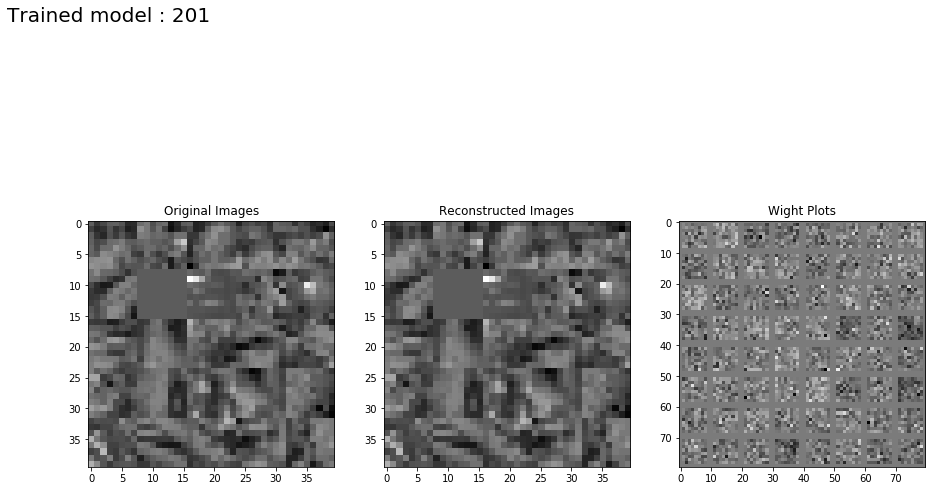

Step 1: Minibatch Loss: 0.015223 Error: 0.015215 Sparse: 0.007804
Step 100: Minibatch Loss: 0.007392 Error: 0.007294 Sparse: 0.098521
Step 200: Minibatch Loss: 0.001878 Error: 0.001782 Sparse: 0.096740
Step 300: Minibatch Loss: 0.001065 Error: 0.000968 Sparse: 0.096643
Step 400: Minibatch Loss: 0.000795 Error: 0.000699 Sparse: 0.096082
Step 500: Minibatch Loss: 0.000605 Error: 0.000509 Sparse: 0.095907
Step 600: Minibatch Loss: 0.000493 Error: 0.000396 Sparse: 0.096843
Step 700: Minibatch Loss: 0.000392 Error: 0.000296 Sparse: 0.096519
Step 800: Minibatch Loss: 0.000318 Error: 0.000221 Sparse: 0.096962
Step 900: Minibatch Loss: 0.000286 Error: 0.000188 Sparse: 0.097927
Step 1000: Minibatch Loss: 0.000242 Error: 0.000144 Sparse: 0.097649


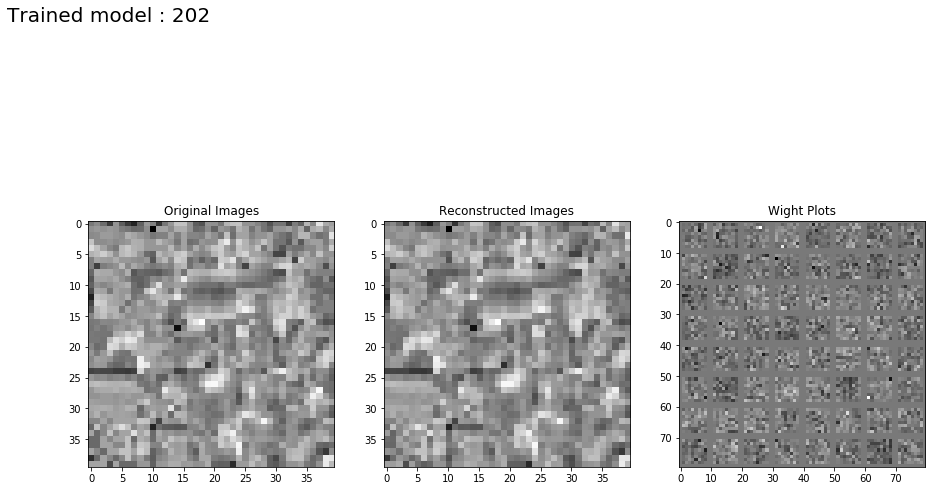

Step 1: Minibatch Loss: 0.015202 Error: 0.015126 Sparse: 0.007640
Step 100: Minibatch Loss: 0.004128 Error: 0.003211 Sparse: 0.091736
Step 200: Minibatch Loss: 0.001881 Error: 0.000936 Sparse: 0.094434
Step 300: Minibatch Loss: 0.001492 Error: 0.000544 Sparse: 0.094814
Step 400: Minibatch Loss: 0.001294 Error: 0.000341 Sparse: 0.095294
Step 500: Minibatch Loss: 0.001147 Error: 0.000190 Sparse: 0.095677
Step 600: Minibatch Loss: 0.001058 Error: 0.000096 Sparse: 0.096253
Step 700: Minibatch Loss: 0.001000 Error: 0.000042 Sparse: 0.095798
Step 800: Minibatch Loss: 0.000968 Error: 0.000012 Sparse: 0.095632
Step 900: Minibatch Loss: 0.000960 Error: 0.000005 Sparse: 0.095462
Step 1000: Minibatch Loss: 0.000956 Error: 0.000004 Sparse: 0.095157


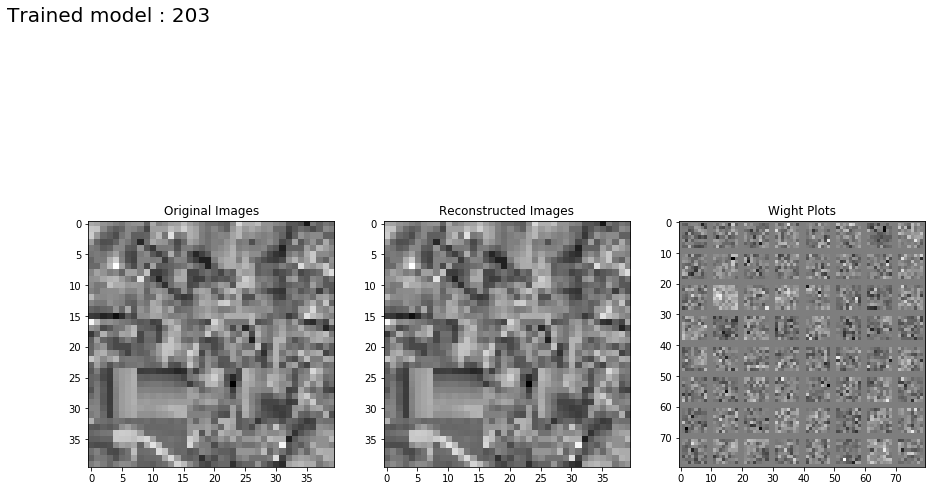

Step 1: Minibatch Loss: 0.015964 Error: 0.015174 Sparse: 0.007895
Step 100: Minibatch Loss: 0.014062 Error: 0.005565 Sparse: 0.084973
Step 200: Minibatch Loss: 0.010520 Error: 0.001944 Sparse: 0.085764
Step 300: Minibatch Loss: 0.009676 Error: 0.001232 Sparse: 0.084434
Step 400: Minibatch Loss: 0.009306 Error: 0.001002 Sparse: 0.083047
Step 500: Minibatch Loss: 0.009053 Error: 0.000861 Sparse: 0.081925
Step 600: Minibatch Loss: 0.008788 Error: 0.000752 Sparse: 0.080354
Step 700: Minibatch Loss: 0.008669 Error: 0.000695 Sparse: 0.079738
Step 800: Minibatch Loss: 0.008483 Error: 0.000623 Sparse: 0.078595
Step 900: Minibatch Loss: 0.008355 Error: 0.000580 Sparse: 0.077751
Step 1000: Minibatch Loss: 0.008340 Error: 0.000562 Sparse: 0.077776


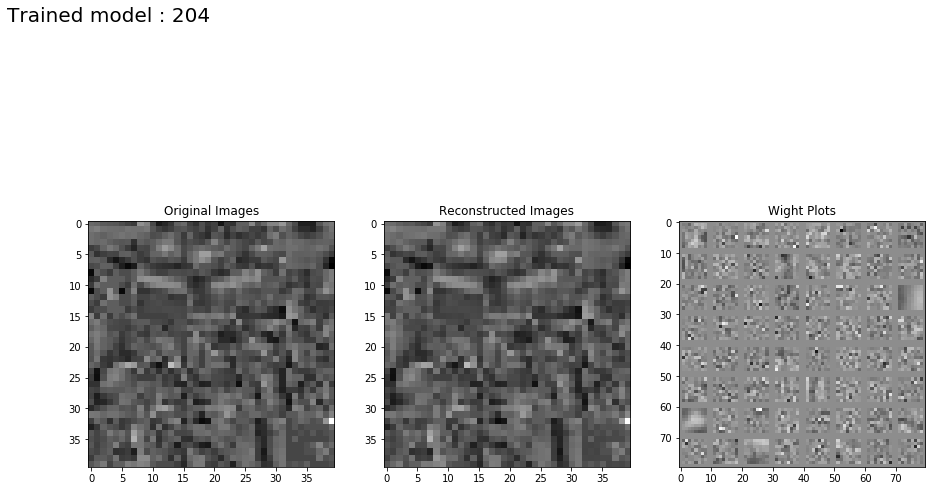

Step 1: Minibatch Loss: 0.022763 Error: 0.015159 Sparse: 0.007604
Step 100: Minibatch Loss: 0.067704 Error: 0.011162 Sparse: 0.056541
Step 200: Minibatch Loss: 0.029102 Error: 0.014538 Sparse: 0.014564
Step 300: Minibatch Loss: 0.016536 Error: 0.015442 Sparse: 0.001094
Step 400: Minibatch Loss: 0.016601 Error: 0.015511 Sparse: 0.001090
Step 500: Minibatch Loss: 0.016725 Error: 0.015447 Sparse: 0.001278
Step 600: Minibatch Loss: 0.016832 Error: 0.015412 Sparse: 0.001420
Step 700: Minibatch Loss: 0.016801 Error: 0.015351 Sparse: 0.001450
Step 800: Minibatch Loss: 0.016965 Error: 0.015412 Sparse: 0.001553
Step 900: Minibatch Loss: 0.017121 Error: 0.015393 Sparse: 0.001728
Step 1000: Minibatch Loss: 0.017176 Error: 0.015395 Sparse: 0.001781


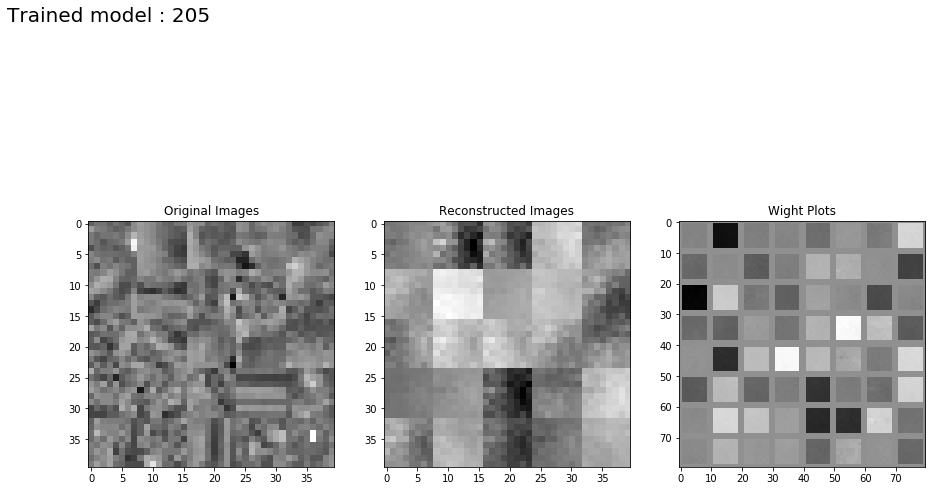

Step 1: Minibatch Loss: 0.015241 Error: 0.015240 Sparse: 0.007922
Step 100: Minibatch Loss: 0.005445 Error: 0.005436 Sparse: 0.095080
Step 200: Minibatch Loss: 0.001485 Error: 0.001475 Sparse: 0.094828
Step 300: Minibatch Loss: 0.000838 Error: 0.000829 Sparse: 0.095529
Step 400: Minibatch Loss: 0.000544 Error: 0.000534 Sparse: 0.096487
Step 500: Minibatch Loss: 0.000397 Error: 0.000387 Sparse: 0.096717
Step 600: Minibatch Loss: 0.000290 Error: 0.000281 Sparse: 0.097419
Step 700: Minibatch Loss: 0.000217 Error: 0.000207 Sparse: 0.097617
Step 800: Minibatch Loss: 0.000144 Error: 0.000134 Sparse: 0.097778
Step 900: Minibatch Loss: 0.000098 Error: 0.000088 Sparse: 0.097756
Step 1000: Minibatch Loss: 0.000074 Error: 0.000064 Sparse: 0.097643
Step 1100: Minibatch Loss: 0.000066 Error: 0.000056 Sparse: 0.097566
Step 1200: Minibatch Loss: 0.000060 Error: 0.000050 Sparse: 0.097816
Step 1300: Minibatch Loss: 0.000055 Error: 0.000045 Sparse: 0.097698
Step 1400: Minibatch Loss: 0.000038 Error: 0.0

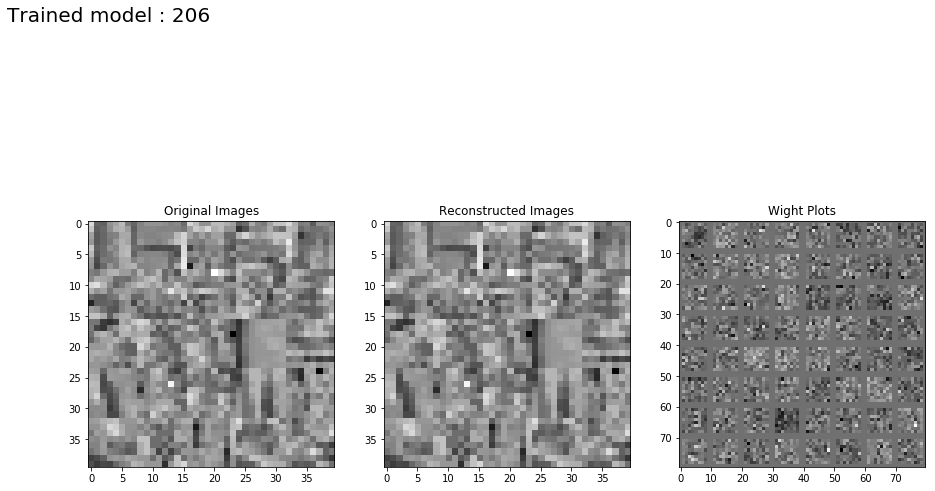

Step 1: Minibatch Loss: 0.015226 Error: 0.015218 Sparse: 0.008018
Step 100: Minibatch Loss: 0.004371 Error: 0.004279 Sparse: 0.092564
Step 200: Minibatch Loss: 0.001257 Error: 0.001161 Sparse: 0.095943
Step 300: Minibatch Loss: 0.000725 Error: 0.000628 Sparse: 0.096826
Step 400: Minibatch Loss: 0.000496 Error: 0.000399 Sparse: 0.097187
Step 500: Minibatch Loss: 0.000333 Error: 0.000235 Sparse: 0.097922
Step 600: Minibatch Loss: 0.000235 Error: 0.000137 Sparse: 0.098154
Step 700: Minibatch Loss: 0.000178 Error: 0.000080 Sparse: 0.098305
Step 800: Minibatch Loss: 0.000134 Error: 0.000035 Sparse: 0.098564
Step 900: Minibatch Loss: 0.000114 Error: 0.000015 Sparse: 0.099058
Step 1000: Minibatch Loss: 0.000101 Error: 0.000002 Sparse: 0.098785
Step 1100: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098322
Step 1200: Minibatch Loss: 0.000099 Error: 0.000000 Sparse: 0.098777
Step 1300: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098441
Step 1400: Minibatch Loss: 0.000098 Error: 0.0

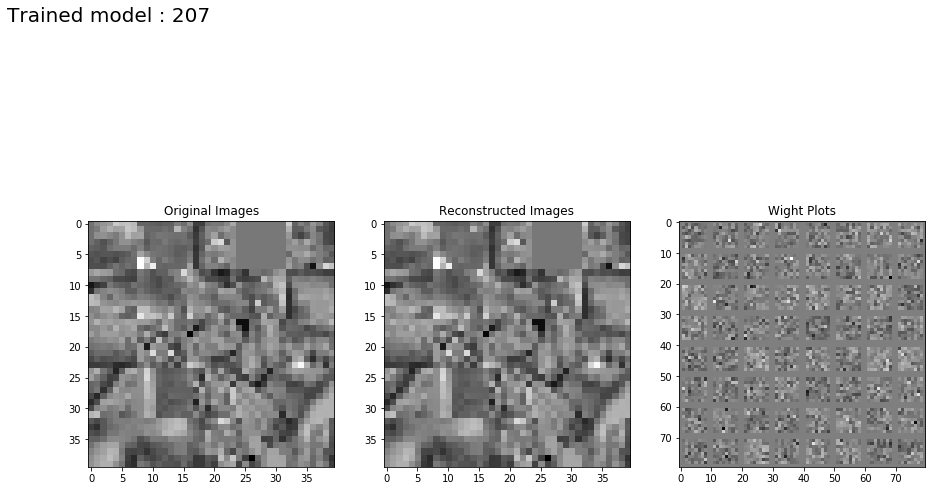

Step 1: Minibatch Loss: 0.015310 Error: 0.015232 Sparse: 0.007728
Step 100: Minibatch Loss: 0.004977 Error: 0.004072 Sparse: 0.090493
Step 200: Minibatch Loss: 0.002144 Error: 0.001205 Sparse: 0.093908
Step 300: Minibatch Loss: 0.001599 Error: 0.000650 Sparse: 0.094867
Step 400: Minibatch Loss: 0.001367 Error: 0.000406 Sparse: 0.096041
Step 500: Minibatch Loss: 0.001206 Error: 0.000238 Sparse: 0.096815
Step 600: Minibatch Loss: 0.001121 Error: 0.000154 Sparse: 0.096657
Step 700: Minibatch Loss: 0.001074 Error: 0.000113 Sparse: 0.096177
Step 800: Minibatch Loss: 0.001042 Error: 0.000075 Sparse: 0.096637
Step 900: Minibatch Loss: 0.001014 Error: 0.000051 Sparse: 0.096346
Step 1000: Minibatch Loss: 0.001000 Error: 0.000039 Sparse: 0.096132
Step 1100: Minibatch Loss: 0.000971 Error: 0.000015 Sparse: 0.095553
Step 1200: Minibatch Loss: 0.000963 Error: 0.000006 Sparse: 0.095724
Step 1300: Minibatch Loss: 0.000959 Error: 0.000004 Sparse: 0.095528
Step 1400: Minibatch Loss: 0.000953 Error: 0.0

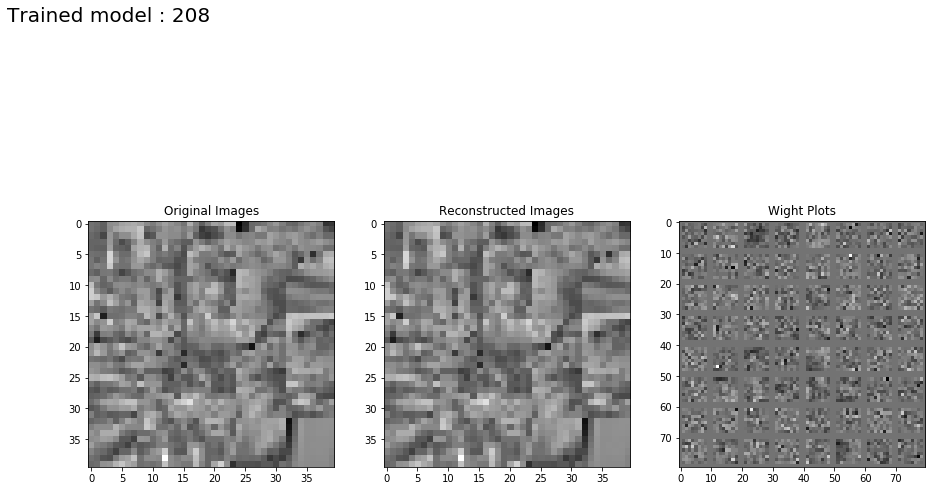

Step 1: Minibatch Loss: 0.015989 Error: 0.015248 Sparse: 0.007406
Step 100: Minibatch Loss: 0.013329 Error: 0.004631 Sparse: 0.086986
Step 200: Minibatch Loss: 0.010215 Error: 0.001678 Sparse: 0.085366
Step 300: Minibatch Loss: 0.009506 Error: 0.001205 Sparse: 0.083013
Step 400: Minibatch Loss: 0.009143 Error: 0.000996 Sparse: 0.081477
Step 500: Minibatch Loss: 0.008914 Error: 0.000862 Sparse: 0.080513
Step 600: Minibatch Loss: 0.008652 Error: 0.000746 Sparse: 0.079060
Step 700: Minibatch Loss: 0.008535 Error: 0.000682 Sparse: 0.078529
Step 800: Minibatch Loss: 0.008458 Error: 0.000638 Sparse: 0.078205
Step 900: Minibatch Loss: 0.008331 Error: 0.000582 Sparse: 0.077493
Step 1000: Minibatch Loss: 0.008258 Error: 0.000560 Sparse: 0.076982
Step 1100: Minibatch Loss: 0.008171 Error: 0.000548 Sparse: 0.076228
Step 1200: Minibatch Loss: 0.008087 Error: 0.000533 Sparse: 0.075531
Step 1300: Minibatch Loss: 0.007994 Error: 0.000511 Sparse: 0.074824
Step 1400: Minibatch Loss: 0.008021 Error: 0.0

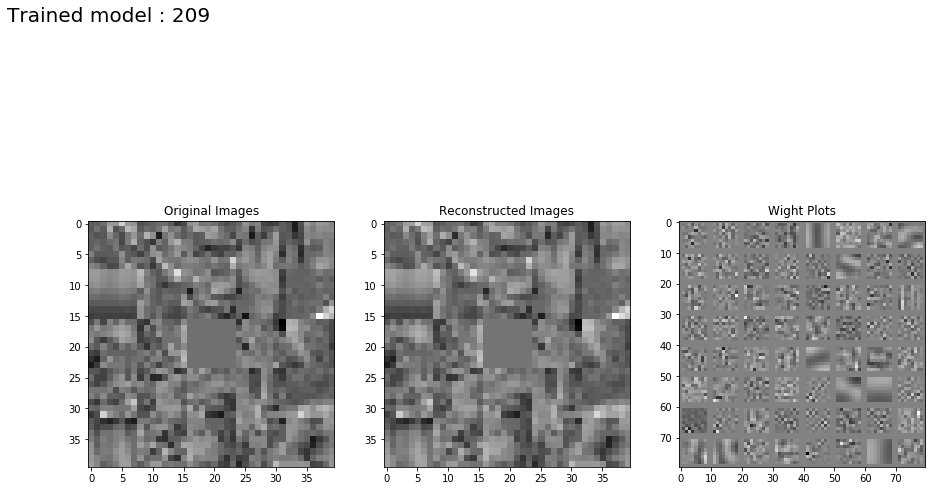

Step 1: Minibatch Loss: 0.023214 Error: 0.015138 Sparse: 0.008075
Step 100: Minibatch Loss: 0.069697 Error: 0.011549 Sparse: 0.058148
Step 200: Minibatch Loss: 0.032328 Error: 0.014253 Sparse: 0.018074
Step 300: Minibatch Loss: 0.017067 Error: 0.015446 Sparse: 0.001621
Step 400: Minibatch Loss: 0.016328 Error: 0.015482 Sparse: 0.000847
Step 500: Minibatch Loss: 0.016330 Error: 0.015310 Sparse: 0.001020
Step 600: Minibatch Loss: 0.016588 Error: 0.015323 Sparse: 0.001265
Step 700: Minibatch Loss: 0.016694 Error: 0.015321 Sparse: 0.001373
Step 800: Minibatch Loss: 0.016908 Error: 0.015384 Sparse: 0.001524
Step 900: Minibatch Loss: 0.016864 Error: 0.015334 Sparse: 0.001530
Step 1000: Minibatch Loss: 0.017178 Error: 0.015331 Sparse: 0.001848
Step 1100: Minibatch Loss: 0.017375 Error: 0.015390 Sparse: 0.001985
Step 1200: Minibatch Loss: 0.017109 Error: 0.015427 Sparse: 0.001682
Step 1300: Minibatch Loss: 0.017478 Error: 0.015358 Sparse: 0.002120
Step 1400: Minibatch Loss: 0.017825 Error: 0.0

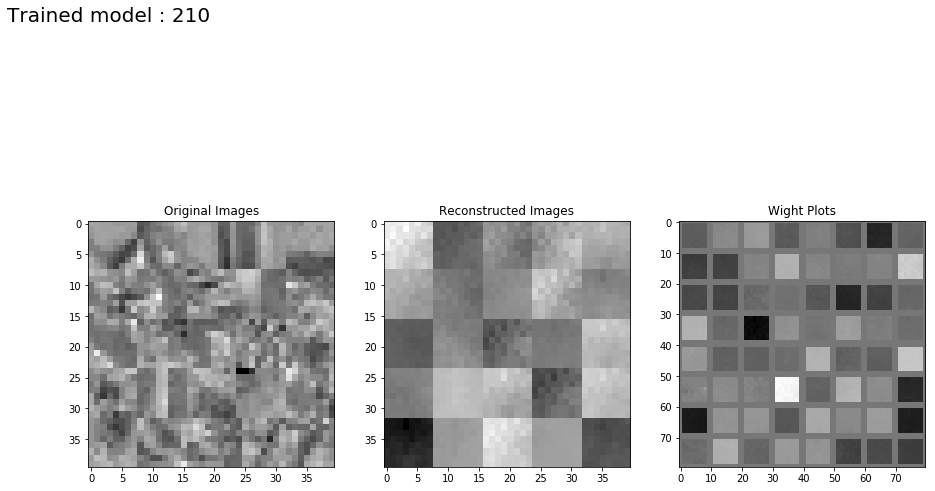

Step 1: Minibatch Loss: 0.015194 Error: 0.015193 Sparse: 0.007875
Step 100: Minibatch Loss: 0.004284 Error: 0.004275 Sparse: 0.089917
Step 200: Minibatch Loss: 0.001263 Error: 0.001253 Sparse: 0.095018
Step 300: Minibatch Loss: 0.000677 Error: 0.000668 Sparse: 0.095301
Step 400: Minibatch Loss: 0.000351 Error: 0.000341 Sparse: 0.097249
Step 500: Minibatch Loss: 0.000181 Error: 0.000171 Sparse: 0.098068
Step 600: Minibatch Loss: 0.000100 Error: 0.000090 Sparse: 0.098276
Step 700: Minibatch Loss: 0.000080 Error: 0.000070 Sparse: 0.098024
Step 800: Minibatch Loss: 0.000068 Error: 0.000058 Sparse: 0.098637
Step 900: Minibatch Loss: 0.000058 Error: 0.000049 Sparse: 0.097591
Step 1000: Minibatch Loss: 0.000036 Error: 0.000026 Sparse: 0.098707
Step 1100: Minibatch Loss: 0.000016 Error: 0.000006 Sparse: 0.098909
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098860
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098842
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

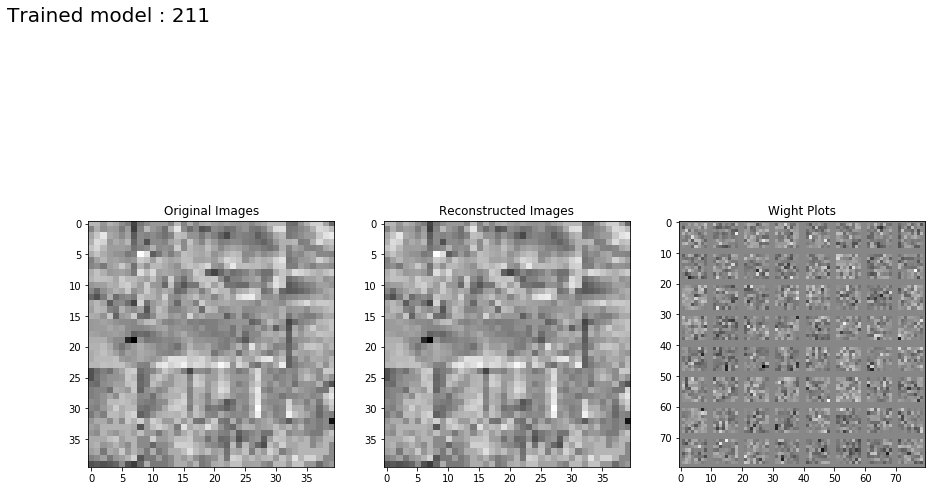

Step 1: Minibatch Loss: 0.015252 Error: 0.015244 Sparse: 0.007826
Step 100: Minibatch Loss: 0.004472 Error: 0.004379 Sparse: 0.093042
Step 200: Minibatch Loss: 0.001285 Error: 0.001189 Sparse: 0.095987
Step 300: Minibatch Loss: 0.000775 Error: 0.000679 Sparse: 0.095739
Step 400: Minibatch Loss: 0.000508 Error: 0.000410 Sparse: 0.097596
Step 500: Minibatch Loss: 0.000337 Error: 0.000239 Sparse: 0.097793
Step 600: Minibatch Loss: 0.000246 Error: 0.000148 Sparse: 0.097418
Step 700: Minibatch Loss: 0.000192 Error: 0.000093 Sparse: 0.098615
Step 800: Minibatch Loss: 0.000156 Error: 0.000057 Sparse: 0.098841
Step 900: Minibatch Loss: 0.000155 Error: 0.000057 Sparse: 0.098563
Step 1000: Minibatch Loss: 0.000146 Error: 0.000048 Sparse: 0.098375
Step 1100: Minibatch Loss: 0.000141 Error: 0.000042 Sparse: 0.098649
Step 1200: Minibatch Loss: 0.000133 Error: 0.000034 Sparse: 0.098577
Step 1300: Minibatch Loss: 0.000121 Error: 0.000022 Sparse: 0.099242
Step 1400: Minibatch Loss: 0.000105 Error: 0.0

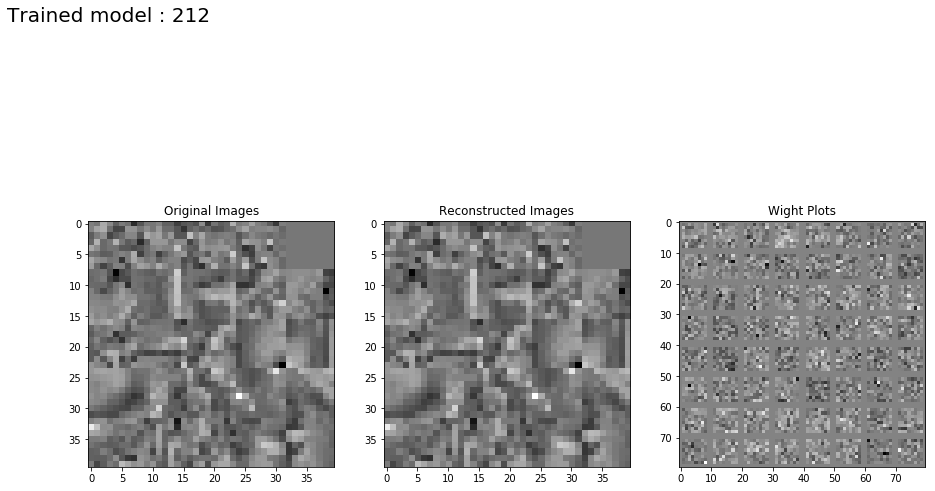

Step 1: Minibatch Loss: 0.015328 Error: 0.015251 Sparse: 0.007686
Step 100: Minibatch Loss: 0.005796 Error: 0.004843 Sparse: 0.095248
Step 200: Minibatch Loss: 0.002203 Error: 0.001244 Sparse: 0.095948
Step 300: Minibatch Loss: 0.001630 Error: 0.000674 Sparse: 0.095518
Step 400: Minibatch Loss: 0.001346 Error: 0.000390 Sparse: 0.095635
Step 500: Minibatch Loss: 0.001213 Error: 0.000252 Sparse: 0.096145
Step 600: Minibatch Loss: 0.001115 Error: 0.000154 Sparse: 0.096080
Step 700: Minibatch Loss: 0.001064 Error: 0.000107 Sparse: 0.095713
Step 800: Minibatch Loss: 0.001032 Error: 0.000070 Sparse: 0.096269
Step 900: Minibatch Loss: 0.001014 Error: 0.000060 Sparse: 0.095419
Step 1000: Minibatch Loss: 0.001018 Error: 0.000057 Sparse: 0.096046
Step 1100: Minibatch Loss: 0.000998 Error: 0.000048 Sparse: 0.095075
Step 1200: Minibatch Loss: 0.000982 Error: 0.000034 Sparse: 0.094798
Step 1300: Minibatch Loss: 0.000962 Error: 0.000015 Sparse: 0.094701
Step 1400: Minibatch Loss: 0.000944 Error: 0.0

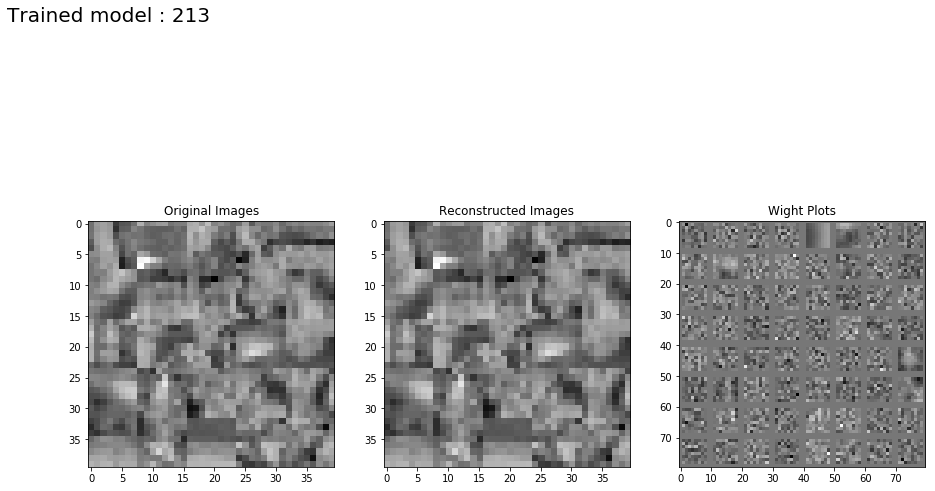

Step 1: Minibatch Loss: 0.016070 Error: 0.015295 Sparse: 0.007756
Step 100: Minibatch Loss: 0.016436 Error: 0.007156 Sparse: 0.092796
Step 200: Minibatch Loss: 0.010721 Error: 0.001990 Sparse: 0.087306
Step 300: Minibatch Loss: 0.009834 Error: 0.001370 Sparse: 0.084643
Step 400: Minibatch Loss: 0.009368 Error: 0.001138 Sparse: 0.082295
Step 500: Minibatch Loss: 0.008949 Error: 0.000962 Sparse: 0.079872
Step 600: Minibatch Loss: 0.008762 Error: 0.000861 Sparse: 0.079009
Step 700: Minibatch Loss: 0.008577 Error: 0.000767 Sparse: 0.078104
Step 800: Minibatch Loss: 0.008451 Error: 0.000709 Sparse: 0.077418
Step 900: Minibatch Loss: 0.008426 Error: 0.000679 Sparse: 0.077467
Step 1000: Minibatch Loss: 0.008387 Error: 0.000648 Sparse: 0.077385
Step 1100: Minibatch Loss: 0.008088 Error: 0.000592 Sparse: 0.074962
Step 1200: Minibatch Loss: 0.008244 Error: 0.000614 Sparse: 0.076305
Step 1300: Minibatch Loss: 0.008145 Error: 0.000589 Sparse: 0.075566
Step 1400: Minibatch Loss: 0.008057 Error: 0.0

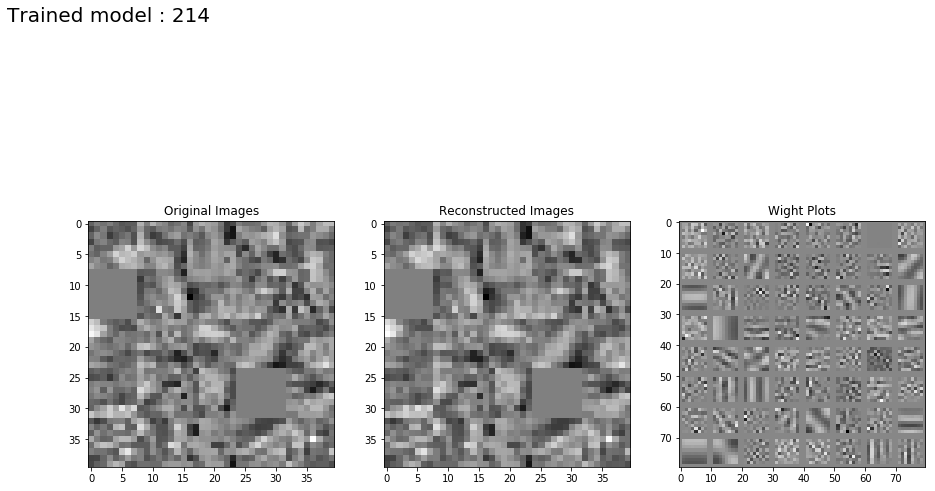

Step 1: Minibatch Loss: 0.023207 Error: 0.015137 Sparse: 0.008071
Step 100: Minibatch Loss: 0.061928 Error: 0.011509 Sparse: 0.050419
Step 200: Minibatch Loss: 0.027004 Error: 0.014740 Sparse: 0.012265
Step 300: Minibatch Loss: 0.016759 Error: 0.015462 Sparse: 0.001297
Step 400: Minibatch Loss: 0.017091 Error: 0.015363 Sparse: 0.001728
Step 500: Minibatch Loss: 0.017174 Error: 0.015364 Sparse: 0.001810
Step 600: Minibatch Loss: 0.017499 Error: 0.015406 Sparse: 0.002093
Step 700: Minibatch Loss: 0.017474 Error: 0.015406 Sparse: 0.002067
Step 800: Minibatch Loss: 0.017985 Error: 0.015417 Sparse: 0.002569
Step 900: Minibatch Loss: 0.018090 Error: 0.015441 Sparse: 0.002649
Step 1000: Minibatch Loss: 0.018561 Error: 0.015434 Sparse: 0.003127
Step 1100: Minibatch Loss: 0.018751 Error: 0.015317 Sparse: 0.003434
Step 1200: Minibatch Loss: 0.018962 Error: 0.015424 Sparse: 0.003538
Step 1300: Minibatch Loss: 0.018961 Error: 0.015292 Sparse: 0.003669
Step 1400: Minibatch Loss: 0.019932 Error: 0.0

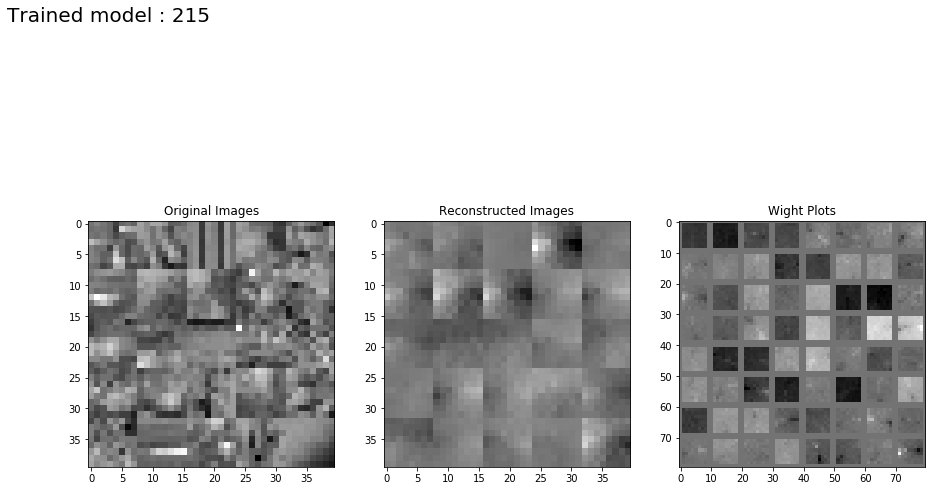

Step 1: Minibatch Loss: 0.015244 Error: 0.015244 Sparse: 0.008153
Step 100: Minibatch Loss: 0.004748 Error: 0.004739 Sparse: 0.092561
Step 200: Minibatch Loss: 0.001243 Error: 0.001234 Sparse: 0.094847
Step 300: Minibatch Loss: 0.000690 Error: 0.000680 Sparse: 0.095427
Step 400: Minibatch Loss: 0.000479 Error: 0.000469 Sparse: 0.096288
Step 500: Minibatch Loss: 0.000299 Error: 0.000290 Sparse: 0.095941
Step 600: Minibatch Loss: 0.000195 Error: 0.000186 Sparse: 0.097039
Step 700: Minibatch Loss: 0.000097 Error: 0.000088 Sparse: 0.097457
Step 800: Minibatch Loss: 0.000052 Error: 0.000042 Sparse: 0.098464
Step 900: Minibatch Loss: 0.000024 Error: 0.000014 Sparse: 0.098274
Step 1000: Minibatch Loss: 0.000012 Error: 0.000002 Sparse: 0.098748
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098619
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.097874
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098470
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

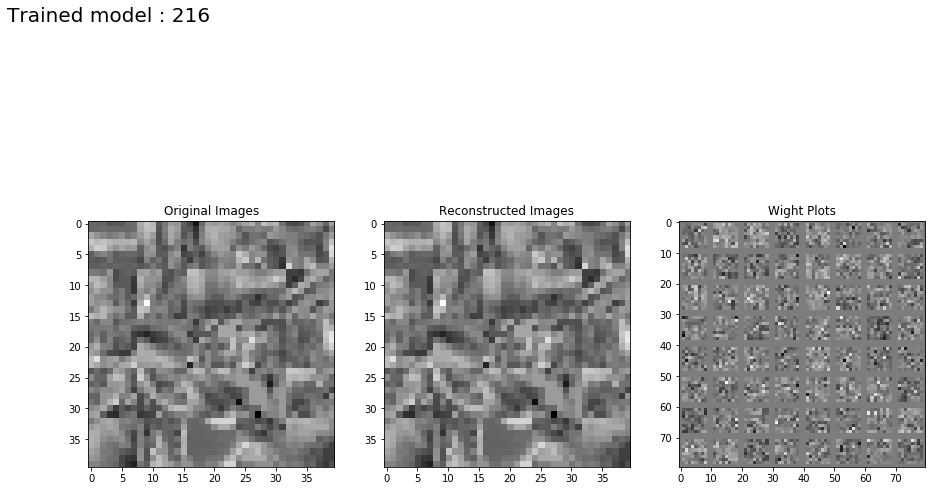

Step 1: Minibatch Loss: 0.015223 Error: 0.015215 Sparse: 0.007775
Step 100: Minibatch Loss: 0.006053 Error: 0.005959 Sparse: 0.094427
Step 200: Minibatch Loss: 0.001509 Error: 0.001412 Sparse: 0.097008
Step 300: Minibatch Loss: 0.000790 Error: 0.000693 Sparse: 0.096562
Step 400: Minibatch Loss: 0.000550 Error: 0.000453 Sparse: 0.097399
Step 500: Minibatch Loss: 0.000422 Error: 0.000325 Sparse: 0.097382
Step 600: Minibatch Loss: 0.000332 Error: 0.000235 Sparse: 0.096901
Step 700: Minibatch Loss: 0.000258 Error: 0.000159 Sparse: 0.098541
Step 800: Minibatch Loss: 0.000211 Error: 0.000112 Sparse: 0.098577
Step 900: Minibatch Loss: 0.000168 Error: 0.000070 Sparse: 0.098449
Step 1000: Minibatch Loss: 0.000157 Error: 0.000059 Sparse: 0.098126
Step 1100: Minibatch Loss: 0.000137 Error: 0.000038 Sparse: 0.098697
Step 1200: Minibatch Loss: 0.000120 Error: 0.000021 Sparse: 0.098718
Step 1300: Minibatch Loss: 0.000104 Error: 0.000006 Sparse: 0.098425
Step 1400: Minibatch Loss: 0.000100 Error: 0.0

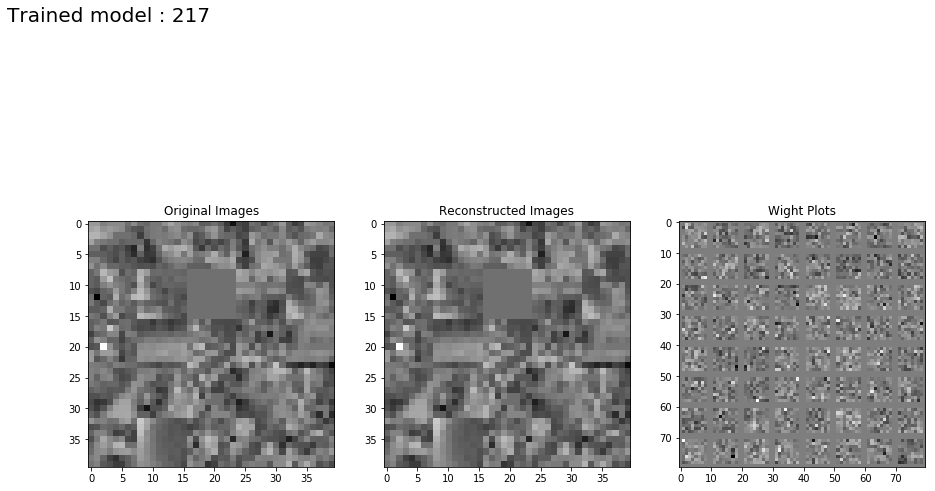

Step 1: Minibatch Loss: 0.015246 Error: 0.015165 Sparse: 0.008122
Step 100: Minibatch Loss: 0.007001 Error: 0.006036 Sparse: 0.096488
Step 200: Minibatch Loss: 0.002555 Error: 0.001596 Sparse: 0.095855
Step 300: Minibatch Loss: 0.001839 Error: 0.000885 Sparse: 0.095367
Step 400: Minibatch Loss: 0.001543 Error: 0.000587 Sparse: 0.095600
Step 500: Minibatch Loss: 0.001383 Error: 0.000429 Sparse: 0.095463
Step 600: Minibatch Loss: 0.001259 Error: 0.000306 Sparse: 0.095284
Step 700: Minibatch Loss: 0.001189 Error: 0.000228 Sparse: 0.096129
Step 800: Minibatch Loss: 0.001121 Error: 0.000160 Sparse: 0.096142
Step 900: Minibatch Loss: 0.001074 Error: 0.000113 Sparse: 0.096091
Step 1000: Minibatch Loss: 0.001043 Error: 0.000076 Sparse: 0.096667
Step 1100: Minibatch Loss: 0.001026 Error: 0.000056 Sparse: 0.096994
Step 1200: Minibatch Loss: 0.001001 Error: 0.000040 Sparse: 0.096160
Step 1300: Minibatch Loss: 0.000981 Error: 0.000026 Sparse: 0.095440
Step 1400: Minibatch Loss: 0.000965 Error: 0.0

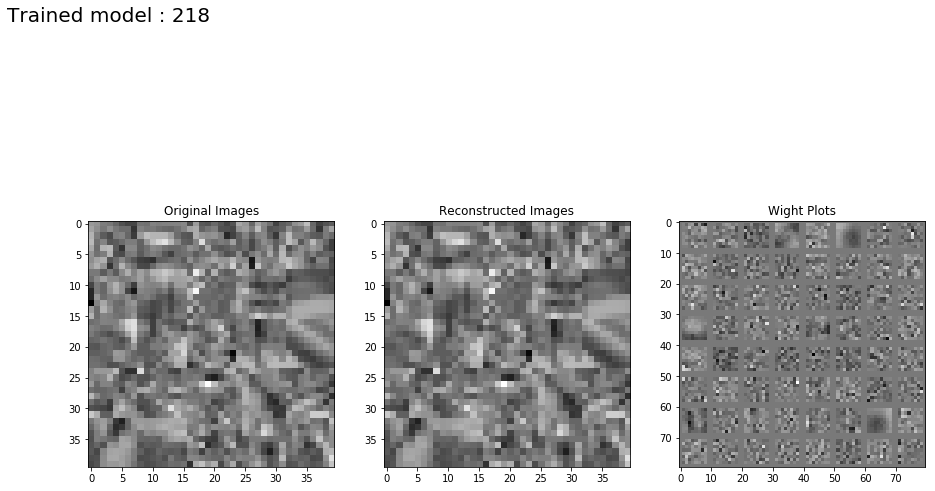

Step 1: Minibatch Loss: 0.015980 Error: 0.015225 Sparse: 0.007548
Step 100: Minibatch Loss: 0.015759 Error: 0.006522 Sparse: 0.092367
Step 200: Minibatch Loss: 0.010722 Error: 0.002023 Sparse: 0.086988
Step 300: Minibatch Loss: 0.009747 Error: 0.001407 Sparse: 0.083395
Step 400: Minibatch Loss: 0.009305 Error: 0.001195 Sparse: 0.081101
Step 500: Minibatch Loss: 0.009038 Error: 0.001040 Sparse: 0.079973
Step 600: Minibatch Loss: 0.008805 Error: 0.000935 Sparse: 0.078705
Step 700: Minibatch Loss: 0.008698 Error: 0.000850 Sparse: 0.078481
Step 800: Minibatch Loss: 0.008630 Error: 0.000791 Sparse: 0.078384
Step 900: Minibatch Loss: 0.008328 Error: 0.000705 Sparse: 0.076232
Step 1000: Minibatch Loss: 0.008268 Error: 0.000648 Sparse: 0.076209
Step 1100: Minibatch Loss: 0.008288 Error: 0.000615 Sparse: 0.076724
Step 1200: Minibatch Loss: 0.008265 Error: 0.000586 Sparse: 0.076796
Step 1300: Minibatch Loss: 0.008158 Error: 0.000543 Sparse: 0.076156
Step 1400: Minibatch Loss: 0.008032 Error: 0.0

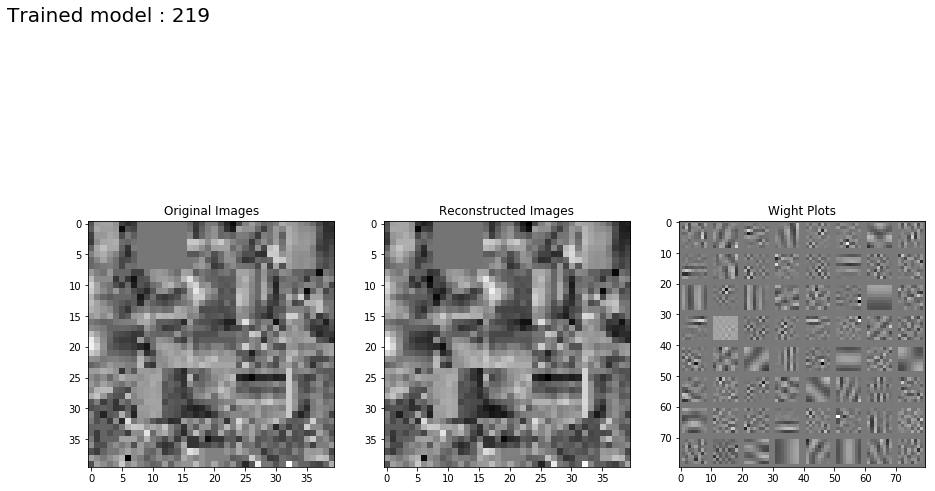

Step 1: Minibatch Loss: 0.023077 Error: 0.015208 Sparse: 0.007869
Step 100: Minibatch Loss: 0.072425 Error: 0.011090 Sparse: 0.061335
Step 200: Minibatch Loss: 0.032955 Error: 0.014091 Sparse: 0.018864
Step 300: Minibatch Loss: 0.017308 Error: 0.015466 Sparse: 0.001842
Step 400: Minibatch Loss: 0.016185 Error: 0.015263 Sparse: 0.000923
Step 500: Minibatch Loss: 0.016583 Error: 0.015465 Sparse: 0.001118
Step 600: Minibatch Loss: 0.016650 Error: 0.015400 Sparse: 0.001250
Step 700: Minibatch Loss: 0.016882 Error: 0.015525 Sparse: 0.001358
Step 800: Minibatch Loss: 0.016882 Error: 0.015335 Sparse: 0.001547
Step 900: Minibatch Loss: 0.016977 Error: 0.015430 Sparse: 0.001547
Step 1000: Minibatch Loss: 0.017140 Error: 0.015396 Sparse: 0.001744
Step 1100: Minibatch Loss: 0.017256 Error: 0.015300 Sparse: 0.001955
Step 1200: Minibatch Loss: 0.017268 Error: 0.015361 Sparse: 0.001908
Step 1300: Minibatch Loss: 0.017409 Error: 0.015345 Sparse: 0.002064
Step 1400: Minibatch Loss: 0.017689 Error: 0.0

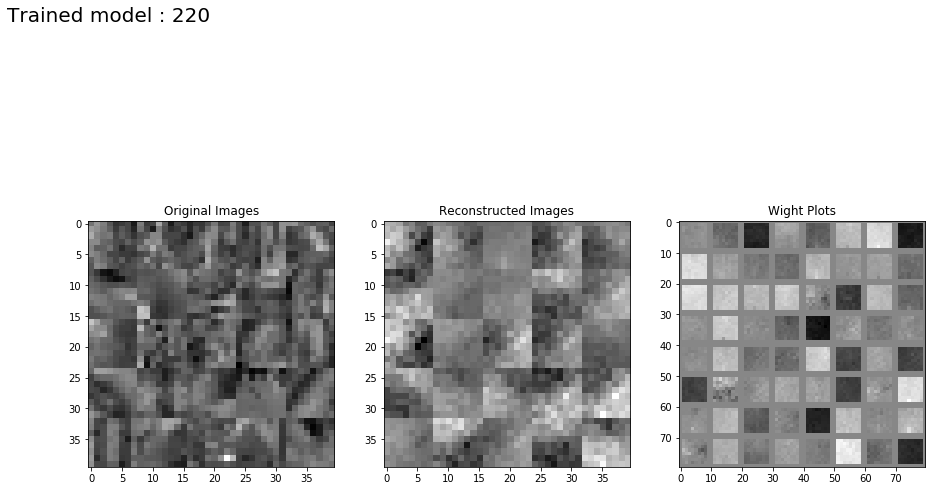

Step 1: Minibatch Loss: 0.015163 Error: 0.015162 Sparse: 0.008186
Step 100: Minibatch Loss: 0.004189 Error: 0.004180 Sparse: 0.090803
Step 200: Minibatch Loss: 0.001272 Error: 0.001262 Sparse: 0.094503
Step 300: Minibatch Loss: 0.000716 Error: 0.000707 Sparse: 0.096207
Step 400: Minibatch Loss: 0.000432 Error: 0.000422 Sparse: 0.096442
Step 500: Minibatch Loss: 0.000274 Error: 0.000264 Sparse: 0.097498
Step 600: Minibatch Loss: 0.000177 Error: 0.000167 Sparse: 0.097968
Step 700: Minibatch Loss: 0.000097 Error: 0.000088 Sparse: 0.098171
Step 800: Minibatch Loss: 0.000058 Error: 0.000049 Sparse: 0.098572
Step 900: Minibatch Loss: 0.000033 Error: 0.000023 Sparse: 0.098773
Step 1000: Minibatch Loss: 0.000014 Error: 0.000004 Sparse: 0.098116
Step 1100: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098334
Step 1200: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.099186
Step 1300: Minibatch Loss: 0.000010 Error: 0.000000 Sparse: 0.098448
Step 1400: Minibatch Loss: 0.000010 Error: 0.0

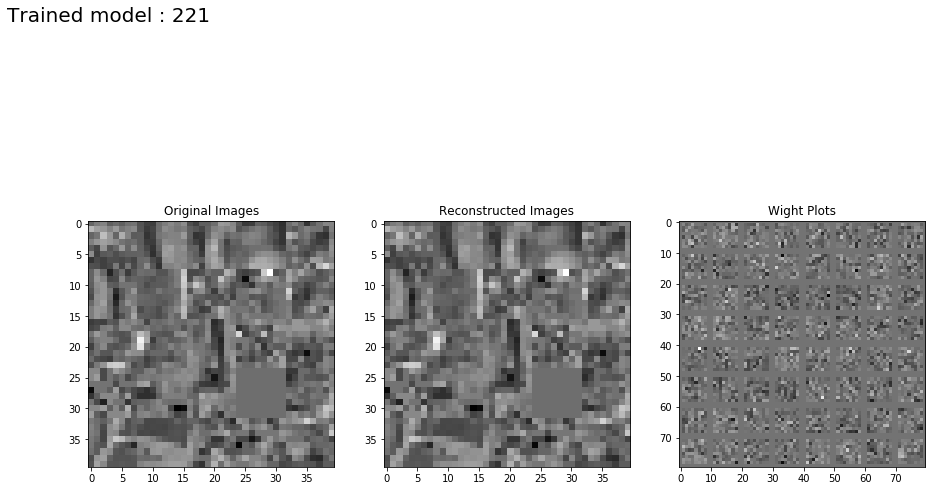

Step 1: Minibatch Loss: 0.015142 Error: 0.015134 Sparse: 0.007758
Step 100: Minibatch Loss: 0.004123 Error: 0.004032 Sparse: 0.091173
Step 200: Minibatch Loss: 0.001239 Error: 0.001145 Sparse: 0.094063
Step 300: Minibatch Loss: 0.000714 Error: 0.000618 Sparse: 0.095939
Step 400: Minibatch Loss: 0.000455 Error: 0.000359 Sparse: 0.096263
Step 500: Minibatch Loss: 0.000322 Error: 0.000225 Sparse: 0.097249
Step 600: Minibatch Loss: 0.000252 Error: 0.000154 Sparse: 0.097854
Step 700: Minibatch Loss: 0.000202 Error: 0.000104 Sparse: 0.097575
Step 800: Minibatch Loss: 0.000173 Error: 0.000075 Sparse: 0.097839
Step 900: Minibatch Loss: 0.000144 Error: 0.000046 Sparse: 0.098419
Step 1000: Minibatch Loss: 0.000113 Error: 0.000016 Sparse: 0.097139
Step 1100: Minibatch Loss: 0.000101 Error: 0.000004 Sparse: 0.097571
Step 1200: Minibatch Loss: 0.000097 Error: 0.000000 Sparse: 0.097130
Step 1300: Minibatch Loss: 0.000098 Error: 0.000000 Sparse: 0.098014
Step 1400: Minibatch Loss: 0.000098 Error: 0.0

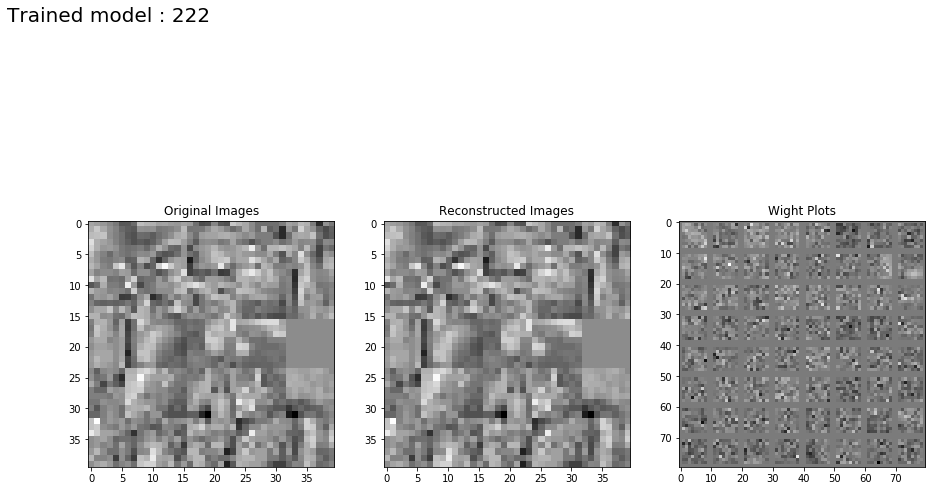

Step 1: Minibatch Loss: 0.015283 Error: 0.015203 Sparse: 0.008027
Step 100: Minibatch Loss: 0.005848 Error: 0.004916 Sparse: 0.093113
Step 200: Minibatch Loss: 0.002301 Error: 0.001366 Sparse: 0.093539
Step 300: Minibatch Loss: 0.001675 Error: 0.000735 Sparse: 0.093971
Step 400: Minibatch Loss: 0.001410 Error: 0.000464 Sparse: 0.094672
Step 500: Minibatch Loss: 0.001280 Error: 0.000321 Sparse: 0.095827
Step 600: Minibatch Loss: 0.001138 Error: 0.000183 Sparse: 0.095460
Step 700: Minibatch Loss: 0.001080 Error: 0.000126 Sparse: 0.095393
Step 800: Minibatch Loss: 0.001033 Error: 0.000078 Sparse: 0.095554
Step 900: Minibatch Loss: 0.001001 Error: 0.000047 Sparse: 0.095439
Step 1000: Minibatch Loss: 0.000980 Error: 0.000022 Sparse: 0.095786
Step 1100: Minibatch Loss: 0.000961 Error: 0.000009 Sparse: 0.095132
Step 1200: Minibatch Loss: 0.000959 Error: 0.000005 Sparse: 0.095433
Step 1300: Minibatch Loss: 0.000949 Error: 0.000004 Sparse: 0.094533
Step 1400: Minibatch Loss: 0.000946 Error: 0.0

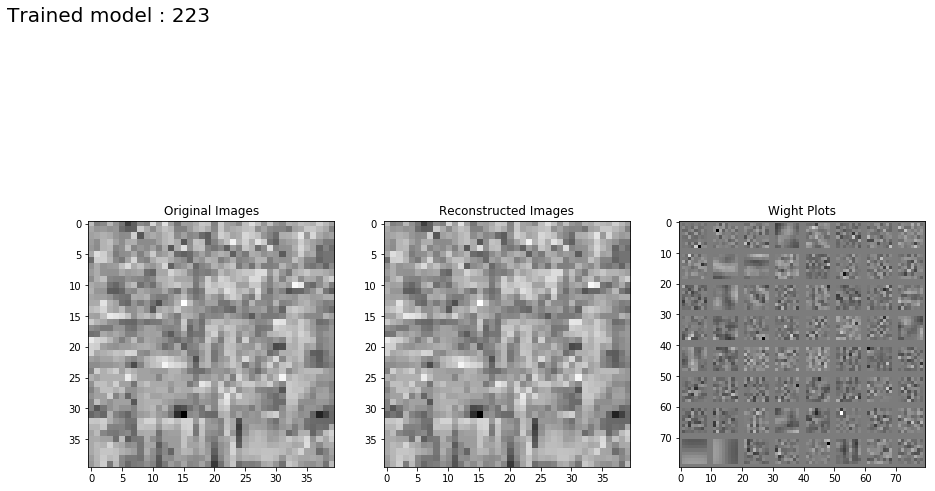

Step 1: Minibatch Loss: 0.015934 Error: 0.015150 Sparse: 0.007842
Step 100: Minibatch Loss: 0.014173 Error: 0.005349 Sparse: 0.088241
Step 200: Minibatch Loss: 0.010424 Error: 0.001765 Sparse: 0.086590
Step 300: Minibatch Loss: 0.009618 Error: 0.001211 Sparse: 0.084078
Step 400: Minibatch Loss: 0.009230 Error: 0.000949 Sparse: 0.082815
Step 500: Minibatch Loss: 0.008862 Error: 0.000791 Sparse: 0.080713
Step 600: Minibatch Loss: 0.008666 Error: 0.000696 Sparse: 0.079697
Step 700: Minibatch Loss: 0.008452 Error: 0.000622 Sparse: 0.078300
Step 800: Minibatch Loss: 0.008380 Error: 0.000584 Sparse: 0.077963
Step 900: Minibatch Loss: 0.008199 Error: 0.000524 Sparse: 0.076748
Step 1000: Minibatch Loss: 0.008145 Error: 0.000505 Sparse: 0.076397
Step 1100: Minibatch Loss: 0.008107 Error: 0.000488 Sparse: 0.076187
Step 1200: Minibatch Loss: 0.008101 Error: 0.000486 Sparse: 0.076142
Step 1300: Minibatch Loss: 0.008077 Error: 0.000479 Sparse: 0.075981
Step 1400: Minibatch Loss: 0.008016 Error: 0.0

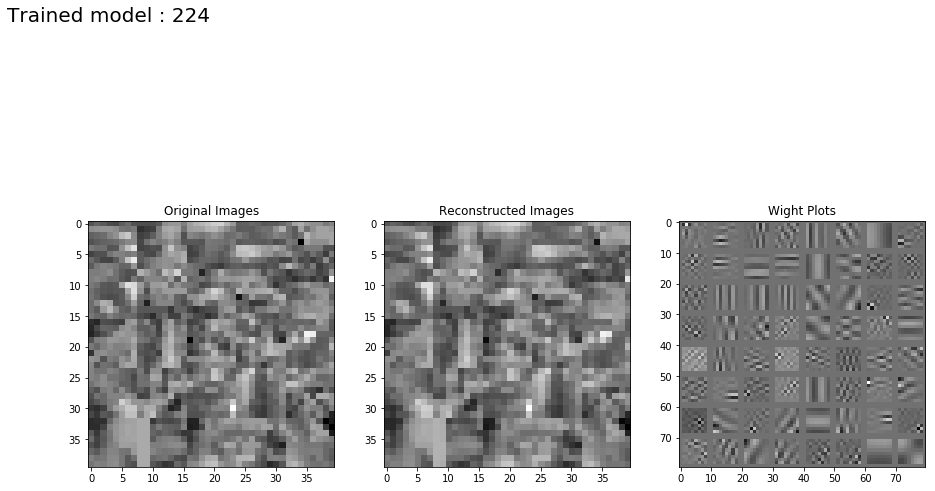

Step 1: Minibatch Loss: 0.023440 Error: 0.015309 Sparse: 0.008131
Step 100: Minibatch Loss: 0.064050 Error: 0.011203 Sparse: 0.052847
Step 200: Minibatch Loss: 0.028391 Error: 0.014619 Sparse: 0.013772
Step 300: Minibatch Loss: 0.016858 Error: 0.015408 Sparse: 0.001450
Step 400: Minibatch Loss: 0.016651 Error: 0.015386 Sparse: 0.001265
Step 500: Minibatch Loss: 0.017043 Error: 0.015508 Sparse: 0.001534
Step 600: Minibatch Loss: 0.017325 Error: 0.015425 Sparse: 0.001900
Step 700: Minibatch Loss: 0.017468 Error: 0.015410 Sparse: 0.002058
Step 800: Minibatch Loss: 0.017623 Error: 0.015439 Sparse: 0.002184
Step 900: Minibatch Loss: 0.017930 Error: 0.015494 Sparse: 0.002436
Step 1000: Minibatch Loss: 0.017935 Error: 0.015382 Sparse: 0.002553
Step 1100: Minibatch Loss: 0.017875 Error: 0.015431 Sparse: 0.002445
Step 1200: Minibatch Loss: 0.018423 Error: 0.015459 Sparse: 0.002964
Step 1300: Minibatch Loss: 0.018210 Error: 0.015428 Sparse: 0.002782
Step 1400: Minibatch Loss: 0.018782 Error: 0.0

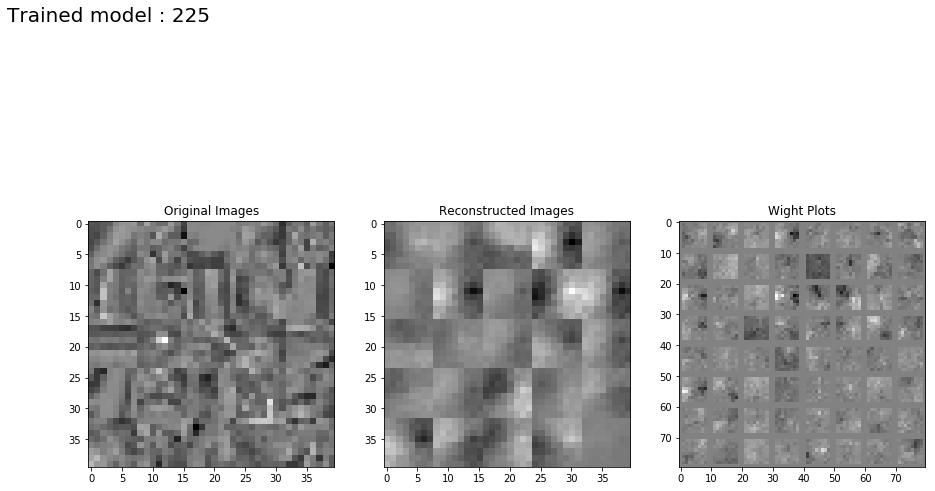

Step 1: Minibatch Loss: 0.015277 Error: 0.015276 Sparse: 0.007839
Step 100: Minibatch Loss: 66.874825 Error: 66.874763 Sparse: 0.632927
Step 200: Minibatch Loss: 14.956802 Error: 14.956760 Sparse: 0.423947
Step 300: Minibatch Loss: 5.886182 Error: 5.886148 Sparse: 0.340212
Step 400: Minibatch Loss: 3.044108 Error: 3.044079 Sparse: 0.293412
Step 500: Minibatch Loss: 1.748192 Error: 1.748167 Sparse: 0.259016
Step 600: Minibatch Loss: 1.065588 Error: 1.065565 Sparse: 0.231480
Step 700: Minibatch Loss: 0.704243 Error: 0.704222 Sparse: 0.212129
Step 800: Minibatch Loss: 0.494643 Error: 0.494623 Sparse: 0.196722
Step 900: Minibatch Loss: 0.355867 Error: 0.355848 Sparse: 0.184871
Step 1000: Minibatch Loss: 0.256518 Error: 0.256501 Sparse: 0.173791


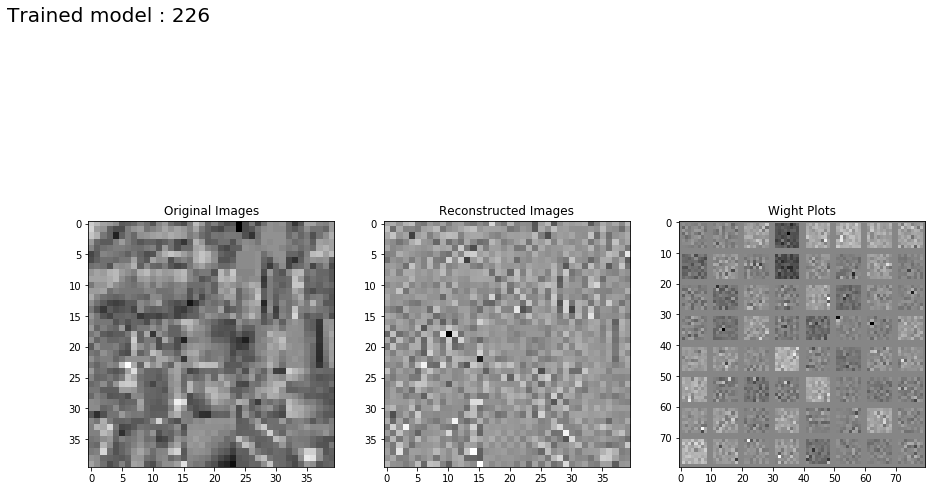

Step 1: Minibatch Loss: 0.015258 Error: 0.015250 Sparse: 0.008015
Step 100: Minibatch Loss: 63.891991 Error: 63.891373 Sparse: 0.617064
Step 200: Minibatch Loss: 14.986842 Error: 14.986422 Sparse: 0.420489
Step 300: Minibatch Loss: 6.359623 Error: 6.359275 Sparse: 0.347905
Step 400: Minibatch Loss: 3.225737 Error: 3.225439 Sparse: 0.298184
Step 500: Minibatch Loss: 1.807217 Error: 1.806956 Sparse: 0.260986
Step 600: Minibatch Loss: 1.153971 Error: 1.153735 Sparse: 0.236134
Step 700: Minibatch Loss: 0.759963 Error: 0.759746 Sparse: 0.216169
Step 800: Minibatch Loss: 0.523916 Error: 0.523715 Sparse: 0.201126
Step 900: Minibatch Loss: 0.365354 Error: 0.365167 Sparse: 0.187400
Step 1000: Minibatch Loss: 0.279057 Error: 0.278879 Sparse: 0.178423


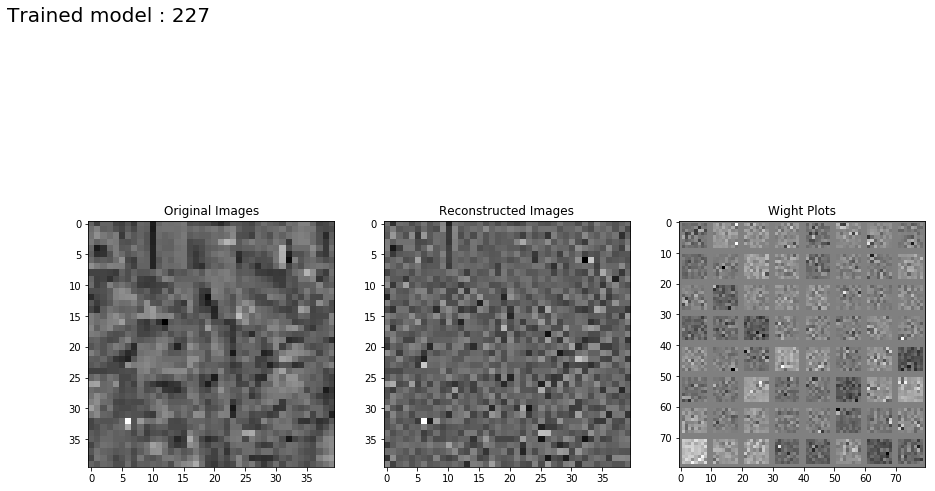

Step 1: Minibatch Loss: 0.015386 Error: 0.015308 Sparse: 0.007805
Step 100: Minibatch Loss: 64.720161 Error: 64.713890 Sparse: 0.627468
Step 200: Minibatch Loss: 15.088239 Error: 15.083954 Sparse: 0.428491
Step 300: Minibatch Loss: 6.517248 Error: 6.513741 Sparse: 0.350663
Step 400: Minibatch Loss: 3.372404 Error: 3.369397 Sparse: 0.300743
Step 500: Minibatch Loss: 1.836818 Error: 1.834205 Sparse: 0.261277
Step 600: Minibatch Loss: 1.201271 Error: 1.198878 Sparse: 0.239281
Step 700: Minibatch Loss: 0.797494 Error: 0.795310 Sparse: 0.218446
Step 800: Minibatch Loss: 0.558350 Error: 0.556321 Sparse: 0.202843
Step 900: Minibatch Loss: 0.396544 Error: 0.394653 Sparse: 0.189046
Step 1000: Minibatch Loss: 0.289090 Error: 0.287306 Sparse: 0.178410


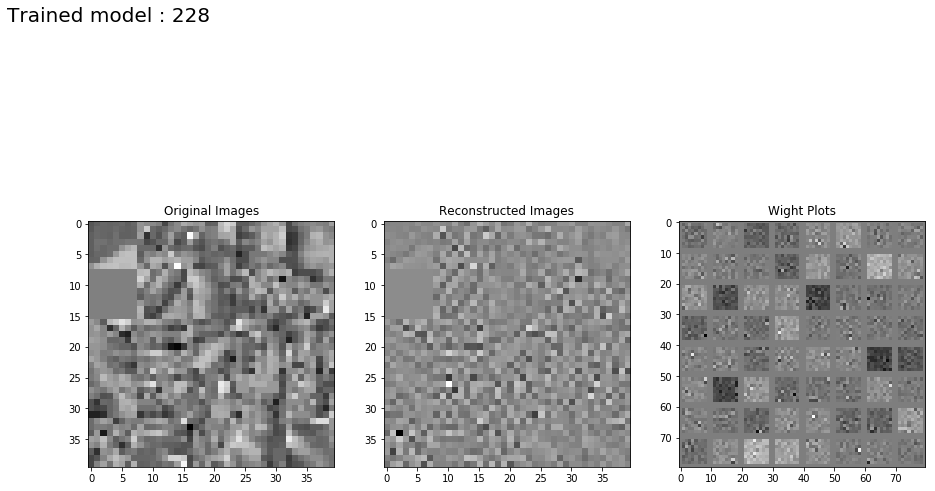

Step 1: Minibatch Loss: 0.016099 Error: 0.015326 Sparse: 0.007735
Step 100: Minibatch Loss: 65.115189 Error: 65.051483 Sparse: 0.637035
Step 200: Minibatch Loss: 15.148709 Error: 15.105536 Sparse: 0.431737
Step 300: Minibatch Loss: 6.483228 Error: 6.447849 Sparse: 0.353789
Step 400: Minibatch Loss: 3.220100 Error: 3.190325 Sparse: 0.297747
Step 500: Minibatch Loss: 1.897738 Error: 1.871252 Sparse: 0.264860
Step 600: Minibatch Loss: 1.196799 Error: 1.172819 Sparse: 0.239796
Step 700: Minibatch Loss: 0.799753 Error: 0.777897 Sparse: 0.218560
Step 800: Minibatch Loss: 0.552985 Error: 0.532912 Sparse: 0.200723
Step 900: Minibatch Loss: 0.396750 Error: 0.377910 Sparse: 0.188395
Step 1000: Minibatch Loss: 0.298946 Error: 0.281108 Sparse: 0.178380


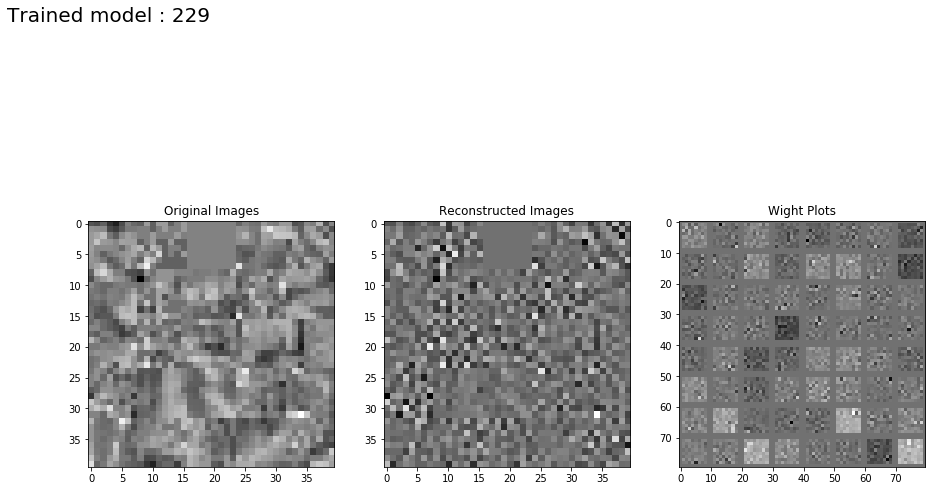

Step 1: Minibatch Loss: 0.023246 Error: 0.015251 Sparse: 0.007995
Step 100: Minibatch Loss: 100.897346 Error: 100.183189 Sparse: 0.714159
Step 200: Minibatch Loss: 23.109089 Error: 22.629419 Sparse: 0.479670
Step 300: Minibatch Loss: 9.832031 Error: 9.445831 Sparse: 0.386200
Step 400: Minibatch Loss: 4.730513 Error: 4.411174 Sparse: 0.319339
Step 500: Minibatch Loss: 2.916030 Error: 2.632186 Sparse: 0.283845
Step 600: Minibatch Loss: 1.910219 Error: 1.655171 Sparse: 0.255048
Step 700: Minibatch Loss: 1.293590 Error: 1.063177 Sparse: 0.230414
Step 800: Minibatch Loss: 0.933972 Error: 0.724563 Sparse: 0.209409
Step 900: Minibatch Loss: 0.683579 Error: 0.491609 Sparse: 0.191971
Step 1000: Minibatch Loss: 0.542431 Error: 0.363433 Sparse: 0.178998


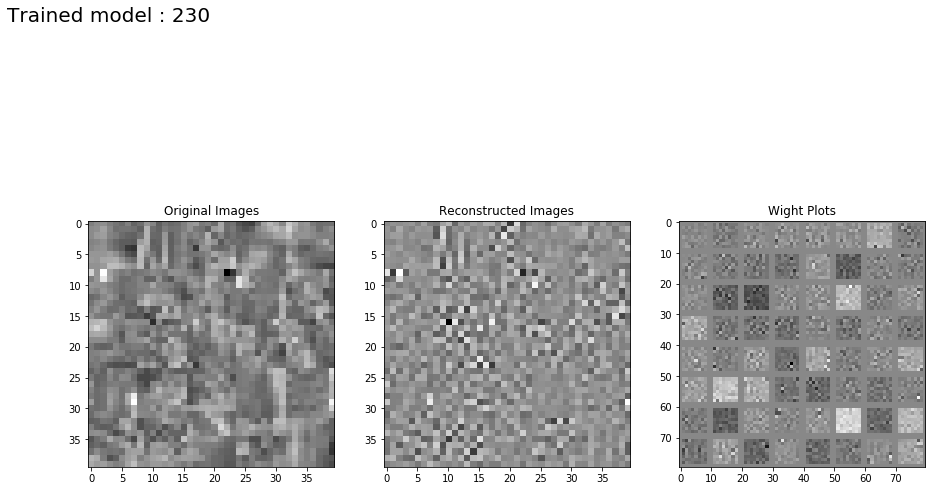

Step 1: Minibatch Loss: 0.015227 Error: 0.015227 Sparse: 0.007845
Step 100: Minibatch Loss: 70.751160 Error: 70.751091 Sparse: 0.662218
Step 200: Minibatch Loss: 16.036497 Error: 16.036453 Sparse: 0.441341
Step 300: Minibatch Loss: 6.468472 Error: 6.468437 Sparse: 0.353941
Step 400: Minibatch Loss: 3.230757 Error: 3.230726 Sparse: 0.300348
Step 500: Minibatch Loss: 1.909124 Error: 1.909098 Sparse: 0.267453
Step 600: Minibatch Loss: 1.189562 Error: 1.189538 Sparse: 0.241555
Step 700: Minibatch Loss: 0.724042 Error: 0.724020 Sparse: 0.215459
Step 800: Minibatch Loss: 0.534951 Error: 0.534930 Sparse: 0.203144
Step 900: Minibatch Loss: 0.370549 Error: 0.370530 Sparse: 0.188340
Step 1000: Minibatch Loss: 0.274181 Error: 0.274163 Sparse: 0.178625
Step 1100: Minibatch Loss: 0.209026 Error: 0.209009 Sparse: 0.170459
Step 1200: Minibatch Loss: 0.155548 Error: 0.155532 Sparse: 0.162148
Step 1300: Minibatch Loss: 0.117679 Error: 0.117663 Sparse: 0.154653
Step 1400: Minibatch Loss: 0.090119 Error:

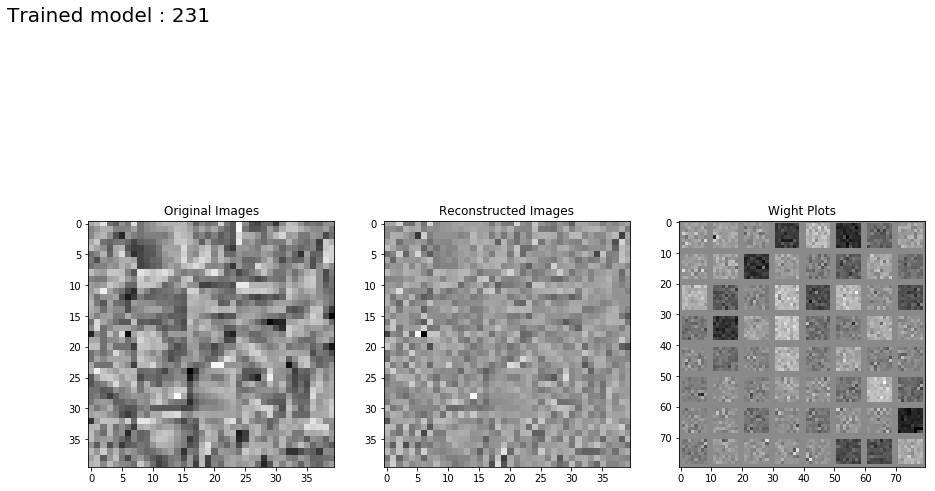

Step 1: Minibatch Loss: 0.015288 Error: 0.015281 Sparse: 0.007723
Step 100: Minibatch Loss: 61.553699 Error: 61.553082 Sparse: 0.617534
Step 200: Minibatch Loss: 14.167060 Error: 14.166644 Sparse: 0.416238
Step 300: Minibatch Loss: 5.884646 Error: 5.884305 Sparse: 0.341163
Step 400: Minibatch Loss: 3.043824 Error: 3.043531 Sparse: 0.293793
Step 500: Minibatch Loss: 1.726375 Error: 1.726116 Sparse: 0.259502
Step 600: Minibatch Loss: 1.077004 Error: 1.076771 Sparse: 0.232495
Step 700: Minibatch Loss: 0.691954 Error: 0.691742 Sparse: 0.211572
Step 800: Minibatch Loss: 0.481697 Error: 0.481503 Sparse: 0.194170
Step 900: Minibatch Loss: 0.345803 Error: 0.345619 Sparse: 0.183701
Step 1000: Minibatch Loss: 0.265670 Error: 0.265495 Sparse: 0.175454
Step 1100: Minibatch Loss: 0.195384 Error: 0.195219 Sparse: 0.164736
Step 1200: Minibatch Loss: 0.143486 Error: 0.143328 Sparse: 0.157534
Step 1300: Minibatch Loss: 0.112757 Error: 0.112607 Sparse: 0.150809
Step 1400: Minibatch Loss: 0.091722 Error:

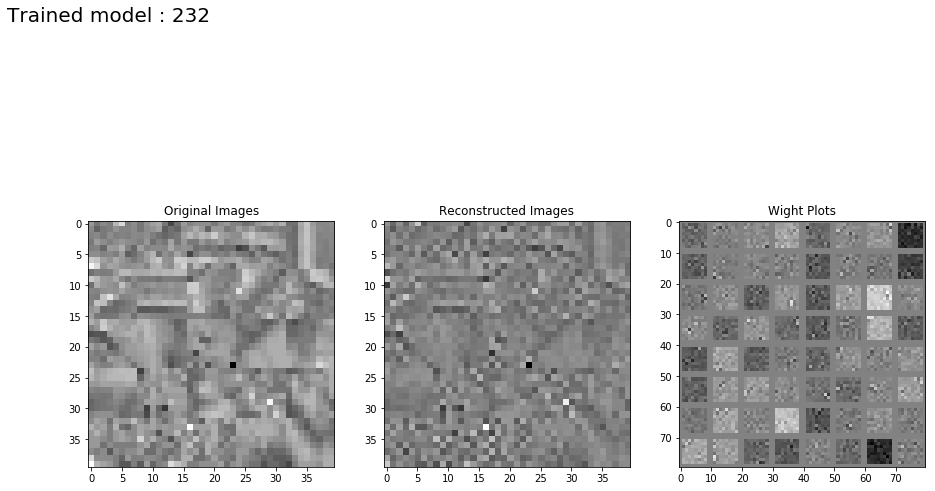

Step 1: Minibatch Loss: 0.015256 Error: 0.015173 Sparse: 0.008300
Step 100: Minibatch Loss: 49.553146 Error: 49.547234 Sparse: 0.591219
Step 200: Minibatch Loss: 11.259144 Error: 11.255164 Sparse: 0.397938
Step 300: Minibatch Loss: 4.822819 Error: 4.819555 Sparse: 0.326324
Step 400: Minibatch Loss: 2.392514 Error: 2.389751 Sparse: 0.276277
Step 500: Minibatch Loss: 1.451468 Error: 1.448992 Sparse: 0.247582
Step 600: Minibatch Loss: 0.912687 Error: 0.910443 Sparse: 0.224368
Step 700: Minibatch Loss: 0.625696 Error: 0.623622 Sparse: 0.207341
Step 800: Minibatch Loss: 0.420079 Error: 0.418162 Sparse: 0.191630
Step 900: Minibatch Loss: 0.296860 Error: 0.295072 Sparse: 0.178857
Step 1000: Minibatch Loss: 0.225472 Error: 0.223773 Sparse: 0.169941
Step 1100: Minibatch Loss: 0.177416 Error: 0.175774 Sparse: 0.164172
Step 1200: Minibatch Loss: 0.127556 Error: 0.126014 Sparse: 0.154212
Step 1300: Minibatch Loss: 0.100845 Error: 0.099353 Sparse: 0.149210
Step 1400: Minibatch Loss: 0.077521 Error:

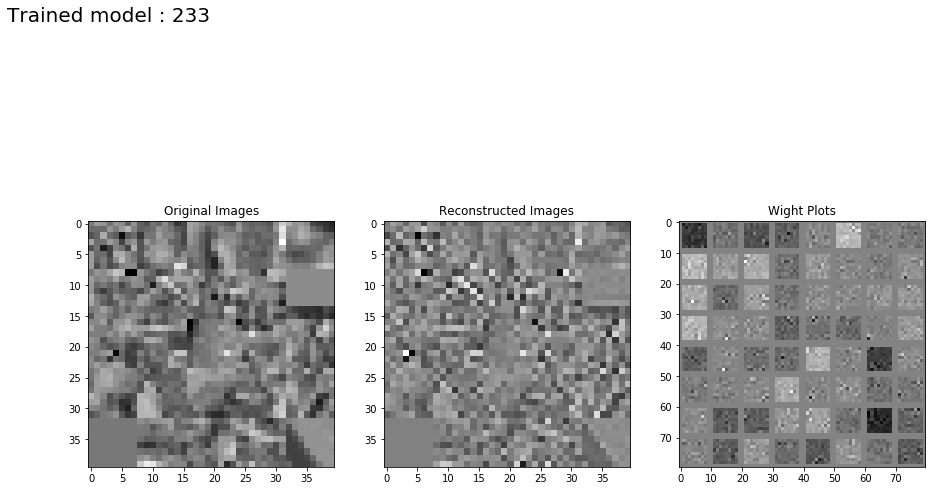

Step 1: Minibatch Loss: 0.016110 Error: 0.015321 Sparse: 0.007888
Step 100: Minibatch Loss: 76.675453 Error: 76.609512 Sparse: 0.659394
Step 200: Minibatch Loss: 17.154139 Error: 17.109953 Sparse: 0.441862
Step 300: Minibatch Loss: 7.144613 Error: 7.108420 Sparse: 0.361934
Step 400: Minibatch Loss: 3.606272 Error: 3.575409 Sparse: 0.308628
Step 500: Minibatch Loss: 2.087826 Error: 2.060560 Sparse: 0.272658
Step 600: Minibatch Loss: 1.286104 Error: 1.261872 Sparse: 0.242316
Step 700: Minibatch Loss: 0.850613 Error: 0.828309 Sparse: 0.223044
Step 800: Minibatch Loss: 0.579933 Error: 0.559547 Sparse: 0.203856
Step 900: Minibatch Loss: 0.420810 Error: 0.401820 Sparse: 0.189902
Step 1000: Minibatch Loss: 0.311853 Error: 0.293970 Sparse: 0.178838
Step 1100: Minibatch Loss: 0.240561 Error: 0.223416 Sparse: 0.171451
Step 1200: Minibatch Loss: 0.189750 Error: 0.173378 Sparse: 0.163726
Step 1300: Minibatch Loss: 0.142708 Error: 0.127294 Sparse: 0.154140
Step 1400: Minibatch Loss: 0.115745 Error:

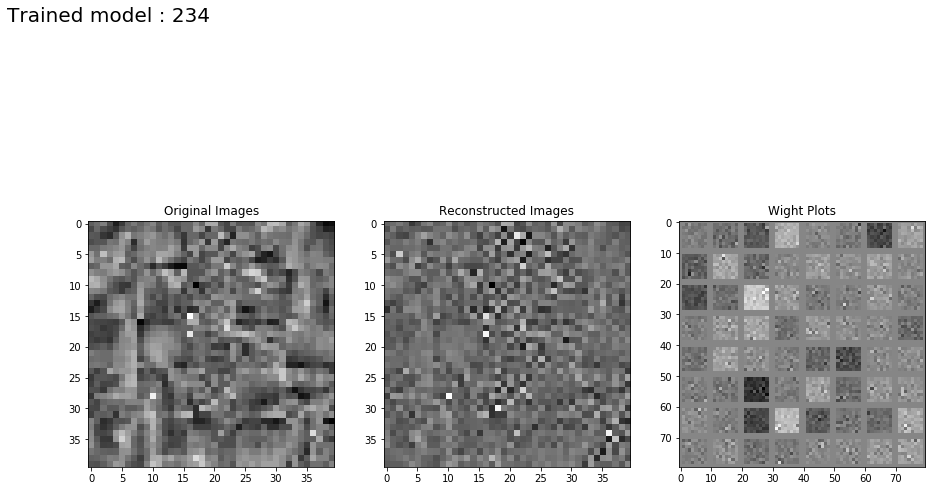

Step 1: Minibatch Loss: 0.023002 Error: 0.015115 Sparse: 0.007887
Step 100: Minibatch Loss: 78.184143 Error: 77.539886 Sparse: 0.644255
Step 200: Minibatch Loss: 18.286659 Error: 17.849922 Sparse: 0.436737
Step 300: Minibatch Loss: 8.144865 Error: 7.784527 Sparse: 0.360338
Step 400: Minibatch Loss: 4.442364 Error: 4.130207 Sparse: 0.312157
Step 500: Minibatch Loss: 2.522580 Error: 2.252375 Sparse: 0.270205
Step 600: Minibatch Loss: 1.630817 Error: 1.388803 Sparse: 0.242014
Step 700: Minibatch Loss: 1.138281 Error: 0.917911 Sparse: 0.220371
Step 800: Minibatch Loss: 0.847411 Error: 0.644917 Sparse: 0.202494
Step 900: Minibatch Loss: 0.635512 Error: 0.448879 Sparse: 0.186633
Step 1000: Minibatch Loss: 0.496856 Error: 0.324263 Sparse: 0.172593
Step 1100: Minibatch Loss: 0.411908 Error: 0.249333 Sparse: 0.162575
Step 1200: Minibatch Loss: 0.320056 Error: 0.172764 Sparse: 0.147292
Step 1300: Minibatch Loss: 0.284818 Error: 0.142991 Sparse: 0.141827
Step 1400: Minibatch Loss: 0.244965 Error:

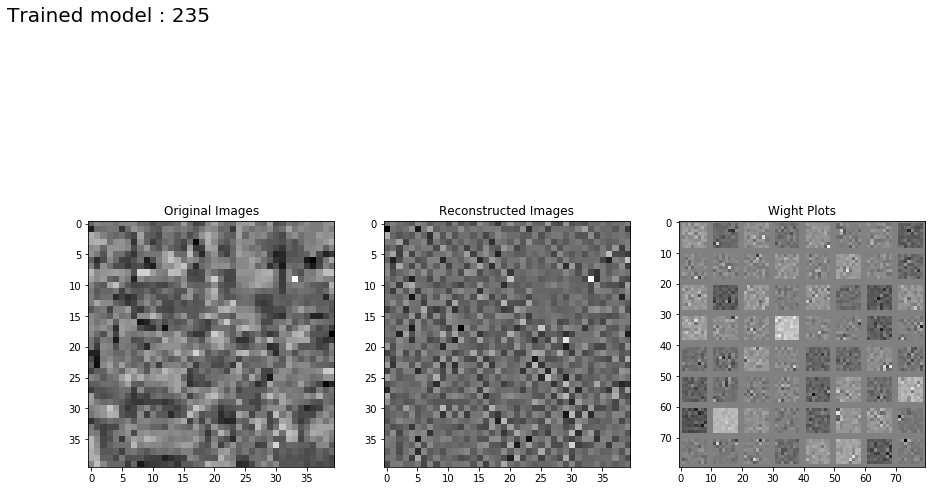

Step 1: Minibatch Loss: 0.015241 Error: 0.015240 Sparse: 0.007583
Step 100: Minibatch Loss: 69.640556 Error: 69.640488 Sparse: 0.654780
Step 200: Minibatch Loss: 15.689393 Error: 15.689349 Sparse: 0.435563
Step 300: Minibatch Loss: 6.037085 Error: 6.037050 Sparse: 0.349115
Step 400: Minibatch Loss: 3.034928 Error: 3.034898 Sparse: 0.296900
Step 500: Minibatch Loss: 1.724566 Error: 1.724540 Sparse: 0.261392
Step 600: Minibatch Loss: 1.022091 Error: 1.022068 Sparse: 0.232839
Step 700: Minibatch Loss: 0.668008 Error: 0.667987 Sparse: 0.213984
Step 800: Minibatch Loss: 0.436057 Error: 0.436038 Sparse: 0.194326
Step 900: Minibatch Loss: 0.298352 Error: 0.298334 Sparse: 0.182026
Step 1000: Minibatch Loss: 0.221942 Error: 0.221925 Sparse: 0.169731
Step 1100: Minibatch Loss: 0.164686 Error: 0.164670 Sparse: 0.162963
Step 1200: Minibatch Loss: 0.125483 Error: 0.125467 Sparse: 0.156737
Step 1300: Minibatch Loss: 0.096724 Error: 0.096709 Sparse: 0.149298
Step 1400: Minibatch Loss: 0.074799 Error:

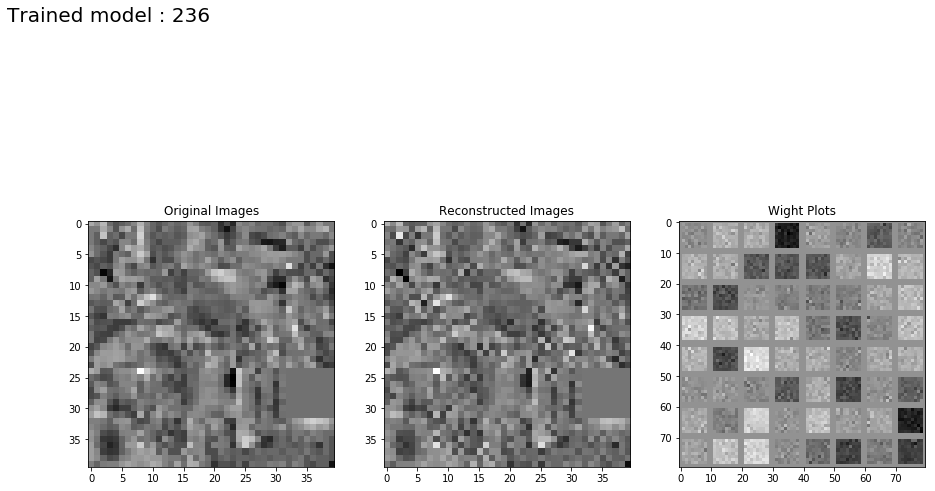

Step 1: Minibatch Loss: 0.015164 Error: 0.015156 Sparse: 0.008014
Step 100: Minibatch Loss: 50.964958 Error: 50.964363 Sparse: 0.594792
Step 200: Minibatch Loss: 11.498235 Error: 11.497831 Sparse: 0.403294
Step 300: Minibatch Loss: 4.635332 Error: 4.635006 Sparse: 0.325217
Step 400: Minibatch Loss: 2.424894 Error: 2.424612 Sparse: 0.282038
Step 500: Minibatch Loss: 1.357854 Error: 1.357608 Sparse: 0.246835
Step 600: Minibatch Loss: 0.865689 Error: 0.865465 Sparse: 0.223368
Step 700: Minibatch Loss: 0.545330 Error: 0.545127 Sparse: 0.202826
Step 800: Minibatch Loss: 0.380019 Error: 0.379831 Sparse: 0.188080
Step 900: Minibatch Loss: 0.272117 Error: 0.271938 Sparse: 0.178646
Step 1000: Minibatch Loss: 0.201555 Error: 0.201387 Sparse: 0.168454
Step 1100: Minibatch Loss: 0.155728 Error: 0.155566 Sparse: 0.162138
Step 1200: Minibatch Loss: 0.120931 Error: 0.120775 Sparse: 0.155342
Step 1300: Minibatch Loss: 0.091103 Error: 0.090954 Sparse: 0.148895
Step 1400: Minibatch Loss: 0.068868 Error:

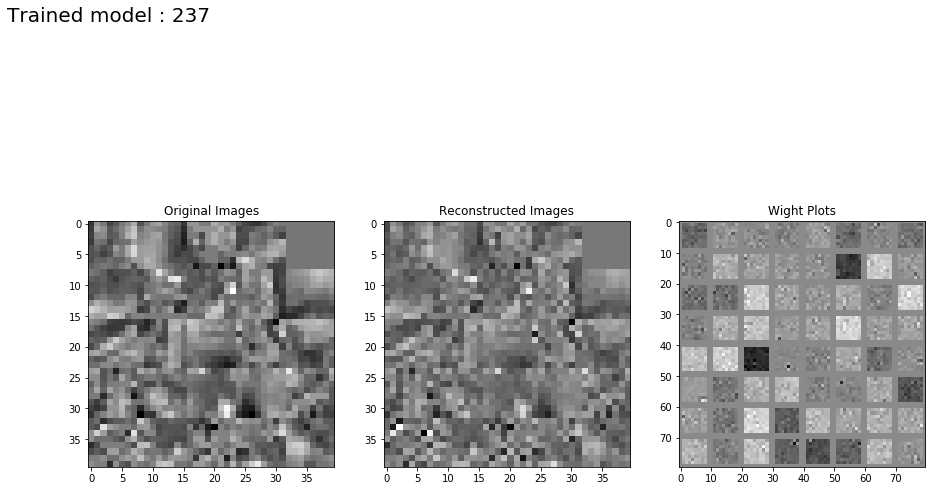

Step 1: Minibatch Loss: 0.015388 Error: 0.015310 Sparse: 0.007768
Step 100: Minibatch Loss: 46.923557 Error: 46.917618 Sparse: 0.593912
Step 200: Minibatch Loss: 10.968821 Error: 10.964847 Sparse: 0.397386
Step 300: Minibatch Loss: 4.596578 Error: 4.593309 Sparse: 0.326872
Step 400: Minibatch Loss: 2.318890 Error: 2.316109 Sparse: 0.278103
Step 500: Minibatch Loss: 1.328287 Error: 1.325831 Sparse: 0.245620
Step 600: Minibatch Loss: 0.798693 Error: 0.796507 Sparse: 0.218584
Step 700: Minibatch Loss: 0.543600 Error: 0.541568 Sparse: 0.203239
Step 800: Minibatch Loss: 0.378710 Error: 0.376817 Sparse: 0.189342
Step 900: Minibatch Loss: 0.257751 Error: 0.255998 Sparse: 0.175367
Step 1000: Minibatch Loss: 0.199299 Error: 0.197619 Sparse: 0.168076
Step 1100: Minibatch Loss: 0.144668 Error: 0.143084 Sparse: 0.158412
Step 1200: Minibatch Loss: 0.106784 Error: 0.105287 Sparse: 0.149735
Step 1300: Minibatch Loss: 0.082841 Error: 0.081401 Sparse: 0.143940
Step 1400: Minibatch Loss: 0.065524 Error:

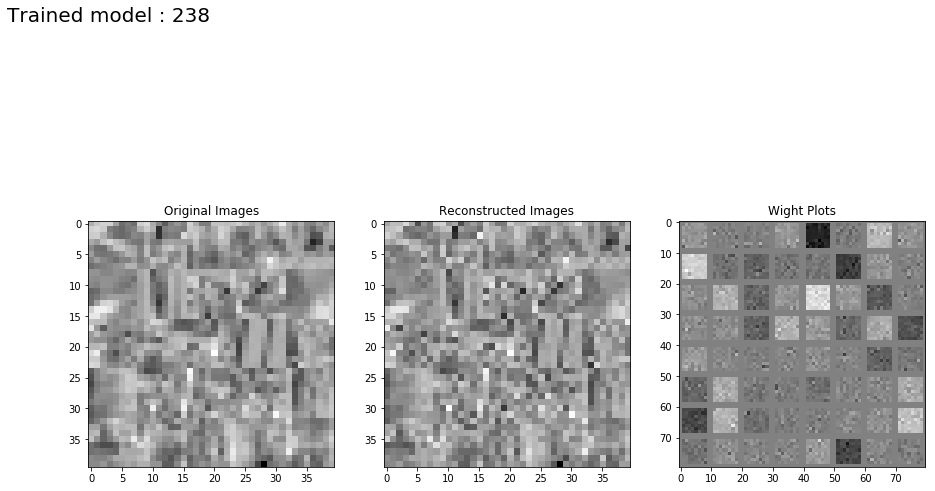

Step 1: Minibatch Loss: 0.015998 Error: 0.015213 Sparse: 0.007856
Step 100: Minibatch Loss: 60.845921 Error: 60.784050 Sparse: 0.618687
Step 200: Minibatch Loss: 13.746209 Error: 13.704508 Sparse: 0.417017
Step 300: Minibatch Loss: 5.725020 Error: 5.691196 Sparse: 0.338240
Step 400: Minibatch Loss: 2.996426 Error: 2.967071 Sparse: 0.293548
Step 500: Minibatch Loss: 1.762836 Error: 1.736931 Sparse: 0.259042
Step 600: Minibatch Loss: 1.056609 Error: 1.033544 Sparse: 0.230644
Step 700: Minibatch Loss: 0.702697 Error: 0.681408 Sparse: 0.212885
Step 800: Minibatch Loss: 0.497805 Error: 0.478072 Sparse: 0.197336
Step 900: Minibatch Loss: 0.350426 Error: 0.332191 Sparse: 0.182355
Step 1000: Minibatch Loss: 0.263938 Error: 0.246690 Sparse: 0.172481
Step 1100: Minibatch Loss: 0.194069 Error: 0.177726 Sparse: 0.163436
Step 1200: Minibatch Loss: 0.151077 Error: 0.135551 Sparse: 0.155266
Step 1300: Minibatch Loss: 0.118378 Error: 0.103440 Sparse: 0.149379
Step 1400: Minibatch Loss: 0.099645 Error:

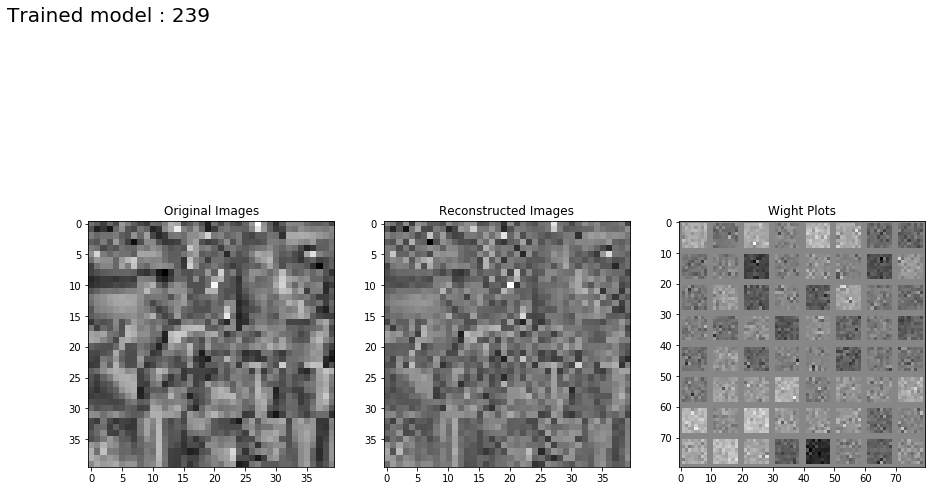

Step 1: Minibatch Loss: 0.023003 Error: 0.015198 Sparse: 0.007805
Step 100: Minibatch Loss: 71.740555 Error: 71.100815 Sparse: 0.639744
Step 200: Minibatch Loss: 17.471983 Error: 17.029263 Sparse: 0.442721
Step 300: Minibatch Loss: 7.508872 Error: 7.149287 Sparse: 0.359584
Step 400: Minibatch Loss: 4.029477 Error: 3.722892 Sparse: 0.306585
Step 500: Minibatch Loss: 2.430189 Error: 2.160381 Sparse: 0.269808
Step 600: Minibatch Loss: 1.637918 Error: 1.393646 Sparse: 0.244272
Step 700: Minibatch Loss: 1.059850 Error: 0.843332 Sparse: 0.216518
Step 800: Minibatch Loss: 0.830867 Error: 0.626747 Sparse: 0.204120
Step 900: Minibatch Loss: 0.622076 Error: 0.435773 Sparse: 0.186303
Step 1000: Minibatch Loss: 0.492297 Error: 0.319261 Sparse: 0.173035
Step 1100: Minibatch Loss: 0.388716 Error: 0.229036 Sparse: 0.159680
Step 1200: Minibatch Loss: 0.318483 Error: 0.169913 Sparse: 0.148569
Step 1300: Minibatch Loss: 0.272475 Error: 0.132157 Sparse: 0.140318
Step 1400: Minibatch Loss: 0.235402 Error:

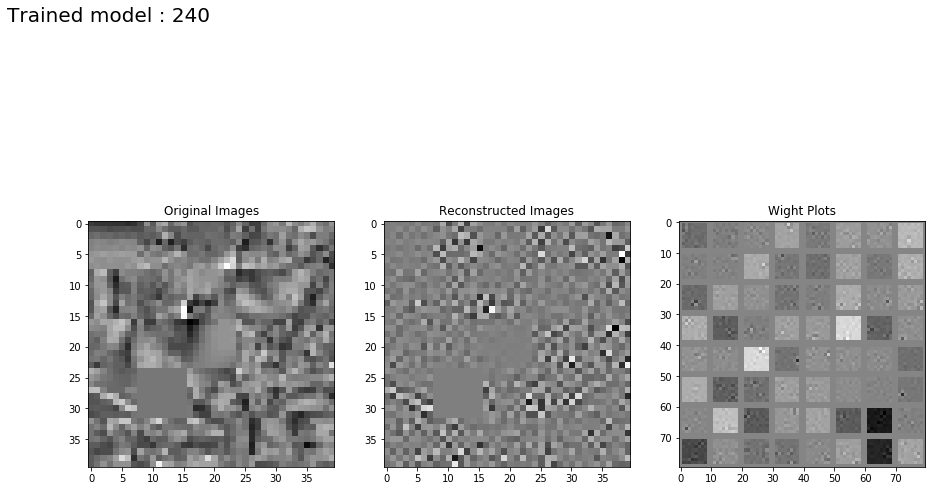

Step 1: Minibatch Loss: 0.015210 Error: 0.015209 Sparse: 0.007920
Step 100: Minibatch Loss: 57.404217 Error: 57.404156 Sparse: 0.612948
Step 200: Minibatch Loss: 12.819424 Error: 12.819383 Sparse: 0.413613
Step 300: Minibatch Loss: 5.292306 Error: 5.292273 Sparse: 0.335239
Step 400: Minibatch Loss: 2.619378 Error: 2.619350 Sparse: 0.286389
Step 500: Minibatch Loss: 1.469064 Error: 1.469039 Sparse: 0.250588
Step 600: Minibatch Loss: 0.873057 Error: 0.873034 Sparse: 0.224347
Step 700: Minibatch Loss: 0.600512 Error: 0.600491 Sparse: 0.207544
Step 800: Minibatch Loss: 0.399643 Error: 0.399624 Sparse: 0.191224
Step 900: Minibatch Loss: 0.289542 Error: 0.289524 Sparse: 0.180543
Step 1000: Minibatch Loss: 0.206299 Error: 0.206282 Sparse: 0.169998
Step 1100: Minibatch Loss: 0.157627 Error: 0.157611 Sparse: 0.161699
Step 1200: Minibatch Loss: 0.115580 Error: 0.115564 Sparse: 0.152775
Step 1300: Minibatch Loss: 0.089685 Error: 0.089670 Sparse: 0.147391
Step 1400: Minibatch Loss: 0.072370 Error:

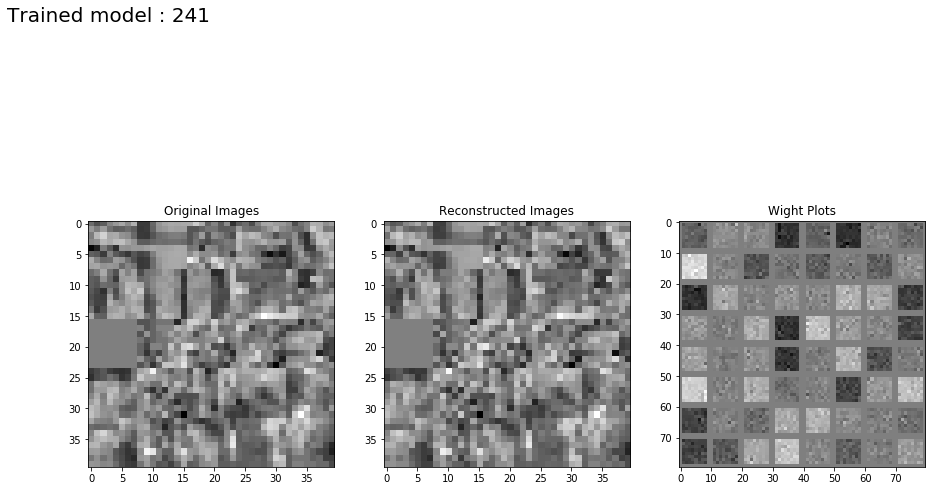

Step 1: Minibatch Loss: 0.015209 Error: 0.015202 Sparse: 0.007745
Step 100: Minibatch Loss: 45.727726 Error: 45.727142 Sparse: 0.583695
Step 200: Minibatch Loss: 10.103369 Error: 10.102978 Sparse: 0.391470
Step 300: Minibatch Loss: 4.165632 Error: 4.165316 Sparse: 0.316202
Step 400: Minibatch Loss: 2.102616 Error: 2.102345 Sparse: 0.270443
Step 500: Minibatch Loss: 1.236745 Error: 1.236503 Sparse: 0.242410
Step 600: Minibatch Loss: 0.781642 Error: 0.781423 Sparse: 0.218452
Step 700: Minibatch Loss: 0.521703 Error: 0.521501 Sparse: 0.202307
Step 800: Minibatch Loss: 0.347711 Error: 0.347527 Sparse: 0.184345
Step 900: Minibatch Loss: 0.246430 Error: 0.246256 Sparse: 0.173844
Step 1000: Minibatch Loss: 0.176115 Error: 0.175952 Sparse: 0.163784
Step 1100: Minibatch Loss: 0.137831 Error: 0.137674 Sparse: 0.157166
Step 1200: Minibatch Loss: 0.103659 Error: 0.103508 Sparse: 0.151179
Step 1300: Minibatch Loss: 0.079200 Error: 0.079055 Sparse: 0.145025
Step 1400: Minibatch Loss: 0.065697 Error:

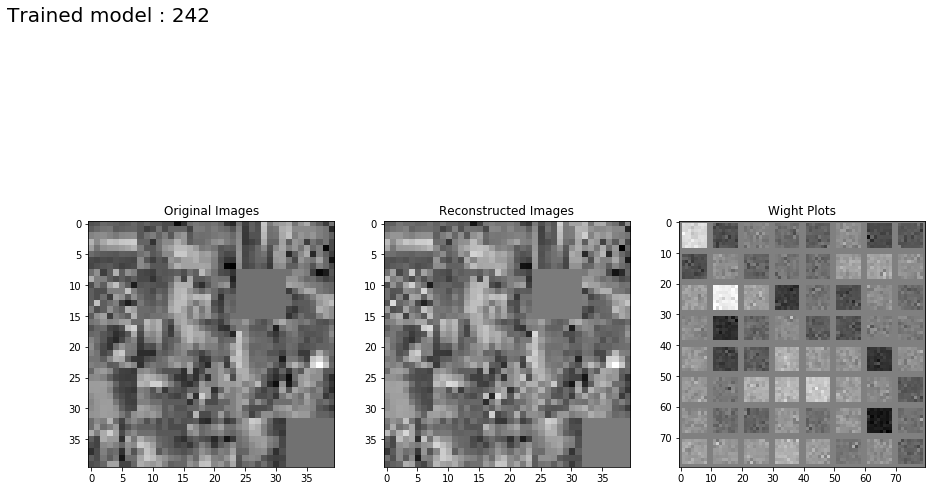

Step 1: Minibatch Loss: 0.015208 Error: 0.015128 Sparse: 0.007929
Step 100: Minibatch Loss: 49.946712 Error: 49.940742 Sparse: 0.596905
Step 200: Minibatch Loss: 11.663332 Error: 11.659293 Sparse: 0.403886
Step 300: Minibatch Loss: 4.872590 Error: 4.869316 Sparse: 0.327424
Step 400: Minibatch Loss: 2.441303 Error: 2.438523 Sparse: 0.278030
Step 500: Minibatch Loss: 1.379185 Error: 1.376723 Sparse: 0.246152
Step 600: Minibatch Loss: 0.826204 Error: 0.824005 Sparse: 0.219825
Step 700: Minibatch Loss: 0.562682 Error: 0.560657 Sparse: 0.202472
Step 800: Minibatch Loss: 0.374345 Error: 0.372482 Sparse: 0.186353
Step 900: Minibatch Loss: 0.275151 Error: 0.273404 Sparse: 0.174779
Step 1000: Minibatch Loss: 0.199412 Error: 0.197755 Sparse: 0.165738
Step 1100: Minibatch Loss: 0.151475 Error: 0.149885 Sparse: 0.158948
Step 1200: Minibatch Loss: 0.116923 Error: 0.115408 Sparse: 0.151533
Step 1300: Minibatch Loss: 0.084971 Error: 0.083526 Sparse: 0.144540
Step 1400: Minibatch Loss: 0.067683 Error:

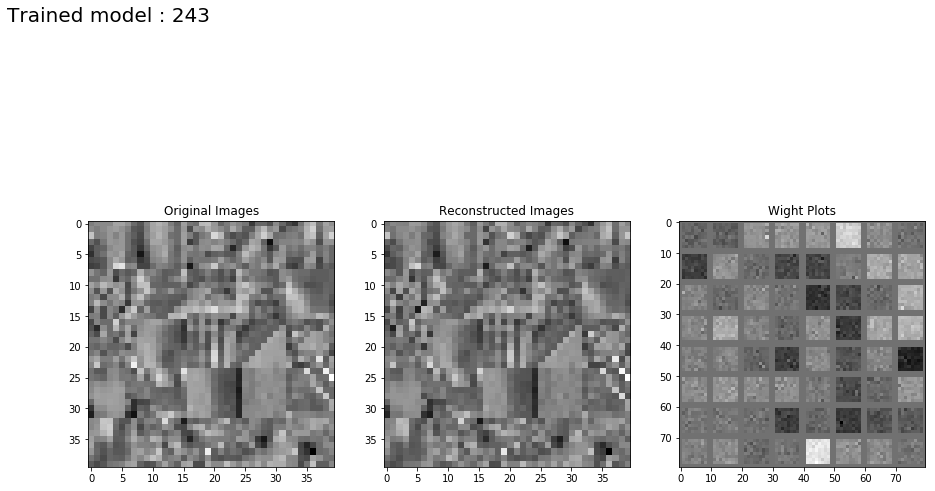

Step 1: Minibatch Loss: 0.015995 Error: 0.015213 Sparse: 0.007823
Step 100: Minibatch Loss: 91.702965 Error: 91.633156 Sparse: 0.698056
Step 200: Minibatch Loss: 20.690735 Error: 20.644459 Sparse: 0.462769
Step 300: Minibatch Loss: 8.046494 Error: 8.009413 Sparse: 0.370804
Step 400: Minibatch Loss: 4.197580 Error: 4.166036 Sparse: 0.315437
Step 500: Minibatch Loss: 2.319296 Error: 2.291666 Sparse: 0.276308
Step 600: Minibatch Loss: 1.502595 Error: 1.477463 Sparse: 0.251315
Step 700: Minibatch Loss: 0.950243 Error: 0.927677 Sparse: 0.225657
Step 800: Minibatch Loss: 0.668338 Error: 0.647447 Sparse: 0.208904
Step 900: Minibatch Loss: 0.484309 Error: 0.464752 Sparse: 0.195569
Step 1000: Minibatch Loss: 0.351525 Error: 0.333247 Sparse: 0.182779
Step 1100: Minibatch Loss: 0.270128 Error: 0.252859 Sparse: 0.172691
Step 1200: Minibatch Loss: 0.209014 Error: 0.192401 Sparse: 0.166128
Step 1300: Minibatch Loss: 0.161570 Error: 0.145871 Sparse: 0.156991
Step 1400: Minibatch Loss: 0.129854 Error:

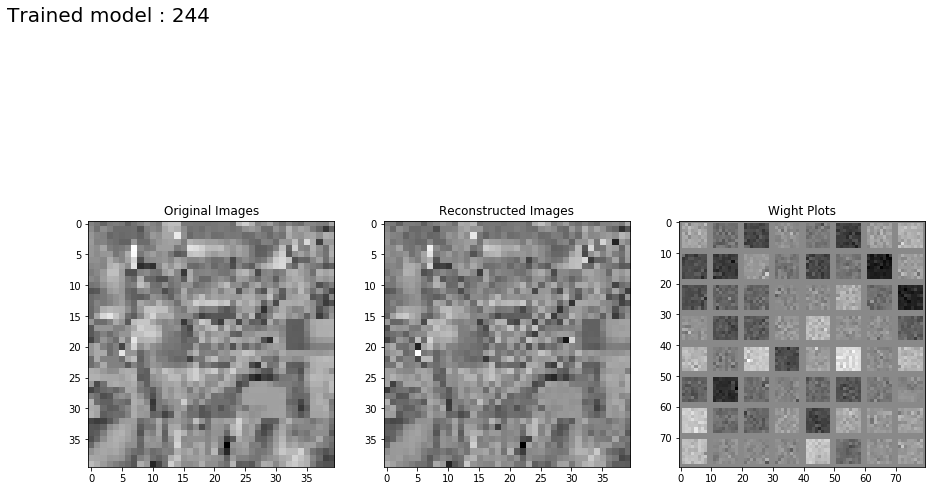

Step 1: Minibatch Loss: 0.023228 Error: 0.015303 Sparse: 0.007925
Step 100: Minibatch Loss: 83.375633 Error: 82.697624 Sparse: 0.678007
Step 200: Minibatch Loss: 18.959198 Error: 18.506376 Sparse: 0.452822
Step 300: Minibatch Loss: 7.420179 Error: 7.061934 Sparse: 0.358244
Step 400: Minibatch Loss: 3.924466 Error: 3.618920 Sparse: 0.305546
Step 500: Minibatch Loss: 2.196387 Error: 1.933696 Sparse: 0.262691
Step 600: Minibatch Loss: 1.437057 Error: 1.202846 Sparse: 0.234211
Step 700: Minibatch Loss: 1.006846 Error: 0.793363 Sparse: 0.213483
Step 800: Minibatch Loss: 0.751050 Error: 0.553797 Sparse: 0.197253
Step 900: Minibatch Loss: 0.559629 Error: 0.379939 Sparse: 0.179690
Step 1000: Minibatch Loss: 0.445267 Error: 0.277858 Sparse: 0.167409
Step 1100: Minibatch Loss: 0.353370 Error: 0.198700 Sparse: 0.154670
Step 1200: Minibatch Loss: 0.292401 Error: 0.148518 Sparse: 0.143883
Step 1300: Minibatch Loss: 0.248292 Error: 0.113940 Sparse: 0.134352
Step 1400: Minibatch Loss: 0.213752 Error:

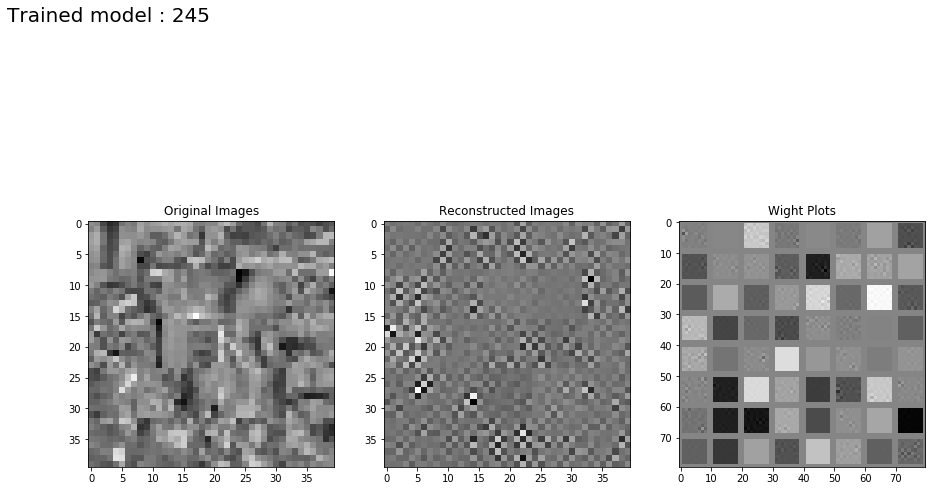

Step 1: Minibatch Loss: 0.015281 Error: 0.015280 Sparse: 0.007727
Step 100: Minibatch Loss: 54.273289 Error: 54.273228 Sparse: 0.604458
Step 200: Minibatch Loss: 11.794373 Error: 11.794333 Sparse: 0.402176
Step 300: Minibatch Loss: 4.854969 Error: 4.854935 Sparse: 0.331519
Step 400: Minibatch Loss: 2.429396 Error: 2.429368 Sparse: 0.280934
Step 500: Minibatch Loss: 1.319084 Error: 1.319060 Sparse: 0.244196
Step 600: Minibatch Loss: 0.876460 Error: 0.876438 Sparse: 0.225001
Step 700: Minibatch Loss: 0.528341 Error: 0.528320 Sparse: 0.201453
Step 800: Minibatch Loss: 0.386007 Error: 0.385988 Sparse: 0.190759
Step 900: Minibatch Loss: 0.266798 Error: 0.266780 Sparse: 0.177363
Step 1000: Minibatch Loss: 0.184983 Error: 0.184967 Sparse: 0.163912
Step 1100: Minibatch Loss: 0.142156 Error: 0.142140 Sparse: 0.158397
Step 1200: Minibatch Loss: 0.108095 Error: 0.108080 Sparse: 0.151723
Step 1300: Minibatch Loss: 0.083802 Error: 0.083788 Sparse: 0.146034
Step 1400: Minibatch Loss: 0.064332 Error:

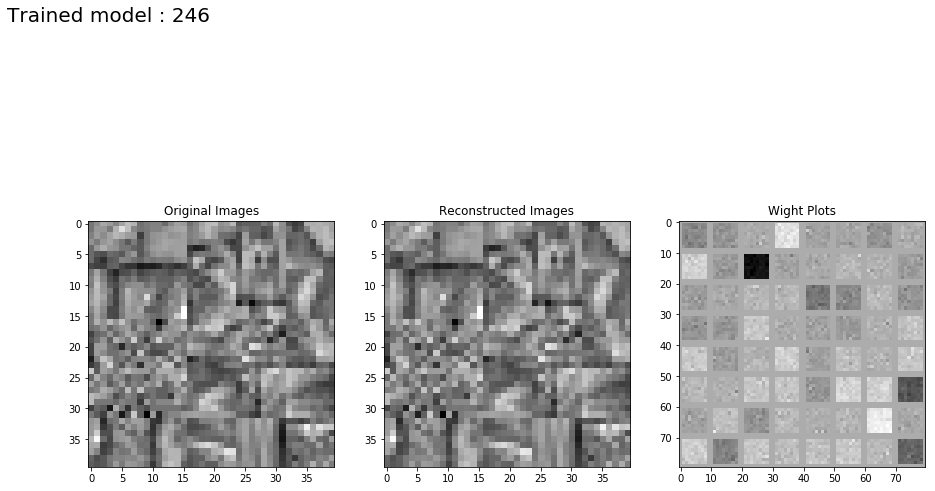

Step 1: Minibatch Loss: 0.015270 Error: 0.015262 Sparse: 0.007764
Step 100: Minibatch Loss: 39.536892 Error: 39.536335 Sparse: 0.556050
Step 200: Minibatch Loss: 8.606772 Error: 8.606400 Sparse: 0.371501
Step 300: Minibatch Loss: 3.608599 Error: 3.608295 Sparse: 0.304558
Step 400: Minibatch Loss: 1.819954 Error: 1.819693 Sparse: 0.260991
Step 500: Minibatch Loss: 1.051062 Error: 1.050830 Sparse: 0.231851
Step 600: Minibatch Loss: 0.675551 Error: 0.675340 Sparse: 0.211470
Step 700: Minibatch Loss: 0.433899 Error: 0.433705 Sparse: 0.194627
Step 800: Minibatch Loss: 0.301847 Error: 0.301667 Sparse: 0.180575
Step 900: Minibatch Loss: 0.219276 Error: 0.219105 Sparse: 0.170421
Step 1000: Minibatch Loss: 0.161388 Error: 0.161225 Sparse: 0.163034
Step 1100: Minibatch Loss: 0.118592 Error: 0.118438 Sparse: 0.154123
Step 1200: Minibatch Loss: 0.088778 Error: 0.088631 Sparse: 0.147019
Step 1300: Minibatch Loss: 0.067038 Error: 0.066897 Sparse: 0.141124
Step 1400: Minibatch Loss: 0.051477 Error: 0

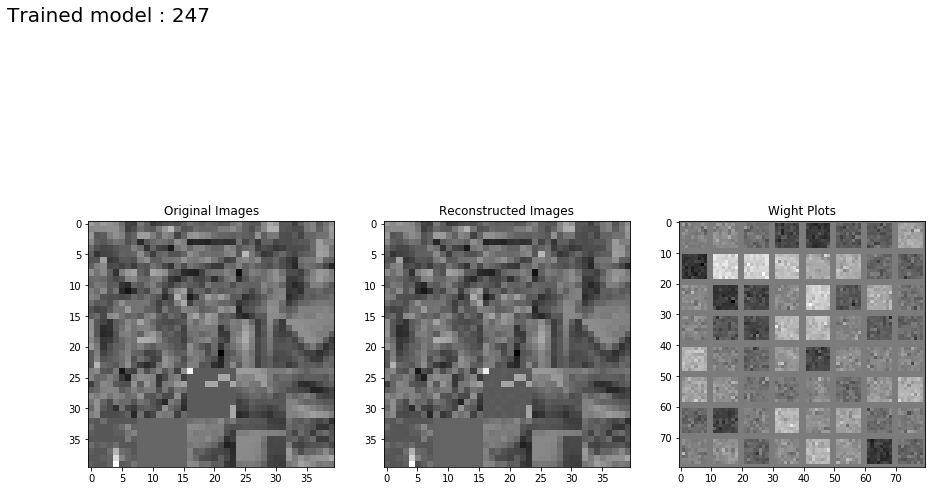

Step 1: Minibatch Loss: 0.015352 Error: 0.015273 Sparse: 0.007885
Step 100: Minibatch Loss: 67.298088 Error: 67.291611 Sparse: 0.647941
Step 200: Minibatch Loss: 14.421357 Error: 14.417059 Sparse: 0.429795
Step 300: Minibatch Loss: 5.848005 Error: 5.844551 Sparse: 0.345360
Step 400: Minibatch Loss: 3.045682 Error: 3.042703 Sparse: 0.297892
Step 500: Minibatch Loss: 1.741259 Error: 1.738634 Sparse: 0.262482
Step 600: Minibatch Loss: 1.015898 Error: 1.013579 Sparse: 0.231894
Step 700: Minibatch Loss: 0.676167 Error: 0.674038 Sparse: 0.212852
Step 800: Minibatch Loss: 0.470927 Error: 0.468944 Sparse: 0.198322
Step 900: Minibatch Loss: 0.329114 Error: 0.327293 Sparse: 0.182074
Step 1000: Minibatch Loss: 0.251665 Error: 0.249905 Sparse: 0.175925
Step 1100: Minibatch Loss: 0.184382 Error: 0.182726 Sparse: 0.165663
Step 1200: Minibatch Loss: 0.136139 Error: 0.134565 Sparse: 0.157410
Step 1300: Minibatch Loss: 0.103039 Error: 0.101545 Sparse: 0.149382
Step 1400: Minibatch Loss: 0.086736 Error:

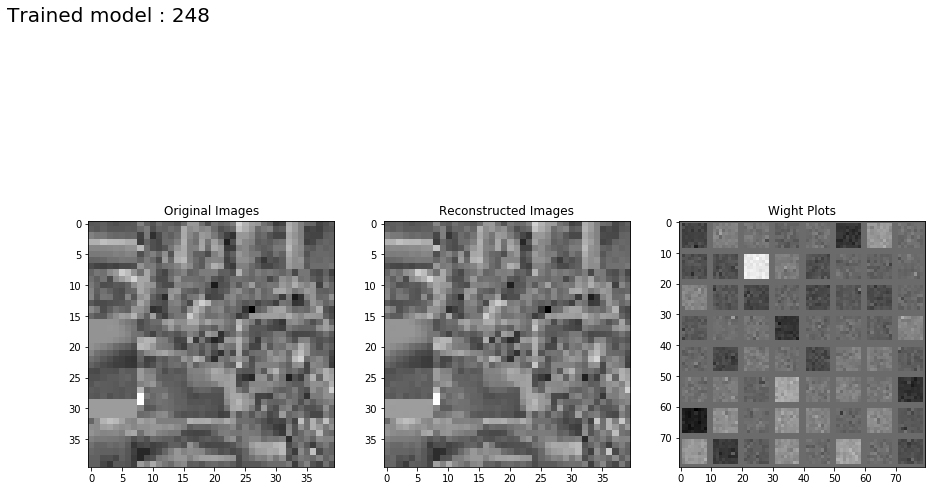

Step 1: Minibatch Loss: 0.015945 Error: 0.015135 Sparse: 0.008098
Step 100: Minibatch Loss: 88.764595 Error: 88.696342 Sparse: 0.682558
Step 200: Minibatch Loss: 20.086842 Error: 20.040977 Sparse: 0.458640
Step 300: Minibatch Loss: 8.154024 Error: 8.117057 Sparse: 0.369670
Step 400: Minibatch Loss: 4.117768 Error: 4.086331 Sparse: 0.314373
Step 500: Minibatch Loss: 2.370877 Error: 2.343245 Sparse: 0.276325
Step 600: Minibatch Loss: 1.477416 Error: 1.452471 Sparse: 0.249444
Step 700: Minibatch Loss: 0.962253 Error: 0.939891 Sparse: 0.223620
Step 800: Minibatch Loss: 0.674978 Error: 0.654051 Sparse: 0.209267
Step 900: Minibatch Loss: 0.470487 Error: 0.451215 Sparse: 0.192722
Step 1000: Minibatch Loss: 0.342643 Error: 0.324522 Sparse: 0.181209
Step 1100: Minibatch Loss: 0.267222 Error: 0.249876 Sparse: 0.173454
Step 1200: Minibatch Loss: 0.197907 Error: 0.181548 Sparse: 0.163597
Step 1300: Minibatch Loss: 0.155607 Error: 0.140137 Sparse: 0.154705
Step 1400: Minibatch Loss: 0.125043 Error:

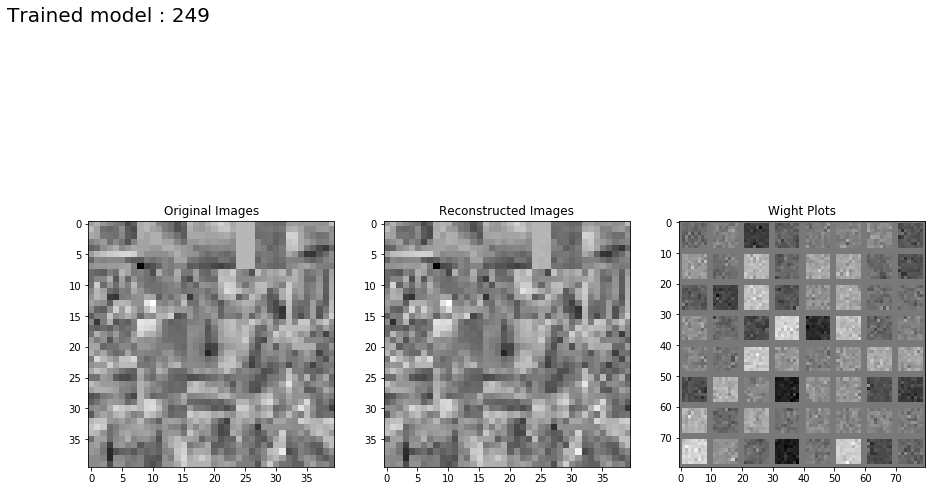

Step 1: Minibatch Loss: 0.023266 Error: 0.015318 Sparse: 0.007948
Step 100: Minibatch Loss: 64.857727 Error: 64.231316 Sparse: 0.626410
Step 200: Minibatch Loss: 14.356419 Error: 13.941789 Sparse: 0.414630
Step 300: Minibatch Loss: 6.272465 Error: 5.933714 Sparse: 0.338750
Step 400: Minibatch Loss: 3.446291 Error: 3.153022 Sparse: 0.293269
Step 500: Minibatch Loss: 2.068867 Error: 1.811668 Sparse: 0.257199
Step 600: Minibatch Loss: 1.354132 Error: 1.123832 Sparse: 0.230300
Step 700: Minibatch Loss: 0.940037 Error: 0.733110 Sparse: 0.206927
Step 800: Minibatch Loss: 0.702292 Error: 0.511749 Sparse: 0.190543
Step 900: Minibatch Loss: 0.522198 Error: 0.347900 Sparse: 0.174298
Step 1000: Minibatch Loss: 0.417345 Error: 0.255830 Sparse: 0.161515
Step 1100: Minibatch Loss: 0.345135 Error: 0.192736 Sparse: 0.152398
Step 1200: Minibatch Loss: 0.282770 Error: 0.142558 Sparse: 0.140212
Step 1300: Minibatch Loss: 0.242702 Error: 0.110371 Sparse: 0.132331
Step 1400: Minibatch Loss: 0.209872 Error:

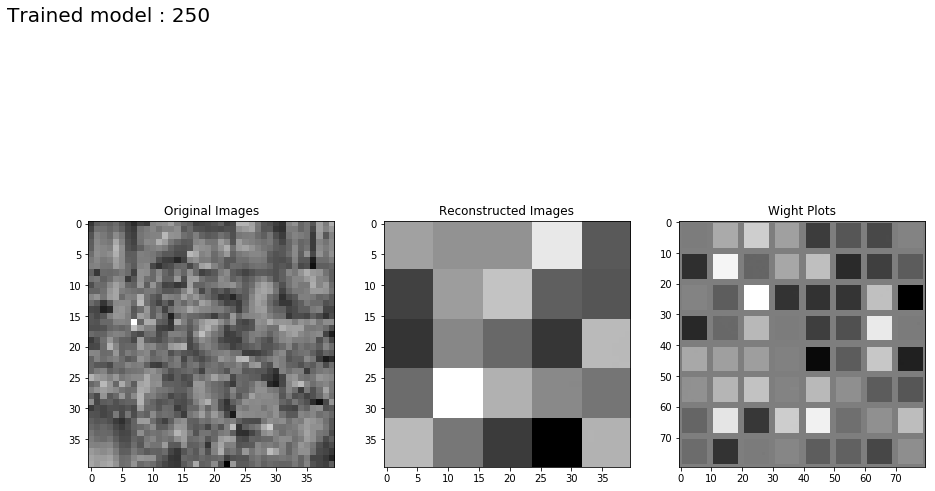

In [33]:
counter = 0
f = open("MetricEvaluation.txt","w+")
with PdfPages('ModelPlots.pdf') as pdf:
    for wscale in range(-3,-1,1):
        wscale = 1*(10**wscale)
        for learn_rate in range(-4,1,1):
            learn_rate = 5*(10**learn_rate)
            for nIterBat in range(1000,6000,1000):
                for beta in range(-4,1,1):
                    
                    beta = 1*(10**beta)
                    counter = counter + 1
                    out = sparseLinAutoEncoder(wscale, learn_rate, nIterBat, beta, counter,'TrainingData8')
                    #out = sparseLinAutoEncoder(wscale, learn_rate, 100, beta, counter,'TrainingData8')
                    # Original Images
                    fig = plt.figure(figsize=(15, 10))
                    fig.add_subplot(1, 3 , 1)
                    txt = 'Trained model : ' + str(counter)
                    plt.text(0.05,0.95,txt, transform=fig.transFigure, size=20)
                    plt.title('Original Images')
                    plt.imshow(out[3], origin="upper", cmap="gray")
                    fig.add_subplot(1,3,2)
                    plt.title('Reconstructed Images')
                    plt.imshow(out[4], origin="upper", cmap="gray")
                    fig.add_subplot(1,3,3)
                    plt.title('Wight Plots')
                    plt.imshow(out[5], cmap="gray")
                    pdf.savefig(fig)
                    plt.show()

                    f.write("Trained Model : %d \n" %counter)
                    f.write("_______________________________________________________________________\n")
                    f.write("wscale : \t \t %f \n" %wscale)
                    f.write("learn_rate : \t %f \n" %learn_rate)
                    f.write("batch size : \t %d \n" %nIterBat)
                    f.write("beta : \t \t \t %f \n" %beta)
                    f.write("********************************************************************\n")
                    f.write("loss : \t \t \t %f \n" %out[0])
                    f.write("msq : \t \t \t %f  \n" %out[1])
                    f.write("sparsity : \t \t %f \n" %out[2])
                    f.write("_______________________________________________________________________\n")

f.close()

In [32]:
f.close()
